# PBA Coursework

In [ ]:
#  **********************************************
#  PRACTICAL BUSINESS ANALYTICS (COM3018)
#  COURSEWORK IN MACHINE LEARNING & VISULISATIONS
#  
#  Group Name: Nantendo
#  Anastasia Anichenko
#  Manuel Bradicic
#  Felix Olesen
#  Matthew Samm
#  Michal Sitarz
#  Alex Williams
#
#  Computer Science
#  University of Surrey
#  GUILDFORD
#  Surrey GU2 7XH
#
# ************************************************

# ************************************************
# Required libraries
# ************************************************
# Library from CRAN     Version
# pacman                 0.5.1
# outliers               0.15
# corrplot               0.92
# MASS                   7.3.57
# formattable            0.2.1
# stats                  4.0.3
# PerformanceAnalytics   2.0.4
# plyr                   1.8.7
# dplyr                  1.0.10
# rvest                  1.0.3
# kohonen                3.0.11
# cluster                2.1.3
# ggplot2                3.3.6
# factoextra             1.0.7
# gridExtra              2.3
# igraph                 1.3.5
# inTrees                1.3
# randomForest           4.7.1.1  
# timeDate               4021.106
# timeSeries             4021.105
# keras                  2.9.0
# h2o                    3.38.0.1  
# GGally                 2.1.2              
# tensorflow             2.9.0          
# verification           1.42  
# dtw                    1.23.1  
# proxy                  0.4.27 
# CircStats              0.2.6 
# boot                   1.3.28
# fields                 14.1
# viridis                0.6.2  
# viridisLite            0.4.1 
# spam                   2.9.1   
# smotefamily            1.3.1
# xts                    0.12.1 
# zoo                    1.8.11 
# caret                  6.0.93    
# lattice                0.20.45                                                                
# ************************************************

## Global Variables

In [ ]:
# ************************************
# Global Environment Variables
# ************************************

# Releasing memory
gc()

# Setting the random seed to be equal each time
set.seed(123)

#  Clearing all of the objects
rm(list=ls())

VIDEOGAME_DATASET         <- "VideoGameSalesData.csv" # Dataset containing video game data
AGE_DATASET               <- "median-age.csv"         # Dataset containing age demographic for each country
GENDER_DATASET            <- "gender-ratio.csv"       # Dataset containing gender demographic for each country
COUNTRY2CONTINENT_DATASET <- "country2continent.csv"  # Dataset mapping countries to continents 
SCRAPED_DATASET           <- "scraped_game_data.csv"  # Dataset of scraped data 

OUTPUT_FIELD              <- "GlobalSales"            # Column to be predicted

MAX_LITERALS              <- 55                       # Max number of unique values in a column to consider one hot encoding

TIME_SLOTS                <- 10                       # Number of back-slots (days) to use as windowed NN input

BASICNN_EPOCHS    <- 100
DEEP_HIDDEN       <- c(30,10)             #Number of neurons in each layer
DEEP_STOPPING     <- 15                   #Number of times no improvement before stop
DEEP_TOLERANCE    <- 1e-4                 #Error threshold
DEEP_ACTIVATION   <- "Tanh"               #Non-linear activation function
DEEP_REPRODUCABLE <- FALSE                #Set to TRUE to test training is same for each run


DATASET_SPLIT             <- 0.7                      # The percentage split of training data vs test data
VALIDATION_SPLIT          <- 0.9                      # The percentage split of training data vs validation data
TRAINING_SPLIT            <- 0.6                      # The percentage split of training data vs test data (used for NNs and DTs)

# The regions must not overlap (as then they are removed from the dataset after being found)
REGIONS <- c('Northern America', 'Japan', 'Europe')                   # Derived from the games dataset
JOINED_NAMES <- c("year", "region", "ageMedian", "femaleRatioMedian") # The desired table columns 

### Scraper Variables

METACRITIC_URL <- "https://www.metacritic.com/game/"  # Website used for scraping

# Platform dictionary; mapping the names from the dataset to the names on the site
PLATFORMS <- c(
    'Wii'='wii',
    'WiiU'='wii-u',
    'DS'='ds',
    '3DS'='3ds',
    'X360'='xbox-360',
    'XOne'='xbox-one',
    'PS2'='playstation-2',
    'PS3'='playstation-3',
    'PS4'='playstation-4',
    'PC'='pc'
)

# Field Types
TYPE_NUMERIC <- "NUMERIC"
TYPE_SYMBOLIC <- "SYMBOLIC"
TYPE_DISCRETE <- "DISCRETE"
TYPE_ORDINAL <- "ORDINAL"

# DiscreteNumeric Cutoff
DN_CUTOFF <- 7

# Outlier Confidence
CONFIDENCE <- 0.95

# Path for a specific part of the website
XPATH_DICT <- c(
    'release_date' = "//li[@class='summary_detail release_data']//span[@class='data']",
    'critic_reviw' = "//span[@itemprop='ratingValue']",
    'user_review_positive' = "//div[@class='metascore_w user large game positive']",
    'user_review_mixed' = "//div[@class='metascore_w user large game mixed']",
    'user_review_negative' = "//div[@class='metascore_w user large game negative']"
)

MYLIBRARIES<-c("outliers",
               "corrplot",
               "MASS",
               "formattable",
               "stats",
               "caret",
               "PerformanceAnalytics",
               "smotefamily",
               "plyr",
               "dplyr",
               "rvest",               
               "kohonen",
               "cluster",
               "ggplot2",
               "factoextra",
               "gridExtra",
               "igraph",
               "verification",
               "tensorflow",
               "keras",
               "GGally",
               "randomForest",
               "h2o",
               "timeSeries",
               "inTrees")

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,622828,33.3,1352517,72.3,1352517,72.3
Vcells,1159775,8.9,8388608,64.0,1801082,13.8


## Functions from Labs

In [ ]:
# COM3018 PRACTICAL BUSINESS ANALYTICS
# MACHINE LEARNING & VISULISATIONS
# Prof. Nick F Ryman-Tubb, Dr Spencer Thomas 
# Dept. of Computer Science 
# University of Surrey
# GUILDFORD
# Surrey GU2 7XH
# 2022

# ************************************************
# PREPROCESSING FUNCTIONS
# ************************************************

# ************************************************
# NPREPROCESSING_discreteNumeric() :
#
# Test NUMERIC field if DISCRETE or ORDINAL
#
# INPUT: data frame      - dataset     - input data
#        vector strings  - field_types - Types per field, either {NUMERIC, SYMBOLIC}
#        int             - cutoff      - Number of empty bins needed to determine discrete (1-10)
#
# OUTPUT : vector strings - Updated with types per field {DISCRETE, ORDINAL}
# ************************************************
# Plots histogram for visulisation
# ************************************************
NPREPROCESSING_discreteNumeric<-function(dataset,field_types,cutoff){

  #For every field in our dataset
  for(field in 1:(ncol(dataset))){

    #Only for fields that are all numeric
    if (field_types[field]==TYPE_NUMERIC) {

      #191020NRT use R hist() function to create 10 bins
      histogramAnalysis<-hist(dataset[,field], breaks = 10, plot=FALSE)
      bins<-histogramAnalysis$counts/length(dataset[,field])*100  # Convert to %

      graphTitle<-"AUTO:"

      #If the number of bins with less than 1% of the values is greater than the cutoff
      #then the field is deterimed to be a discrete value

      if (length(which(bins<1.0))>cutoff)
        field_types[field]<-TYPE_DISCRETE
      else
        field_types[field]<-TYPE_ORDINAL

      #Type of field is the chart name
      hist(dataset[,field], breaks = 10, plot=TRUE,
           main=paste(graphTitle,field_types[field]),
           xlab=names(dataset[field]),ylab="Number of Records")

    } #endif numeric types
  } #endof for
  return(field_types)
}

# ************************************************
# NplotOutliers() :
# Scatter plot of field values and colours outliers in red
# INPUT: Vector - sorted    -  points to plot as literal values
#        Vector - outliers  - list of above points that are considered outliers
#        String - fieldName - name of field to plot
# OUTPUT : None
# ************************************************
NplotOutliers<-function(sorted,outliers,fieldName){

  plot(1:length(sorted),sorted,
       pch=1,
       xlab="Unique records",
       ylab=paste("Sorted values",fieldName),
       bty="n")

  if (length(outliers)>0)
    points(outliers,sorted[outliers],col="red",pch=19)
}

# ************************************************
# NPREPROCESSING_removePunctuation()
# INPUT: String - fieldName - name of field
# OUTPUT : String - name of field with punctuation removed
# ************************************************
NPREPROCESSING_removePunctuation<-function(fieldName){
    return(gsub("[[:punct:][:blank:]]+", "", fieldName))
}

# ************************************************
# NPREPROCESSING_outlier() :
#
# Determine if a value of a record is an outlier for each field
#
# INPUT:   data frame    - dataset   - complete data set
#          vector string - field_types  - types per field {ORDINAL, SYMBOLIC, DISCRETE}
#          double        - confidence - Confidence above which is determined an outlier [0,1]
#          string        - operation  = "ignore" = make no changes
#                                     = "mean"   = replace with field mean
#                                     = "remove" = delete the entire record
#
# OUTPUT : data frame - data set with outlier values: ignored, replaced or deleted
#
# 110520NRT - Fixed bug to either replace with MEAN or DELETE records
# 020620NRT - Fixed bug to process all identified outlier records
# ************************************************
# ChiSquared method
# Uses   library(outliers)
# https://cran.r-project.org/web/packages/outliers/outliers.pdfß
NPREPROCESSING_outlier<-function(dataset, field_types, confidence, operation="remove"){

  #For everyfield in our dataset
  for(field in 1:(ncol(dataset))){

    #Only for fields that are all numeric
    if (field_types[field]==TYPE_ORDINAL) {

      #020620NRT  Assign data frame for just this field with the values and TRUE/FALSE  based on confidence level
      justField<-data.frame(v=dataset[,field],outlier=outliers::scores(dataset[,field],type="chisq",prob=abs(confidence)))
      indexToOutliers<-which(justField$outlier)
      numberOfOutliers<-length(indexToOutliers)

      # 020620NRT This sorts the entire dataframe from low values to high
      # and then plot
      sortedData<-justField[order(justField$v),]

      plot(1:nrow(sortedData),sortedData$v,
           pch=1,
           xlab="Records",
           ylab=paste("Sorted values",colnames(dataset)[field]),
           bty="n")

      # If outlier(s) detected then show on the plot and process
      if (numberOfOutliers>0){

        # Highlight outliers as red plots
        indexToSortedOutliers<-which(sortedData$outlier)
        points(indexToSortedOutliers,sortedData$v[indexToSortedOutliers],col="red",pch=19)

        #If found records with outlier values
        switch(operation,

               "mean"= {
                       dataset[indexToOutliers,field]<-mean(dataset[,field])
                       print(paste("REPLACED WITH MEAN: Outlier field=",names(dataset)[field],"#Records=",numberOfOutliers))
                       },
               "remove"={
                          dataset<-dataset[-indexToOutliers,]
                          print(paste("DELETED RECORDS: Outlier field=",names(dataset)[field],"#Records=",numberOfOutliers))
                         },
              "ignore"=  {
                         print(paste("NO REPLACEMENT: Outlier field=",names(dataset)[field],"#Records=",numberOfOutliers))
                         }
               )
      } #endof if any outliers found
    } #endof if ordinal
  } #endof for() each field

  return(dataset)
}

# ************************************************
# NPREPROCESSING_categorical() :
# Transform SYMBOLIC or DISCRETE fields using 1-hot-encoding
# INPUT: data frame    - dataset      - symbolic fields
# OUTPUT : data frame    - transformed dataset
# ************************************************
NPREPROCESSING_categorical<-function(dataset) {
    catagorical <- data.frame()
    
    for (column_name in names(dataset)) {
        print(column_name)
        # Convert into factors. A level for each unique string
        ffield<-factor(dataset[,column_name])

        # Check if too many unique values to encode
        if (nlevels(ffield) > MAX_LITERALS) {
          stop(paste("too many literals in:",
                     column_name,
                     nlevels(ffield)))
        }

        # Check if just one value!
        if (nlevels(ffield) ==1) {
          stop(paste("field stuck at a single value:",
                     column_name))
        }

        # 1-hot encoding. A new column for each unique "level"
        xx<-data.frame(model.matrix(~ffield+0, data=ffield))

        names(xx)<-gsub("ffield",column_name,names(xx))

        # If 2 unique values, then can encode as a single "binary" column
        if (ncol(xx)==2){
          xx<-xx[,-2,drop=FALSE]
          names(xx)<-column_name  # Field name without the value appended
        }
        
        catagorical<-as.data.frame(append(catagorical,xx))
    }
  return (catagorical)
}

# ************************************************
# Nrescale() :
# These are the real values, that we scale between 0-1
# i.e. x-min / (max-min)
# INPUT:   vector - input - values to scale
# OUTPUT : vector - scaled values to [0.0,1.0]
# ************************************************
Nrescale<-function(input){
  minv<-min(input)
  maxv<-max(input)
  return((input-minv)/(maxv-minv))
}

# ************************************************
# InitialFieldTypes() :
# Sets the initial field types for each field in the dataset
# Possible Field Types: 
# SYMBOLIC, NUMERIC ORDINAL, NUMERIC DISCRETE
# INPUT: DataFrame - dataset - dataset to categorise into field types
# OUTPUT: Vector - field_type_list - list of field types corresponding to the dataset colnames
# ************************************************
InitialFieldTypes<-function(dataset){
  #Vector to store all associated field types
  field_types <- vector()

  # Loop through dataset and check for numeric fields
  for(field in 1:(ncol(dataset))){
    if (is.numeric(dataset[,field])) {
      # If numeric, assign NUMERIC to the same index in field_types
      field_types[field]<-"NUMERIC"
    }
    else {
      # Otherwise assign the field as symbolic
      field_types[field]<-"SYMBOLIC"
    }
  }

  # Storing all column names into two lists for visualisation purposes
  num_fields <- c()
  sym_fields <- c()

  # Loop through field types and append the associated field names to the new lists
  for(i in 1:(length(field_types))){
    if(field_types[i] == "SYMBOLIC"){
      sym_fields <- append(sym_fields, colnames(dataset)[i])
    } else if(field_types[i] == "NUMERIC"){
      num_fields <- append(num_fields, colnames(dataset)[i])
    }
  }

  # Print the lists storing the numeric and symbolic field names
  print(paste("Numeric Fields: ", length(num_fields)))
  print(num_fields)
  print(paste("Symbolic Fields: ", length(sym_fields)))
  print(sym_fields)
  return(field_types)
}

# ************************************************
# datasetRead() :
# Importing a CSV file and cleaning the inputs if required
# INPUT: 
#         string  -    csvFile    - Name of the CSV File
#         boolean - cleanColumns  - Flag indicating whether to clean the column names   
# 
# OUTPUT : data frame - CSV files as a dataframe
# ************************************************
datasetRead<-function(csvFile, cleanColumns = FALSE){
    dataset<-read.csv(csvFile, encoding="UTF-8", stringsAsFactors = FALSE)
    
    # Cleaning the dataset names if required
    if(cleanColumns){
        names(dataset)<-NPREPROCESSING_removePunctuation(names(dataset))
    }
        
    print(paste("Read", csvFile, ". Rows = ", nrow(dataset), "Features:"))
    print(names(dataset))
    
    return(dataset)
}

# encodeOrderedSymbols()
#
# Encodes symbols in a field to 1/n
# See Lecture 3, slide 48, Ordered Catagorical encoding
#
# INPUT:    Data Frame     - originalDataset - dataset to preprocess
#           String         - fieldName       - name of the field
#           String Vector  - orderedSymbols  - list of symbols in order to be encoded
#
# OUTPUT :  Data Frame - updated dataset
# 111119NRT - minor bug with length() compare
# ************************************************
NPREPROCESSING_encodeOrderedSymbols<-function(dataset, fieldName, orderedSymbols){
  field<-which(names(dataset)==fieldName)

  for (eachSymbol in 1:length(orderedSymbols)){
    records<-which(dataset[,field]==orderedSymbols[eachSymbol])
    if (length(records)>0){
      dataset[records,field]<-(eachSymbol-1)/(length(orderedSymbols)-1)
    }
  }
  dataset[,field]<-as.numeric(dataset[,field])
  return(dataset)
}

# ***************************************************
# Various metrics : Calculate various confusion matrix metrics
# INPUT: TP - int - True Positive records
#        FP - int - False Positive records
#        TN - int - True Negative records
#        FN - int - False Negative records
# OUTPUT : float - calculated results
# ***************************************************

NcalcAccuracy<-function(TP,FP,TN,FN){return(100.0*((TP+TN)/(TP+FP+FN+TN)))}
NcalcPgood<-function(TP,FP,TN,FN){return(100.0*(TP/(TP+FP)))}
NcalcPbad<-function(TP,FP,TN,FN){return(100.0*(TN/(FN+TN)))}
NcalcFPR<-function(TP,FP,TN,FN){return(100.0*(FP/(FP+TN)))}
NcalcTPR<-function(TP,FP,TN,FN){return(100.0*(TP/(TP+FN)))}
NcalcMCC<-function(TP,FP,TN,FN){return( ((TP*TN)-(FP*FN))/sqrt((TP+FP)*(TP+FN)*(TN+FP)*(TN+FN)))}

# ***************************************************
# NcalcConfusion() :
# Calculate a confusion matrix for 2-class classifier
# INPUT: vector - confusion - output from table()
# OUTPUT: A list with the following entries:
#        TP - int - True Positive records
#        FP - int - False Positive records
#        TN - int - True Negative records
#        FN - int - False Negative records
#        accuracy - float - accuracy metric
#        pgood - float - precision for "good" (values are 1) metric
#        pbad - float - precision for "bad" (values are 1) metric
#        FPR - float - FPR metric
#        TPR - float - FPR metric
# ***************************************************
NcalcConfusion<-function(confusion){

  TP<-confusion[2,2]
  FN<-confusion[1,2]
  FP<-confusion[2,1]
  TN<-confusion[1,1]

  retList<-list(  "TP"=TP,
                  "FN"=FN,
                  "TN"=TN,
                  "FP"=FP,
                  "accuracy"=NcalcAccuracy(TP,FP,TN,FN),
                  "pgood"=NcalcPgood(TP,FP,TN,FN),
                  "pbad"=NcalcPbad(TP,FP,TN,FN),
                  "FPR"=NcalcFPR(TP,FP,TN,FN),
                  "TPR"=NcalcTPR(TP,FP,TN,FN),
                  "mcc"=NcalcMCC(TP,FP,TN,FN)
  )
  return(retList)
}



# ************************************************
# Npredict()
# Predict class using trained Logistic classifier - single predictor
# INPUT:        data frame - dataset        - Input values
#               String     - predictorName  - predictor field
# OUTPUT :      vector    - predicted class {0,1}
# ************************************************                                 
Npredict <- function(dataset, outputName, predictorName, logisticModel){
    
    y <- Nrescale(dataset[,outputName])
    actualClass <- y>0.5
    
    print(logisticModel)
      
    predictorProbs <- as.vector(predict(logisticModel, data.frame(x=dataset[, predictorName]), type="response"))
    predictedClass <- predictorProbs>0.5
    
    confusion <- table(predictedClass, actualClass)
    
    return(confusion)
    
}


# ************************************************
# NscatterPlotLogisticRegression()
# Logistic classifier - single predictor
# INPUT:        data frame - datasetTrain   - Training dataset
#               String     - outputName     -  name of the field to predict
#               String     - predictorName  - predictor field
# OUTPUT :      object     - trained linear model object
# ************************************************
  
NscatterPlotLogisticRegression<-function(datasetTrain,
                                         outputName,
                                         predictorName,
                                         threshold){

  v<-datasetTrain[,outputName]
  minv<-min(v)
  maxv<-max(v)
  y<-(v-minv)/(maxv-minv)

  scaleThreshold<-(threshold-minv)/(maxv-minv)
  x<-datasetTrain[,predictorName]
  topredict<-data.frame(x)


  #These show the classification of either HIGH or LOW house prices
  NplotDecisions(paste("p(",outputName,")",sep=""), y, topredict, 0.5, "Logistic Classifier")
  abline(h=scaleThreshold,col="blue",lty=2)

  #Build a logistic regression classifier
  dframe<-data.frame(x,y)
  formular<-paste("y~x")
  logisticModel<-glm(formular,data=dframe,family=quasibinomial)

  #creates prediction for an entire x range
  topredict<-data.frame(seq(min(x),max(x),.01))
  names(topredict)<-"x"

  #Now generate predictions on  range and plot to visulise the fitted model
  y_predicted<-predict(logisticModel, topredict,type="response")
  scatter<-data.frame(topredict,y_predicted)
  lines(scatter[,"x",],scatter[,"y_predicted"],pch=4,col="blue",lwd=4 )
  lines(scatter[,"x",],scatter[,"y_predicted"]>scaleThreshold,pch=4,col="black",lty=2,lwd=2)

  return(logisticModel)
}


# ***************************************************
# NcalcConfusion() :
# Calculate a confusion matrix for 2-class classifier
# INPUT: vector - confusion - output from table()
# OUTPUT: A list with the following entries:
#        TP - int - True Positive records
#        FP - int - False Positive records
#        TN - int - True Negative records
#        FN - int - False Negative records
#        accuracy - float - accuracy metric
#        pgood - float - precision for "good" (values are 1) metric
#        pbad - float - precision for "bad" (values are 1) metric
#        FPR - float - FPR metric
#        TPR - float - FPR metric
# ***************************************************
NcalcConfusion<-function(confusion){

  TP<-confusion[2,2]
  FN<-confusion[1,2]
  FP<-confusion[2,1]
  TN<-confusion[1,1]

  retList<-list(  "TP"=TP,
                  "FN"=FN,
                  "TN"=TN,
                  "FP"=FP,
                  "accuracy"=NcalcAccuracy(TP,FP,TN,FN),
                  "pgood"=NcalcPgood(TP,FP,TN,FN),
                  "pbad"=NcalcPbad(TP,FP,TN,FN),
                  "FPR"=NcalcFPR(TP,FP,TN,FN),
                  "TPR"=NcalcTPR(TP,FP,TN,FN),
                  "mcc"=NcalcMCC(TP,FP,TN,FN)
  )
  return(retList)
}


# ************************************************
# NplotDecisions()
# Visulise the decisions made by the linear model
# INPUT:
#               String - outputName   - name of the field to predict
#               Vector - y_predicted  - values of the output field
#               Frame  -  topredict   - values of the predictor field
#               Double - threshold    - value of the threshold over which is "YES"
#               String - title        - title of the graph
# OUTPUT :      None
# ************************************************
NplotDecisions<-function(outputName,
                         y_predicted,
                         topredict,
                         threshold,
                         title){

  predictorName1<-names(topredict)
  y_decisions<-ifelse(y_predicted>threshold,1.0,0.0)

  #Create a frame with all values, then two frames with the CLASS 0/CLASS 1
  scatter<-data.frame(topredict,y_decisions)
  class1<-scatter[which(scatter$y_decisions==1),]
  class0<-scatter[which(scatter$y_decisions==0),]

  plot(class1,pch=4,ylab=outputName,xlab=predictorName1,main=paste(title,outputName),col="green",ylim=c(0, 1),sub="2 Classes. Threshold shown.",xlim=c(min(topredict),max(topredict)))
  points(class0,pch=6,ylab=outputName,xlab=predictorName1,main=paste(title,outputName),col="red",ylim=c(0, 1))

}


# ************************************************
# NscatterPlotLinearDecisions()
# Using simple linear classifier
# Plot a "decision" boundary based on threshold
# INPUT:        data frame - datasetTrain   - Training dataset
#               data frame - datasetTest    - Test dataset
#               String     - outputName     -  name of the field to predict
#               String     - predictorNam   - predictor field
#               double     - threshold      - cutoff value [0,1]
#
# OUTPUT :      None
# ************************************************
NscatterPlotLinearDecisions<-function(dataset,
                                      outputName,
                                      predictorName,
                                      threshold){

  #Creates a frame with a single column of the predictor input field
  topredict<-data.frame(dataset[,predictorName])
  names(topredict)<-predictorName

  #These are the real values, that we scale between 0-1
  # x-min / max-min
  v<-dataset[,outputName]
  minv<-min(v)
  maxv<-max(v)

  known_values<-(v-minv)/(maxv-minv)

  scaleThreshold<-(threshold-minv)/(maxv-minv)

  #Actual classes, split by the threshold
  NplotDecisions(outputName, known_values, topredict, scaleThreshold,"Linear Classifier")

  #Show the threshold, over this dotted line should classify into class 1
  abline(h=scaleThreshold,col="blue",lty=2)

  #Create small data frame with just the y and x values
  dframe<-data.frame(known_values,topredict)
  names(dframe)[1]=outputName

  #Build the linear model
  formular<-paste(outputName,"~",predictorName)
  linearModel<-lm(formular,data=dframe)

  #Show model line on graph - we need to rescale to the decision scale
  topredict<-data.frame(seq(min(dataset[,predictorName]),max(dataset[,predictorName]),by=.1))
  names(topredict)<-predictorName
  y_predicted<-predict(linearModel, topredict)

  #y_predicted_01<-rescale(y_predicted,range(0,1))

  #This shows the line that the model will use to seperate the classes
  lines(topredict[,predictorName],y_predicted,col="blue",lwd=4)
  lines(topredict[,predictorName],y_predicted>scaleThreshold,pch=4,col="black",lty=2,lwd=2)
}

# ************************************************
# N_createTimeSeriesDataSet()
# Detrend and Scale the stock prices
# Split into train as first period and test as following period datasets
#
# INPUT:    Data Frame - openStockPrice - stock prices, rownames are dates
#
# OUTPUT :  data frame - train dataset
#           data frame - test dataset
#           double - min value in realworld dataset
#           double - max value in realworld dataset
#
# ************************************************
N_createTimeSeriesDataSet<-function(openStockPrice){

  # Detrend the timeseries by each TIME_SLOT

  openStockPrice$means<-0
  openStockPrice<-Ndetrend(openStockPrice)

  #scale. Save the min/max AFTER the detrend and scale for the NN
  realmin<-min(openStockPrice[,1])
  realmax<-max(openStockPrice[,1])
  openStockPrice[,1]<-N_scale0_to_1(openStockPrice[,1])

  #Plot the detrend and scaled dataset
  plot(as.timeSeries(openStockPrice[,1,drop=FALSE]),
       at="chic",
       plot.type="s",
       cex.axis=0.75,
       type="l",
       cex.pch=0.5)

  title(paste("Detrend the timeseries over",TIME_SLOTS,"days"))

  # Use the entire dataset to create a sliding window of TIME_SLOT columns
  # The column names default to V1, V2...Vn
  # $means are the detrend means so can convert back to real-world values
  # The rownames are the date of the stock value in field "V10"

  res<-N_SlideWindow(timeSeriesData=openStockPrice,window=TIME_SLOTS)

  # Splits the dataset for 70% earlier period, 30% later period
  r1<-Nsplit(res)

  #Adds the stock min/max AFTER the detrend to the return list
  r1$min<-realmin
  r1$max<-realmax

  return(r1)
}

# ************************************************
# Ndetrend()
# Detrend each timeslot in the dataset
#
# INPUT:    Data Frame - stock prices, rownames are dates
#
# OUTPUT :  Data Frame - detrened stock prices
#
# ************************************************
Ndetrend<-function(openStockPrice){

  # ************************************************
  # NdetrendEntry()
  # SCOPE: Ndetrend()
  #
  # Detrend individual timeslot by dividing by its mean
  #
  # INPUT:    Data Frame - openStockPriceEntry - stock prices
  #
  # OUTPUT :  Data Frame - detrended and with $means added
  #
  # ************************************************
  NdetrendEntry<-function(openStockPriceEntry){

    openStockPriceEntry$means<-mean(openStockPriceEntry[,1])
    openStockPriceEntry[,1]<-openStockPriceEntry[,1]/openStockPriceEntry$means

    return(openStockPriceEntry)
  } #endof NdetrendEntry()

  # ************************************************
  # Start Ndetrend()

  for (eachSlot in 1:as.integer(nrow(openStockPrice)/TIME_SLOTS)){
    start<-((eachSlot-1)*TIME_SLOTS)+1
    end<-start+TIME_SLOTS-1
    openStockPrice[start:end,]<-NdetrendEntry(openStockPrice[start:end,])
  }

  # This does the last few entries as the dataset may not be multiple
  # of the TIME_SLOTS
  end<-nrow(openStockPrice)
  if ((end %% TIME_SLOTS)!=0){
    start<-(eachSlot*TIME_SLOTS)+1
    openStockPrice[start:end,]<-NdetrendEntry(openStockPrice[start:end,])
  }
  return(openStockPrice)
} # Ndetrend()

# ************************************************
# N_scale0_to_1()
# Scale values [0.0,1.0]
#
# INPUT:    vector double - value to scale
# OUTPUT :  vector double - scaled values [0.0,1.0]
#
# ************************************************
N_scale0_to_1 <- function(x){(x-min(x))/(max(x)-min(x))}

# ************************************************
# N_unscale0_to_1()
# Take values [0.0,1.0] and convert back to real values
#
#
# INPUT:    vector double - value to unscale
#           double - min real value
#           double - max real value
# OUTPUT :  vector double - unscaled values [min,max]
#
# ************************************************
N_unscale0_to_1 <- function(x,minv,maxv){
  return(((maxv-minv)*x)+minv)
  }

# ************************************************
# N_SlideWindow()
#
# Create a dataset with "window" columns that are
# shifted one place (i.e. one time period=day) to the left
#
# INPUT:     dataframe - timeSeriesData - row names are dates
#            int       - window         - size of time window
#
# OUTPUT :   dataframe - row names are dates
#                      - fields name "V1","V2"..."V"[window size]
#                      - $means mean of each time window
#
# 051119NRT Updated to fix issue with NA in data frame
#           $means now a column in the dataframe
#  #100320NRT fixed tp single mean value for row
# ************************************************
N_SlideWindow<-function(timeSeriesData, window){

  nRows<-nrow(timeSeriesData)+1-window

  if (nRows<=0)
    stop("Prof Nick Says: Too few date rows to create a sliding window")

  prices<-data.frame(rep(data.frame(rep(NA,nRows)),window),means=NA)
  names(prices)[1:window]<-paste("V",1:10,sep="")

  for (r in 1:nRows){
    prices[r,1:window]<-timeSeriesData[(r):(r+window-1),1]
    prices$means[r]<-timeSeriesData$means[r] #100320NRT single mean value for row
  }

  # Save the date of stock price for V10 (the value we are predicting)
  rownames(prices)<-rownames(timeSeriesData)[window:(nrow(timeSeriesData))]

  return(prices)
}

# ************************************************
# Nsplit()
# Split data set as:
# train/test values, train/test mean values
#
# INPUT: Frame - dataset
#
# OUTPUT : Frame - test dataset
#          Frame - train dataset
#          String - Date of test test dataset start
#
# 051119NRT Simplified as $mean is now field in dataset
# ************************************************
Nsplit<-function(datasetWithMenas){

  training_records<-round(nrow(datasetWithMenas)*(TRAINING_SPLIT))

  train <- 1:training_records
  test <- -train

  training_data <- datasetWithMenas[train,]
  testing_data = datasetWithMenas[test,]

  splitDate<-row.names(testing_data)[1]

  info<-data.frame(Dataset="Train Period",
                   start=row.names(training_data[1,]),
                   end=row.names(training_data[training_records,]),
                   records=training_records,
                   stringsAsFactors = FALSE)

  info<-rbind(info,data.frame(Dataset="Test Period",
                              start=splitDate,
                              end=row.names(testing_data[nrow(testing_data),]),
                              records=nrow(testing_data),
                              stringsAsFactors = FALSE))

  print(formattable::formattable(info))

  retList<-list(train=training_data,
                test=testing_data,
                splitDate=splitDate
                )
  return(retList)
}

# ************************************************
# N_DEEP_Initialise()
# Initialise the H2O server
#
# INPUT:
#         Bool       - reproducible       - TRUE if model must be reproducable each run
#
# OUTPUT : none
# ************************************************
N_DEEP_Initialise<-function(reproducible=TRUE){

  library(h2o)

  print("Initialise the H2O server")

  #Initialise the external h20 deep learning local server if needed
  #130517NRT - set nthreads to -1 to use maximum so fast, but set to 1 to get reproducable results
  #080819NRT - use reproducible parameter
  #111120NRT - remove "max_mem_size=" that prevents H2O from using more than that amount of memory

  if (reproducible==TRUE)
    nthreads<-1
  else
    nthreads<- -1

  h2o.init(nthreads = nthreads)

  h2o.removeAll() # 261019NRT clean slate - just in case the cluster was already running

  h2o.no_progress()
}

# ************************************************
# N_DEEP_Train()
#
# h2O NEURAL NETWORK : DEEP LEARNING CLASSIFIER TRAIN
#
# INPUT:  Frame      - train              - scaled [0.0,1.0], fields & rows
#         String     - fieldNameOutput    - Name of the field to classify
#         Int Vector - hidden             - Number of hidden layer neurons for each layer
#         int        - stopping_rounds    - Number of times no improvement before stop
#         double     - stopping_tolerance - Error threshold
#         String     - activation         - Name of activation function
#         Bool       - reproducible       - TRUE if model must be reproducable each run
#         Bool       - regression         - TRUE to predict values rather than classification
#
# OUTPUT: object     - trained neural network
# ************************************************
N_DEEP_Train<- function(train,
                        fieldNameOutput,
                        hidden,
                        stopping_rounds,
                        stopping_tolerance,
                        activation,
                        reproducible=TRUE,
                        regression=FALSE){

  #positionOutput<-which(names(test)==fieldNameOutput)

  #Creates the h2o training dataset
  if (regression==FALSE) {
    train[fieldNameOutput] <- lapply(train[fieldNameOutput] , factor) #Output class has to be a R "factor"
  }

  train_h2o <- as.h2o(train, destination_frame = "traindata")

  # Create validation dataset for early stopping
  splits <- h2o.splitFrame(train_h2o, 0.9, seed=1234)
  nntrain  <- h2o.assign(splits[[1]], "nntrain.hex") # 90%
  nnvalid  <- h2o.assign(splits[[2]], "nnvalid.hex") # 10%

  #This lists all the input field names ignoring the fieldNameOutput
  predictors <- setdiff(names(train_h2o), fieldNameOutput)

  # Deep training neural network
  # Updated 13/5/17 - set reproducible = TRUE so that the same random numbers are used to initalise
  # 281019NRT - added validation dataset for early stopping

  deep<-h2o::h2o.deeplearning(x=predictors,
                              y=fieldNameOutput,
                              training_frame = nntrain,
                              validation_frame=nnvalid,
                              epochs=BASICNN_EPOCHS,
                              hidden=hidden,
                              adaptive_rate=TRUE,
                              stopping_rounds=stopping_rounds,
                              stopping_tolerance=stopping_tolerance,
                              stopping_metric = "AUTO",
                              fast_mode=FALSE,
                              activation=activation,
                              seed=1234,
                              l1 = 1e-2,
                              l2 = 1e-2,
                              reproducible = TRUE)

  return(deep)
}

# ************************************************
# N_EVALUATE_DeepNeural() :
#
# Evaluate Deep Neural Network classifier
# Generates probabilities from the classifier
#
# INPUT: Data Frame    -  test             - scaled [0.0,1.0], fields & rows
#        String        -  fieldNameOutput  - field to predict
#        Object        - deep              - trained NN
#
# OUTPUT :
#         double vector - predicted values
# ************************************************
# Uses   library(h2o)
N_EVALUATE_DeepNeural<-function(test,
                                fieldNameOutput,
                                deep,regression=FALSE) {

  #Creates the h2o test dataset
  if (regression==FALSE)
    # Output class has to be a R "factor" for classification
    test[fieldNameOutput] <- lapply(test[fieldNameOutput] , factor)

  test_h2o <- as.h2o(test, destination_frame = "testdata")

  pred <- as.vector(h2o::h2o.predict(deep, test_h2o))

  return(pred)
}

# ************************************************
# N_visualiseTimeSeriesResults()
# Plot actual and predicted timeseries in two panels
#
#
# INPUT:    double vector - actual     - actual values
#           double vector - predicted    - predicted values
#           double vector - means        - detrend means or 1
#           string vector - dates        - dates of timeseries
#           double        - realmin      - scale minimum value
#           double        - realmax      - scale  maximum value
#           string        - title        - title on graph
#           strings       - yaxis_title - (first plot, second plot)
#           Bool          - measuresFLag -TRUE to show RMSE and R2
#
# OUTPUT :  data frame - rows are dates
#                        [actual, predicted]
#
# ************************************************
N_visualiseTimeSeriesResults<-function(actual,
                                       predicted,
                                       means,
                                       dates,
                                       realmin,
                                       realmax,
                                       title,
                                       yaxis_title,
                                       measuresFLag){

  #Scale this back into the real values and multiply back detrend offset
  actual<-N_unscale0_to_1(actual,realmin,realmax)*means
  predicted<-N_unscale0_to_1(predicted,realmin,realmax)*means

  #Create a dataframe with the actual values and then the predictions with dates
  exp_pred<-data.frame(actual=actual,predicted=predicted)
  colnames(exp_pred)<-c("actual","predicted")
  row.names(exp_pred)<-dates

  #Uses the timeSeries library
  #Plot nice timeseries stock price chart
  #Show actual and predicted in seperate panels
  plot(as.timeSeries(exp_pred), at="chic", plot.type="m", cex.axis=0.75, type=c("l", "l"),ylab=yaxis_title)
  title(main = title)

  #Show test dataset with actual as black line and predicted overlaid as red points
  type<-ifelse(measuresFLag==TRUE,c("l", "p"),c("l", "l"))
  plot(as.timeSeries(exp_pred), at="chic", plot.type="s",
       cex.axis=0.75, type=type,cex.pch=0.5)
  legend("bottomleft", yaxis_title, col=1:ncol(exp_pred), lty=1, cex=.8)

  if (measuresFLag==TRUE){

    #Calculate measures
    RMSE<-Nrmse(exp_pred$actual,exp_pred$predicted)
    r2<-Nr2_timeSeries(exp_pred$actual,exp_pred$predicted)
    MAE<-Nmae(exp_pred$actual,exp_pred$predicted)

    title(main = paste(title,"- RMSE",round(RMSE,digits=2),
                       "MAE",round(MAE,digits=2),
                       "R2",round(r2,digits=4)))
  } else {
    title(main = title)
  }

  return(exp_pred)
}

# ************************************************
# Nrmse() : Calculate the RMSE statistic
#
# INPUT: actual_y vector of real numbers indicating the known class
#        y_predicted vector of real numbers indicating the predicted class
#
# OUTPUT : double RMSE
# ************************************************
Nrmse<-function(actual_y,y_predicted){

  return(sqrt(mean((actual_y-y_predicted)^2)))
}

# ************************************************
# Nmae: Calculate the MAE statistic
#
# INPUT: actual_y vector of real numbers indicating the known class
#        y_predicted vector of real numbers indicating the predicted class
#
# OUTPUT : double - MAE
# ************************************************
Nmae<-function(actual_y,y_predicted){

  return((mean(abs(actual_y-y_predicted))))
}

## Functions developed by team

In [ ]:
# ************************************************
# DATA CLEANING AND PRE PROCESSING
# ************************************************

# ************************************************
# scrapeWeb() :
# Scraping the data for the games and saving it in a csv file
# INPUT: 
#         dataframe  -    games     - Table of games
#         string     - csvFileName  - Name of the CSV File  
# 
# OUTPUT : /
# ************************************************
scrapeWeb<-function(game_web, cssElement){
    
    el <- game_web %>%
                html_nodes(xpath = cssElement) %>%
                html_text() 
    return(el)
}

# ************************************************
# scrapeGames() :
# Scraping the data for the games and saving it in a csv file
# INPUT: 
#         dataframe  -    games     - Table of games
#         string     - csvFileName  - Name of the CSV File  
# 
# OUTPUT : /
# ************************************************
scrapeGames<-function(games, csvFileName){
     #Initial values
    scraped_game_data <- data.frame()
    counter<-0
    total_count<-0
    
    for (row in 1:100){ #nrow(games)
        start_time_per_game <- Sys.time()
        
        counter<-counter + 1
        # Getting the name of the current game
        name <- games[row, ]$Name
        name_cp <- name
        # Transforming all the spaces in the name to dashes; to make it a link 
        name <- chartr(" ", "-", name)
        
        # Removing all the other characters, other than the dash; such as periods or commas
        # Also changing the upper to lower cases
        name <- gsub("[^-a-zA-Z0-9[:space:]]+", "", tolower(name), perl = TRUE)
        
        platform <- games[row, ]$Platform
        platform_cp <- platform
        platform <- PLATFORMS[platform]
        
        # If URL is valid, then
        if(!is.na(platform)){
            # Combining the platform and the name, url looks like this -> /{platform}/{game_name}
            platform_name<- paste(platform, name, sep="/")
            
            # Fetching the URL and if the call fails it will return NA else it will return the HTML
            game_web<-tryCatch(
              read_html(paste(METACRITIC_URL, platform_name, sep="")), 
              error = function(e){NA}
            )
            
            # Scraping the values from the web page
            if(!is.na(game_web)){
                temp_vector <- c()
                
                #Scraping defined xpaths
                for(element in XPATH_DICT){
                    scraped_value = scrapeWeb(game_web, element)
                    
                    if(!is.na(scraped_value[1])){
                        temp_vector <- c(temp_vector, scraped_value[1])

                    }

                }
                # Extracting the year from the string
                year_only <- strsplit(temp_vector[1], ", ")[[1]]
                
                # Saving the values into the dataframe
                tmp_game <- data.frame(name_cp, platform_cp, temp_vector[1], year_only[2], temp_vector[2], temp_vector[3])

                scraped_game_data <- rbind(scraped_game_data, tmp_game)
            }
        }
    
    # Saving values to CSV every 10 values
    limit = 10
    if (identical(counter,limit)){
        rw_names = FALSE
        
        #Adding table names on the first save
        if(total_count == 0){
            rw_names = TRUE
            names(scraped_game_data) <- c('Name', 'Platform', 'Release Date', 'Release Year', 'Critic Reviews', 'User Review')
        }
        
        total_count<- total_count + counter
        write.table(scraped_game_data, file = csv_path, sep = ",",
                append = TRUE, quote = TRUE,
                col.names = rw_names, row.names = FALSE) 
        counter<-0
        scraped_game_data <- data.frame()
    }
    }
}

# ************************************************
# unifyNAValues() :
# Replaced values equivalent to NA with NA value 
# eg. "N/A" , "tbd" - to be determined, "RP" - rating pending
# INPUT: dataframe - dataset - dataframe to unify NA's on
# OUTPUT : dataframe - dataset - dataframe with unified NA's
# ************************************************
unifyNAValues<-function(dataset){
  dataset[dataset == 'N/A'] <- NA
  dataset[dataset == 'tbd'] <- NA
  dataset[dataset == ''] <- NA
  dataset[dataset == 'RP'] <- NA
  return (dataset)
}
  
# ************************************************
# NAValuesSummary() :
# Prints a summary and returns a subset of all rows in dataframe that contain NA values
# INPUT: dataframe - dataset - dataframe to get NA summary for
# OUTPUT : dataframe - NA_dataframe - of all rows that contain NA values
# ************************************************
NAValuesSummary<-function(dataset){
  NA_dataframe <- dataset[rowSums(is.na(dataset)) > 0,]
  print(paste('Total number of rows with NA values:', nrow(NA_dataframe)))
  print('Summary of NA values:')
  print(colSums(is.na((NA_dataframe))))
  return (NA_dataframe)
}

# ************************************************
# group_regions():
# Searching through different region types (country, continent, sub_continent) and grouping them with the years
# The only requirement is that all the regions need to be excluded from one another 
# (as then they are removed from the dataset after being found)
# 
# INPUT:  
#        Dataframe - demo  - dataset of age and gender demographics
#        boolean   - other - adding an other field to the dataset
# 
# OUTPUT : summarized_demographics - data grouped by region and year, where the age and gender are summarized as median
# ************************************************
group_regions <- function(demo, other=TRUE){
  first<-TRUE

  # Iterating through the regions
  for(region in REGIONS){
      print(region)
      
      # Getting the column name in which the value is located (either country, continent or sub-region)
      col_name <- names(which(colSums(demo == region, na.rm = TRUE) > 0))
      year<-"Year"

      # Grouping the values which belong to the region by the year and the region
      group <- group_by_at(demo[demo[col_name] == region, ], vars(year,col_name))
      
      # Removing the region from demographics -> in order to get all the other values
      demo<-demo[demo[col_name] != region, ]
      
      # Summarizing the data based on the region and the year, and getting the median of the age and gender demographics
      summary<-summarize(group, median(age, na.rm = TRUE), median(Populationfemaleoftotalpopulation, na.rm = TRUE))
      
      # Altering the names of the table
      names(summary)<-JOINED_NAMES
      
      # The first table we set to the summarized_demographics, and the rest we bind to the table based on the year
      if(first) {
          summarized_demographics<-summary
          first<-FALSE
      } else {
          summarized_demographics<-cbind(data.frame(summarized_demographics), summary[-which(names(summary) == "year")])
      }
  }

  if(other){
    ## Creating a data frame for all the other places
    print("Other")
    # Summarize
    summary<-summarize(group_by(demo, Year), median(age, , na.rm = TRUE), median(Populationfemaleoftotalpopulation, , na.rm = TRUE))
    # Create a region column and set it to"Other"
    summary$region <- "Other"
    # Reorder
    summary<-summary %>% select(Year, region, everything())
    # Rename
    names(summary)<-JOINED_NAMES

    # Adding the "Other" columns to the other summaries
    summarized_demographics<-cbind(data.frame(summarized_demographics), summary[-which(names(summary) == "year")])
  }


  # Iterating through the column names to change the column to names, to contain relevant region data
  for (i in seq(2, length(summarized_demographics), by=3)) {
      colnames(summarized_demographics)[i] = "region"
      region<-NPREPROCESSING_removePunctuation(unique(summarized_demographics[[i]]))

      colnames(summarized_demographics)[i+1] = paste(region, "ageMedian", sep="_")
      colnames(summarized_demographics)[i+2] = paste(region, "femaleRatioMedian", sep="_")
  }
                  
  summarized_demographics<-summarized_demographics[which(names(summarized_demographics) != "region")] 

  return(summarized_demographics)
}

# ************************************************
# changeManual_fieldType() :
# Manually changes any field type of a field to the desired one based on a dictionary input
# Possible Field Types: 
# SYMBOLIC, NUMERIC ORDINAL, NUMERIC DISCRETE
# INPUT: Vector - field_type_list - list of field types corresponding to the dataset colnames
#        Ditctionary - manual_changes - Dictionary of field 
#                      names and corresponding field types they need to be changed to
#        DataFrame - dataset - dataset associated to the field types.
# OUTPUT: Vector - field_type_list - list of field types corresponding to the dataset colnames
# ************************************************
changeManual_fieldType<-function(dataset, field_types_list, manual_changes){
  # Loop thorugh field_types and assign the correct types from the manual_changes dict
  for(i in 1:length(dataset)){
    field_name <- colnames(dataset)[i]
    if(field_name %in% names(manual_changes)){
      field_types_list[i] <- manual_changes[field_name]
    }
  }
  return(field_types_list)
}

# ************************************************
# concatArrayToString() :
# creates a string interpretation of an array, with a comma to separate values
# INPUT: array of values
# OUTPUT : single string containing all values from the array, in order
# ************************************************
concatArrayToString <- function(arr_to_join){
    arr_string <- ""
    for (item in arr_to_join){
        arr_string = paste(arr_string, item, sep = ", ")
    }
    return (arr_string)
}

# ************************************************
# concatGameName() :
# creates a string interpretation of an array, with a space to separate values
# INPUT: array of values
# OUTPUT : single string containing all values from the array, in order
# ************************************************
concatGameName <- function(arr_to_join){
    arr_string <- ""
    for (item in arr_to_join){
        arr_string = paste(arr_string, item)
    }
    return (arr_string)
}

# ************************************************
# stringToArray() :
# creates a string representation of an array back to an array
# INPUT: string representation of array (ouput of concatArrayToString())
# OUTPUT : vector containing all values encoded in the string
# ************************************************
stringToArray <- function(input_string){
    out_arr <- strsplit(input_string, ", ")
    return(out_arr)
}

# ************************************************
# filterUnwantedWords() :
# removes unwanted words from the given vector
# INPUT: game title as a vector of words
# OUTPUT : the game title as a vector with unwanted words removed
# ************************************************
filterUnwantedWords <- function(inut_name_array){
    # Words to filter out of game titles
    words_to_remove <- c(
        "of", "The", "no", "the", "&", "to", "-", "DS", "and", "in", "Edition", "Collection", "/",
        "for", "A", "My", "DS:", "a", "In", "on", "or", "at", "For"
    )
    name_vector <- c()
    for (word in inut_name_array){
        name_vector <- append(name_vector, word)
    }

    new_split_name <- name_vector[!name_vector %in% words_to_remove]

    return(new_split_name)
}

# ************************************************
# singleWordComparrison() :
# compares given game title to others to find relationships between titles. For 1 word titles
# INPUT:
#- word: first word of the game to compare with
#- game_name: full name of the game (as a vector, seperated on spaces)
#- related_game_array: vector to add the related games to
#- split_game_names: vector of all games to compare against (each name seperated on spaces)
#
# OUTPUT :
#- vector of all related games
# ************************************************
singleWordComparrison <- function(word, filtered_game_name, game_name, related_game_array, split_game_names){
    for (split_game in split_game_names){
        if (word == (split_game[1])){
            if (!identical(game_name, split_game)){
                related_game_array <- append(related_game_array, concatGameName(split_game))
            }
        }
    }
    return(related_game_array)
}

# ************************************************
# multiWordComparrison() :
# compares given game title to others to find relationships between titles. For titles longer than 1 word
# INPUT:
#- first_word: first word of the game to compare with
#- second_word: first word of the game to compare with, filtered so it is not numeric
#- game_name: full name of the game (as a vector, seperated on spaces)
#- related_game_array: vector to add the related games to
#- split_game_names: vector of all games to compare against (each name seperated on spaces)
#
# OUTPUT :
#- vector of all related games
# ************************************************
multiWordComparrison <- function(first_word, second_word, game_name, filtered_game_name, related_game_array, split_game_names){
    for (split_game in split_game_names){
        # check 1st word
        if (first_word == (split_game[1])){
            # check 2nd word
            # if 2nd word of split_game is a number than skip it (numbers are filtered out of second_word)

            if (grepl("[0-9]", split_game[2])){

                if (length(split_game) > 2){

                    # if split_game is not longer than 2 words and second word is a number, then compare 1st words
                    if (second_word == (split_game[3])){
                        if (!identical(game_name, split_game)){
                            related_game_array <- append(related_game_array, concatGameName(split_game))
                        }
                    }
                    else{
                        if (!identical(game_name, split_game)){
                            related_game_array <- append(related_game_array, concatGameName(split_game))
                        }
                    }
                }
            }
            else{
                if (length(split_game) > 2){
                    if (second_word == (split_game[2])){
                        if (!identical(game_name, split_game)){
                            related_game_array <- append(related_game_array, concatGameName(split_game))
                        }
                    }
                }
                else{
                    if (!identical(game_name, split_game)){
                        related_game_array <- append(related_game_array, concatGameName(split_game))
                    }
                }
            }
        }
    }
    return(related_game_array)
}

# ************************************************
# CREATE_FRANCHISES() :
# Adds column to dataset that says if a game is part of a franchise
# INPUT: dataframe containing game data
# OUTPUT : data frame including new column
# ************************************************
CREATE_FRANCHISES <- function(game_df){
    game_count <- 0
    # vector containing all game names from the dataset
    game_names <- game_df$Name

    #####################################
    #   Filter our repeated names
    #   caused by different consoles
    #####################################

    unique_names <- c()
    for (name in game_df$Name){
        if (name %in% game_names & !identical(name, "")){
            game_names <- game_names[game_names != name]
            unique_names <- append(unique_names, name)
            game_count <- game_count + 1
        }
    }

    # split each name into an array of words
    unique_names_split <- strsplit(unique_names, " ")

    # get a vector containing all unique words in the game titles
    unique_words <- c()

    words <- c()

    for (name in unique_names_split){
        for (word in name){
            if (! word %in% unique_words ){
                unique_words <- append(unique_words, word)
            }
        }
    }

    # get a vector containing every word (including repeated)
    for (name in unique_names_split){
        for (word in name){
            words <- append(words, word)
        }
    }

    count <- 0
    initial_franchises = c()

    for (split_name in unique_names_split){
        # count is just holding the number of games that are looked at
        count <- count + 1
        
        game_array <- c()

        new_split_name <- filterUnwantedWords(split_name)

        # If game name is 1 word long
        if (length(new_split_name) == 1){
            first_word <- new_split_name[1]

            game_array <- singleWordComparrison(first_word, split_name, new_split_name, game_array, unique_names_split)

            game_franchise_string <- concatArrayToString(c(concatGameName(split_name), game_array))
            initial_franchises <- append(initial_franchises, game_franchise_string)

        }
        else {
            first_word <- split_name[1]
            second_word <- split_name[2]

            # check 2nd word to see if it's just numbers
            # if it is, then disregard and just use 1st word
            if (grepl("[0-9]", second_word)){
                game_array <- singleWordComparrison(first_word, split_name, new_split_name, game_array, unique_names_split)

                game_franchise_string <- concatArrayToString(c(concatGameName(split_name), game_array))
                initial_franchises <- append(initial_franchises, game_franchise_string)
            }
            else{
                game_array <- multiWordComparrison(first_word, second_word, split_name, new_split_name, game_array, unique_names_split)

                game_franchise_string <- concatArrayToString(c(concatGameName(split_name), game_array))
                initial_franchises <- append(initial_franchises, game_franchise_string)
            }
        }
    }

    count <- 0

    franchise_games <- c()
    in_franchise <- c()

    for (franchise in stringToArray(initial_franchises)){
        if (length(franchise) > 5){
            count <- count + 1
            franchise_games <- append(franchise_games, sub(" ", "", franchise[2]))
        }
    }
    count <- 0
    game_names <- game_df$Name
    for (name in game_names){
        count <- count + 1
        if (name %in% franchise_games){
            in_franchise <- append(in_franchise, 1)
        }
        else{
            in_franchise <- append(in_franchise, 0)
        }
    }
    game_df$inFranchise <- in_franchise
    return(game_df)
}

# ************************************************
# alterDataframeNames()
# Update column names based on dictionary of old and new
# column names
#
# INPUT:      data frame -      df     - df with column names
#             dictionary - change_dict - old and new column names
#
# OUTPUT :    data frame - original dataframe with updated column names
# ************************************************
alterDataframeNames<-function(df, change_dict){
    for (old_name in names(change_dict)){
        new_name <- change_dict[old_name]

        loc <- grep(old_name, colnames(df))

        names(df)[loc] <- new_name
    }
    
    return(df)
} # endof alterDataframeNames

# ************************************************
# appendToDataframe()
# Append rows to dataframe
#
# INPUT:      data frame -   df  - dataframe
#             vector     -  data - data to be appended to the df
#
# OUTPUT :    data frame - dataframe with the newly added row
# ************************************************
appendToDataframe<-function(df, data){
    df[nrow(df)+1, ] <- data
    
    return(df)
} # endof appendToDataframe



# ************************************************
# hot_encode()
# If this is our function but it's altered lab code make sure to mention that
#
# INPUT:      df      -   df        - dataframe
#             vector  -  columns    - columns that have to be one-hot-encoded
#
# OUTPUT :    data frame - dataframe with the newly one-hot-encoded columns
# ************************************************
hot_encode <- function(df, columns) {
    catagoricalReadyforML<-NPREPROCESSING_categorical(df[,columns])
    
    df <- df %>% select(-one_of(columns))
    df_encoded<-cbind(df, catagoricalReadyforML)
    
    return(df_encoded)
}

# ************************************************
# minMaxSummary() :
#
# The min and max values of each numeric column
# This will be used for denormalization
#
# INPUT:   dataframe - dataset - dataframe of values
#
# OUTPUT : dataframe - min_max_df - dataframe of all min max values 
#          for numeric columncs
# ************************************************
minMaxSummary<-function(dataset){
    min_max <- list(
      min = ~min(.x, na.rm = TRUE), 
      max = ~max(.x, na.rm = TRUE)
    )
    
    min_max_df <- dataset %>% 
        summarise(across(where(is.numeric), min_max))
    return(min_max_df)
}

# ************************************************
# LINEAR REGRESSION
# ************************************************
  
# ************************************************
# rmse()
# Calculate RMSE of predicted values against actual values
#
# INPUT:      actual    -  list  - values from the dataset
#             predicted -  list  - predicted values by a model
#
# OUTPUT :    float - RMSE
# ************************************************
rmse<-function(actual,predicted){
    # Getting the squared difference between predicted and actual
    sqr_diff <- (actual-predicted)^2
    # Unlisting it if it is a list
    sqr_diff <- verifyType(sqr_diff)
    
    # Return the square-rooted mean of the squared difference - i.e. RMSE
    return(sqrt(mean(sqr_diff)))
} #endof rmse

# ************************************************
# mae()
# Calculate MAE of predicted values against actual values
#
# INPUT:      actual    -  list  - values from the dataset
#             predicted -  list  - predicted values by a model
#
# OUTPUT :    float - MAE
# ************************************************
mae<-function(actual,predicted){
    # Getting the difference between predicted and actual values
    diff <- (actual-predicted)
    # Unlisting it if it is a list
    diff <- verifyType(diff)
    
    # Return the mean of absolute difference - i.e. MAE
    return(mean(abs(diff)))
}

# ************************************************
# verifyType()
# Verify the type, if the type is a list unlist it
#
# INPUT:      list -   values  - list to unlist
#
# OUTPUT :    values - unlisted list
# ************************************************
verifyType <- function(values){
    
    # Check the type of the input
    if(typeof(values) == "list"){
        # Unlist if it is a list
        values <- unlist(values)
    }
    return(values)
}

# ************************************************
# linearRegressionPlotPredict()
# Train a linear model, plot the regression and calculate metrics
#
# INPUT:      dataframe -  dataset       - train dataset
#             dataframe -  datasetTest   - test dataset
#             string    -  predictorName - name of the independent variable 
#             string    -  ouptutName    - name of the dependent variable
#
# OUTPUT :    values - unlisted list
# ************************************************
linearRegressionPlotPredict <- function(dataset, datasetTest, predictorName, outputName){
    # Get the column number of the predictor
    predictor_loc <- match(predictorName, names(dataset))

    # Group the dataset by the output and then get the mean of the predictor
    df <- dataset %>% 
          group_by_(outputName) %>% 
          summarize_at(predictor_loc-1, mean)

    print(names(df))
    
    # Define the formula for predicting the output
    formula <- paste0(outputName,"~",predictorName)
    # Change the order of the column
    df <- df[, c(2,1)]
    # Train the linear model on the train set
    modelFit <- lm(formula, data = df)
    
    # Get the predictor input from the test set
    predictorInput<-data.frame(datasetTest[,predictorName])
    names(predictorInput)<-predictorName

    # Get the actual value that we are expecting the model to predict
    y_actual<-datasetTest[,outputName]
    y_predicted<-predict(modelFit, predictorInput)

    # Calculate the metrics based on the actual and predicted values
    RMSE<-round(rmse(y_actual,y_predicted),digits=2)
    mae<-round(mae(y_actual,y_predicted),digits=2)
    r2<-round(Nr2(modelFit),digits=2)

    # Plotting the scatter graph
    plot(df, main=paste("Linear Regression:", 
                        sub=paste("MAE=",mae,"RMSE=",RMSE," R2=",r2)))
    # Graphing the best fit line through the scatter plot based on the linear model
    abline(modelFit, col = "red")
} #endof linearRegressionPlotPredict

# ************************************************
# Nr2()
# Calculate the r2 metric (adjusted to allow for multiple inputs)
# REMEMBER this is a measure of the fit of the training data to the model
# it is NOT a measure of how good a predictor the model is on unseen data
# INPUT:      object - linearModel - trained linear model
# OUTPUT :    double -  R2 extracted from the model object
# ************************************************
Nr2<-function(linearModel){
  rsq<-summary(linearModel)$adj.r.squared
    
  return(rsq)
} # endof Nr2

# ************************************************
# Calculate the r2 measure
#
# INPUT:      vector - double values for actual values
#             vector - double values of predicted values
# OUTPUT :    double - calculated N2
# ************************************************
Nr2_timeSeries<-function(actual,preds){
 
  rsq<-cor(preds, actual) ^ 2
 
  return(rsq)
}



# ************************************************
# CLUSTERING
# ************************************************
  
# ************************************************
# splitDataBy() :
#
# Returns a dataframe of all rows that are of a certain genre and platform
#
# INPUT:  dataframe - dataset  - dataframe to split
#         String  - splitBy - column name to split data by 
# OUTPUT : dataframe - dataset - new dataframe with data belonging to that genre and platform
# ************************************************
splitDataBy<-function(dataset, splitBy){
    dataset <- dataset[which(dataset[, splitBy] == 1),]
  
  return(dataset)
}
  
# ************************************************
# denormalize()
# INPUT:  vector - input - vector of inputs to denormalize
#         double - min - minimum value
#         double - max - maximum value
# OUTPUT : double -  denormalized value
# ************************************************
denormalize<-function(input, min, max){
     input*(max-min) + min
}

# ************************************************
# denormalizeColumns()
# INPUT:      dataframe - dataset - dataframe containing normalized values
#             vector - columnList - vector of columnNames to denormalize
#             dataframe - minMax - dataframe of mins and maxs of each column before normalization
# OUTPUT :    dataframe - dataset - dataframe of denormalized values
# ************************************************
denormalizeColumns<-function(dataset, columnList, minMax) {
    for (colName in columnList) {
        minCol <- paste(colName, "_min", sep = "")
        maxCol <- paste(colName, "_max", sep = "")
        dataset[colName] <- mapply(denormalize, dataset[,colName], select(minMax,contains(minCol)), select(minMax,contains(maxCol)))
    }
    return(dataset)
}

# ************************************************
# determineClusterNum() :
#
# Returns the optimal number of clusters based on the silhouette index 
#
# INPUT:   predictors - input predictors dataframe for clustering 
#
# OUTPUT : numClusters - Optimal number of clusters
# ************************************************
# Uses   library(factoextra)
# https://cran.r-project.org/web/packages/factoextra/index.html
# ************************************************
determineClusterNum <- function(predictors){
   p<-factoextra::fviz_nbclust(predictors, kmeans, method = "silhouette", k.max = 15)
   p<-p$data
   numClusters<-as.numeric(p$clusters[which.max(p$y)])
   print(paste("Optimal Number of Clusters found Through Silhouette Index:",numClusters))
   return(numClusters)
}

# ************************************************
# summaryPercentage():
# Calculates percentage for input field
# 
# INPUT:   integer - input - occurences out of total
#          integer - total - total number of occurences
# 
# OUTPUT : double - percentage
# ************************************************
summaryPercentage<-function(input, total) {
  return((input/total)*100)
}

# ************************************************
# printClusterProfiles() :
# Prints cluster profiles for passed in cluster model
# INPUT:  string  -  title - title for each cluster profile
#         list - clusterModel - list of cluster profiles
#         integer - clusterNum - number of clusters
#         dataframe - originalDataset - original dataframe to profile clusters on
# 
# OUTPUT : prints summary of cluster profiles
# ************************************************
printClusterProfiles<-function(title, clusterModel, clusterNum, originalDataset){
  print(paste("Summary for:", title))
  print("*******************************************")
  for (k in 1:clusterNum){
    clusterRecord<-originalDataset[which(clusterModel$cluster==k),]
    totalNumOfGames <- nrow(clusterRecord)
    inHighSales<-clusterRecord$GlobalSales>0.9
    inFranchise<-clusterRecord$inFranchise==1
    print(paste("Clus=",k))
    print(paste("Total number of games in cluster:", totalNumOfGames))
    print(paste("Average Global Sales:", mean(clusterRecord$GlobalSales)))
    print("Percentages:")
    print(paste("High global sales:", summaryPercentage(sum(inHighSales), totalNumOfGames), "%"))
    print(paste("High NA sales:", summaryPercentage(sum(clusterRecord$NASales>0.9), totalNumOfGames), "%"))
    print(paste("High JP sales:", summaryPercentage(sum(clusterRecord$JPSales>0.9), totalNumOfGames), "%"))
    print(paste("High EU sales:", summaryPercentage(sum(clusterRecord$EUSales>0.9), totalNumOfGames), "%"))
    print(paste("High Other sales:", summaryPercentage(sum(clusterRecord$OtherSales>0.9), totalNumOfGames), "%"))
    print(paste("Games in franchise with high sales:", summaryPercentage(sum(inHighSales & inFranchise), totalNumOfGames), "%"))
    print(paste("Games in franchise:", summaryPercentage(sum(inFranchise), totalNumOfGames), "%"))
    print("Percentage of high selling games ratings:")
    print(paste("E:", summaryPercentage(sum(clusterRecord$Rating==0.00), totalNumOfGames), "%"))
    print(paste("EC:", summaryPercentage(sum(clusterRecord$Rating==0.25), totalNumOfGames), "%"))
    print(paste("E10+:", summaryPercentage(sum(clusterRecord$Rating==0.50), totalNumOfGames), "%"))
    print(paste("T:", summaryPercentage(sum(clusterRecord$Rating==0.75), totalNumOfGames), "%"))
    print(paste("M:", summaryPercentage(sum(clusterRecord$Rating==1.00), totalNumOfGames), "%"))
    print("Platform Frequencies of High Sale Games:")
    highSalesPlatform <- clusterRecord[which(inHighSales),33:48]
    platformCumsum <- cumsum(highSalesPlatform)
    platformFreq <- tail(platformCumsum[,which(tail(platformCumsum,1)!= 0)],1)
    print(platformFreq)
    print("Platform Frequencies")
    platform <- clusterRecord[,33:48]
    platformCumsum <- cumsum(platform)
    platformFreq <- tail(platformCumsum[,which(tail(platformCumsum,1)!= 0)],1)
    print(platformFreq)
    print("------------------------------------------")
  }
}

# ************************************************
# applyKmeans_printPlotAndProfiles() :
# Applies Kmeans clustering and print plot and summary
# INPUT:  dataframe - predictors - dataframe of predictors to use for clustering
#         integer - clusterNum - number of clusters
#         dataframe - originalDataset - original dataframe to profile clusters on
#         string - title - title for each cluster profile
# 
# ************************************************
# prints plots of clustering and cluster profiles
# ************************************************
# Uses   library(factoextra)
# https://cran.r-project.org/web/packages/factoextra/index.html
# ************************************************
applyKmeans_printPlotAndProfiles<-function(predictors, clusterNum, originalDataset, title){
      kMeansModel <- kmeans(x=predictors, centers=clusterNum, iter.max = 10, nstart=10)
      p<-factoextra::fviz_cluster(kMeansModel, data=predictors,geom = "point") +
                labs(title=title)
      print(p)
      printClusterProfiles(title, kMeansModel, clusterNum, originalDataset)
}

# ************************************************
# applyHierarchical_printPlotAndProfiles() :
# Applies hierarchical clustering and print plot and summary
# INPUT:  dataframe - predictors - dataframe of predictors to use for clustering
#         integer - clusterNum - number of clusters
#         dataframe - originalDataset - original dataframe to profile clusters on
#         string - title - title for each cluster profile
#         string - xAxis - column to plot on x axis of plot
#         string - yAxis - column to plot on y axis of plot
# 
# ************************************************
#  Prints plots of hierarchical clustering and summary of cluster profiles
# ************************************************
# Uses   library(ggplot2)
# https://ggplot2.tidyverse.org/
# ************************************************
applyHierarchical_printPlotAndProfiles<-function(predictors, clusterNum, originalDataset, 
                                                 title, xAxis, yAxis){
    result <- hcut(predictors, k = clusterNum, hc_method = "complete")

    cols_to_denormalize <- c('NASales', 'EUSales', 'JPSales', 'OtherSales', 'GlobalSales')
    clustering_predictors_real_values <- denormalizeColumns(predictors, cols_to_denormalize, MIN_MAX_SUMMARY)
    
    p<-ggplot(clustering_predictors_real_values, aes(x=(!!as.symbol(xAxis)), y=(!!as.symbol(yAxis)))) + 
        geom_point(aes(color = factor(result$cluster))) + 
        labs(title=title) +
        theme(aspect.ratio=1) +
        scale_colour_discrete("Cluster Num")
    
    print(p)
    printClusterProfiles(title, result, clusterNum, originalDataset)
}


# ************************************************
# genreKmeansClustering() :
#
# Applies k-means clustering on all genre subsets of the clustering dataset.
#
# INPUT:  dataframe - dataset - input dataframe
#         vector - genre_list - list of genres
#         dataframe - original_dataset - original complete dataframe
#
# ************************************************
# Plots cluster diagrams for every genre in "genres" list
# ************************************************
genreKmeansClustering <- function(dataset, genre_list, original_dataset){
    for (genre in genre_list){
      genre_cluster_predictors <- splitDataBy(dataset, genre)
      clustering_predictors <- genre_cluster_predictors[names(genre_cluster_predictors)]
      #not including YearofRelease makes the clustering less distinct
      clustering_predictors <- subset(clustering_predictors, select = -c(7:44, YearofRelease)) #with franchise but without all encoded columns, YearofRelease and Demographic Cols
      numKmeansClusters <- determineClusterNum(clustering_predictors)
      #Plots a graph and summary for each genre
      applyKmeans_printPlotAndProfiles(clustering_predictors, numKmeansClusters, original_dataset, genre)
    }
}

# ************************************************
# genreHierarchicalClustering() :
#
# Applies hierarchical clustering on all genre subsets of the clustering dataset.
#
# INPUT:  dataframe- dataset - input dataframe
#         list - genre_list - list of genres
#         list - cluster_list - list of optimal number of clusters derived from dendrograms
#         dataframe - original_dataset - original complete dataframe
#         string - xAxis - column to plot on x axis of plot
#         string - yAxis - column to plot on y axis of plot
#
# ************************************************
# Plots cluster diagrams for every genre in "genres" list
# ************************************************
genreHierarchicalClustering <- function(dataset, genre_list, cluster_list,
                                        original_dataset, 
                                        xAxis="NASales", yAxis="JPSales"){
    i<-1
    for (genre in genre_list){
      genre_cluster_predictors <- splitDataBy(dataset, genre)
      clustering_predictors <- genre_cluster_predictors[names(genre_cluster_predictors)]
      #not including YearofRelease makes the clustering less distinct
      clustering_predictors <- subset(clustering_predictors, select = -c(7:44, YearofRelease)) #with franchise but without all encoded columns, YearofRelease and Demographic Cols
      numOfClusters <- cluster_list[i]
      #Plots a graph and summary for each genre
      applyHierarchical_printPlotAndProfiles(clustering_predictors, numOfClusters, 
        original_dataset, genre, xAxis, yAxis)
      i<-i+1
    }
}

# ************************************************
# genreDendrogram() :
#
# Applies hierarchical clustering on all genre subsets of the clustering dataset.
#
# INPUT:  dataframe- dataset - input dataframe
#         list - genre_list - list of genres
#
# ************************************************
# Plots cluster diagrams for every genre in "genres" list
# ************************************************
genreDendrogram <- function(dataset, genre_list){
    for (genre in genre_list){
      genre_cluster_predictors <- splitDataBy(dataset, genre)
      clustering_predictors <- genre_cluster_predictors[names(genre_cluster_predictors)]
      #not including YearofRelease makes the clustering less distinct
      clustering_predictors <- subset(clustering_predictors, select = -c(7:44, YearofRelease)) #with franchise but without all encoded columns, YearofRelease and Demographic Cols
      numKmeansClusters <- determineClusterNum(clustering_predictors)
      
      #plot dendrogram
      result <- hcut(clustering_predictors, k=numKmeansClusters, hc_method = "complete")
      p<-factoextra::fviz_dend(result, show_labels = TRUE) + 
        labs(title=paste("Genre:", genre))
      print(p)
    }
}

# ******************************************************************************
# modify_dataset()
# Clone the dataset 'main_df' with changes shuffle,
# remove_char_columns, remove_col, dict_rename_col
# 
# INPUT:  df                - main_df             - that one ones to modify
#         boolean           - shuffle             - shuffling dataset
#         boolean           - remove_char_columns - removing columns which are characters
#         vector            - dict_rename_col     - columns that should be renamed
#         vector            - remove_col          - columns that have to be removed
# ******************************************************************************
modify_dataset<-function(main_df, shuffle=FALSE, remove_char_columns=FALSE, remove_col=c(), dict_rename_col=NA){
    if (shuffle == TRUE){
        main_df <- main_df[sample(1:nrow(main_df)),]
    }
    if (length(remove_col) > 0){
        main_df <- main_df %>% select(-one_of(remove_col))
    }
    if (remove_char_columns==TRUE){
        main_df <- main_df[, sapply(main_df, class) != 'character']
    }
    if (!is.na(dict_rename_col)){
        main_df <- alterDataframeNames(main_df, dict_rename_col )
    }

    return (main_df)
}


# ************************************************
# character_to_class()
# Alter a column of a dataframe from character to 
# numerical classes based on uniqueness of the value
# 
# INPUT:      data frame -   df  - original dataframe
#             data frame - field - column name
#
# OUTPUT :    data frame - a new column with classes
# ************************************************
character_to_class <- function(df, field) {
    unique_dict <- unique(games[,field])
    print(unique_dict)
    
    new_column <- as.numeric(apply(df[field], 2, function(x) match(x, unique_dict)))
                                  
    return(list(append_column = new_column, dict = unique_dict))
}
   
# ************************************************
# most_frequent_games()
# calculating X most frequent games in the dataset
#
# INPUT :    data frame - df 
# ************************************************
most_frequent_games <- function(df,how_many){
    df <- df %>% select('keywords' = 1)
    most5FreqGames <- tail(names(sort(table(df$keywords))), how_many)
    return (most5FreqGames)
}
                                   
    

# ************************************************
# NEURAL NETWORKS
# ************************************************

# ************************************************
# NN_regression_data() :
#
# create train and test datasets from the parent set
#
# INPUT:   data frame    - dataset   - complete data set
#
# OUTPUT : list("train", "test") - contains train and test datasets
#
# ************************************************
NN_regression_data <- function(games_df){
  shuffled_games_nn <- games_df[sample(1:nrow(games_df)), ]
  train_bound_nn <- round(nrow(shuffled_games_nn)*(TRAINING_SPLIT))

  train_set <- shuffled_games_nn[1:train_bound_nn, ]
  test_set <- shuffled_games_nn[-(1:train_bound_nn), ]

  return(list("train" = train_set, "test" = test_set))
}

# ************************************************
# NN_features_labels() :
#
# creates feature and labels tags for data
#
# INPUT:   data frame    - dataset   - either the test or the train dataset
#
# OUTPUT : list("features", "labels") - features is all values to train/predict a model. labels are the sales numbers.
#
# ************************************************
NN_features_labels <- function(data_set){
  data_features <- data_set %>% select(-GlobalSales)
  data_labels <- data_set %>% select(GlobalSales)

  return(list("features" = data_features, "labels" = data_labels))
}

# ************************************************
# NN_value_split_data() :
#
# Splits dataset into high and low selling games, also splits into test and train set
#
# INPUT:   data frame    - dataset   - full dataset
#
# OUTPUT : list("low_train", "low_test", "high_train", "high_test") - features is all values to train/predict a model. labels are the sales numbers.
#
# ************************************************
NN_value_split_data <- function(data_set){
  low_value_data     <- subset(data_set, GlobalSales <= 1)
  high_value_data    <- subset(data_set, GlobalSales > 2)

  low_train_data     <- NN_features_labels(NN_regression_data(low_value_data)$train)
  low_test_data      <- NN_features_labels(NN_regression_data(low_value_data)$test)

  high_train_data    <- NN_features_labels(NN_regression_data(high_value_data)$train)
  high_test_data     <- NN_features_labels(NN_regression_data(high_value_data)$test)

  return(list("low_train" = low_train_data, "low_test" = low_test_data, "high_train" = high_train_data, "high_test" = high_test_data))
}

# ************************************************
# NN_train_network() :
#
# creates, compiles and trains neural network for regression
#
# INPUT: 
#       - data frame - train features dataset - all columns needing to train the NN
#       - data frame or vector - labels for training data - GlobalSales for the training set
#
# OUTPUT : keras model - trained model - model used during training, can be used to predict values
#
# ************************************************
# Model Creation and Training
# Uses   library(keras)
# https://cran.r-project.org/package=keras
# ************************************************
NN_train_network <- function(train_features, train_labels){
  sales_model <- keras_model_sequential(input_shape = c(13)) %>%
      layer_dense(64, activation = 'relu') %>%
      layer_dropout(0.2) %>%
      layer_dense(128, activation = 'relu') %>%
      layer_dropout(0.2) %>%
      layer_dense(128, activation = 'relu') %>%
      layer_dropout(0.2) %>%
      layer_dense(64, activation = 'relu') %>%
      layer_dense(1)

  x <- tf$ones(shape(1,13))
  y <- sales_model(x)

  sales_model %>% compile(
    optimizer = optimizer_adam(learning_rate = 0.01),
    loss = loss_mean_squared_error(),
    metrics = c(metric_root_mean_squared_error())
  )

  summary(sales_model)

  history <- sales_model %>% fit(
      as.matrix(train_features),
      as.matrix(train_labels),
      validation_split = VALIDATION_SPLIT,
      epochs = 200,
      verbose = 2
  )
  plot(history)

  return(list(history= history, sales_model= sales_model))
}

# ************************************************
# Time Series
# ************************************************

# ************************************************
# createTimeSeries() :
#
# creates a timeseries from the dataset provided
#
# INPUT: data frame      - dataset     - input data
#
# OUTPUT : time series
# ************************************************

createTimeSeries <- function(dataset, genre) {
    TimeSeriesGenre = subset(dataset, dataset$Genre == genre)[, c("ReleaseDate", "GlobalSales")]
    TimeSeriesGenre$ReleaseDate <- as.Date(TimeSeriesGenre$ReleaseDate, "%B %d, %Y")
    distinctDatedTimeSeries <- distinct(TimeSeriesGenre, ReleaseDate, .keep_all = TRUE)
    filteredTimeSeries <- distinctDatedTimeSeries[distinctDatedTimeSeries$GlobalSales < 0.5, ]
    filteredTimeSeries <- filteredTimeSeries[!is.na(filteredTimeSeries$ReleaseDate),]
    rownames(filteredTimeSeries) <- filteredTimeSeries$ReleaseDate
    filteredTimeSeries <- filteredTimeSeries[with(filteredTimeSeries, order(ReleaseDate)),]
    return (subset(filteredTimeSeries, select = -c(ReleaseDate)))
}

# ************************************************
# plotTimeSeriesForGenre() :
#
# creates a timeseries from the dataset provided
#
# INPUT: data frame - dataset - input data
#        string - genre - genre of games to plot as timeseries

# Prints plots of timeseries for a genre
# ************************************************
  
  plotTimeSeriesForGenre <- function(dataset, genre) {
    timeSeries <- createTimeSeries(dataset, genre)
    finalTimeSeries <- as.timeSeries(timeSeries) 
    plot(finalTimeSeries, at="chic", plot.type="s", cex.axis=0.75)
  }


# ************************************************
# decomposeTimeSeries() :
#
# plot decomposed time series: seasonal and trend graphs
#
# INPUT: time series - timeSeries - timeSeries of games in a genre
#        string - genre - genre of games in timeseries

# Prints plots of seasonal and trend graphs for timeseries for a genre
# ************************************************
  
  plotDecomposedTimeSeries <- function(timeSeries, genre) {
    tsGlobalSales = ts(timeSeries, frequency  = 365/12) #12 monthly / 4 seasonal
    decomposeGlobalSales = decompose(tsGlobalSales, "multiplicative")
    plot(decomposeGlobalSales$trend, main = paste("Global Sales trend for", genre))
    plot(decomposeGlobalSales$seasonal, main = paste("Global Sales seasonal trend for", genre))
  }


# ************************************************
#                DECISION TREES                  #
# ************************************************
  
  # ************************************************
# DT_data() :
#
# Creates train and test datasets for decision trees
#
# INPUT: data frame - dataset - complete dataset
#  
#
# OUTPUT : list("train", "test") - train and test data frames 
#
# ************************************************
DT_data <- function(data_set){
    train_data <- data_set %>% select(-c(NASales, EUSales, JPSales, OtherSales, Name, Publisher, Developer, ReleaseDate, CriticCount, UserCount, CriticScore, UserScore))
    
    # filter out games that have over 20 million sales
    train_data <- subset(train_data, GlobalSales < 20)

    train_data <- as.data.frame(train_data)
    train_data <- na.omit(train_data)

    tree_shuffled_games_nn <- train_data[sample(1:nrow(train_data)), ]

    tree_shuffled_games_nn_training_boundary <- round(nrow(tree_shuffled_games_nn)*(TRAINING_SPLIT))

    tree_shuffled_games_nn_train_set_nn <- tree_shuffled_games_nn[1:tree_shuffled_games_nn_training_boundary, ]
    tree_shuffled_games_nn_test_set_nn <- tree_shuffled_games_nn[-(1:tree_shuffled_games_nn_training_boundary), ]
        
    return(list("train" = tree_shuffled_games_nn_train_set_nn, "test" = tree_shuffled_games_nn_test_set_nn))
}

# ************************************************
# DT_log_data() :
#
# Creates train and test datasets for decision trees for values of log(GlobalSales)
#
# INPUT: data frame - dataset - complete dataset
#  
#
# OUTPUT : list("train", "test") - train and test data frames 
#
# ************************************************
DT_log_data <- function(data_set){
    train_data <- data_set %>% select(-c(NASales, EUSales, JPSales, OtherSales))
    
    # filter out games that have over 20 million sales
    train_data <- subset(train_data, GlobalSales < 20)
    train_data$log_sales <- log10(train_data$GlobalSales)
    train_data <- train_data %>% select(-c(GlobalSales))
    
    train_data <- as.data.frame(train_data)
    train_data <- na.omit(train_data)

    tree_shuffled_games_nn <- train_data[sample(1:nrow(train_data)), ]

    tree_shuffled_games_nn_training_boundary <- round(nrow(tree_shuffled_games_nn)*(TRAINING_SPLIT))

    tree_shuffled_games_nn_train_set_nn <- tree_shuffled_games_nn[1:tree_shuffled_games_nn_training_boundary, ]
    tree_shuffled_games_nn_test_set_nn <- tree_shuffled_games_nn[-(1:tree_shuffled_games_nn_training_boundary), ]
        
    return(list("train" = tree_shuffled_games_nn_train_set_nn, "test" = tree_shuffled_games_nn_test_set_nn))
}


## Setting up Libraries

In [ ]:
# Downloading the library if not installed and activating them

# Uncomment if tensorflow is not installed
# install_tensorflow()

install.packages("pacman")
library(pacman)
pacman::p_load(char=MYLIBRARIES,install=TRUE,character.only=TRUE)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


outliers installed

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


corrplot installed

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘htmlwidgets’



formattable installed

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘listenv’, ‘parallelly’, ‘future’, ‘globals’, ‘future.apply’, ‘numDeriv’, ‘progressr’, ‘SQUAREM’, ‘lava’, ‘prodlim’, ‘proxy’, ‘iterators’, ‘Rcpp’, ‘clock’, ‘gower’, ‘hardhat’, ‘ipred’, ‘timeDate’, ‘e1071’, ‘foreach’, ‘ModelMetrics’, ‘plyr’, ‘pROC’, ‘recipes’, ‘reshape2’



caret installed

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”
Installing package into ‘/usr/local/lib/R/site

In [ ]:
# Checking if Tensorflow works
tf$constant("Hello Tensorflow!")

Loaded Tensorflow version 2.9.2



tf.Tensor(b'Hello Tensorflow!', shape=(), dtype=string)

## Datasets

In [ ]:
# Reading the datasets
games<-datasetRead(VIDEOGAME_DATASET, TRUE)
# Creating a copy of ds games for data analysis (Manuel)
games_temporary <- games

# Checking if scraped data is in the directory and if not 
# Making a new file with scraped data
if(file.exists(SCRAPED_DATASET)){
    print("Scraped data found") 
} else {
    print("Scraped data not found; Beginning scraping")
    scrapeGames(games, "scraped_game_data.csv")
}

# Reading the scraped dataset and changing the inputs to integers
scraped_data<-datasetRead(SCRAPED_DATASET, TRUE)
scraped_data$UserReview <- as.integer(scraped_data$UserReview)
scraped_data$CriticReviews <- as.integer(scraped_data$CriticReviews)
scraped_data$ReleaseYear <- as.integer(scraped_data$ReleaseYear)

[1] "Read VideoGameSalesData.csv . Rows =  16719 Features:"
 [1] "Name"          "Platform"      "YearofRelease" "Genre"        
 [5] "Publisher"     "NASales"       "EUSales"       "JPSales"      
 [9] "OtherSales"    "GlobalSales"   "CriticScore"   "CriticCount"  
[13] "UserScore"     "UserCount"     "Developer"     "Rating"       
[1] "Scraped data found"
[1] "Read scraped_game_data.csv . Rows =  7429 Features:"
[1] "Name"          "Platform"      "ReleaseDate"   "ReleaseYear"  
[5] "CriticReviews" "UserReview"   


Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


## Data Pre-Processing

### NA Values

In [ ]:
# Clean original dataset to unify NA values
games <- unifyNAValues(games)

# Overview of all our missing data
na_rows <- NAValuesSummary(games)

[1] "Total number of rows with NA values: 9895"
[1] "Summary of NA values:"
         Name      Platform YearofRelease         Genre     Publisher 
            2             0           269             2            54 
      NASales       EUSales       JPSales    OtherSales   GlobalSales 
            0             0             0             0             0 
  CriticScore   CriticCount     UserScore     UserCount     Developer 
         8582          8582          9129          9129          6623 
       Rating 
         6772 


### Scraped Data

In [ ]:
games$UserScore <- as.integer(games$UserScore)
games$YearofRelease <- as.integer(games$YearofRelease)

# Rename scraped_data columns so they match columns from games dataset
scraped_data <- scraped_data %>% 
  rename(
    YearofRelease = ReleaseYear,
    CriticScore = CriticReviews,
    UserScore = UserReview,
  )

scraped_data <- transform(scraped_data, CriticScore = as.numeric(CriticScore))

# Combining scraped data with games data on Name and Platform
games <- left_join(games, scraped_data[c('Name', 'Platform', 'ReleaseDate', 'YearofRelease', 'CriticScore', 'UserScore')], by=c('Name'='Name', 'Platform' = 'Platform'))

# Merging YearofRelease, CriticScore and UserScore columns to fill NA values
games<-games %>% 
    mutate(YearofRelease = coalesce(YearofRelease.x,YearofRelease.y)) %>%
    mutate(CriticScore = coalesce(CriticScore.x,CriticScore.y)) %>%
    mutate(UserScore = coalesce(UserScore.x,UserScore.y)) %>%
    select(!ends_with('.y') & !ends_with('.x'))

In [ ]:
# Visualise how scraping improved our data
na_rows_after_scraping <- NAValuesSummary(games)

# Dropping all rows that don't have release year as demographic data will not be available
games <- games[complete.cases(games$YearofRelease),]

[1] "Total number of rows with NA values: 11806"
[1] "Summary of NA values:"
         Name      Platform         Genre     Publisher       NASales 
            2             0             2            55             0 
      EUSales       JPSales    OtherSales   GlobalSales   CriticCount 
            0             0             0             0          8582 
    UserCount     Developer        Rating   ReleaseDate YearofRelease 
         9129          6623          6772          9297           143 
  CriticScore     UserScore 
         7764          8818 


### Joining with Other Datasets

In [ ]:
# These are the datasets that we want to join with the main game dataset
ages<-datasetRead(AGE_DATASET, TRUE)
genders<-datasetRead(GENDER_DATASET, TRUE)
country2continent<-datasetRead(COUNTRY2CONTINENT_DATASET)

# Combining the two age columns to remove NAs (if one column has a value, the other will be NA and vice versa)
# Then selecting the columns without the two that were combined to be saved
ages<-ages %>% 
    mutate(age = coalesce(MedianageSexallAgeallVariantestimates,MedianageSexallAgeallVariantmedium)) %>%
    select(Entity, Code, Year, age)

# Joining the age and gender demographics by 3 columns - Entity (i.e. the country), Code, and Year
age_gender <- left_join(ages, genders, by=c('Entity','Code','Year'))
# Joining the joint age and gender table with the country 2 coninents which will get the required regions based on the country code
demographics <- left_join(age_gender, country2continent[c('continent', 'sub_region', 'code_3')], by=c('Code'='code_3'))

# Removing the rows which have NA rows
demo <- demographics[complete.cases(demographics$continent),]

summarized_demographics <- group_regions(demo, other=TRUE)

# Changing the Year of Release to be numeric (in order to match the other table)
games <- games %>% 
    mutate(YearofRelease = as.numeric(YearofRelease))

# Joining the games table with the demographics by the year of release
games<-left_join(games, summarized_demographics, by=c('YearofRelease'="year"), all=TRUE,sort=FALSE)
head(games)

[1] "Read median-age.csv . Rows =  38505 Features:"
[1] "Entity"                               
[2] "Code"                                 
[3] "Year"                                 
[4] "MedianageSexallAgeallVariantestimates"
[5] "MedianageSexallAgeallVariantmedium"   
[1] "Read gender-ratio.csv . Rows =  12740 Features:"
[1] "Entity"                            "Code"                             
[3] "Year"                              "Populationfemaleoftotalpopulation"
[1] "Read country2continent.csv . Rows =  249 Features:"
[1] "country"         "code_2"          "code_3"          "country_code"   
[5] "iso_3166_2"      "continent"       "sub_region"      "region_code"    
[9] "sub_region_code"
[1] "Northern America"


Warning message:
“Using an external vector in selections was deprecated in tidyselect 1.1.0.
ℹ Please use `all_of()` or `any_of()` instead.
  # Was:
  data %>% select(year)

  # Now:
  data %>% select(all_of(year))

See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>.”
Warning message:
“Using an external vector in selections was deprecated in tidyselect 1.1.0.
ℹ Please use `all_of()` or `any_of()` instead.
  # Was:
  data %>% select(col_name)

  # Now:
  data %>% select(all_of(col_name))

See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>.”
`summarise()` has grouped output by 'Year'. You can override using the
`.groups` argument.


[1] "Japan"


`summarise()` has grouped output by 'Year'. You can override using the
`.groups` argument.


[1] "Europe"


`summarise()` has grouped output by 'Year'. You can override using the
`.groups` argument.


[1] "Other"


,Name,Platform,Genre,Publisher,NASales,EUSales,JPSales,OtherSales,GlobalSales,CriticCount,⋯,CriticScore,UserScore,NorthernAmerica_ageMedian,NorthernAmerica_femaleRatioMedian,Japan_ageMedian,Japan_femaleRatioMedian,Europe_ageMedian,Europe_femaleRatioMedian,Other_ageMedian,Other_femaleRatioMedian
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,⋯,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Wii Sports,Wii,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,51,⋯,76,8,37.9,50.52950,42.8,51.01551,38.1,51.04206,22.75,50.17136
2,Super Mario Bros.,NES,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NA,⋯,NA,NA,30.0,50.64611,34.5,50.65142,33.1,51.27461,18.30,50.15042
3,Mario Kart Wii,Wii,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,73,⋯,82,8,38.3,50.51277,43.5,51.05396,38.8,51.01862,23.10,50.14828
4,Wii Sports Resort,Wii,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,73,⋯,80,8,38.5,50.50588,43.9,51.07123,39.0,50.97711,23.55,50.12598
5,Pokemon Red/Pokemon Blue,GB,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NA,⋯,NA,NA,33.3,50.66784,39.3,50.80448,35.5,51.27873,19.75,50.24406
6,Tetris,GB,Puzzle,Nintendo,23.20,2.26,4.22,0.58,30.26,NA,⋯,NA,NA,31.4,50.69814,36.4,50.70501,33.9,51.19963,18.70,50.24149


### Detecting and Cleaning Outliers

[1] "Numeric Fields:  18"
 [1] "NASales"                           "EUSales"                          
 [3] "JPSales"                           "OtherSales"                       
 [5] "GlobalSales"                       "CriticCount"                      
 [7] "UserCount"                         "YearofRelease"                    
 [9] "CriticScore"                       "UserScore"                        
[11] "NorthernAmerica_ageMedian"         "NorthernAmerica_femaleRatioMedian"
[13] "Japan_ageMedian"                   "Japan_femaleRatioMedian"          
[15] "Europe_ageMedian"                  "Europe_femaleRatioMedian"         
[17] "Other_ageMedian"                   "Other_femaleRatioMedian"          
[1] "Symbolic Fields:  7"
[1] "Name"        "Platform"    "Genre"       "Publisher"   "Developer"  
[6] "Rating"      "ReleaseDate"


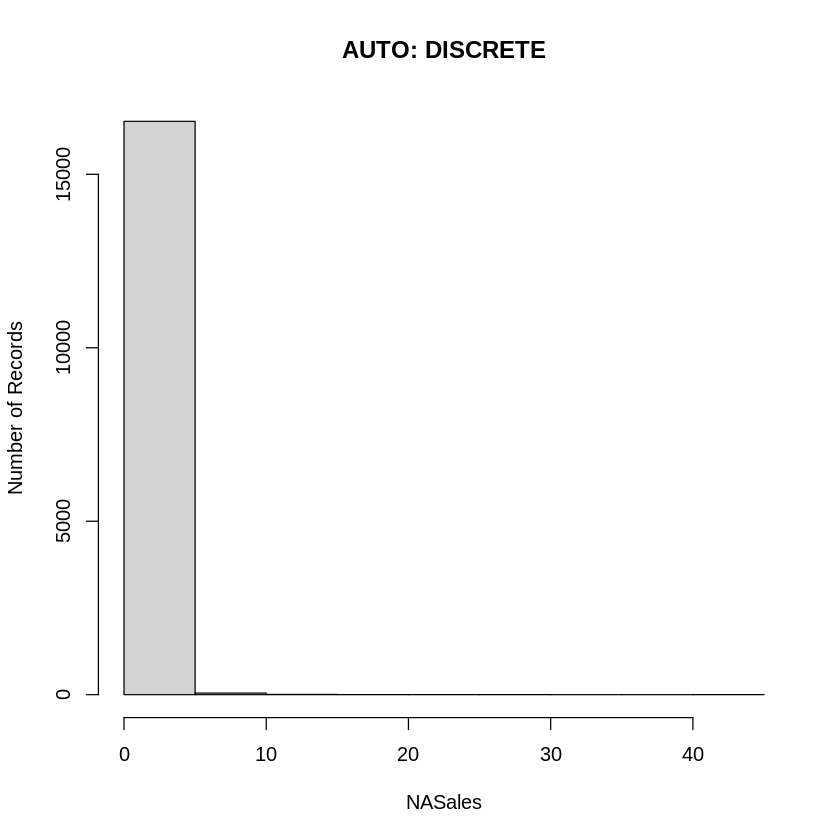

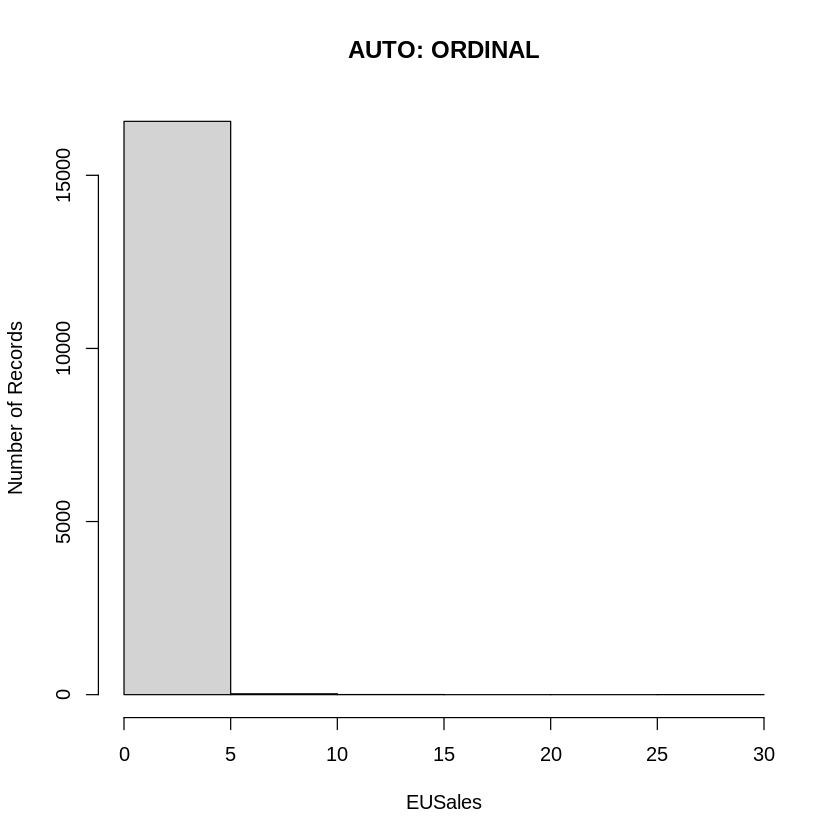

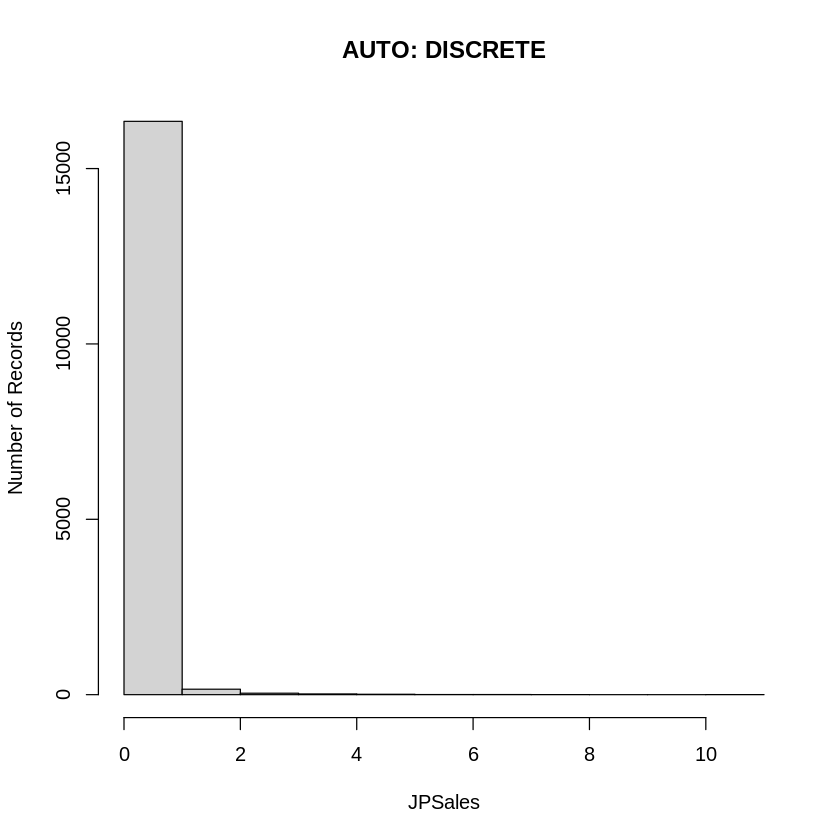

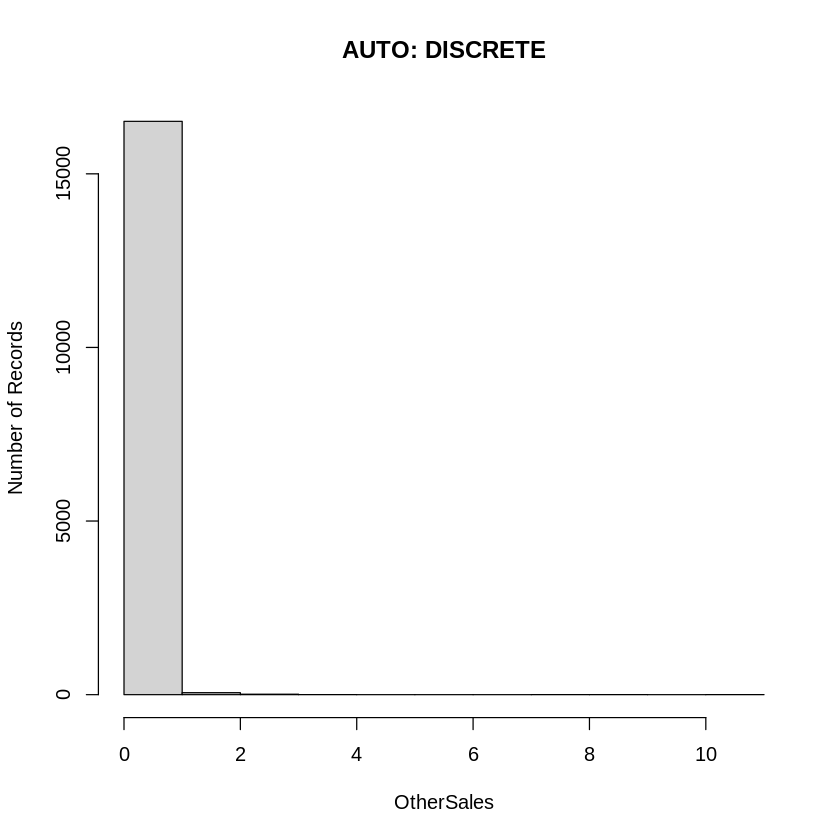

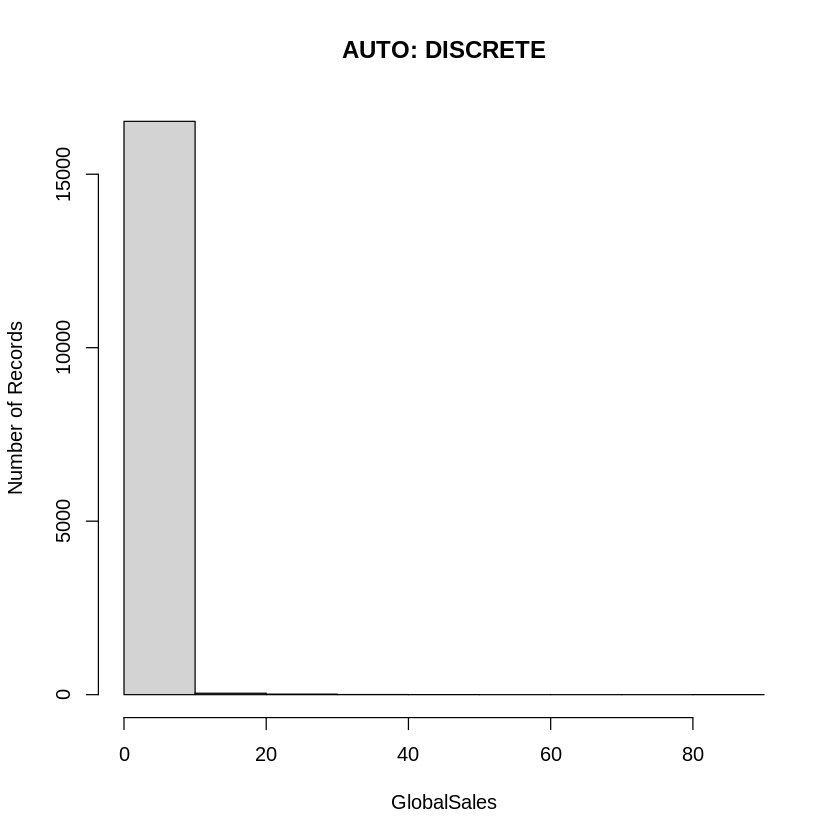

...

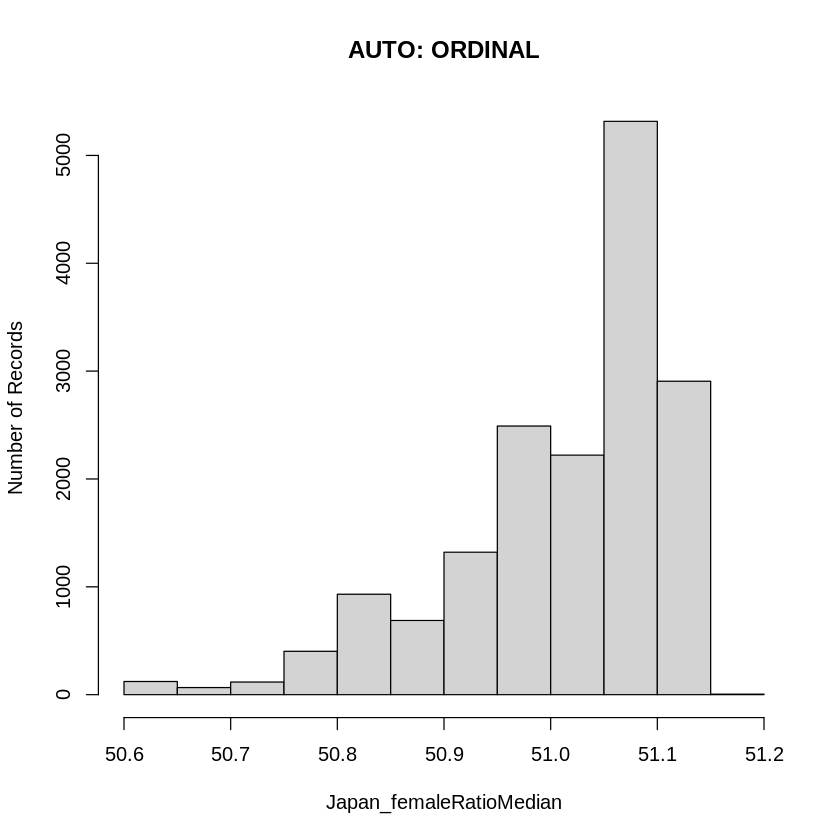

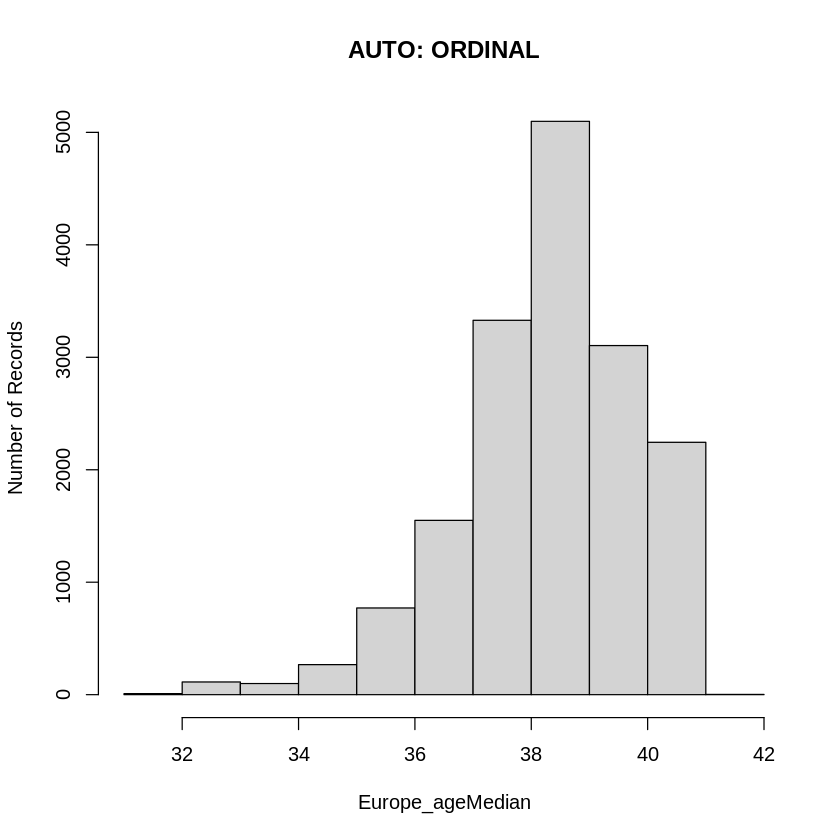

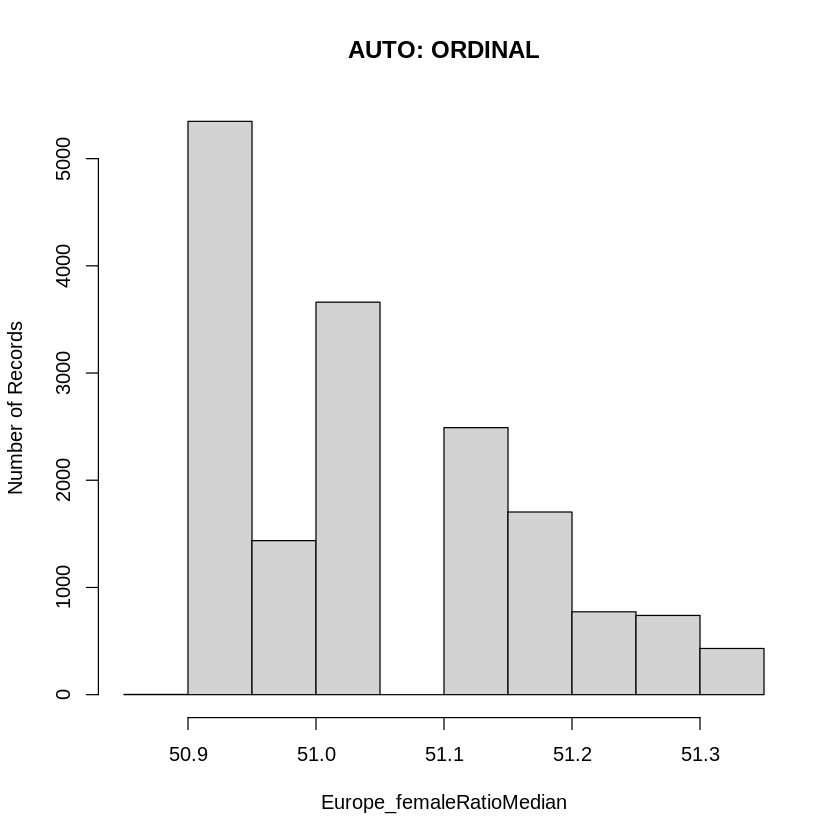

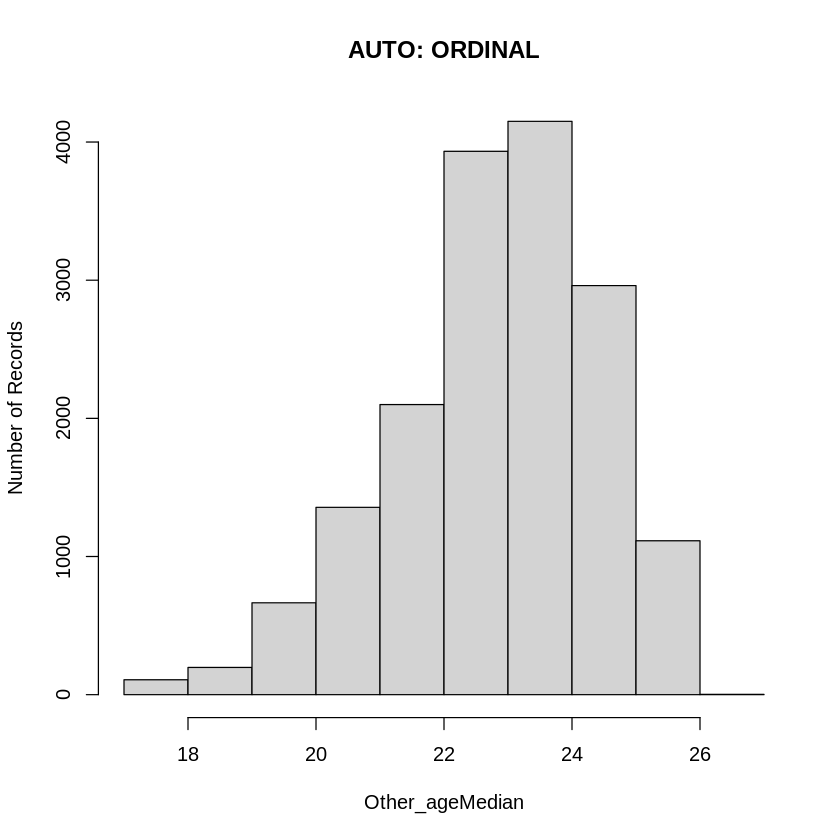

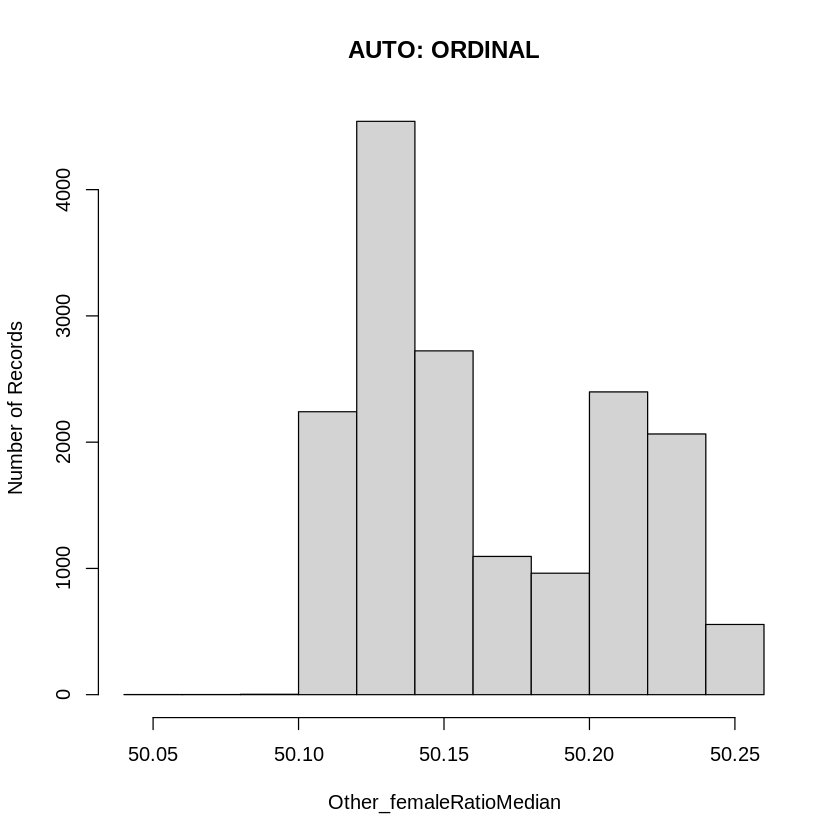

In [ ]:
# Set initial field types
field_types <- InitialFieldTypes(games)

# Categorise the numerical fields
field_types <- NPREPROCESSING_discreteNumeric(games, field_types, DN_CUTOFF)

In [ ]:
# Since some fields were categorised incorrectly, assign the correct field types
# to their designated fields.

# Disctionary of field names and the correct types they need to be assigned
manual_change_fields <- c("YearofRelease"=TYPE_DISCRETE, "GlobalSales"=TYPE_ORDINAL, "NASales"=TYPE_ORDINAL, "EUSales"=TYPE_ORDINAL, "JPSales"=TYPE_ORDINAL, "OtherSales"=TYPE_ORDINAL, "UserCount"=TYPE_ORDINAL, "UserScore"=TYPE_ORDINAL)
field_types <- changeManual_fieldType(games, field_types, manual_change_fields)

# Corrected typing
results<-data.frame(field=names(games),types=field_types)
print(results)

#Displaying ordinal field 
ordinals<-games[,which(field_types=="ORDINAL")] 
head(ordinals)

                               field    types
1                               Name SYMBOLIC
2                           Platform SYMBOLIC
3                              Genre SYMBOLIC
4                          Publisher SYMBOLIC
5                            NASales  ORDINAL
6                            EUSales  ORDINAL
7                            JPSales  ORDINAL
8                         OtherSales  ORDINAL
9                        GlobalSales  ORDINAL
10                       CriticCount  ORDINAL
11                         UserCount  ORDINAL
12                         Developer SYMBOLIC
13                            Rating SYMBOLIC
14                       ReleaseDate SYMBOLIC
15                     YearofRelease DISCRETE
16                       CriticScore  ORDINAL
17                         UserScore  ORDINAL
18         NorthernAmerica_ageMedian  ORDINAL
19 NorthernAmerica_femaleRatioMedian  ORDINAL
20                   Japan_ageMedian  ORDINAL
21           Japan_femaleRatioMedi

,NASales,EUSales,JPSales,OtherSales,GlobalSales,CriticCount,UserCount,CriticScore,UserScore,NorthernAmerica_ageMedian,NorthernAmerica_femaleRatioMedian,Japan_ageMedian,Japan_femaleRatioMedian,Europe_ageMedian,Europe_femaleRatioMedian,Other_ageMedian,Other_femaleRatioMedian
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,41.36,28.96,3.77,8.45,82.53,51,322,76,8,37.9,50.52950,42.8,51.01551,38.1,51.04206,22.75,50.17136
2,29.08,3.58,6.81,0.77,40.24,NA,NA,NA,NA,30.0,50.64611,34.5,50.65142,33.1,51.27461,18.30,50.15042
3,15.68,12.76,3.79,3.29,35.52,73,709,82,8,38.3,50.51277,43.5,51.05396,38.8,51.01862,23.10,50.14828
4,15.61,10.93,3.28,2.95,32.77,73,192,80,8,38.5,50.50588,43.9,51.07123,39.0,50.97711,23.55,50.12598
5,11.27,8.89,10.22,1.00,31.37,NA,NA,NA,NA,33.3,50.66784,39.3,50.80448,35.5,51.27873,19.75,50.24406
6,23.20,2.26,4.22,0.58,30.26,NA,NA,NA,NA,31.4,50.69814,36.4,50.70501,33.9,51.19963,18.70,50.24149


[1] "NO REPLACEMENT: Outlier field= NASales #Records= 228"


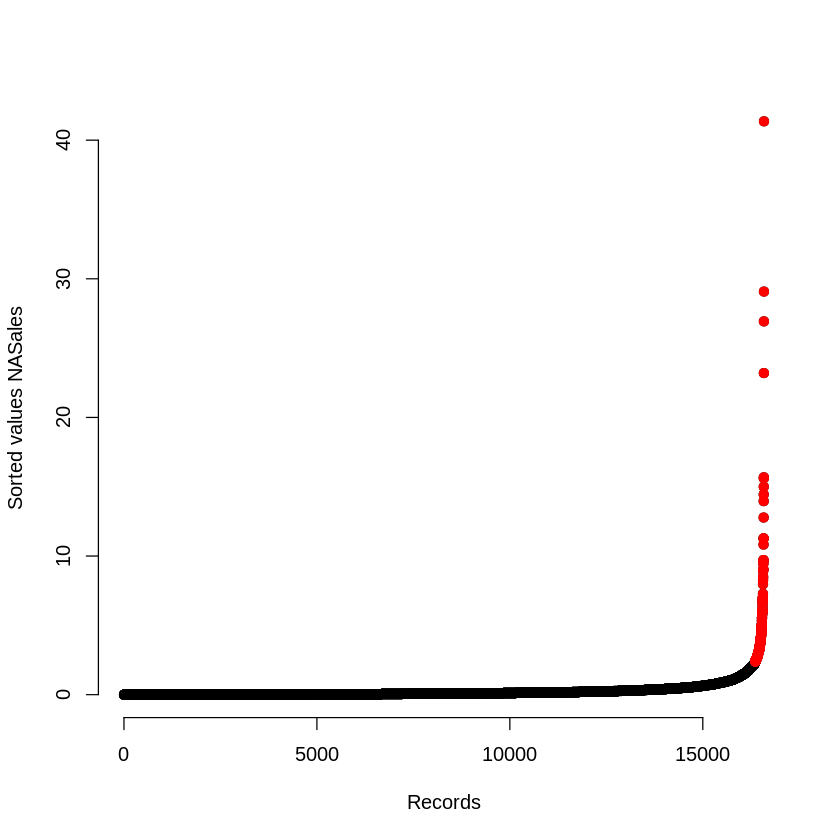

[1] "NO REPLACEMENT: Outlier field= EUSales #Records= 257"


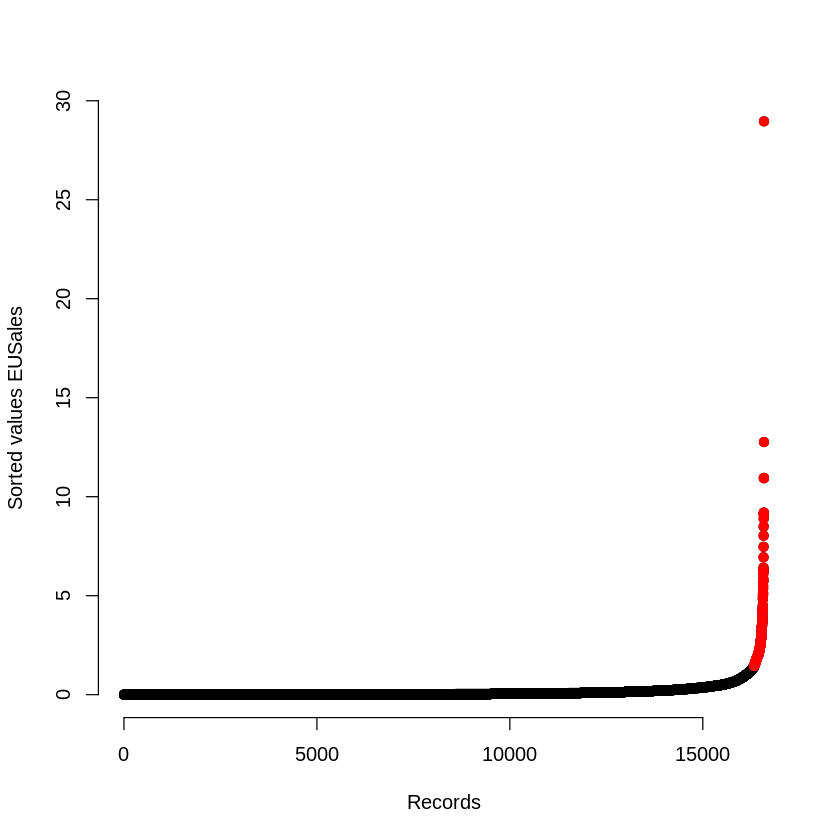

[1] "NO REPLACEMENT: Outlier field= JPSales #Records= 289"


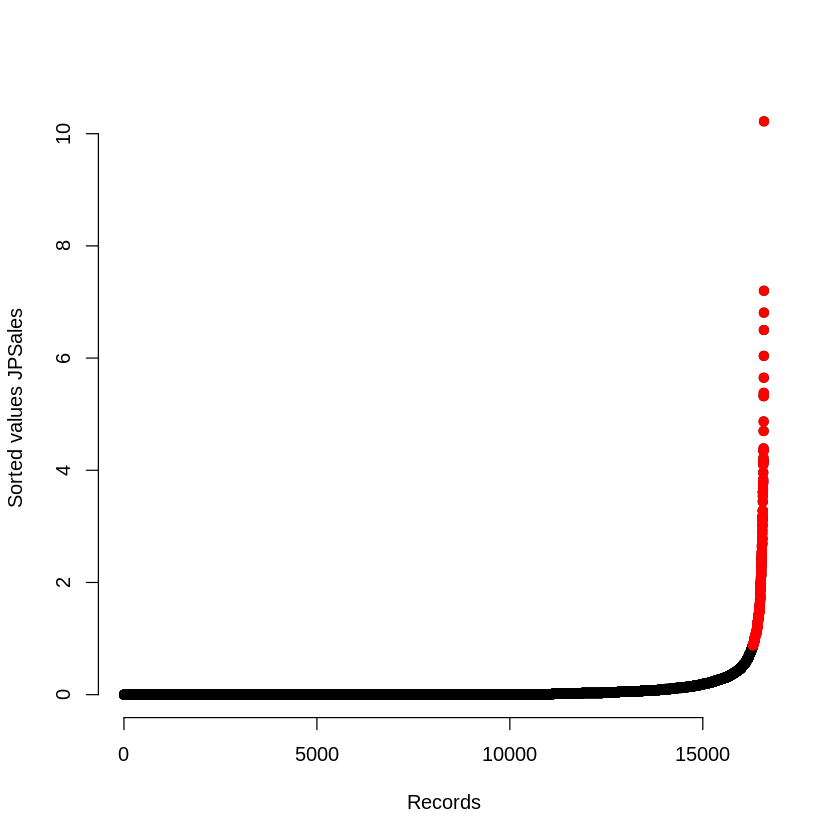

[1] "NO REPLACEMENT: Outlier field= OtherSales #Records= 214"


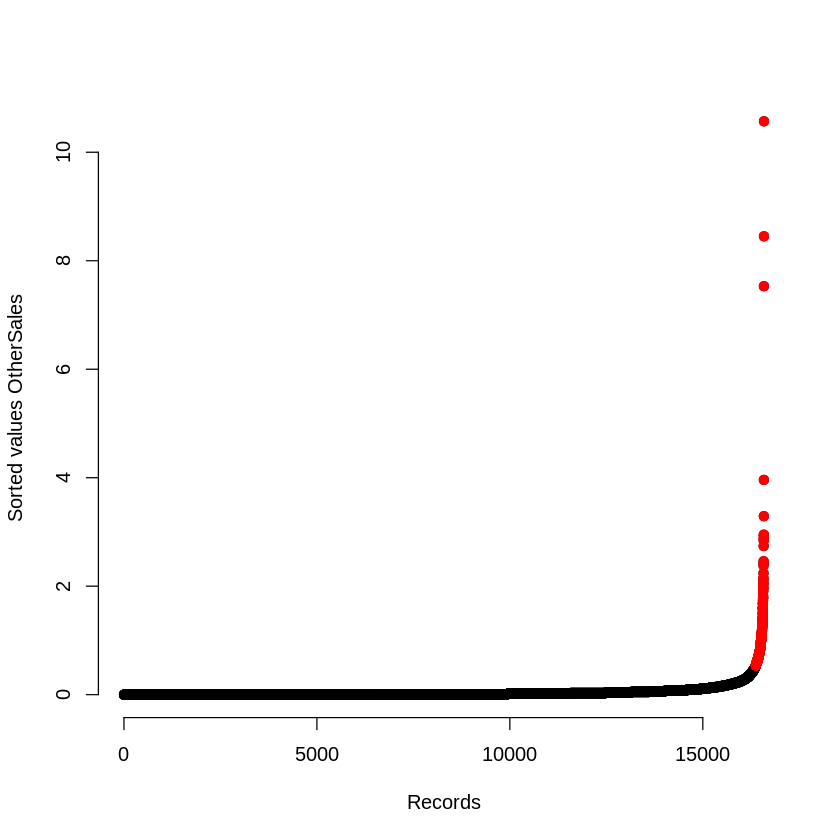

[1] "NO REPLACEMENT: Outlier field= GlobalSales #Records= 237"


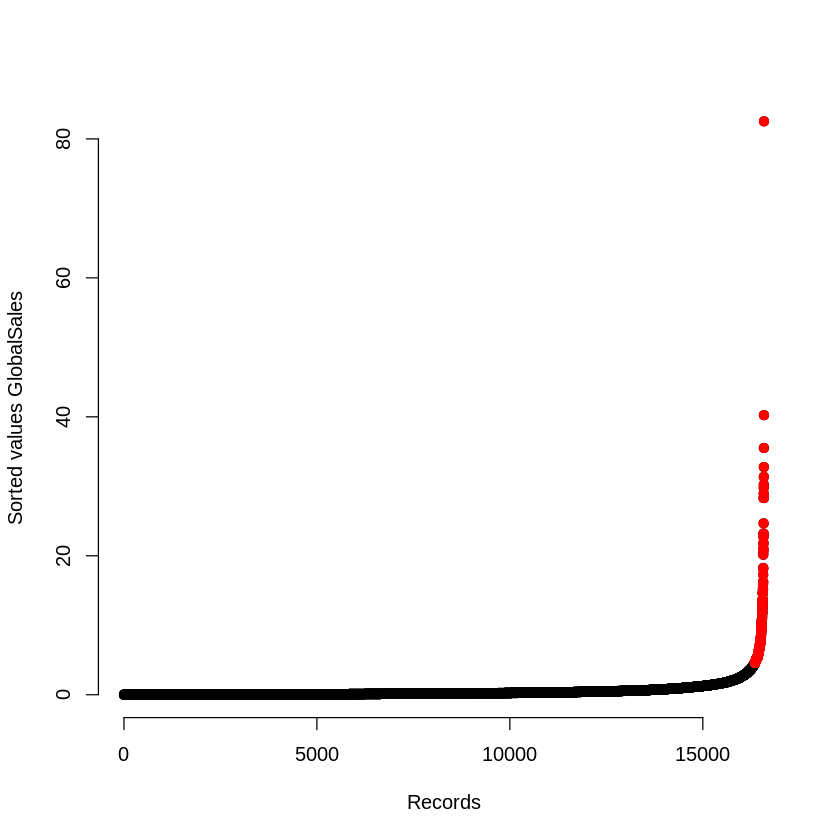

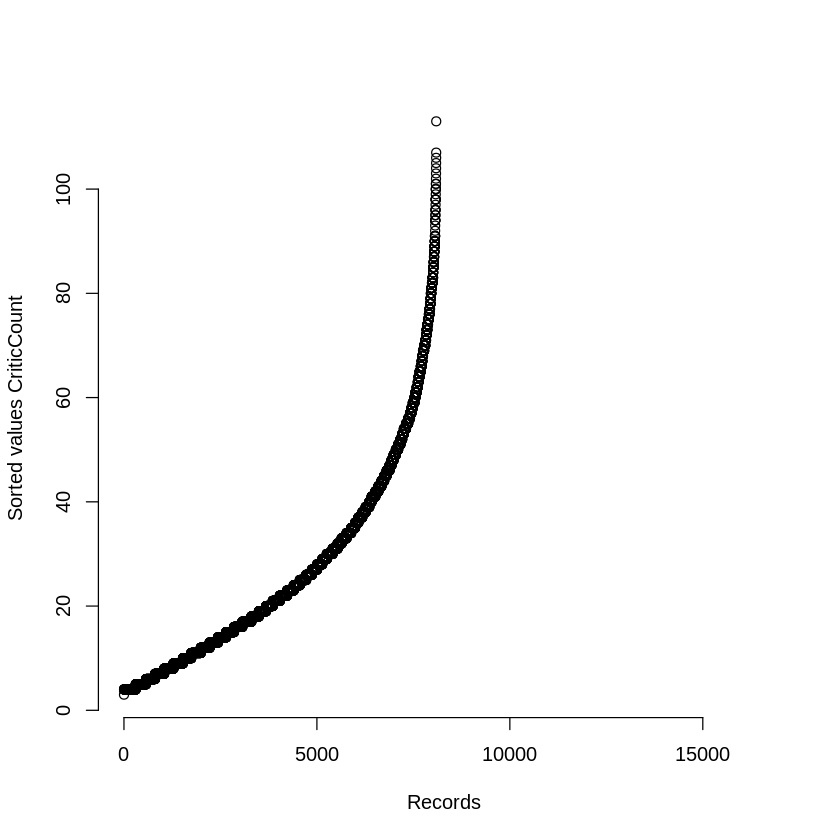

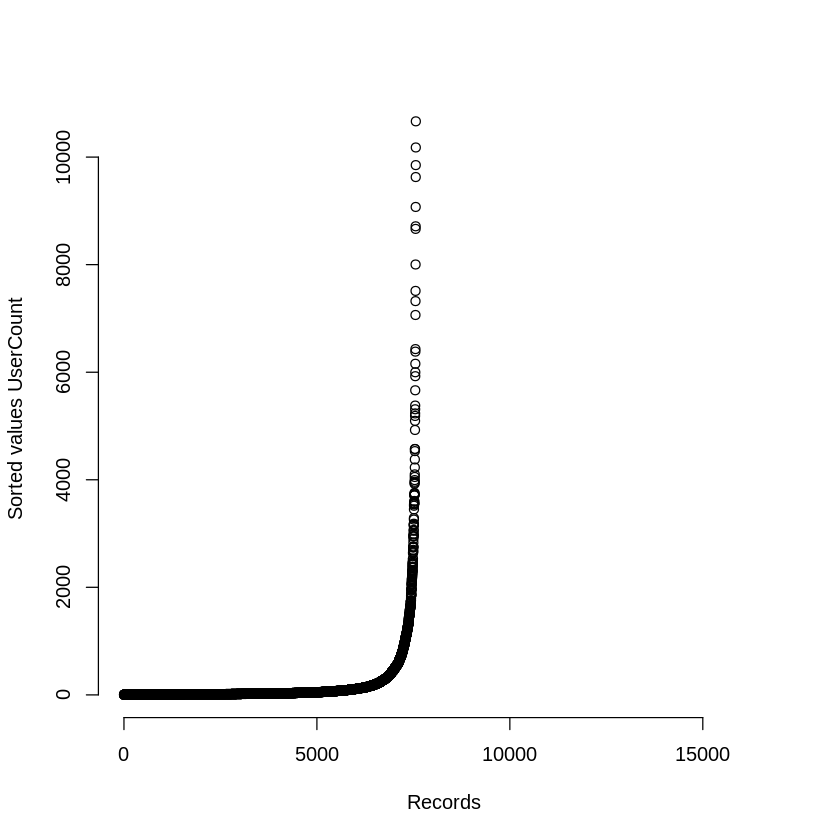

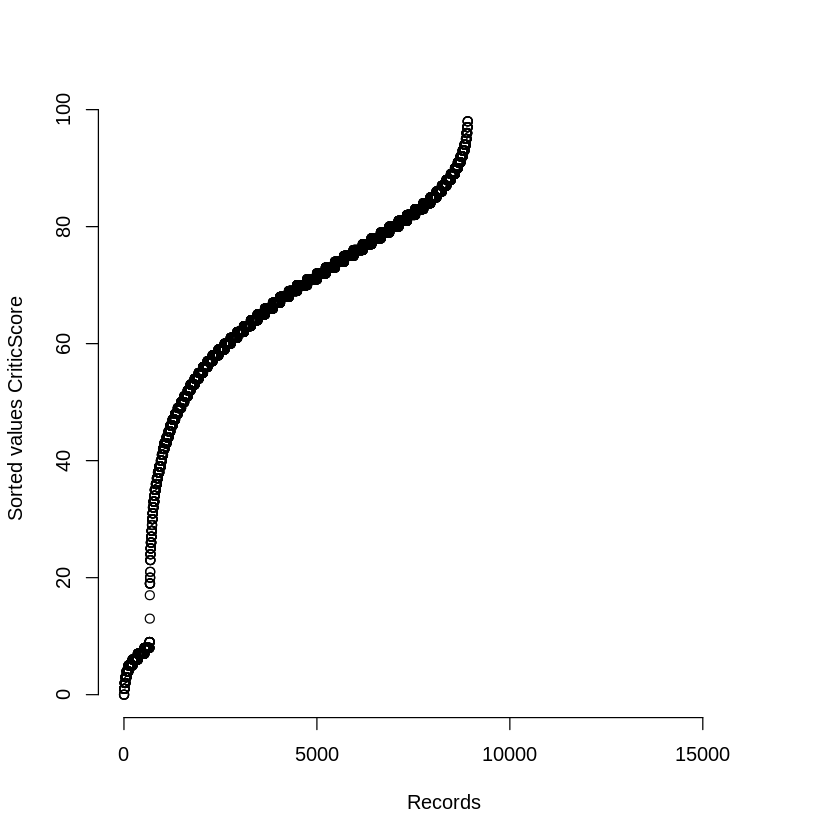

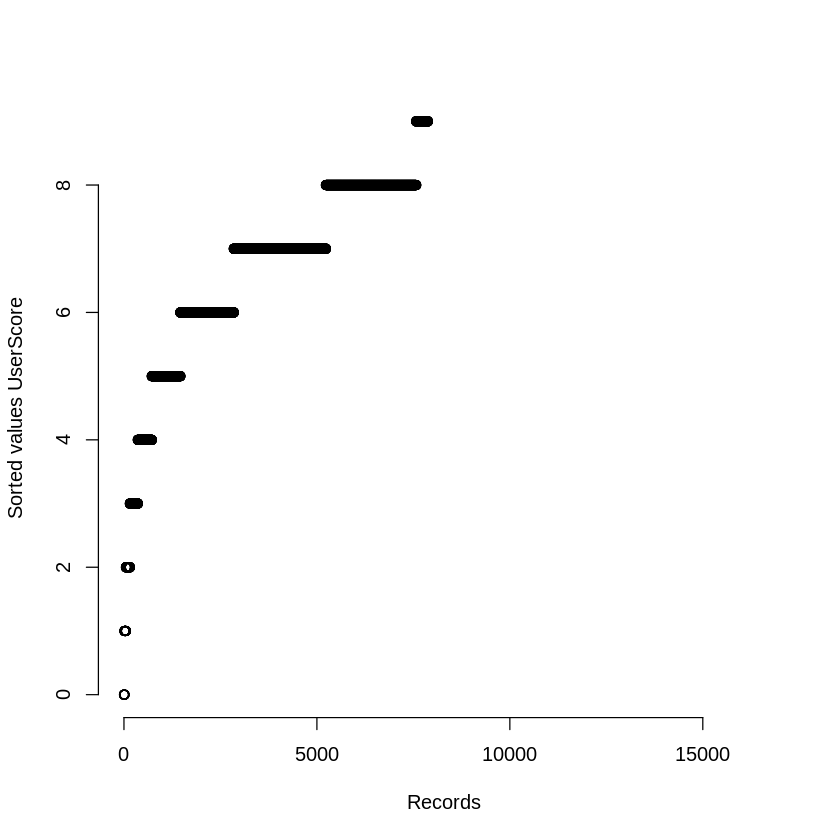

[1] "NO REPLACEMENT: Outlier field= NorthernAmerica_ageMedian #Records= 367"


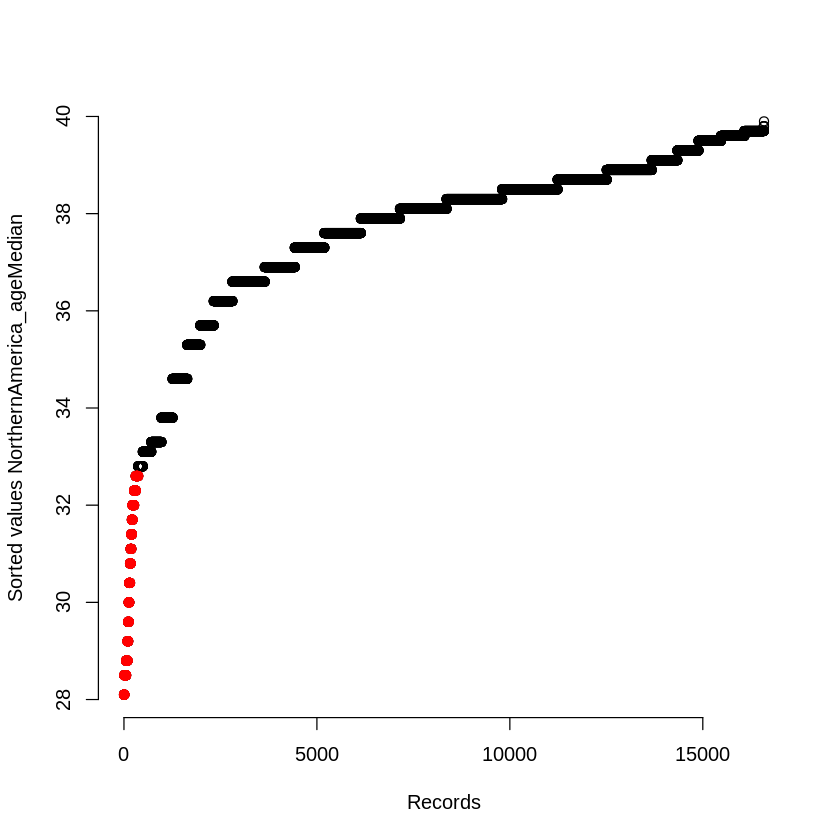

[1] "NO REPLACEMENT: Outlier field= NorthernAmerica_femaleRatioMedian #Records= 534"


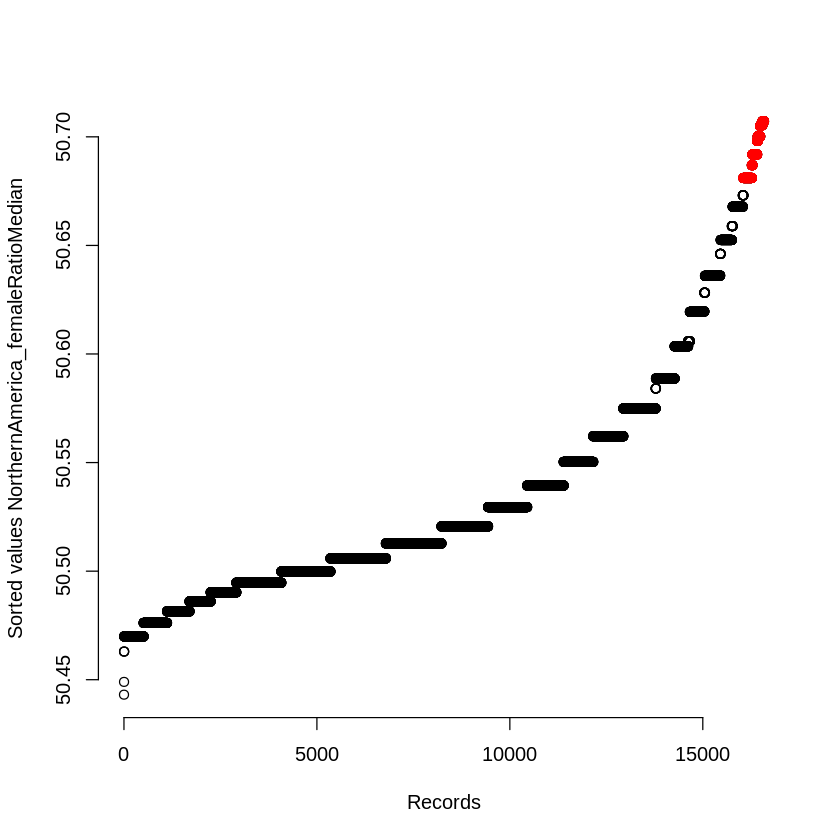

[1] "NO REPLACEMENT: Outlier field= Japan_ageMedian #Records= 262"


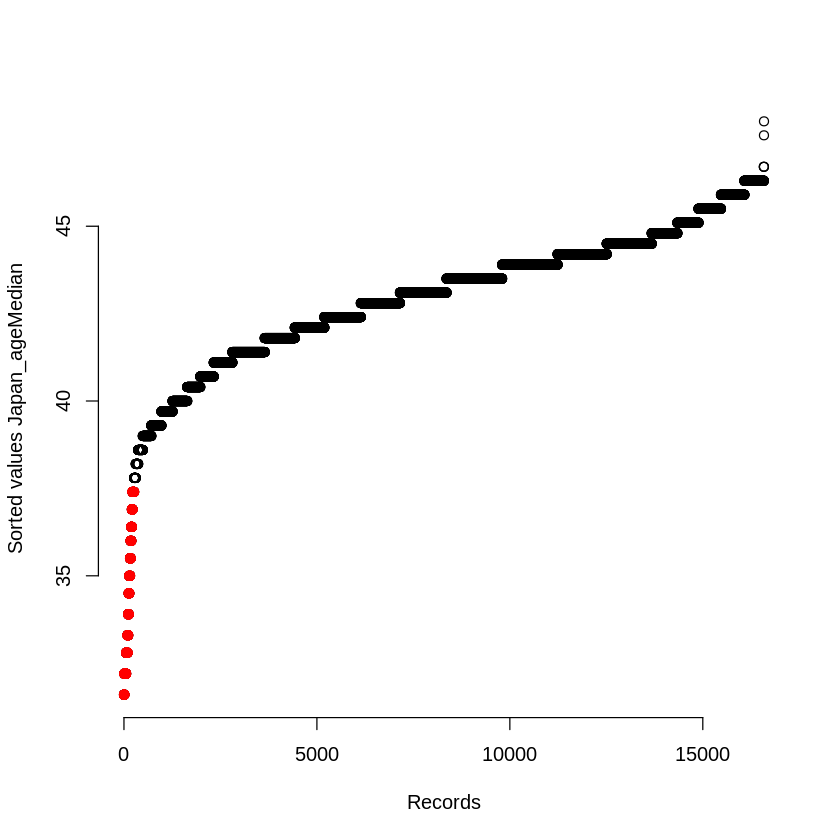

[1] "NO REPLACEMENT: Outlier field= Japan_femaleRatioMedian #Records= 305"


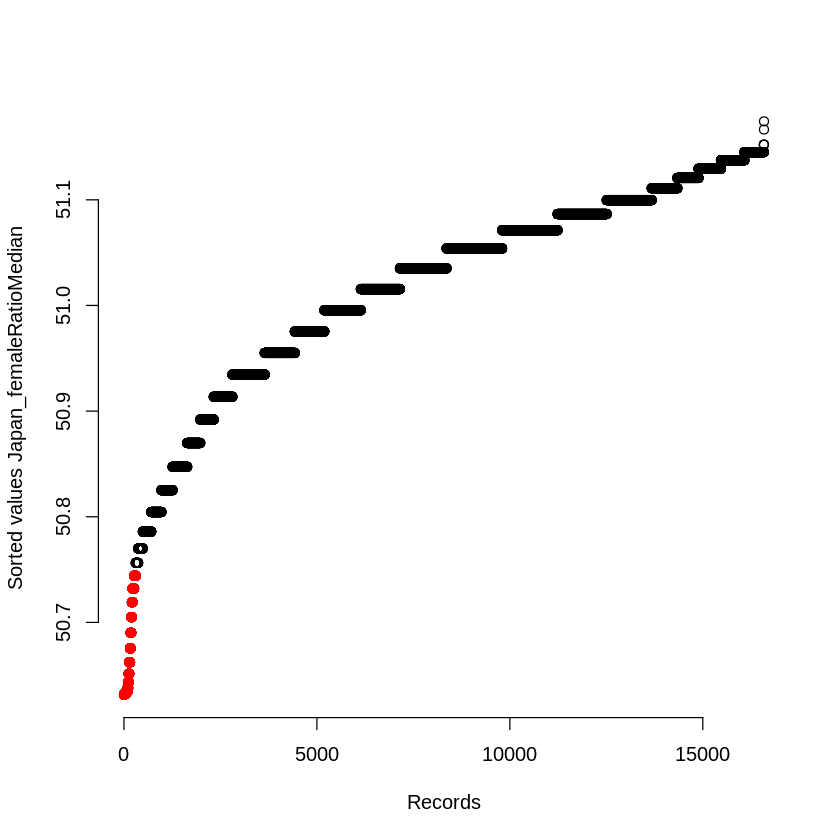

[1] "NO REPLACEMENT: Outlier field= Europe_ageMedian #Records= 262"


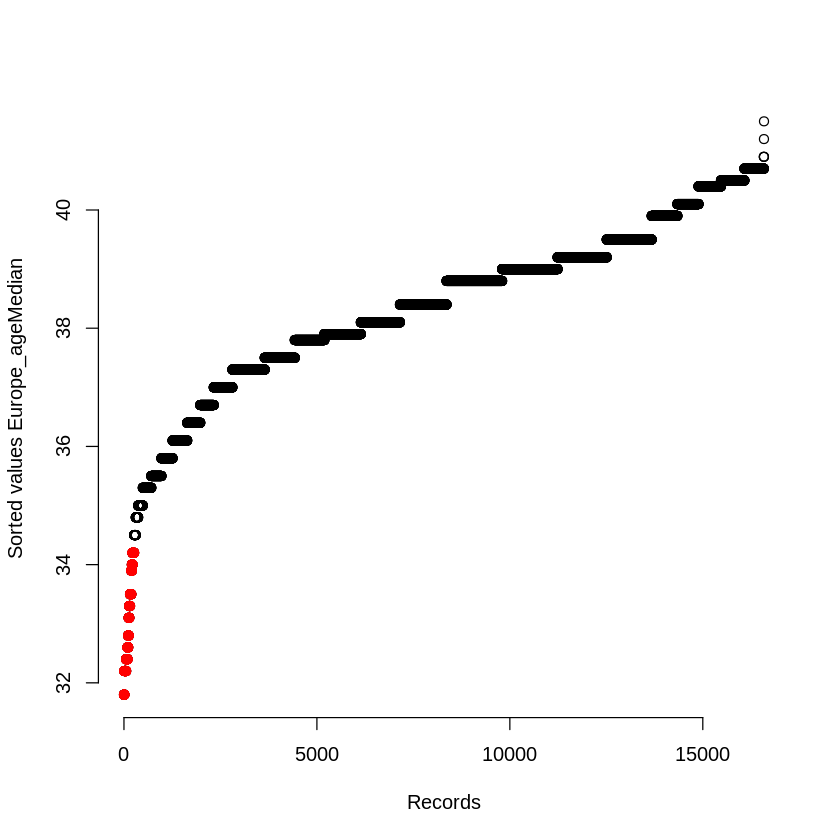

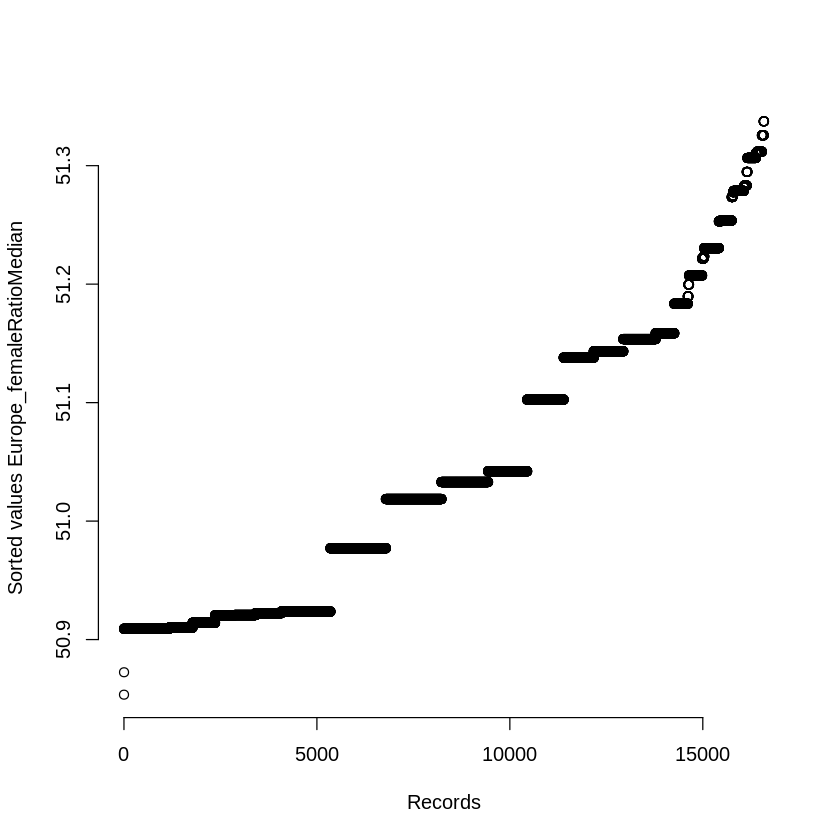

[1] "NO REPLACEMENT: Outlier field= Other_ageMedian #Records= 221"


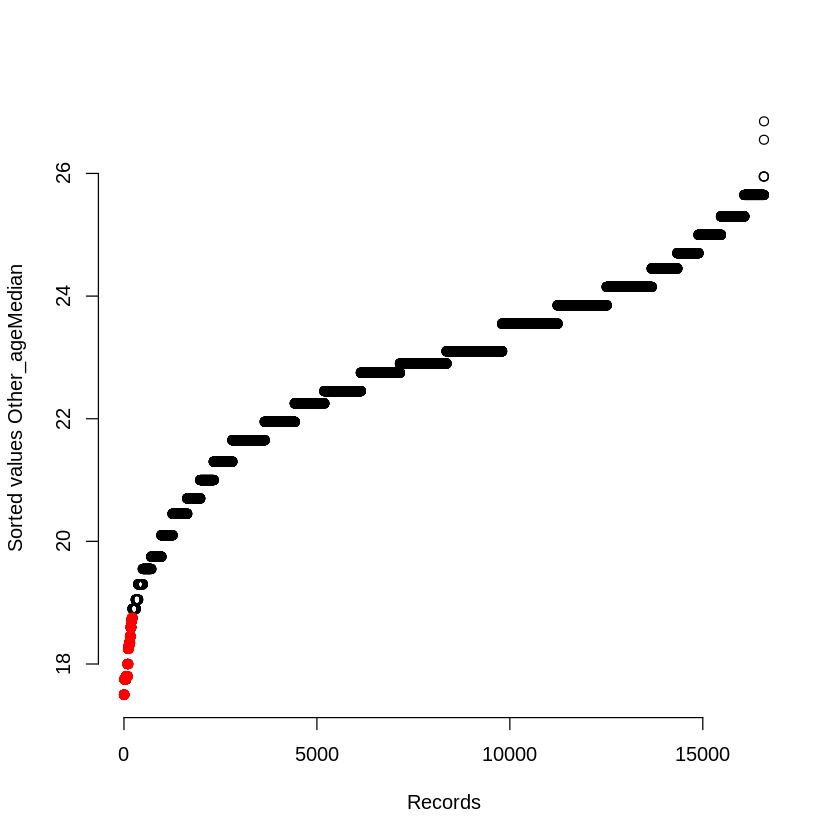

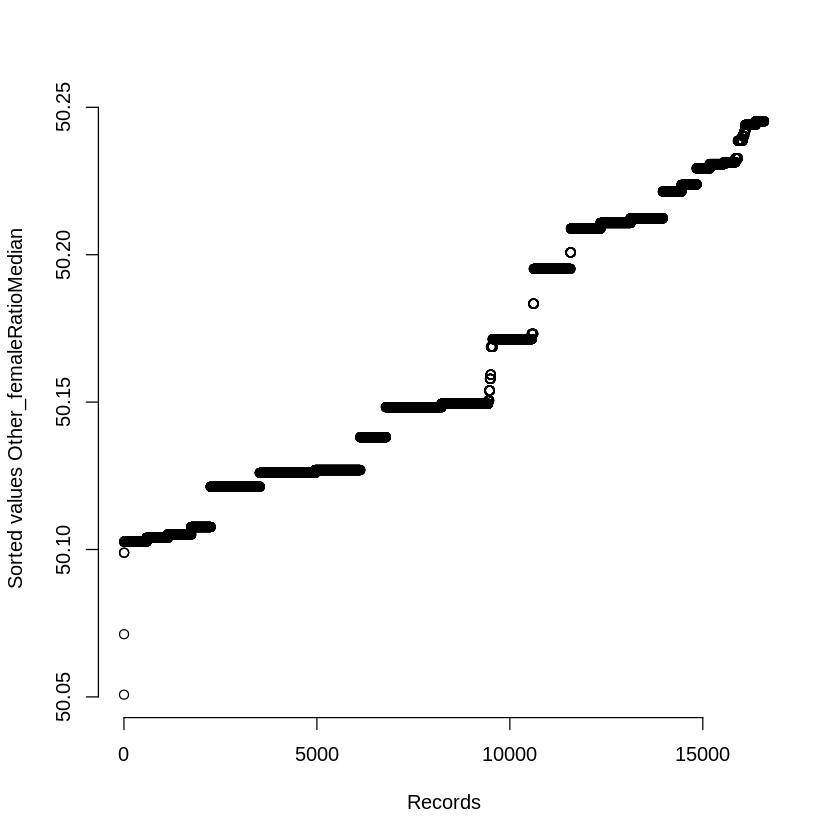

[1] "DELETED RECORDS: Outlier field= NASales #Records= 371"


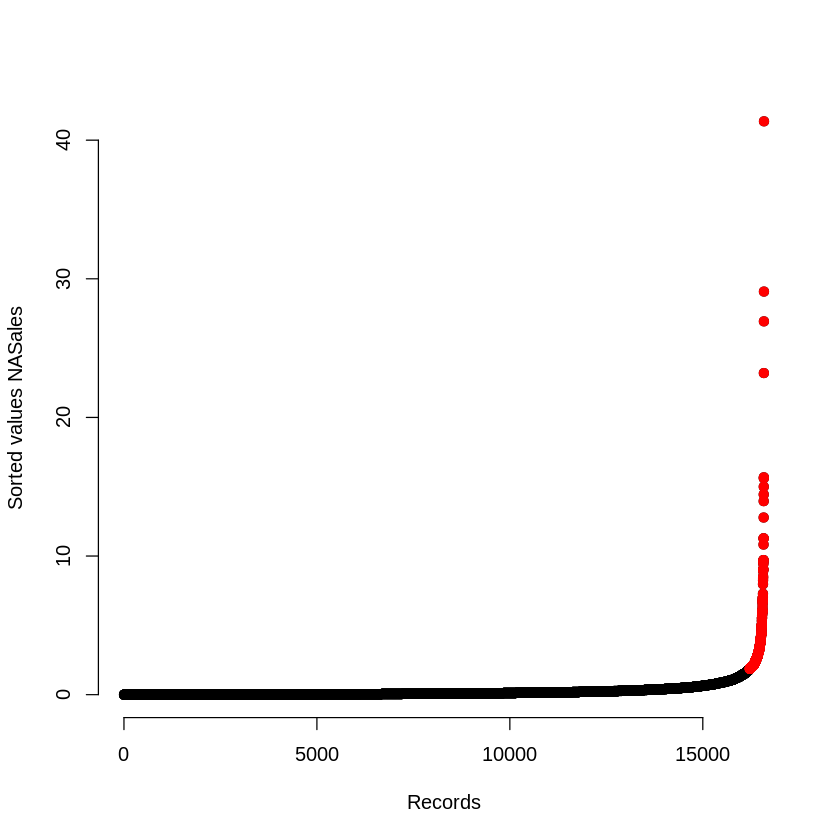

[1] "DELETED RECORDS: Outlier field= EUSales #Records= 554"


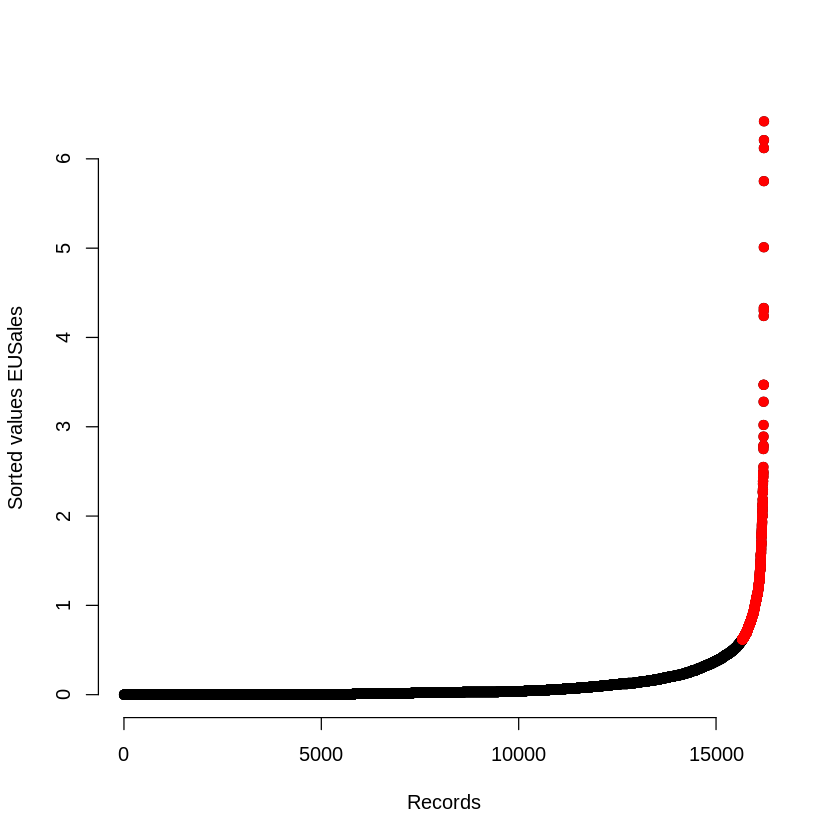

[1] "DELETED RECORDS: Outlier field= JPSales #Records= 472"


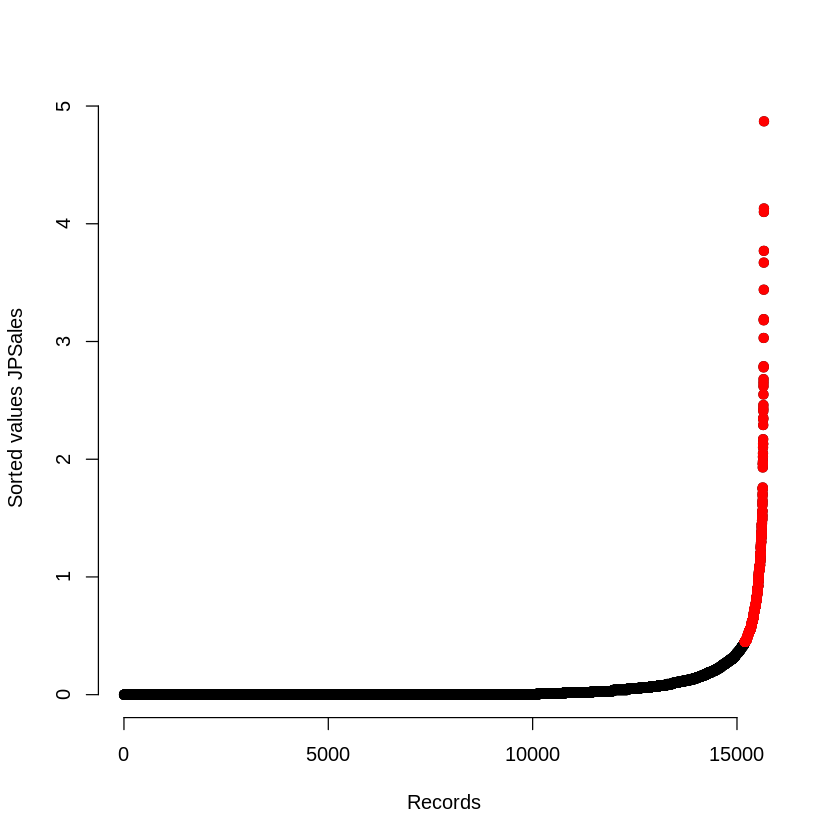

[1] "DELETED RECORDS: Outlier field= OtherSales #Records= 442"


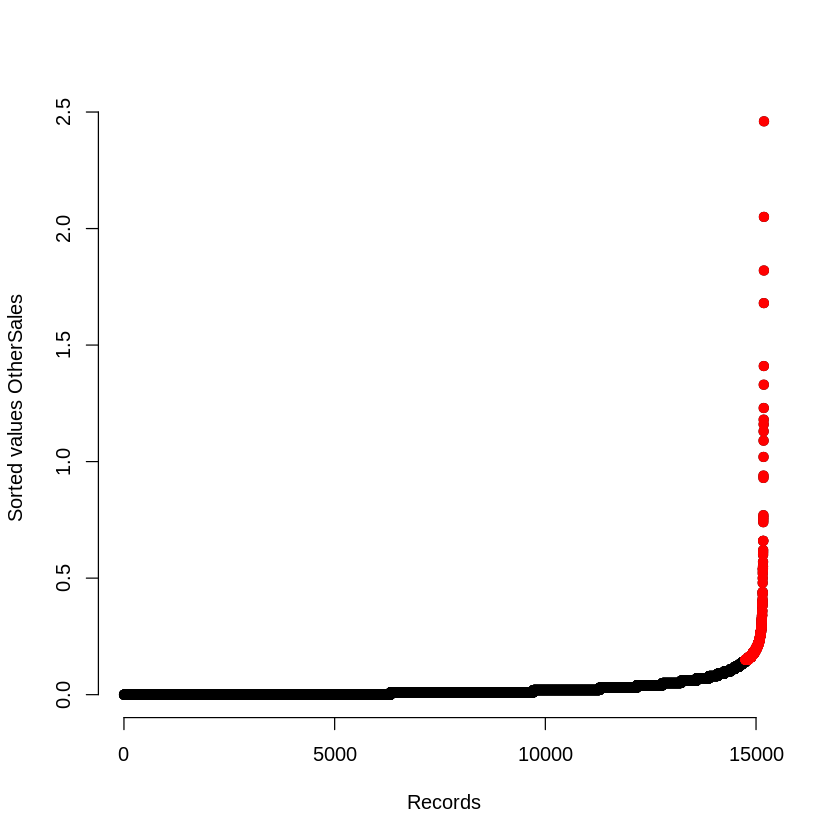

[1] "DELETED RECORDS: Outlier field= GlobalSales #Records= 828"


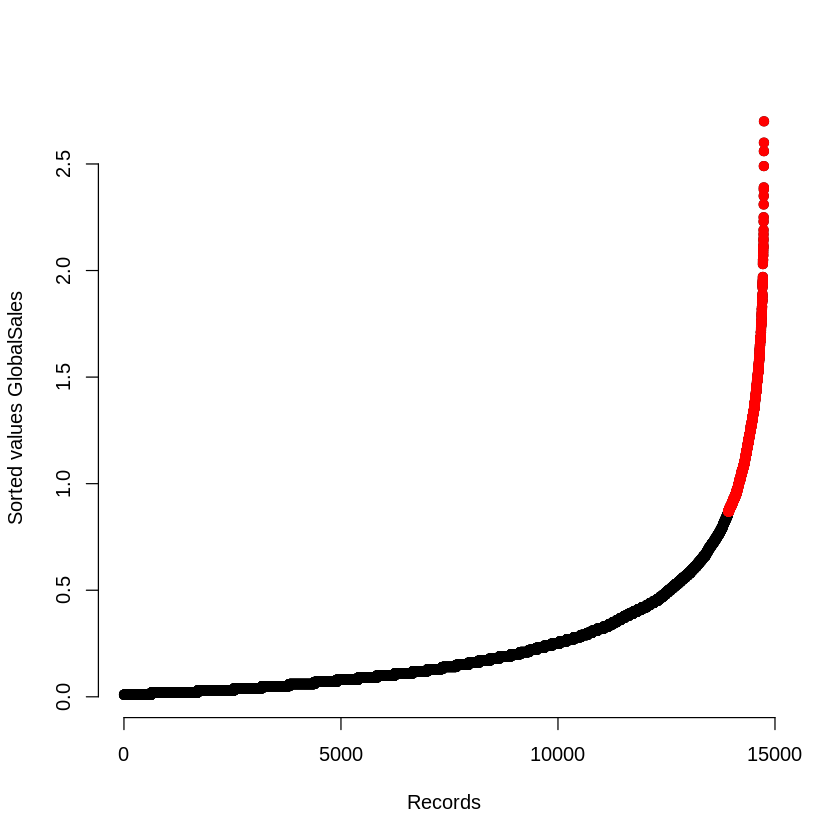

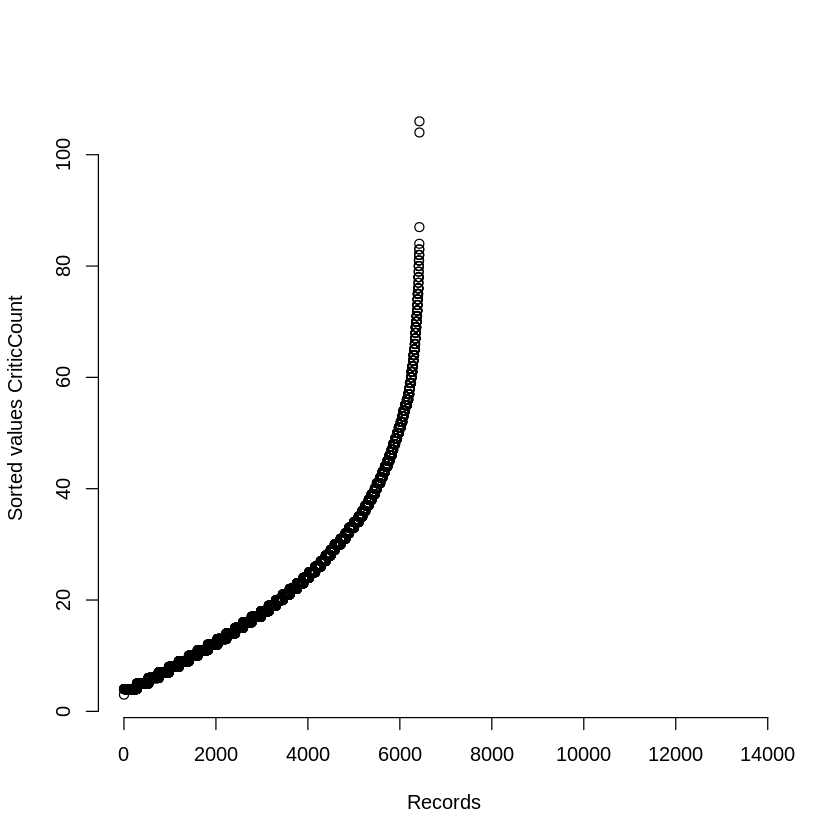

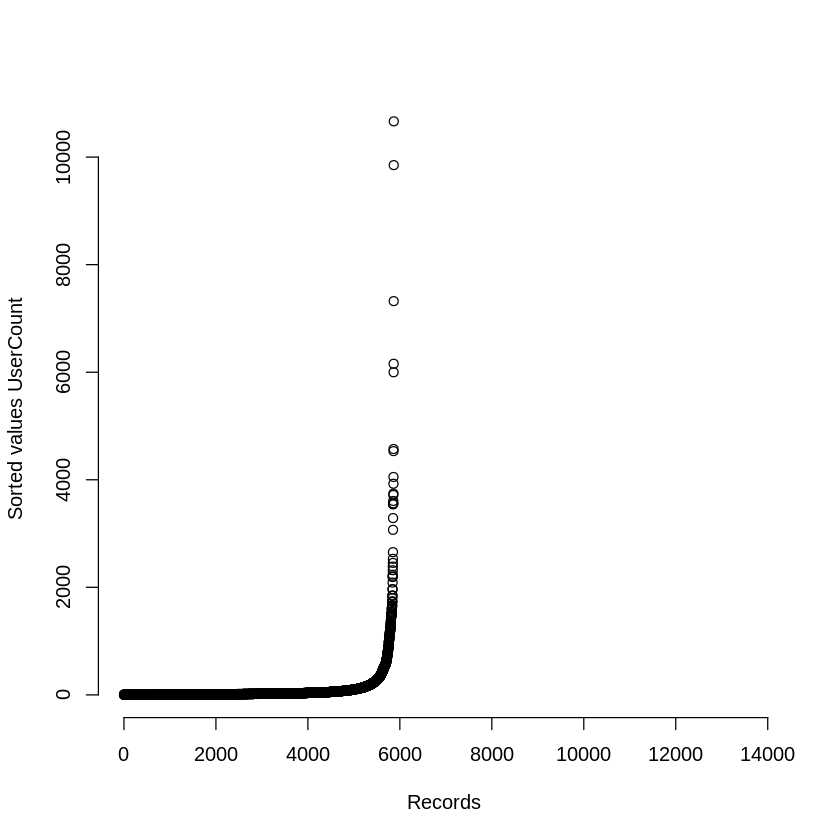

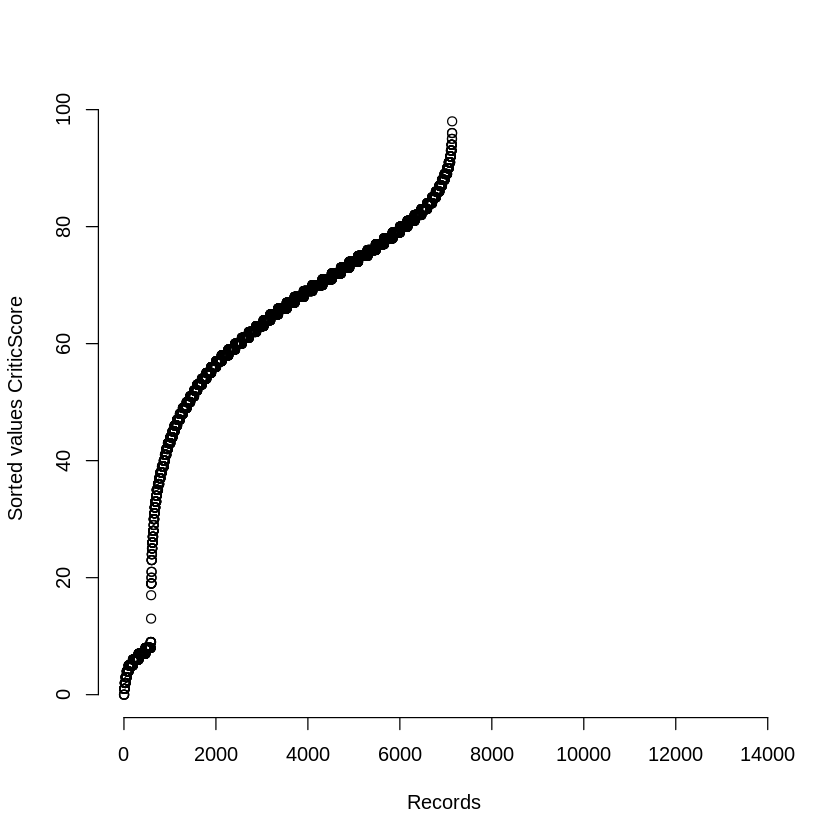

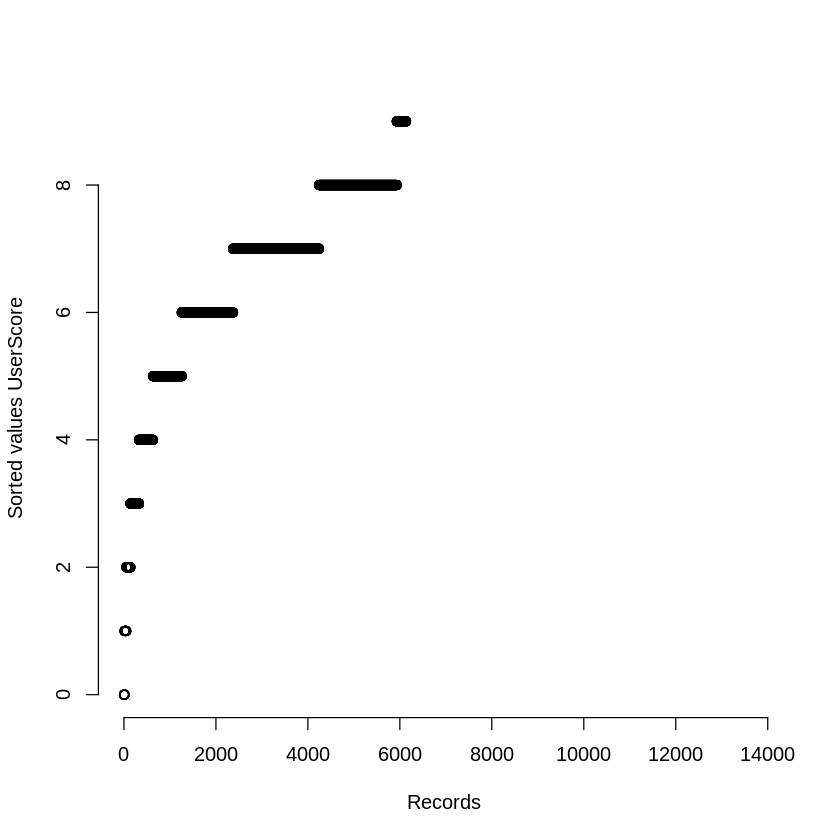

[1] "DELETED RECORDS: Outlier field= NorthernAmerica_ageMedian #Records= 872"


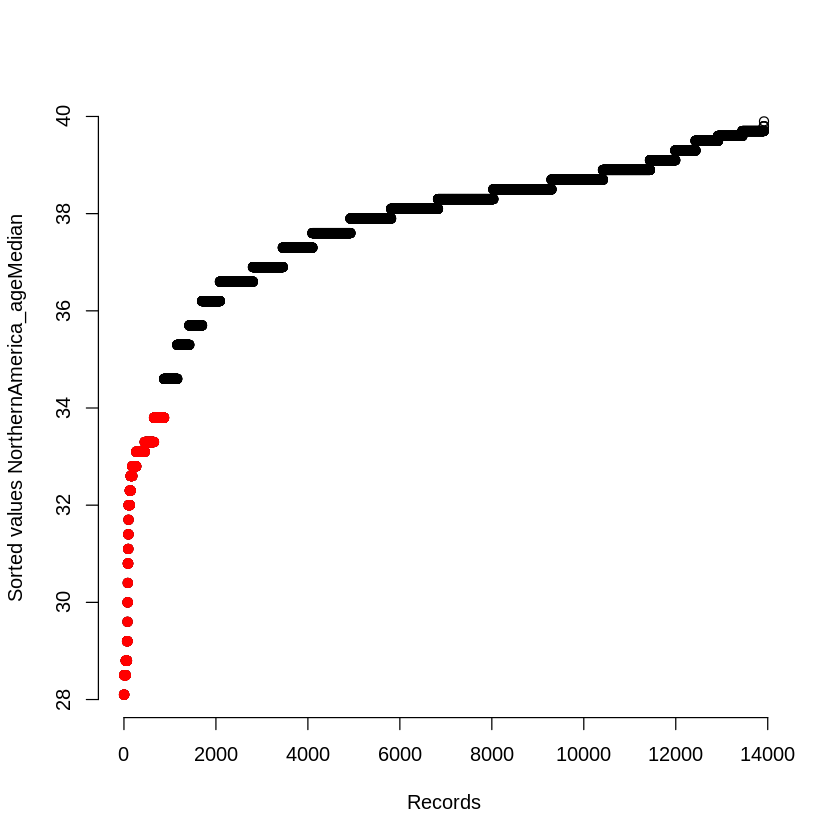

[1] "DELETED RECORDS: Outlier field= NorthernAmerica_femaleRatioMedian #Records= 827"


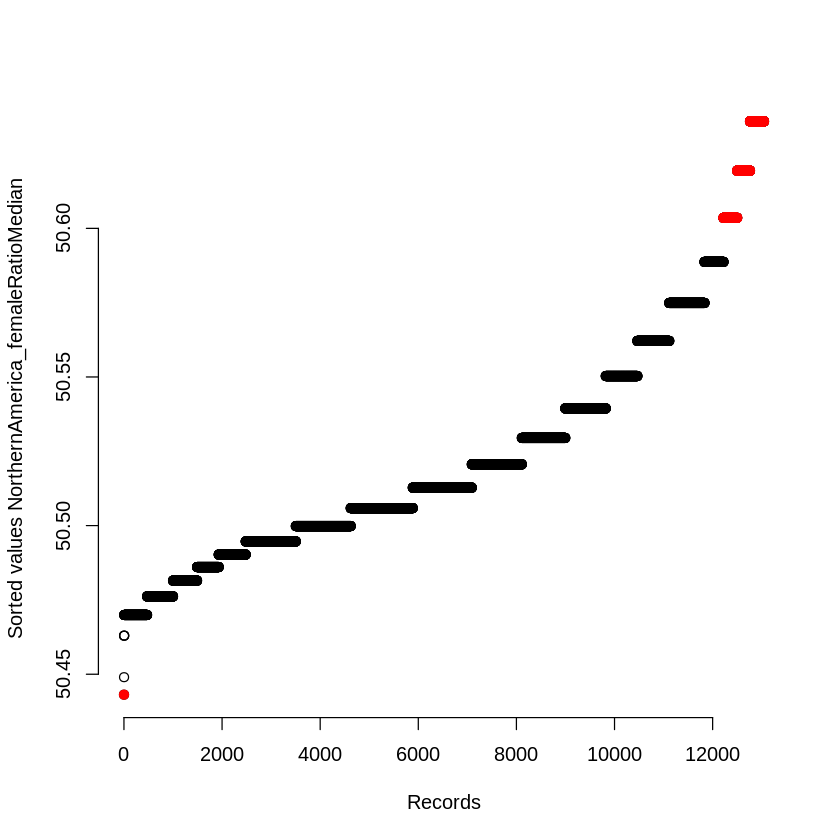

[1] "DELETED RECORDS: Outlier field= Japan_ageMedian #Records= 470"


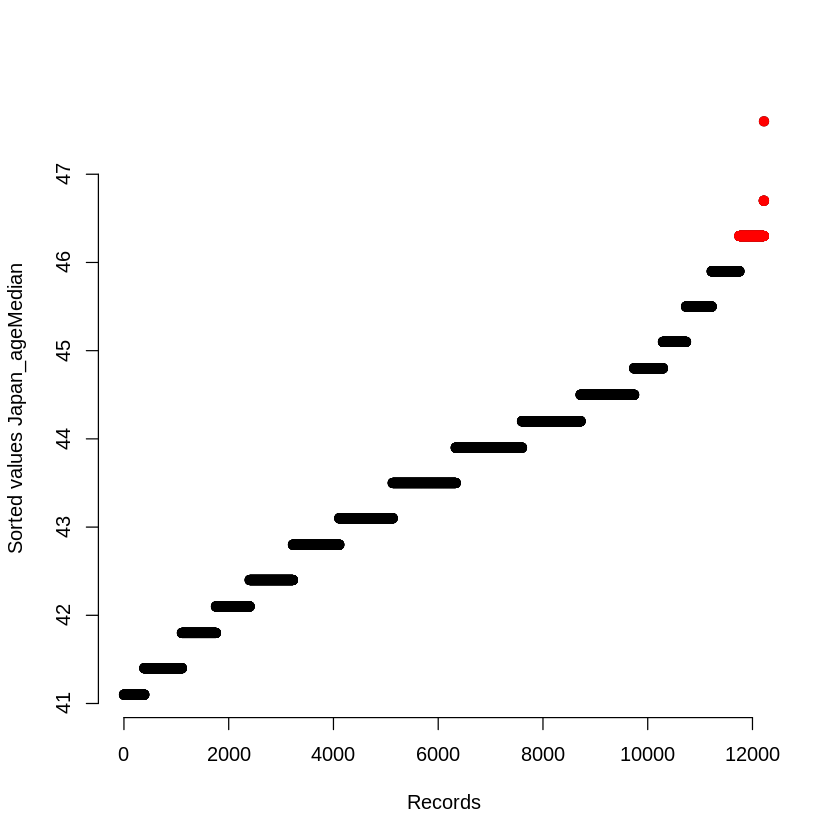

[1] "DELETED RECORDS: Outlier field= Japan_femaleRatioMedian #Records= 388"


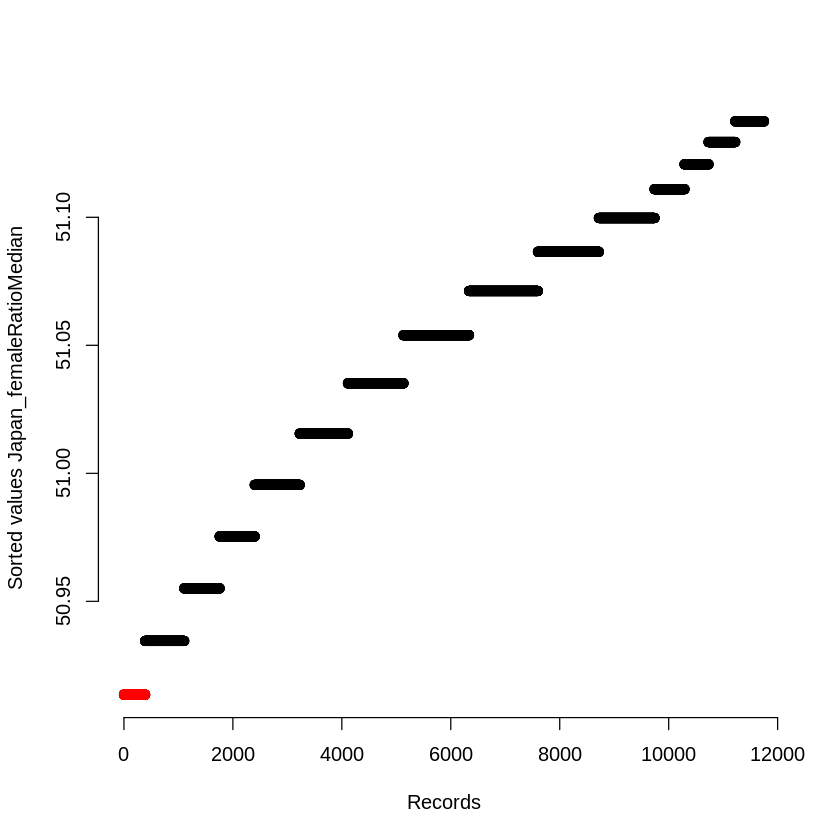

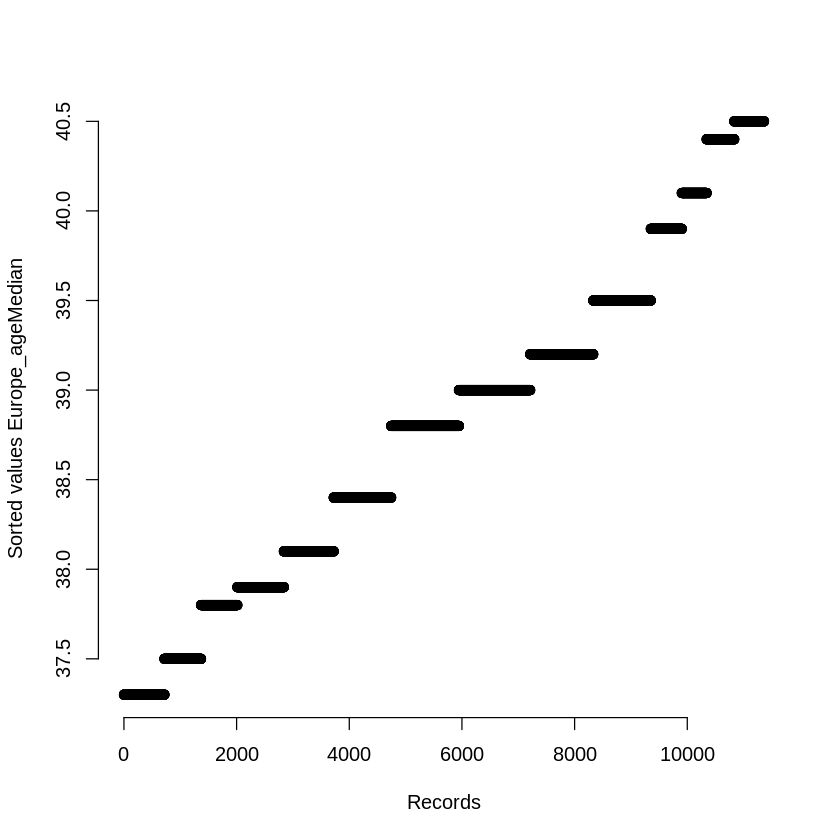

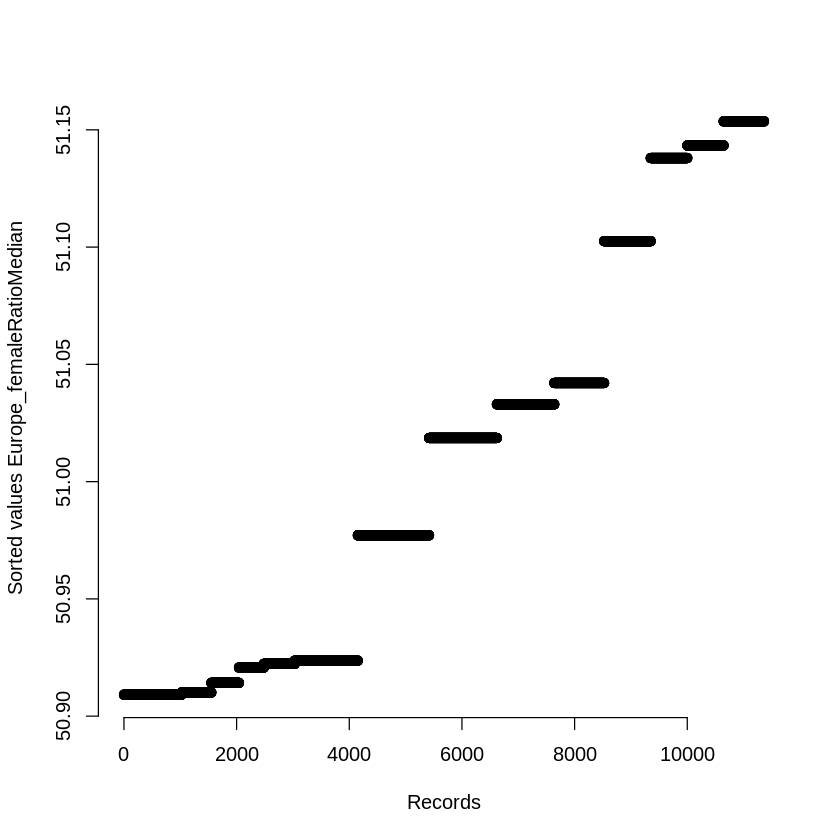

[1] "DELETED RECORDS: Outlier field= Other_ageMedian #Records= 529"


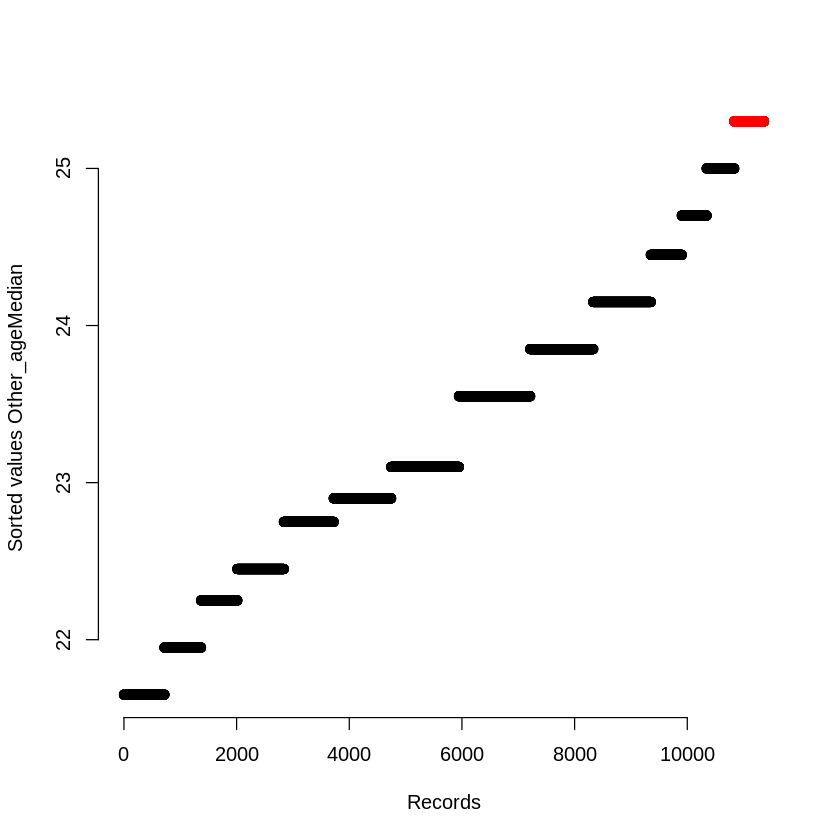

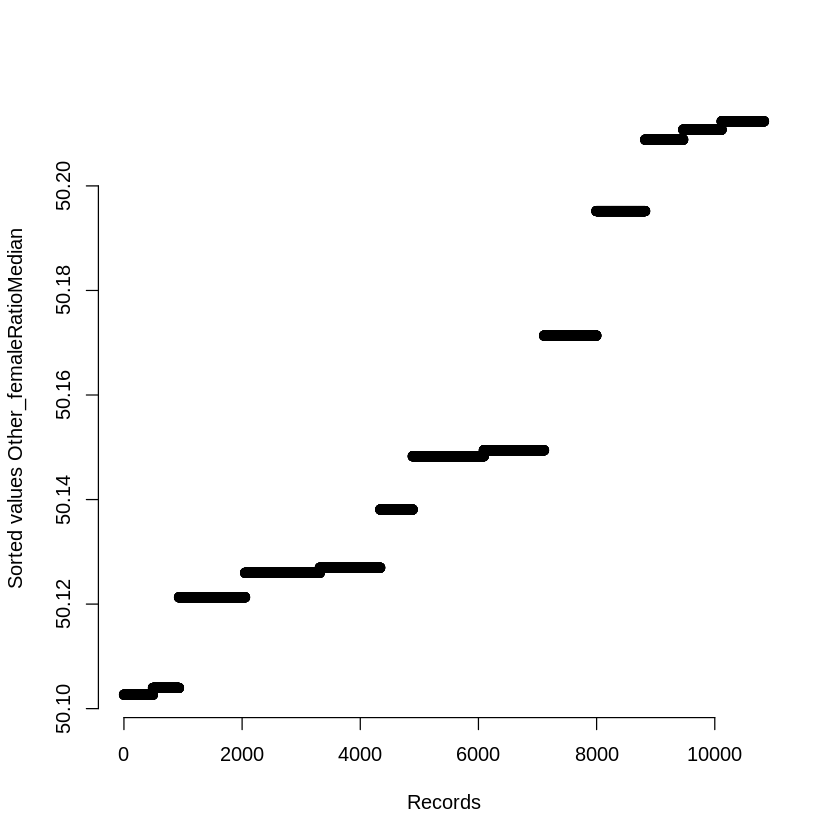

In [ ]:
# Plot all of the outliers based on Chi Squared test and choose to ignore,
# remove or replace the outlier values.
games_TS <- cbind(games)
games_keep_outliers <- NPREPROCESSING_outlier(games, field_types, 0.99, "ignore")
games <- NPREPROCESSING_outlier(games, field_types, CONFIDENCE, "remove")

### Normalization

In [ ]:
#all numeric columns to be normalized (exclusing YearofRelease)
numeric_cols = colnames(subset(dplyr::select_if(games, is.numeric), select = -c(YearofRelease) ))

#before normalizing save a summary of mins and maxs for each column for denormalization
MIN_MAX_SUMMARY <- minMaxSummary(games[,numeric_cols])

# Apply normalization
games[,numeric_cols] <- sapply(games[,numeric_cols], Nrescale)
head(games)

,Name,Platform,Genre,Publisher,NASales,EUSales,JPSales,OtherSales,GlobalSales,CriticCount,⋯,CriticScore,UserScore,NorthernAmerica_ageMedian,NorthernAmerica_femaleRatioMedian,Japan_ageMedian,Japan_femaleRatioMedian,Europe_ageMedian,Europe_femaleRatioMedian,Other_ageMedian,Other_femaleRatioMedian
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2407,Wizards of Waverly Place,DS,Misc,Disney Interactive Studios,0.7468354,0.3333333,0.0000000,0.5714286,1.0000000,NA,⋯,NA,NA,0.6551724,0.2610915,0.6097561,0.7014937,0.5483871,0.27795722,0.5671642,0.212548
2408,Ghostbusters: The Video Game,Wii,Action,Atari,0.7468354,0.3333333,0.0000000,0.5000000,1.0000000,NA,⋯,NA,NA,0.6551724,0.2610915,0.6097561,0.7014937,0.5483871,0.27795722,0.5671642,0.212548
2412,Endless Ocean: Blue World,Wii,Simulation,Nintendo,0.5822785,0.3500000,0.2727273,0.4285714,1.0000000,NA,⋯,NA,NA,0.6551724,0.2610915,0.6097561,0.7014937,0.5483871,0.27795722,0.5671642,0.212548
2414,Rocky,PS2,Fighting,Rage Software,0.5316456,0.5500000,0.0000000,0.7857143,1.0000000,NA,⋯,NA,NA,0.0000000,1.0000000,0.0000000,0.0000000,0.0000000,1.00000000,0.0000000,1.000000
2417,Guitar Hero: Warriors of Rock,X360,Misc,Activision,0.5949367,0.5166667,0.0000000,0.5714286,1.0000000,NA,⋯,NA,NA,0.7241379,0.1964107,0.6829268,0.7800552,0.6129032,0.05929255,0.6567164,0.169875
2421,Pictionary,Wii,Puzzle,THQ,0.7594937,0.3166667,0.0000000,0.5000000,0.9882353,NA,⋯,NA,NA,0.7241379,0.1964107,0.6829268,0.7800552,0.6129032,0.05929255,0.6567164,0.169875


In [ ]:
# Removing NA values
games_keep_outliers <- games_keep_outliers[!is.na(games_keep_outliers$Name),]
catagoricalColumns <- c("Genre", "Platform")
print(games_keep_outliers[,catagoricalColumns])
# Process categoricla data
catagoricalReadyforML<-NPREPROCESSING_categorical(games_keep_outliers[,catagoricalColumns])
games_keep_outliers<-cbind(subset(games_keep_outliers, select = -c(Genre, Platform)),
                           catagoricalReadyforML)

Streaming output truncated to the last 5000 lines.
11588   Simulation     X360
11589         Misc       GC
11590       Sports       GC
11591       Action     X360
11592     Fighting      PS2
11593       Action       DS
11594   Simulation       DS
11595       Action      PS2
11596         Misc      PS2
11597 Role-Playing      SAT
11598    Adventure      Wii
11599       Puzzle       DS
11600       Action       GC
11601       Sports       GC
11602      Shooter       DS
11603       Racing      PS4
11604         Misc      Wii
11605         Misc      Wii
11606       Puzzle       DS
11607       Action      3DS
11608       Sports      PS3
11609 Role-Playing       DS
11610    Adventure      Wii
11611   Simulation       DS
11612    Adventure      PSP
11613       Sports       GC
11614       Action      Wii
11615    Adventure      PSP
11616     Platform       XB
11617     Fighting       DS
11618         Misc       DS
11619     Platform      PS2
11620         Misc      PS2
11621      Shooter       

### Adding Game Franchises

In [ ]:
# Creating franchises
games <- CREATE_FRANCHISES(games)
games_keep_outliers <- CREATE_FRANCHISES(games_keep_outliers)

In [ ]:
# Critics array
critics <- c("UserCount", "CriticCount")

# Column names we want to change and what we want to change them into
column_change <- c(
     "EUSales" = "Europe_sales",
     "NASales" = "NorthernAmerica_sales",
     "JPSales" = "Japan_sales",
     "OtherSale" = "Other_sales")

In [ ]:
#Creating a copy of games for this section
temp_games_bar <- modify_dataset(games, shuffle=TRUE, remove_char_columns=FALSE)

#### Five most frequent games

In [ ]:
# Most frequent games
most_frequent_games(games, 5)

[1] "The Amazing Spider-Man 2 (2014)" "Tomb Raider: Legend"            
[3] "Angry Birds Star Wars"           "LEGO The Hobbit"                
[5] "Need for Speed: Most Wanted"

#### BARPLOT: Game frequency over years in database

 [1] "DS"   "Wii"  "PS2"  "X360" "XB"   "PS3"  "WiiU" "GC"   "GBA"  "PSP" 
[11] "3DS"  "PS4"  "XOne" "PSV"  "PC"   "PS"   "DC"   "N64" 


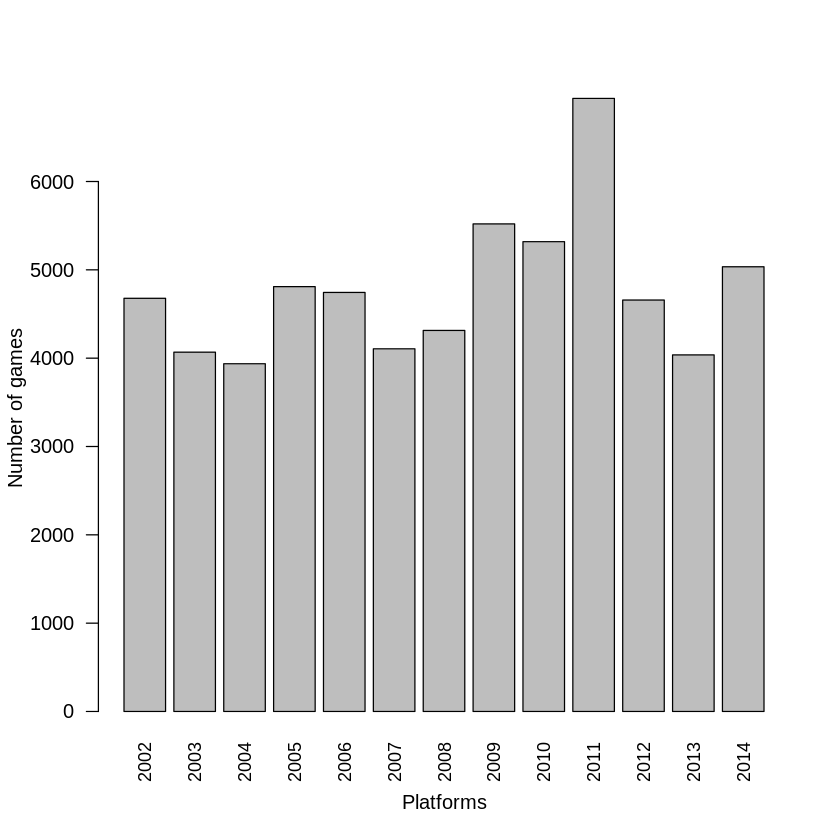

In [ ]:
# Calculating total number of created games per year
temp_games <- cbind(temp_games_bar)
temp_games$Platform <- character_to_class(temp_games, "Platform")$append_column
temp_games <- temp_games %>% group_by(YearofRelease) %>% summarize(sum(Platform))

# Renaming the columns
names(temp_games) <- c("YearOfRelease", "freq")

# Making a barplot of number of games and platforms
barplot(temp_games$freq,
        names.arg = temp_games$YearOfRelease,
        xlab="Platforms",
        ylab="Number of games",
        horiz = FALSE,
        las = 2,
        cex.names = 0.9)

#### BARPLOT: Analysis of platforms with the greatest profit

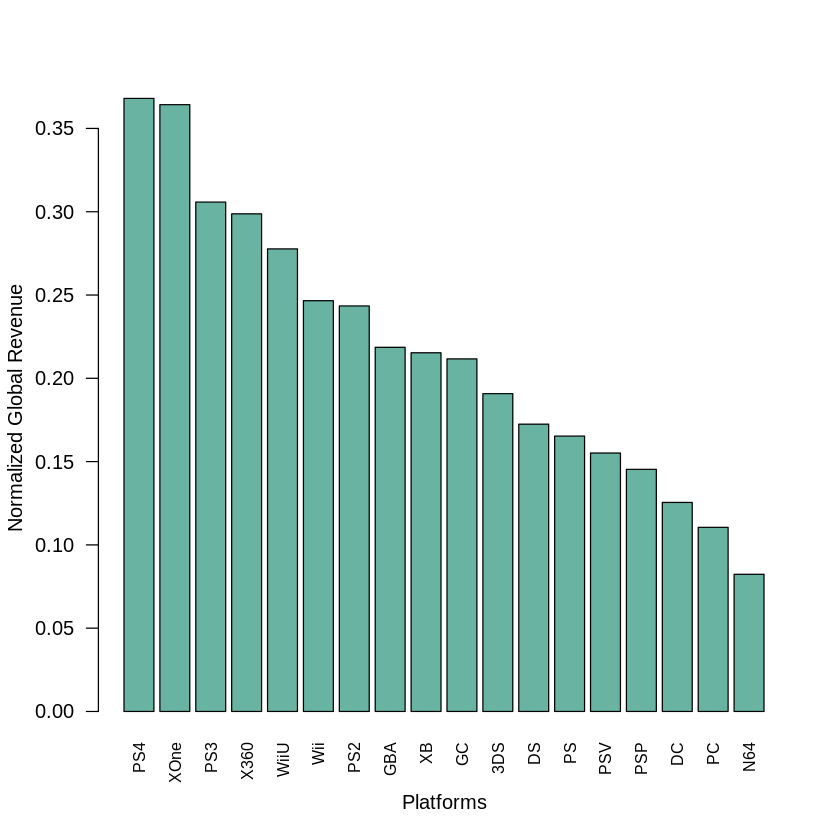

In [ ]:
#Calculating mean values per platform and ordering the df
temp_games <- temp_games_bar %>% group_by(Platform) %>% summarize(mean(GlobalSales))
temp_games <- temp_games[order(temp_games$Platform),]

# Update colum names
names(temp_games) <- c("Platform", "GlobalSales")

# Order df with respect to the global sales value
temp_games <- temp_games %>%               
              as.data.frame() %>% 
              arrange(desc(GlobalSales))

# Plotting the graph
barplot(temp_games$GlobalSales,
        names.arg = temp_games$Platform,
        xlab="Platforms",
        ylab="Normalized Global Revenue",
        horiz = FALSE,
        col="#69b3a2",
        las = 2,
        cex.names = 0.8)

#### BARPLOT: Analysis of genre with the greastest revenue

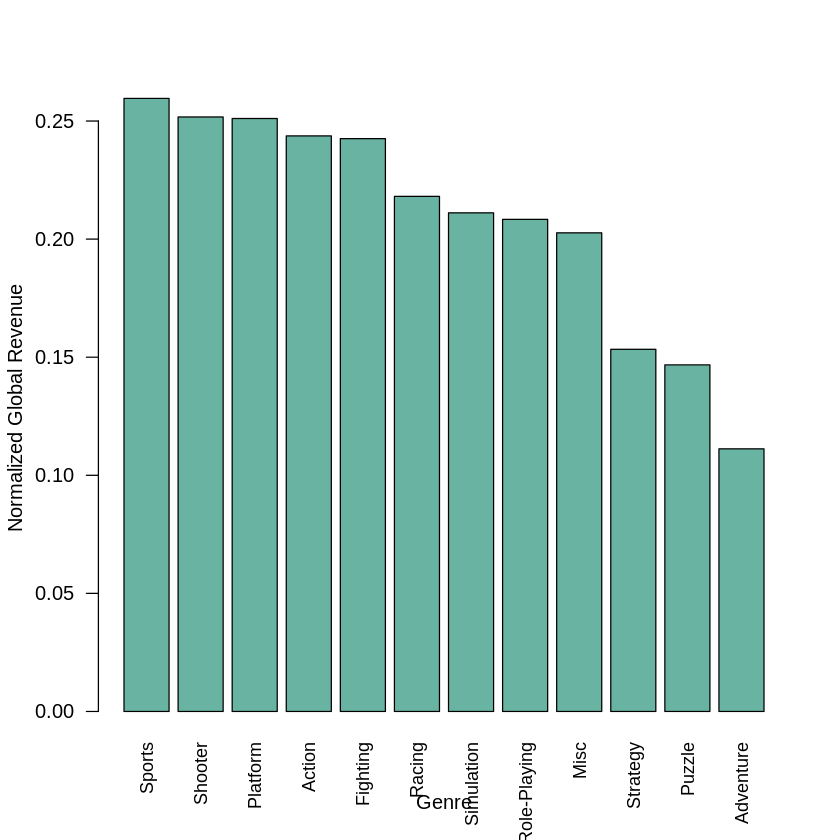

In [ ]:
#Calculating mean values per platform
temp_games <- temp_games_bar %>% group_by(Genre) %>% summarize(mean(GlobalSales))
temp_games<- temp_games[order(temp_games$Genre),]

# Update colum names
names(temp_games) <- c("Genre", "GlobalSales")

# Order table with respect to global sales value
temp_games <- temp_games %>%                
  as.data.frame() %>% 
  arrange(desc(GlobalSales))

# Barplot of average global sales per genre
barplot(temp_games$GlobalSales,
        names.arg = temp_games$Genre,
        xlab="Genre",
        ylab="Normalized Global Revenue",
        horiz = FALSE,
        col="#69b3a2",
        las = 2,
        cex.names = 0.9)

#### BARPLOT: Analysis of ratings with the greatest revenue

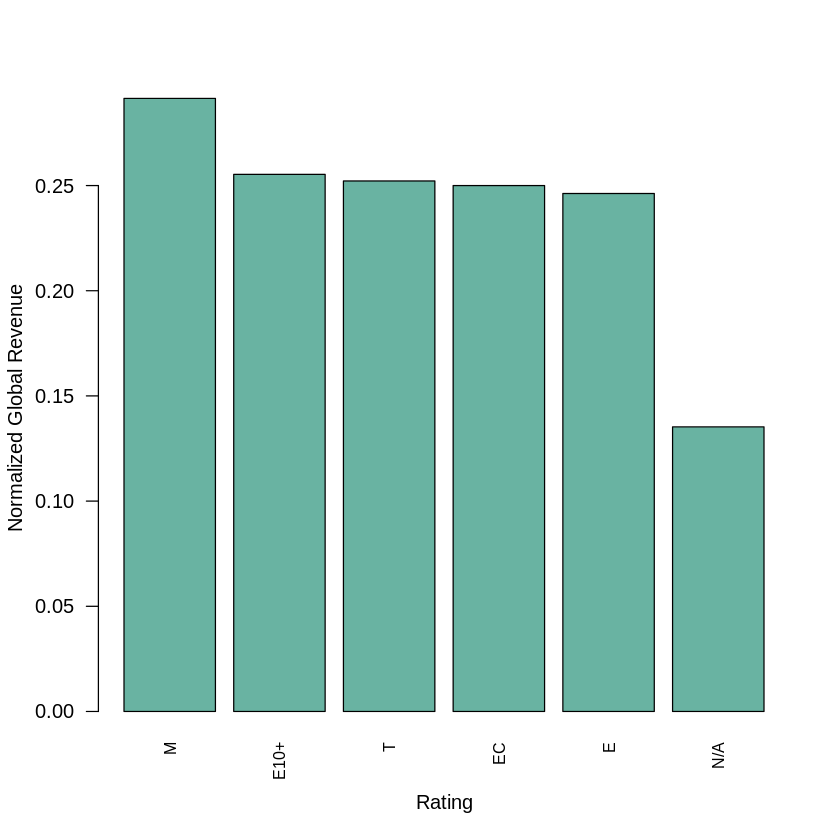

In [ ]:
#Calculating mean values per platform
temp_games <- temp_games_bar %>% group_by(Rating) %>% summarize(mean(GlobalSales))
# temp_games<- temp_games[order(temp_games$Genre),]

# Update colum names
names(temp_games) <- c("Rating", "GlobalSales")

#Replacing NA values with "N/A"
temp_games$Rating[is.na(temp_games$Rating)] <- "N/A"

# Order table with respect to global sales value
temp_games <- temp_games %>%                
  as.data.frame() %>% 
  arrange(desc(GlobalSales))

# Barplot of the mean sales per rating
barplot(temp_games$GlobalSales,
        names.arg = temp_games$Rating,
        xlab="Rating",
        ylab="Normalized Global Revenue",
        horiz = FALSE,
        col="#69b3a2",
        las = 2,
        cex.names = 0.8)

## Linear Regression

Creating Test/Train datasets

In [ ]:
to_be_removed <- c("UserCount", "CriticCount", "UserScore", "CriticScore")

# Create train and test datasets
games_analysis <- cbind(games)

# Appending 'N/A' to missing values of Rating,Genre,Platform,
# because it has to be converted into classes
games_analysis$Rating[is.na(games_analysis$Rating)] <- 'NA' 
games_analysis$Genre[is.na(games_analysis$Genre)] <- 'NA'
games_analysis$Platform[is.na(games_analysis[,"Platform"])] <- 'NA'

# function character_to_class returns us a dict and new column to be 
# replaced, thus we will save both in case we need it later
results_genre <- character_to_class(games_analysis, "Genre")
games_analysis$Genre <- results_genre$append_column

results_platform <- character_to_class(games_analysis, "Platform")
games_analysis$Platform <- results_platform$append_column

results_rating <- character_to_class(games_analysis, "Rating")
games_analysis$Rating <- results_rating$append_column

# Shufffling the dataset, removing character columns angames_analysisd removing unnecessary columns
games_analysis <- modify_dataset(games_analysis, shuffle=TRUE, remove_char_columns=TRUE, remove_col=to_be_removed, dict_rename_col=NA)

# Splitting the dataset
training_boundary <- round(nrow(games_analysis)*(DATASET_SPLIT))

# Creating TEST/TRAIN dataset
train_set <- games_analysis[1:training_boundary, ]
test_set <- games_analysis[-(1:training_boundary), ]

 [1] "Misc"         "Action"       "Simulation"   "Fighting"     "Puzzle"      
 [6] "Sports"       "Role-Playing" "Racing"       "Platform"     "Shooter"     
[11] "Adventure"    "Strategy"    
 [1] "DS"   "Wii"  "PS2"  "X360" "XB"   "PS3"  "WiiU" "GC"   "GBA"  "PSP" 
[11] "3DS"  "PS4"  "XOne" "PSV"  "PC"   "PS"   "DC"   "N64" 
[1] "E"    "E10+" "T"    "M"    NA     "EC"  


#### LINEAR CLASSIFIER: Franchise - GlobalSales

In [ ]:
#Columns that need to be removed
to_be_removed <- c("NASales", "EUSales", "JPSales", "OtherSales", "UserScore", "CriticScore")

#Creating a customized train/test DFs
train_set_global_sales <- train_set[,!names(train_set) %in% to_be_removed]
test_set_global_sales <- test_set[,!names(test_set) %in% to_be_removed]

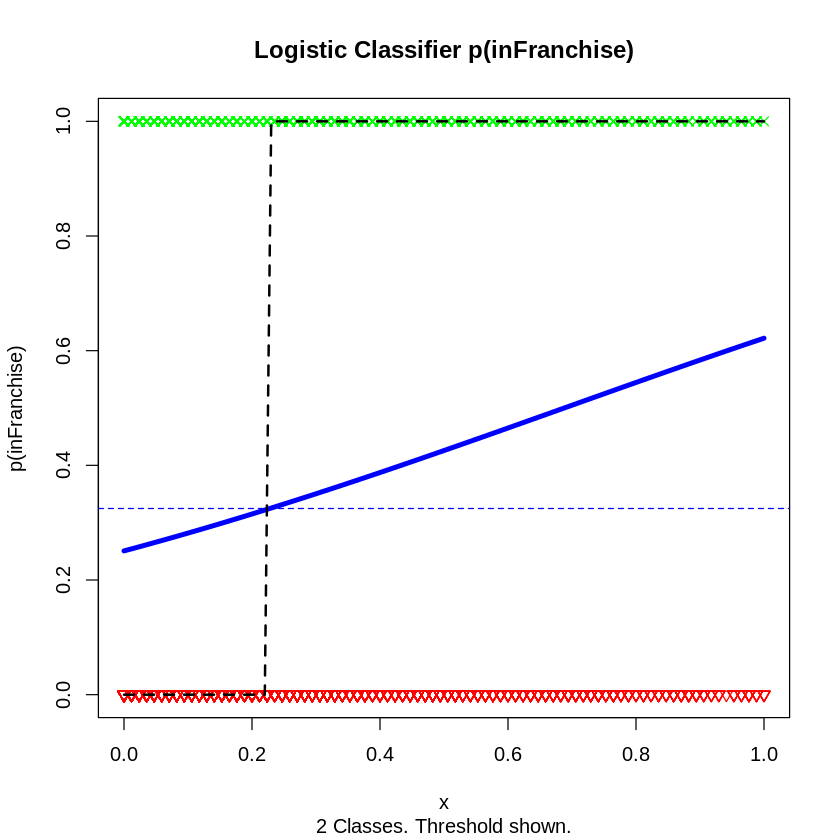

In [ ]:
threshold<-mean(train_set_global_sales$inFranchise)
# threshold<-mean(train_set_global_sales$GlobalSales[train_set_global_sales$inFranchise==1])

logisticModel <- NscatterPlotLogisticRegression(dataset=train_set_global_sales,
                                             outputName="inFranchise",
                                             predictorName="GlobalSales",
                                             threshold=threshold)

#### Confusion matrix and ROC Curve

In [ ]:
# Calculating the confusion matrix of the logistic model
confusion <- Npredict(dataset=train_set_global_sales, outputName="GlobalSales", predictorName="inFranchise",  logisticModel = logisticModel)
print("TRAIN DATASET RESULTS")
print(confusion)
print(NcalcConfusion(confusion))


Call:  glm(formula = formular, family = quasibinomial, data = dframe)

Coefficients:
(Intercept)            x  
     -1.095        1.591  

Degrees of Freedom: 7582 Total (i.e. Null);  7581 Residual
Null Deviance:	    9560 
Residual Deviance: 9334 	AIC: NA
[1] "TRAIN DATASET RESULTS"
              actualClass
predictedClass FALSE TRUE
         FALSE  4602  519
         TRUE   1993  469


Warning message in (TP + FP) * (TP + FN) * (TN + FP):
“NAs produced by integer overflow”


$TP
[1] 469

$FN
[1] 519

$TN
[1] 4602

$FP
[1] 1993

$accuracy
[1] 66.87327

$pgood
[1] 19.04955

$pbad
[1] 89.86526

$FPR
[1] 30.21986

$TPR
[1] 47.46964

$mcc
[1] NA



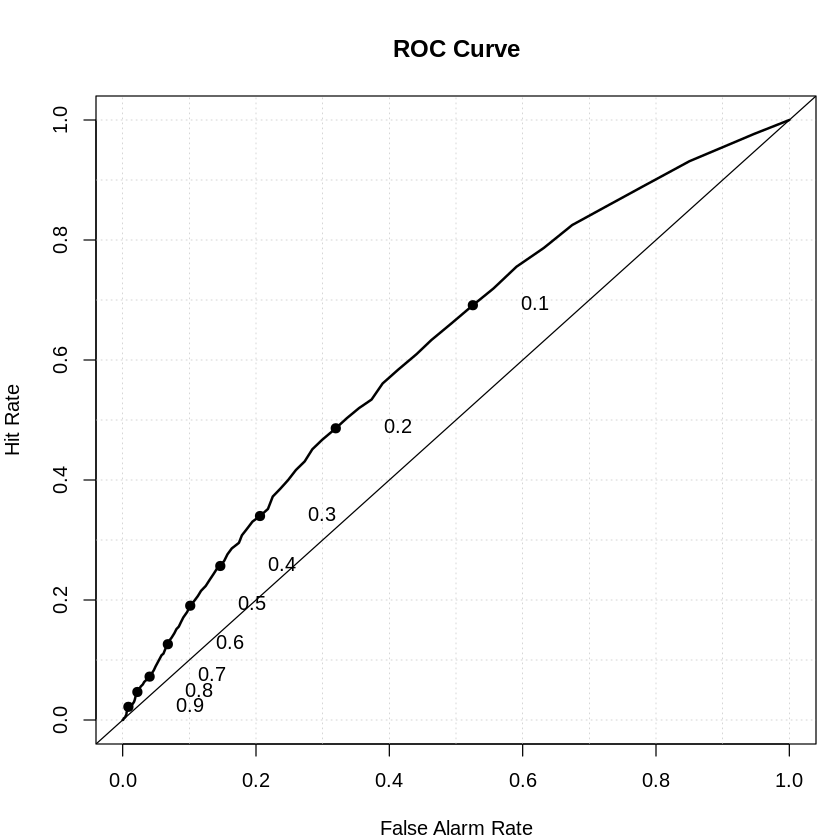

In [ ]:
# Getting the predictor and the output
x <- train_set$inFranchise
y <- train_set$GlobalSales

# Plotting a ROC curve
data <- data.frame(x,y)
data<-data.frame(x,y)
names(data)<-c("yes","no")
roc.plot(data$yes, data$no)

In [ ]:
#Making a copy of games
gamesForLinear <- cbind(games)

#Replacing NA values with 0
gamesForLinear$Rating[is.na(gamesForLinear$Rating)] <- "NA" 

# One-hot encoding columns
gamesForLinear <- hot_encode(gamesForLinear, c("Genre", "Platform", "Rating"))

# Shuffling the dataset
gamesForLinear <- gamesForLinear[sample(1:nrow(gamesForLinear)), ]

# Removing an outlier that was noticed during the linear regression testing
# gamesForLinear <- gamesForLinear %>% filter(Name != "ColinMcRae Rally 2.0")

# Remove User and Critic Count from the dataset
gamesForLinear<-gamesForLinear %>% 
               select(-UserCount,-CriticCount,-UserScore,-CriticScore,-GenrePlatform)

# Remove all the character fields from the dataset for Linear regression training
gamesForLinear<-gamesForLinear[, sapply(gamesForLinear, class) != 'character']

# Change column names to the desired ones
gamesForLinear <- alterDataframeNames(gamesForLinear, column_change)

# Splitting the dataset
training_boundary <- round(nrow(gamesForLinear)*(DATASET_SPLIT))

# Creating a train and test dataset
train_set <- gamesForLinear[1:training_boundary, ]
test_set <- gamesForLinear[-(1:training_boundary), ]

print(nrow(train_set))
print(nrow(test_set))

[1] "Genre"
[1] "Platform"
[1] "Rating"
[1] 7583
[1] 3250


In [ ]:
## Adding "Other" to the REGIONS variable and removing the spacings
regions <- cbind(REGIONS)
regions <- rbind(regions, "Other")
regions <- as.vector(
  apply(regions, 2, function(x) gsub("\\s+", "", x))
)
        
regions

[1] "NorthernAmerica" "Japan"           "Europe"          "Other"

[1] "NorthernAmerica"
[1] "Calculated r^2 with all variables added= 0.44"
                 Overall
RatingE        41.171621
RatingT        36.626419
RatingE10.     32.650598
RatingM        29.915598
PlatformPC     13.970959
PlatformPSP     8.531580
inFranchise     8.364742
GenreAdventure  7.862843
PlatformPS2     7.702592
PlatformPSV     7.276677
[1] "Japan"
[1] "Calculated r^2 with all variables added= 0.37"
                    Overall
RatingE           31.261442
RatingE10.        24.873821
RatingT           21.506573
GenreRole.Playing 15.801414
RatingM           13.997905
inFranchise       10.115729
PlatformPSV        7.523575
PlatformPSP        7.421424
Platform3DS        7.263764
GenreFighting      6.856617


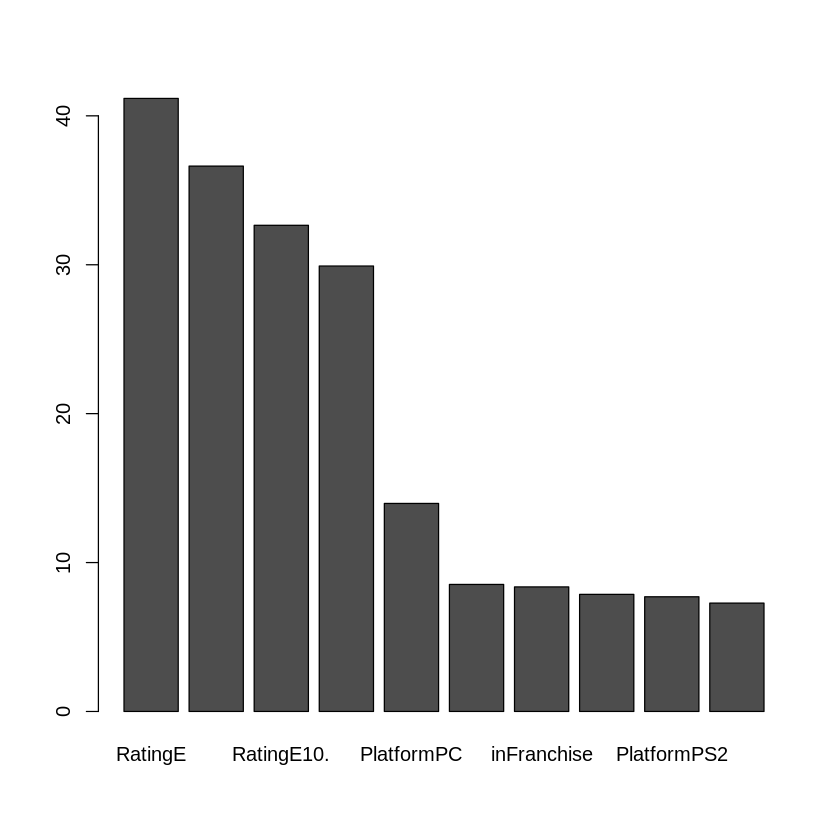

[1] "Europe"
[1] "Calculated r^2 with all variables added= 0.28"
                    Overall
RatingM           20.067679
RatingT           19.588053
RatingE10.        16.276154
RatingE           14.749227
Europe_ageMedian  10.424925
YearofRelease      9.527940
GenreAdventure     8.829334
PlatformPSP        8.021724
GenreRole.Playing  7.595756
PlatformDS         7.545147


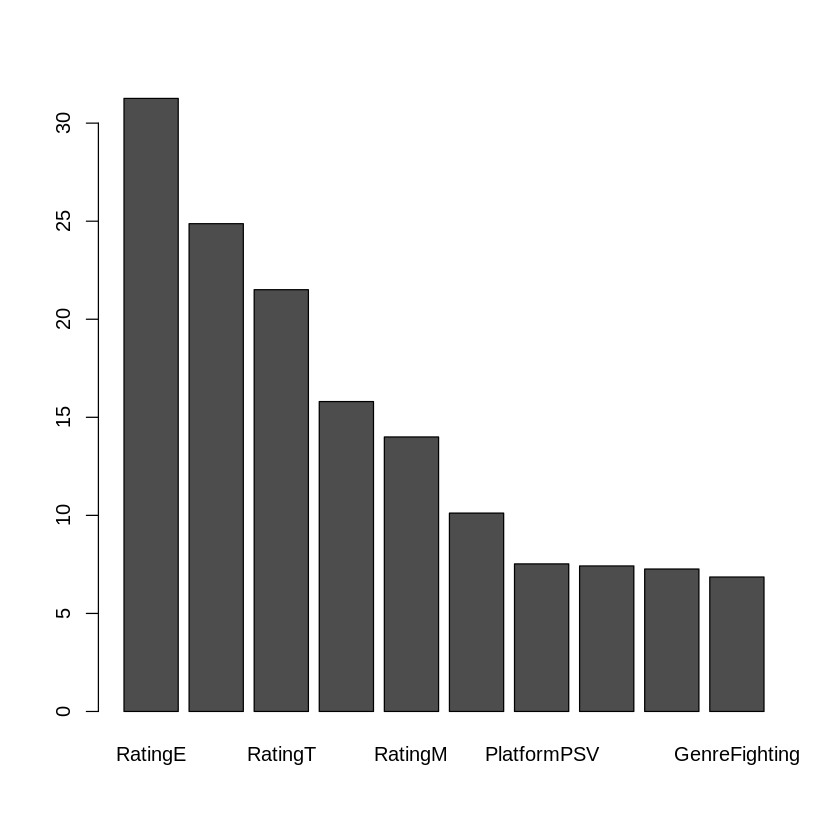

[1] "Other"
[1] "Calculated r^2 with all variables added= 0.33"
                 Overall
RatingE        27.946837
RatingT        27.764379
RatingM        25.218943
RatingE10.     24.797106
PlatformGBA     9.521094
PlatformGC      9.341778
inFranchise     9.121338
PlatformXB      8.654070
GenreAdventure  8.106411
PlatformPC      6.375653


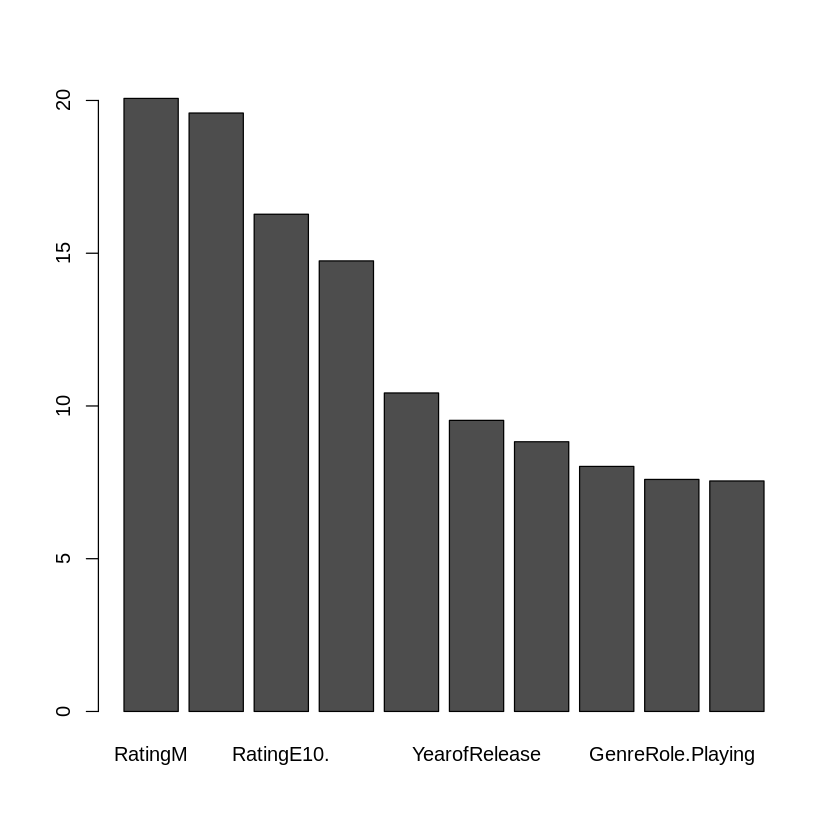

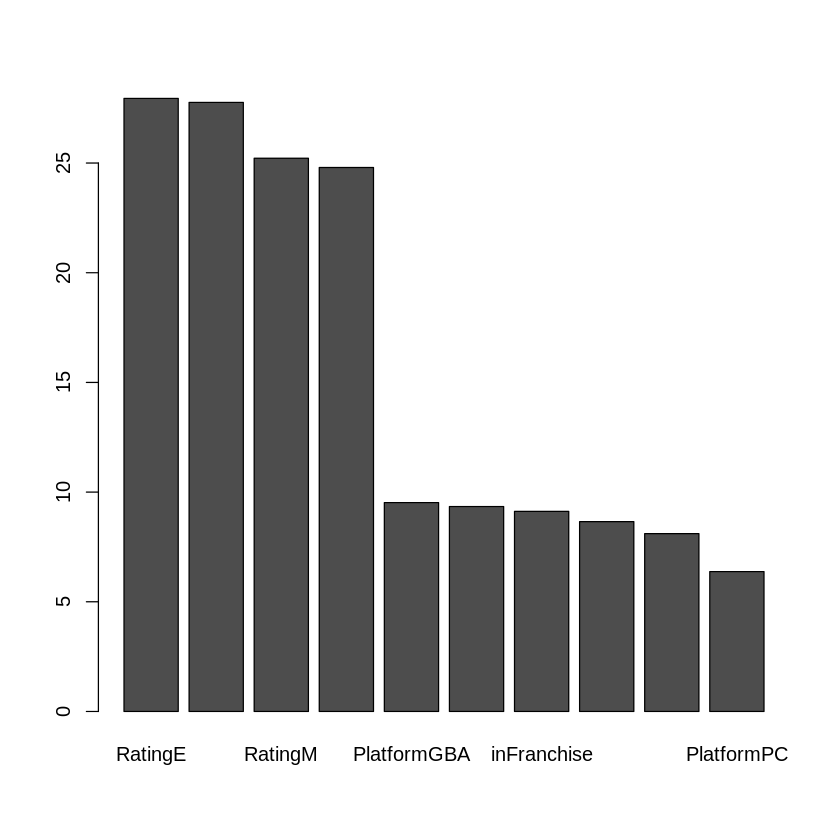

In [ ]:
# Creating an empty matrix where regions and r^2 will be appended
r2_regions <- data.frame(matrix(ncol = 2, nrow = 0))
# Changing the names of the columns
names <- c("region", "r^2")
colnames(r2_regions) <- names

# Iterating through each of the regions
for(region in regions){
    # Make a copy of the train set without Global Sales
    tmp <- cbind(train_set[which(names(train_set)!="GlobalSales")])
    
    print(region)
    
    # Remove all the columns that belong to other regions
    remove_reg <- regions[which(regions != region)]
    matchExpression <- paste(remove_reg, collapse ="|")
    tmp <- tmp %>% select(-matches(matchExpression))
    
    # Get the output sales for that region
    output <- paste(region, "sales", sep="_")
    
    # Transforming the output
    tmp[, output]<- log(tmp[, output] + 0.01)
    
    formula <- paste0(output,'~.-(RatingNA)')
    
    # Training a linear model    
    linearModelPerRegion <- lm(formula, data=tmp)  
    
    #This calculates the r squared value - a measure of fit
    r2<-round(Nr2(linearModelPerRegion),digits=2)
    print(paste("Calculated r^2 with all variables added=",r2))

    # Saving the r^2 for this region
    r2_regions <- appendToDataframe(r2_regions, c(region,r2))
    
    
    # Use caret library to determine scaled "importance"
    importance<-as.data.frame(caret::varImp(linearModelPerRegion, scale = TRUE))
    
    # Get the most "important" values in order
    importance <- importance[rev(order(importance$Overall))[1:10],,drop=FALSE]
    print(importance)

    
    # Plot the % importance ordered from lowest to highest
    barplot(t(importance))
}

In [ ]:
# Making a copy of the train set to train a linear model on the global sales
tmp <- cbind(train_set)
# Transforming the global sales by using logarithmic function
tmp[, "GlobalSales"]<- log(train_set[, "GlobalSales"] + 0.01)

# Removing other sales from training
formula <- paste0("GlobalSales",'~.-(Japan_sales + NorthernAmerica_sales + Europe_sales + Other_sales + RatingNA)')

# Training a linear model
linearModel <- lm(formula, data=tmp)  

# Calculating R^2
r2<-round(Nr2(linearModel),digits=2)
print(paste("Calculated r^2 with all variables added=",r2))

# Use caret library to determine scaled "importance"
importance<-as.data.frame(caret::varImp(linearModel, scale = TRUE))

# Printing the importance of different variables
print(importance[rev(order(importance$Overall))[1:10],,drop=FALSE])

[1] "Calculated r^2 with all variables added= 0.23"
                 Overall
RatingM        17.700132
RatingT        17.457750
RatingE        17.292023
inFranchise    15.767525
RatingE10.     15.378774
PlatformPC      9.232321
GenreAdventure  9.048181
PlatformXB      5.942374
PlatformGBA     5.715536
PlatformGC      5.599921


Warning message:
“`group_by_()` was deprecated in dplyr 0.7.0.
ℹ Please use `group_by()` instead.
ℹ See vignette('programming') for more help
ℹ The deprecated feature was likely used in the dplyr package.
  Please report the issue at <https://github.com/tidyverse/dplyr/issues>.”


[1] "NorthernAmerica_sales"             "NorthernAmerica_femaleRatioMedian"
[1] "NorthernAmerica_sales"     "NorthernAmerica_ageMedian"


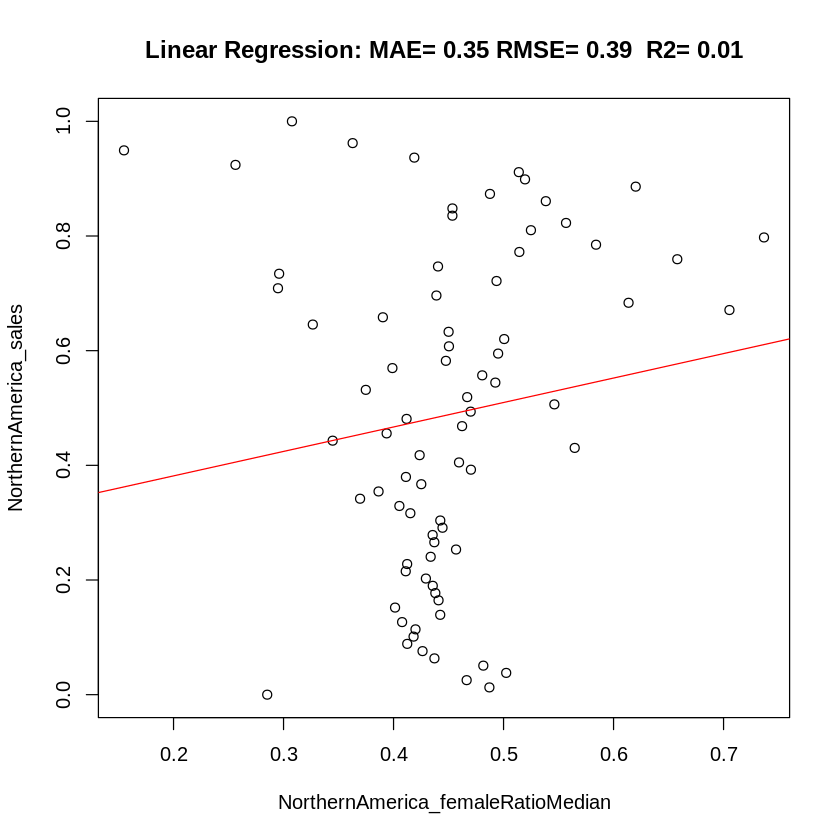

[1] "Japan_sales"             "Japan_femaleRatioMedian"


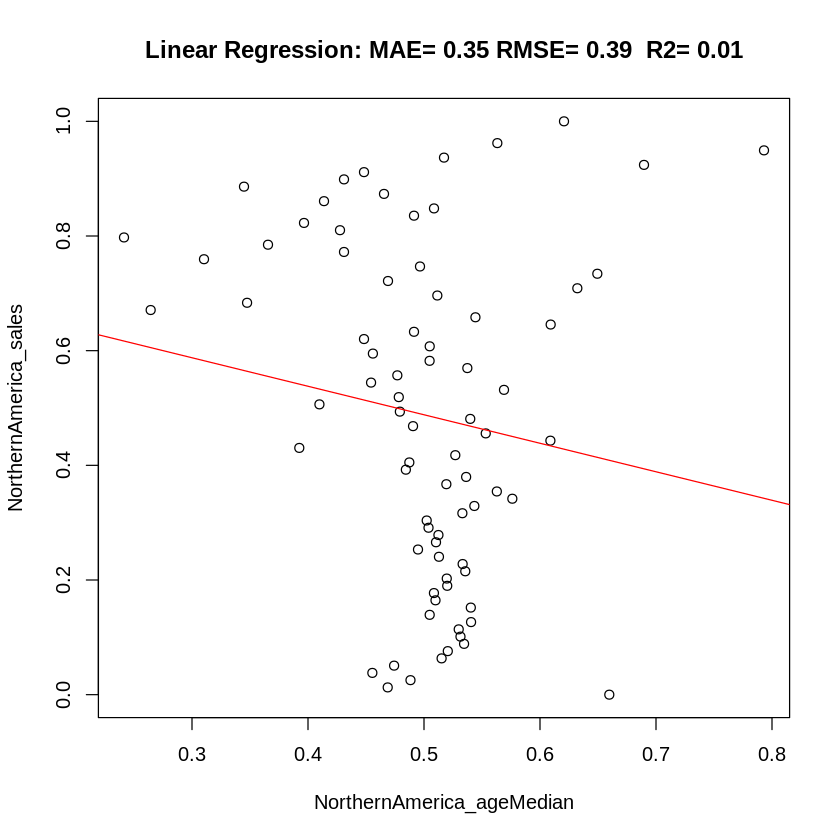

[1] "Japan_sales"     "Japan_ageMedian"


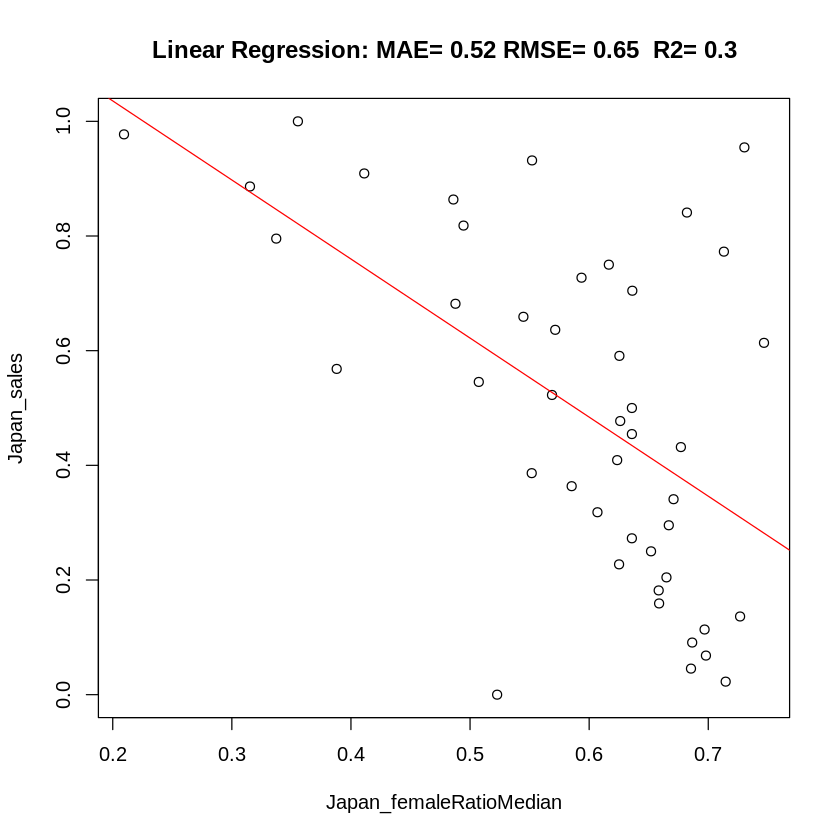

[1] "Europe_sales"             "Europe_femaleRatioMedian"


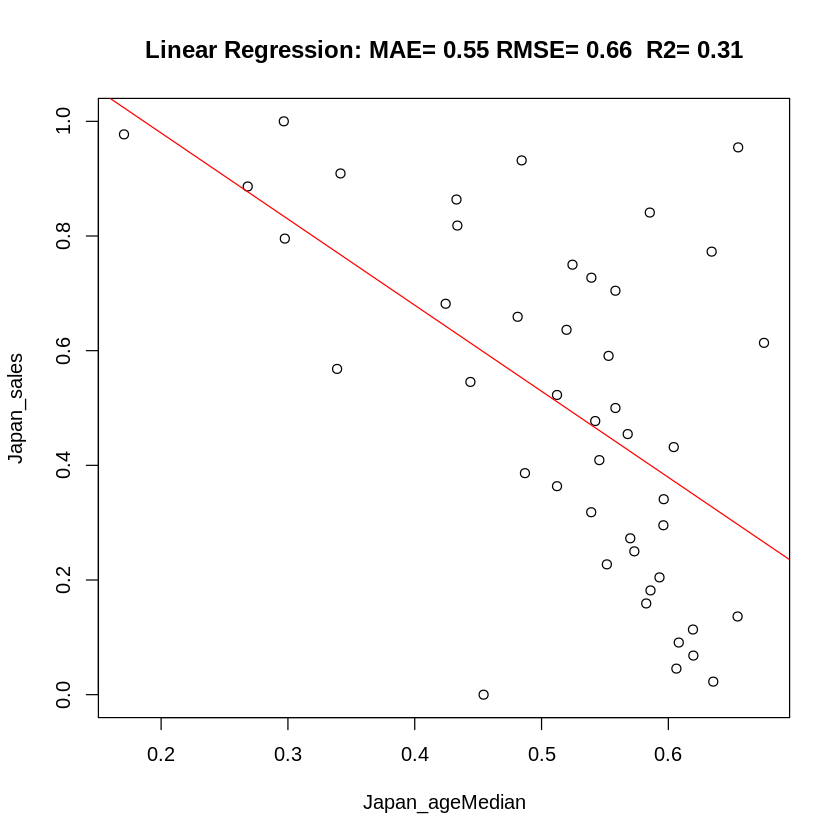

[1] "Europe_sales"     "Europe_ageMedian"


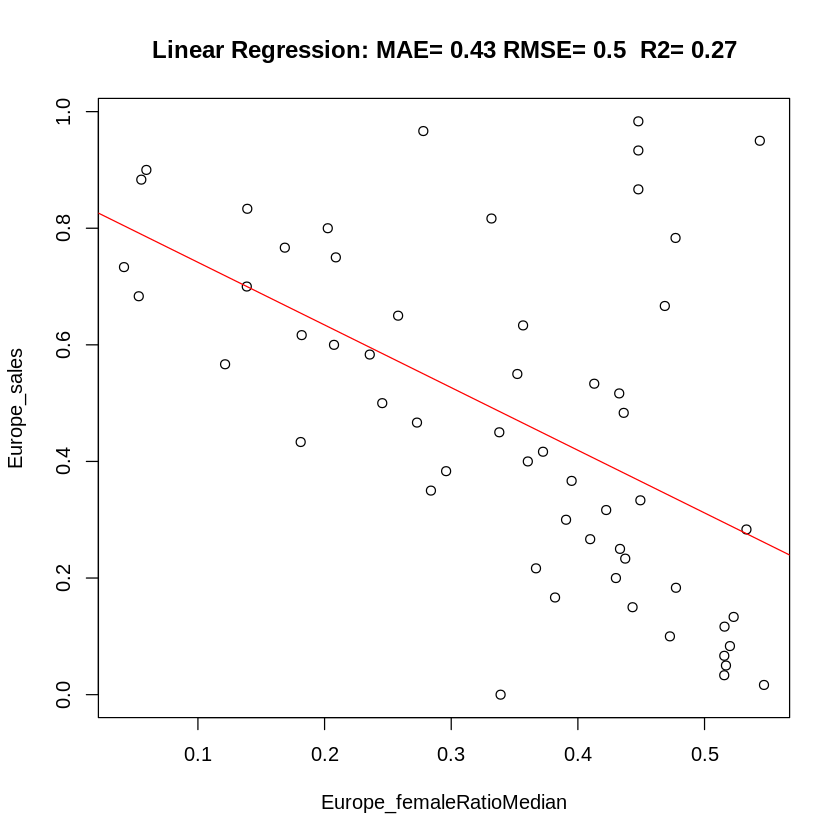

[1] "Other_sales"             "Other_femaleRatioMedian"


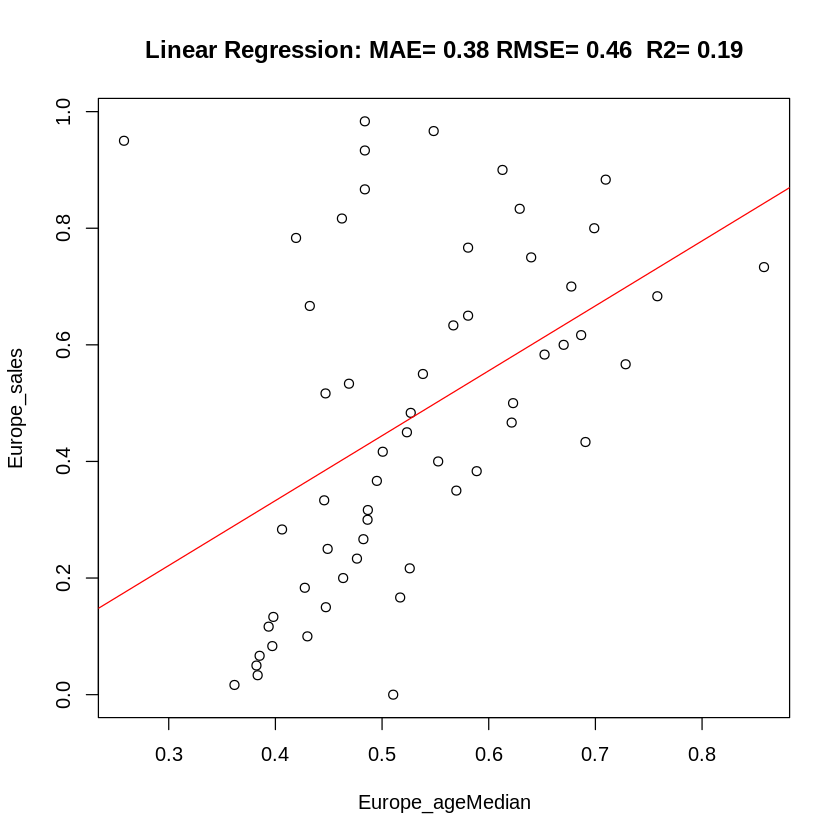

[1] "Other_sales"     "Other_ageMedian"


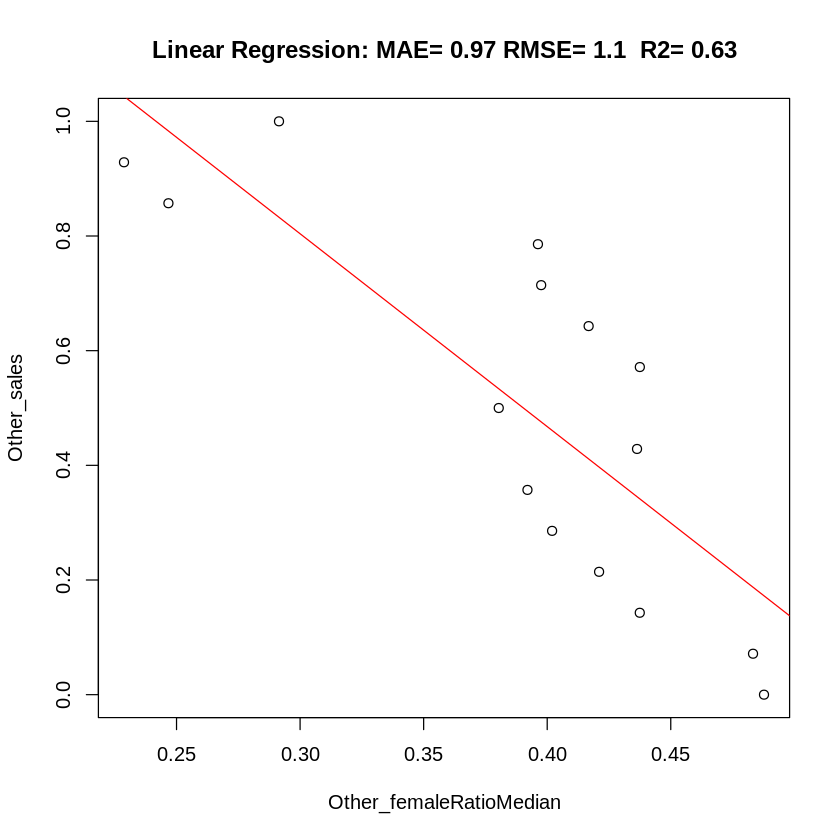

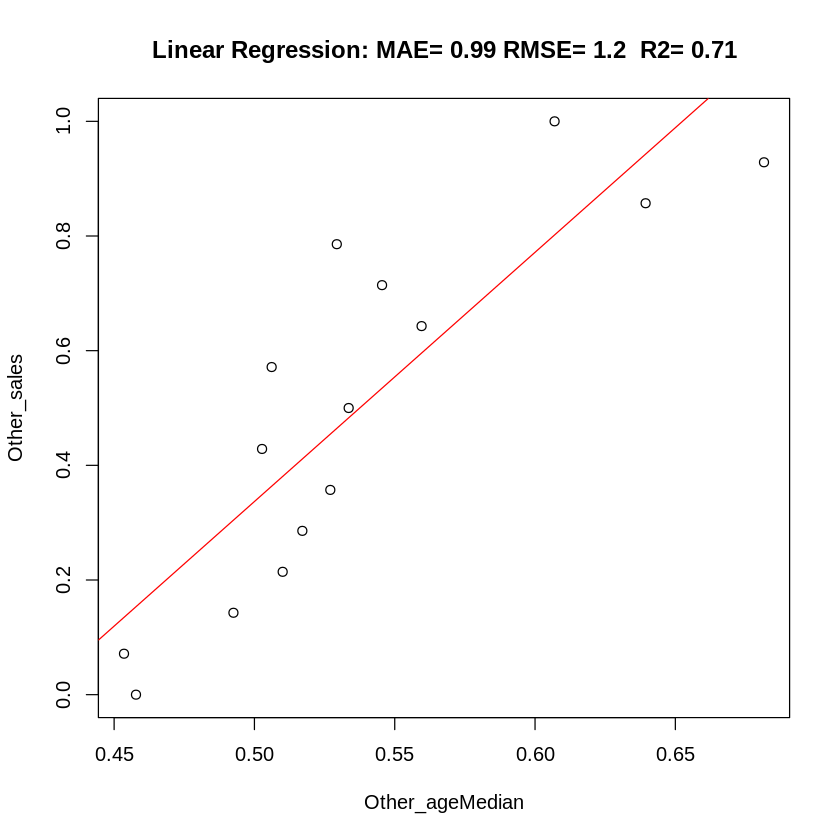

In [ ]:
# Iterate through regions
for (region in regions) {
    # Set the output to be the sales from the current region
    output <- paste0(region, "_sales")
    
    # Setting the predictor to the region's gender ratio and training a linear model
    femalePredictor <- paste0(region,"_femaleRatioMedian")
    linearRegressionPlotPredict(train_set, test_set, femalePredictor, output)
    
    # Setting the predictor to the region's age median and training a linear model
    agePredictor <- paste0(region,"_ageMedian")
    linearRegressionPlotPredict(train_set, test_set, agePredictor, output)
}

## Clustering

In [ ]:
#Make a copy of games for clustering
gamesForClustering <- subset(games, select = -c(CriticScore, UserScore, CriticCount, UserCount))

#Encode ordered rating
gamesForClustering <- gamesForClustering[complete.cases(gamesForClustering$Rating),]
orderedRating<-c("E","EC","E10+","T", "M")
gamesForClustering<-NPREPROCESSING_encodeOrderedSymbols(gamesForClustering, 'Rating', orderedRating)
#Encode categorical columns
catagoricalColumns <- c("Genre", "Platform")
catagoricalReadyforClustering<-NPREPROCESSING_categorical(gamesForClustering[,catagoricalColumns])
gamesForClustering<-cbind(subset(gamesForClustering, select = -c(Genre, Platform)), catagoricalReadyforClustering)

#Remove NA's and keep only numeric fields for clustering
clustering_dataset<-gamesForClustering[complete.cases(gamesForClustering),]
clustering_dataset<-dplyr::select_if(clustering_dataset, is.numeric)

[1] "Genre"
[1] "Platform"


In [ ]:
genres <- c('GenreAction','GenreAdventure','GenreFighting',
'GenreMisc','GenrePlatform','GenrePuzzle','GenreRacing',
'GenreRole.Playing','GenreShooter','GenreSimulation','GenreSports',
'GenreStrategy')

#### KMeans

[1] "Optimal Number of Clusters found Through Silhouette Index: 3"
[1] "Summary for: GenreAction"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 599"
[1] "Average Global Sales: 0.655916723951684"
[1] "Percentages:"
[1] "High global sales: 0 %"
[1] "High NA sales: 0 %"
[1] "High JP sales: 0.333889816360601 %"
[1] "High EU sales: 0.333889816360601 %"
[1] "High Other sales: 1.83639398998331 %"
[1] "Games in franchise with high sales: 0 %"
[1] "Games in franchise: 45.2420701168614 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 39.0651085141903 %"
[1] "EC: 0 %"
[1] "E10+: 15.5258764607679 %"
[1] "T: 28.3806343906511 %"
[1] "M: 17.0283806343907 %"
[1] "Platform Frequencies of High Sale Games:"
data frame with 0 columns and 0 rows
[1] "Platform Frequencies"
     Platform3DS PlatformDS PlatformGBA PlatformGC PlatformPC PlatformPS2
4177          13         70          33         17         22         107
     PlatformPS3 Platfo

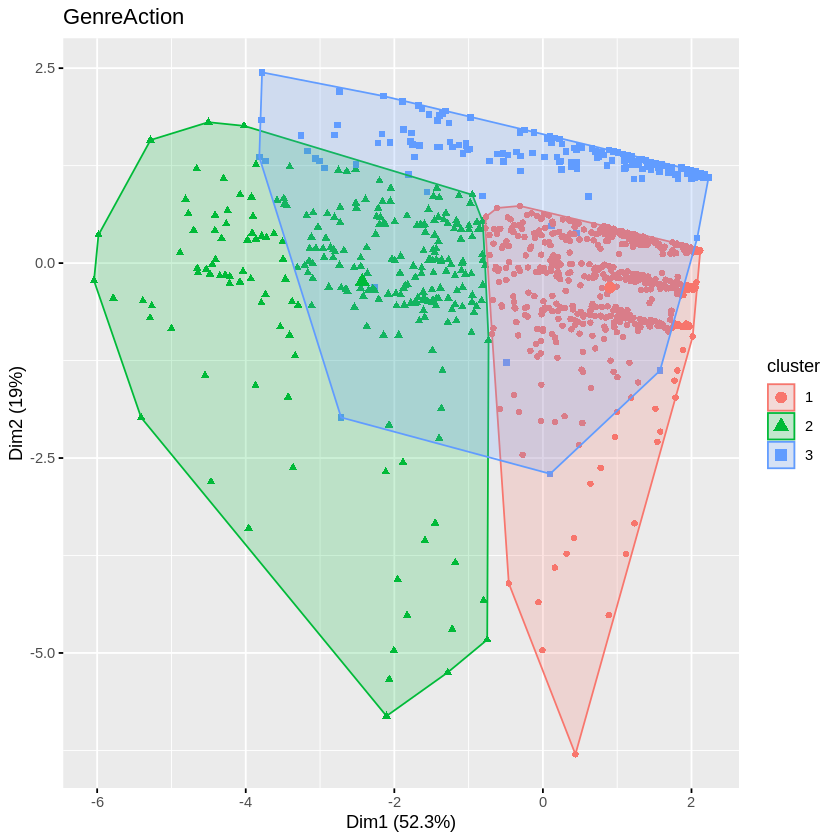

[1] "Summary for: GenreAdventure"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 111"
[1] "Average Global Sales: 0.905458399576047"
[1] "Percentages:"
[1] "High global sales: 53.1531531531532 %"
[1] "High NA sales: 7.20720720720721 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 5.40540540540541 %"
[1] "Games in franchise with high sales: 28.8288288288288 %"
[1] "Games in franchise: 51.3513513513513 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 40.5405405405405 %"
[1] "EC: 0 %"
[1] "E10+: 10.8108108108108 %"
[1] "T: 27.027027027027 %"
[1] "M: 21.6216216216216 %"
[1] "Platform Frequencies of High Sale Games:"
     Platform3DS PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformPSP
2632           1          7          4           9          12           2
     PlatformWii PlatformWiiU PlatformX360 PlatformXB
2632           8            1           10          5
[1] "Platform Frequencies"
  

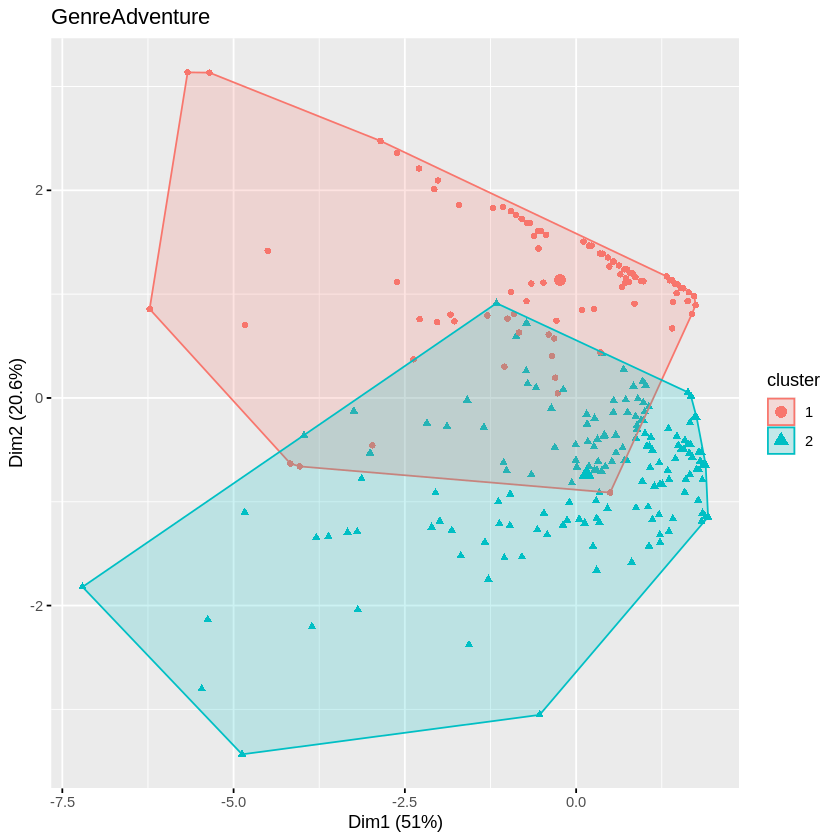

[1] "Summary for: GenreFighting"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 132"
[1] "Average Global Sales: 0.90632798573975"
[1] "Percentages:"
[1] "High global sales: 56.8181818181818 %"
[1] "High NA sales: 4.54545454545455 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 1.51515151515152 %"
[1] "High Other sales: 4.54545454545455 %"
[1] "Games in franchise with high sales: 36.3636363636364 %"
[1] "Games in franchise: 50 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 32.5757575757576 %"
[1] "EC: 0 %"
[1] "E10+: 15.1515151515152 %"
[1] "T: 31.0606060606061 %"
[1] "M: 21.2121212121212 %"
[1] "Platform Frequencies of High Sale Games:"
     Platform3DS PlatformDS PlatformGBA PlatformGC PlatformPS2 PlatformPS3
2632           1          9           1          5          11          12
     PlatformPSP PlatformPSV PlatformWii PlatformX360 PlatformXB PlatformXOne
2632           2           1           9           20      

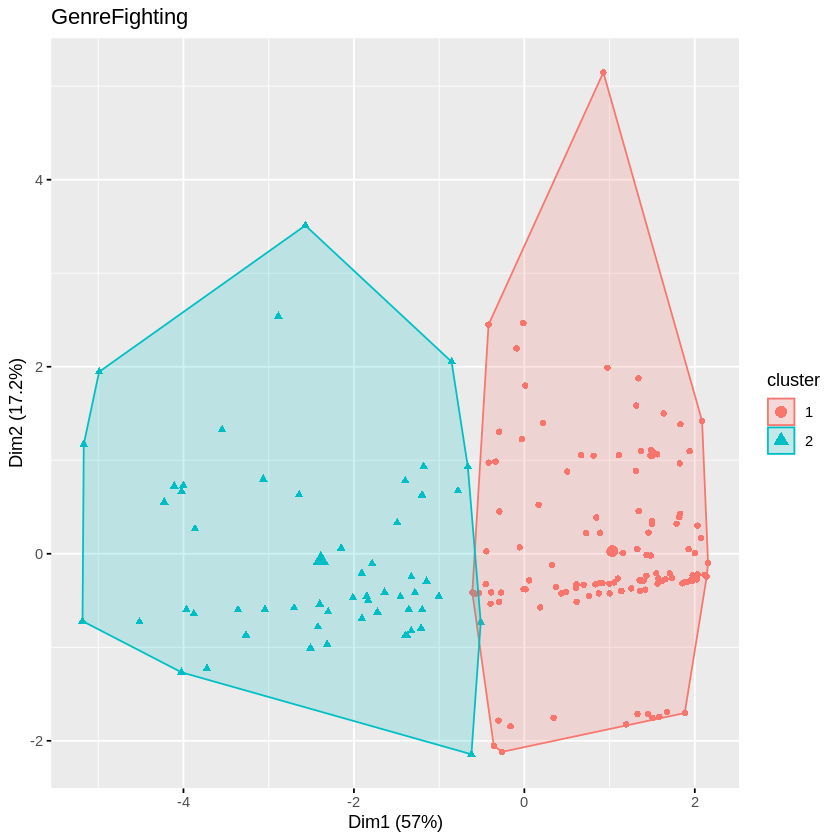

[1] "Summary for: GenreMisc"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 66"
[1] "Average Global Sales: 0.938146167557932"
[1] "Percentages:"
[1] "High global sales: 89.3939393939394 %"
[1] "High NA sales: 12.1212121212121 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 7.57575757575758 %"
[1] "Games in franchise with high sales: 57.5757575757576 %"
[1] "Games in franchise: 60.6060606060606 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 37.8787878787879 %"
[1] "EC: 0 %"
[1] "E10+: 12.1212121212121 %"
[1] "T: 24.2424242424242 %"
[1] "M: 25.7575757575758 %"
[1] "Platform Frequencies of High Sale Games:"
     Platform3DS PlatformDS PlatformGBA PlatformGC PlatformPS2 PlatformPS3
2623           2          7           1          1           8          12
     PlatformPSP PlatformPSV PlatformWii PlatformX360 PlatformXB PlatformXOne
2623           2           1           8           13          3

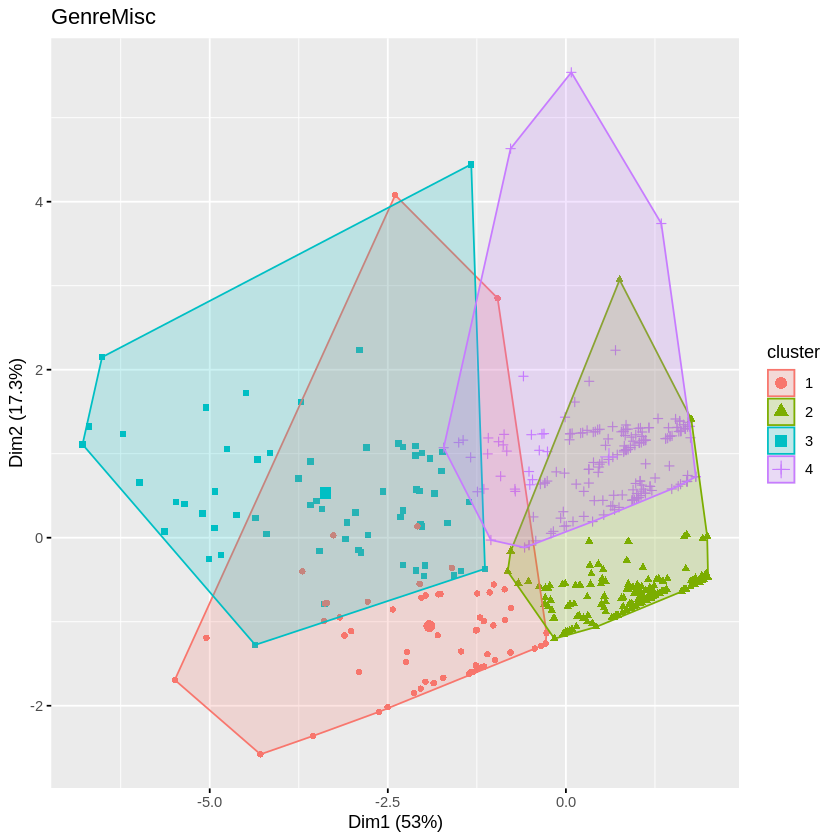

[1] "Summary for: GenrePlatform"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 34"
[1] "Average Global Sales: 0.970588235294118"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 23.5294117647059 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 11.7647058823529 %"
[1] "Games in franchise with high sales: 38.2352941176471 %"
[1] "Games in franchise: 38.2352941176471 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 38.2352941176471 %"
[1] "EC: 0 %"
[1] "E10+: 8.82352941176471 %"
[1] "T: 32.3529411764706 %"
[1] "M: 20.5882352941176 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGBA PlatformGC PlatformPS2 PlatformPS3 PlatformWii
2513          1           2          1           6           9           7
     PlatformX360 PlatformXB
2513            5          3
[1] "Platform Frequencies"
     PlatformDS PlatformGBA PlatformGC PlatformPS2 PlatformPS3 Pla

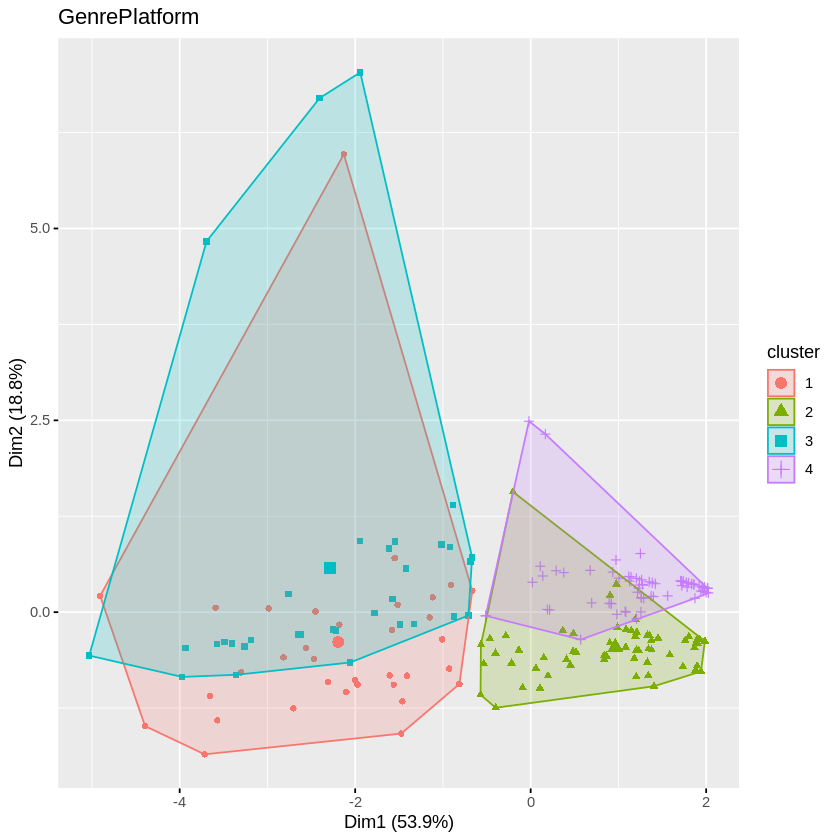

[1] "Summary for: GenrePuzzle"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 25"
[1] "Average Global Sales: 0.988235294117647"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 8 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 12 %"
[1] "Games in franchise with high sales: 40 %"
[1] "Games in franchise: 40 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 36 %"
[1] "EC: 0 %"
[1] "E10+: 12 %"
[1] "T: 28 %"
[1] "M: 24 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformWii PlatformWiiU
2451          2          2           2           8           5            1
     PlatformX360 PlatformXB
2451            4          1
[1] "Platform Frequencies"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformWii PlatformWiiU
2451          2          2           2           8           5            1
     PlatformX360 PlatformX

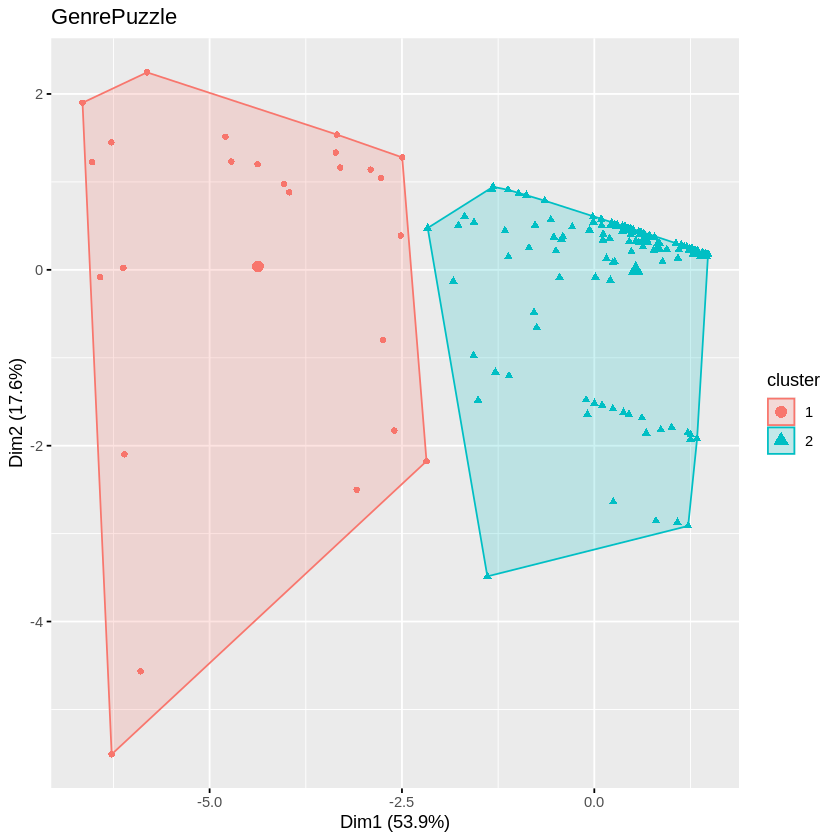

[1] "Summary for: GenreRacing"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 92"
[1] "Average Global Sales: 0.839897698209719"
[1] "Percentages:"
[1] "High global sales: 14.1304347826087 %"
[1] "High NA sales: 1.08695652173913 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 1.08695652173913 %"
[1] "High Other sales: 4.34782608695652 %"
[1] "Games in franchise with high sales: 9.78260869565217 %"
[1] "Games in franchise: 46.7391304347826 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 36.9565217391304 %"
[1] "EC: 0 %"
[1] "E10+: 16.304347826087 %"
[1] "T: 25 %"
[1] "M: 21.7391304347826 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformWii PlatformX360
2630          1          2           1           4           1            3
     PlatformXB
2630          1
[1] "Platform Frequencies"
     Platform3DS PlatformDS PlatformGBA PlatformGC PlatformPC PlatformPS2
3058 

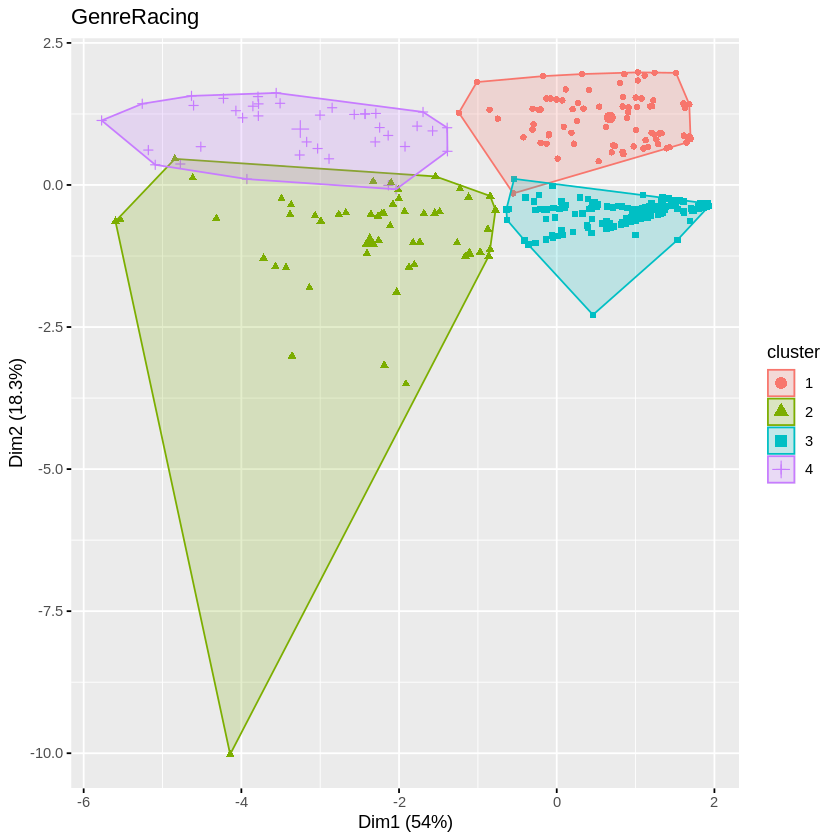

[1] "Summary for: GenreRole.Playing"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 270"
[1] "Average Global Sales: 0.839956427015251"
[1] "Percentages:"
[1] "High global sales: 13.3333333333333 %"
[1] "High NA sales: 0.37037037037037 %"
[1] "High JP sales: 0.740740740740741 %"
[1] "High EU sales: 1.11111111111111 %"
[1] "High Other sales: 4.81481481481481 %"
[1] "Games in franchise with high sales: 7.77777777777778 %"
[1] "Games in franchise: 46.2962962962963 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 35.9259259259259 %"
[1] "EC: 0 %"
[1] "E10+: 14.8148148148148 %"
[1] "T: 29.2592592592593 %"
[1] "M: 20 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGBA PlatformGC PlatformPS2 PlatformPS3 PlatformPSP
2632          4           1          2           5           6           1
     PlatformPSV PlatformWii PlatformX360 PlatformXB
2632           1           2           13          1
[1] "Platf

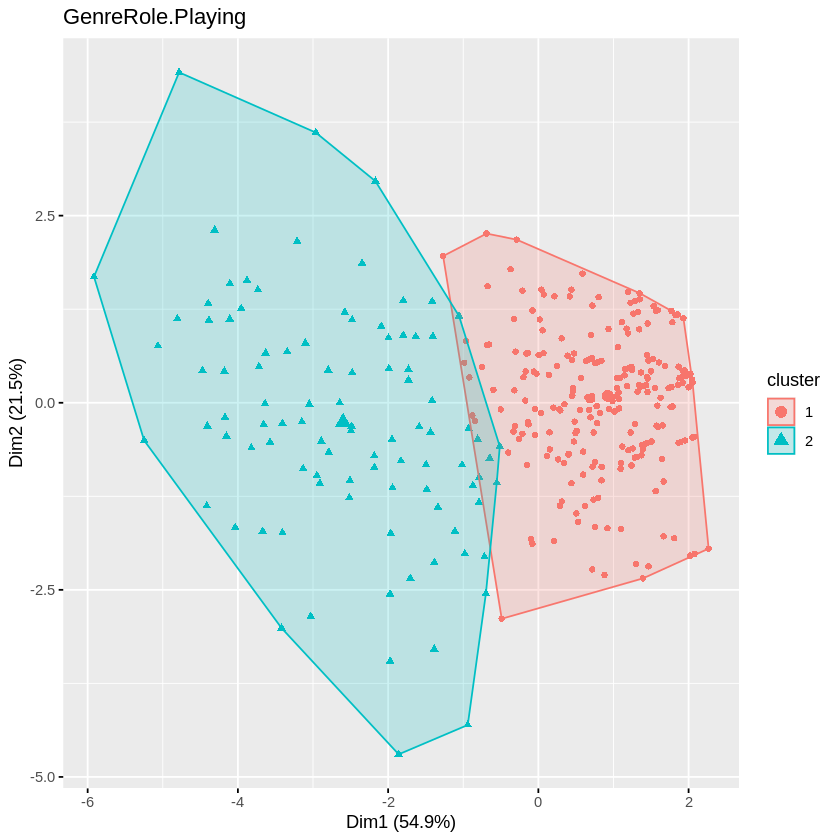

[1] "Summary for: GenreShooter"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 323"
[1] "Average Global Sales: 0.798579493716991"
[1] "Percentages:"
[1] "High global sales: 0.309597523219814 %"
[1] "High NA sales: 0 %"
[1] "High JP sales: 1.23839009287926 %"
[1] "High EU sales: 0.928792569659443 %"
[1] "High Other sales: 4.3343653250774 %"
[1] "Games in franchise with high sales: 0.309597523219814 %"
[1] "Games in franchise: 45.8204334365325 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 36.5325077399381 %"
[1] "EC: 0 %"
[1] "E10+: 12.3839009287926 %"
[1] "T: 33.7461300309598 %"
[1] "M: 17.3374613003096 %"
[1] "Platform Frequencies of High Sale Games:"
[1] 1
[1] "Platform Frequencies"
     Platform3DS PlatformDS PlatformGBA PlatformGC PlatformPC PlatformPS2
3218           6         33          19         14         19          43
     PlatformPS3 PlatformPS4 PlatformPSP PlatformPSV PlatformWii PlatformWiiU
3218        

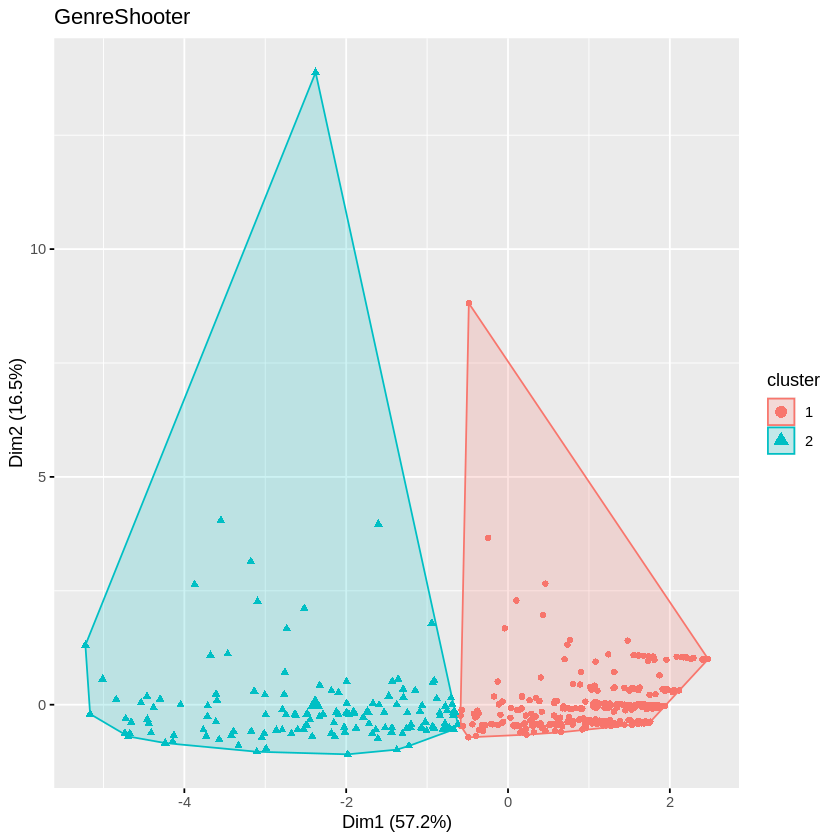

[1] "Summary for: GenreSimulation"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 173"
[1] "Average Global Sales: 0.839714382862972"
[1] "Percentages:"
[1] "High global sales: 15.606936416185 %"
[1] "High NA sales: 0.578034682080925 %"
[1] "High JP sales: 1.15606936416185 %"
[1] "High EU sales: 0.578034682080925 %"
[1] "High Other sales: 5.78034682080925 %"
[1] "Games in franchise with high sales: 8.67052023121387 %"
[1] "Games in franchise: 46.8208092485549 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 36.9942196531792 %"
[1] "EC: 0 %"
[1] "E10+: 14.4508670520231 %"
[1] "T: 31.7919075144509 %"
[1] "M: 16.7630057803468 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGBA PlatformGC PlatformPS2 PlatformPS3 PlatformPSP
2630          4           1          2           3           4           1
     PlatformWii PlatformX360
2630           2           10
[1] "Platform Frequencies"
     Platform3DS 

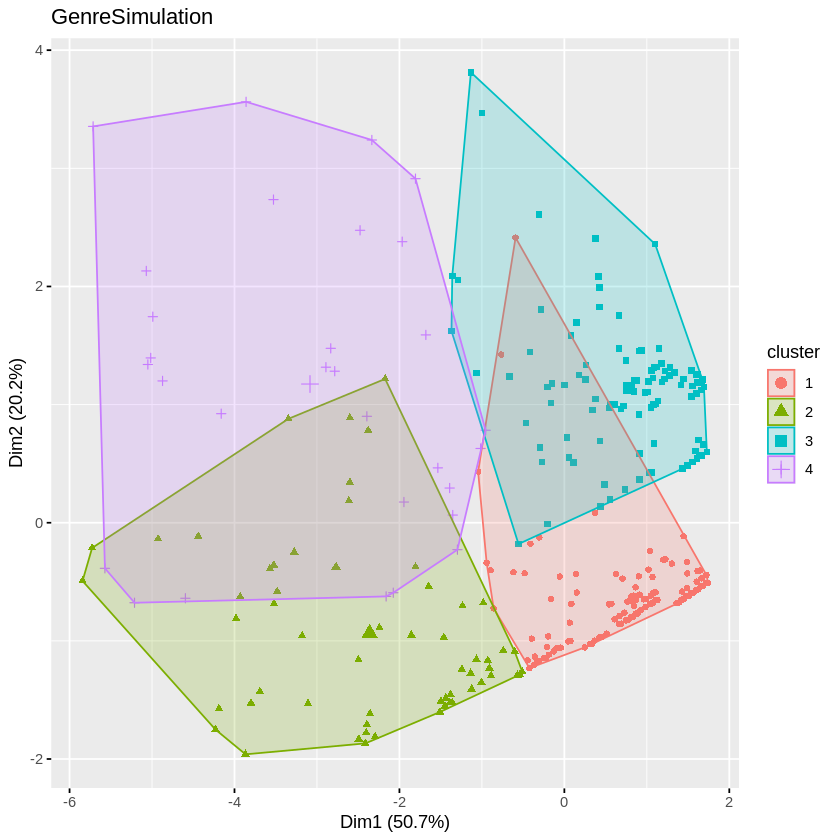

[1] "Summary for: GenreSports"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 148"
[1] "Average Global Sales: 0.755484896661367"
[1] "Percentages:"
[1] "High global sales: 3.37837837837838 %"
[1] "High NA sales: 0 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0.675675675675676 %"
[1] "High Other sales: 1.35135135135135 %"
[1] "Games in franchise with high sales: 2.02702702702703 %"
[1] "Games in franchise: 46.6216216216216 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 36.4864864864865 %"
[1] "EC: 0 %"
[1] "E10+: 14.1891891891892 %"
[1] "T: 30.4054054054054 %"
[1] "M: 18.9189189189189 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformPS2 PlatformPS3 PlatformX360
2591          1           1           1            2
[1] "Platform Frequencies"
     Platform3DS PlatformDS PlatformGBA PlatformGC PlatformPC PlatformPS2
3590           3         14          11          3          4          22
     Pl

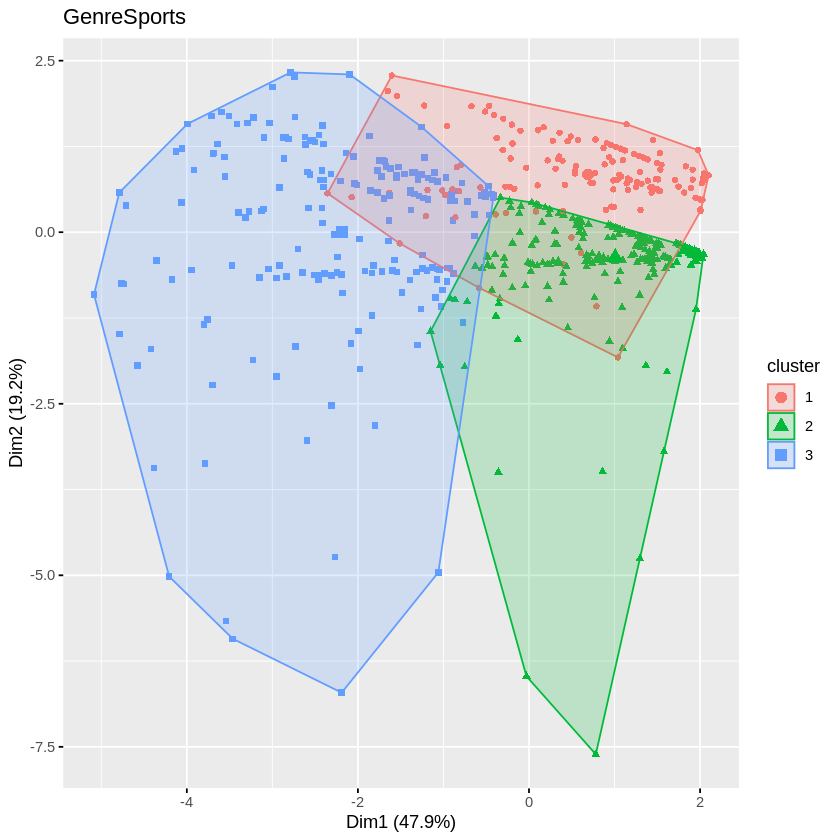

[1] "Summary for: GenreStrategy"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 37"
[1] "Average Global Sales: 0.923370429252782"
[1] "Percentages:"
[1] "High global sales: 72.972972972973 %"
[1] "High NA sales: 8.10810810810811 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 0 %"
[1] "Games in franchise with high sales: 48.6486486486487 %"
[1] "Games in franchise: 59.4594594594595 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 43.2432432432432 %"
[1] "EC: 0 %"
[1] "E10+: 10.8108108108108 %"
[1] "T: 27.027027027027 %"
[1] "M: 18.9189189189189 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGBA PlatformGC PlatformPS2 PlatformPS3 PlatformWii
2628          3           3          4           1           5           4
     PlatformX360 PlatformXB PlatformXOne
2628            5          1            1
[1] "Platform Frequencies"
     PlatformDS PlatformGBA PlatformGC Platf

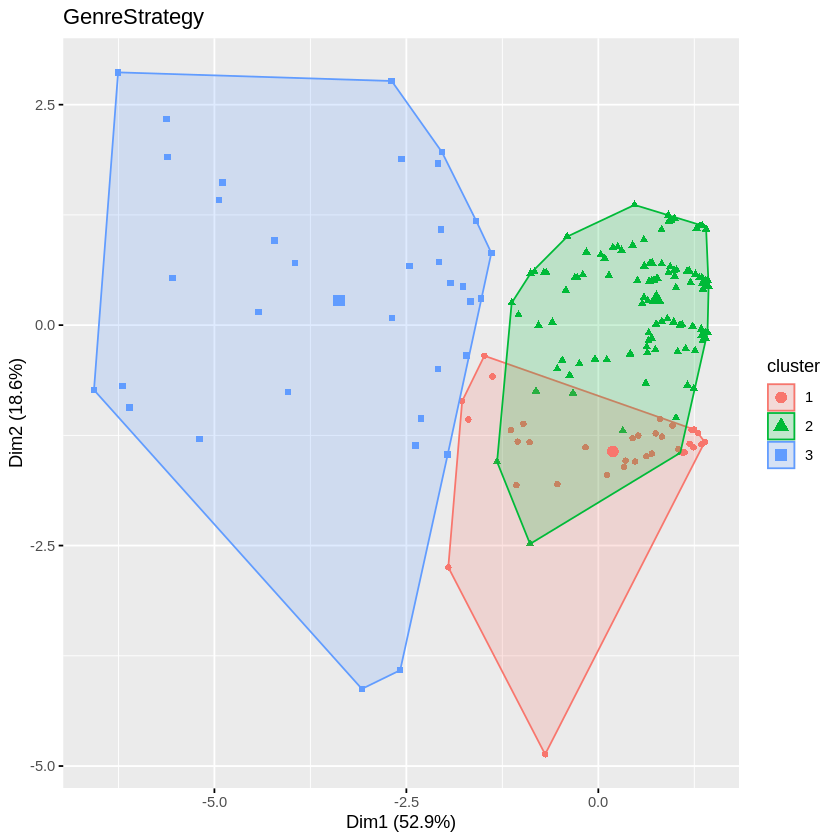

In [ ]:
genreKmeansClustering(clustering_dataset, genres, gamesForClustering)

#### Hierarchical

[1] "Optimal Number of Clusters found Through Silhouette Index: 3"


Warning message:
“The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as
of ggplot2 3.3.4.
ℹ The deprecated feature was likely used in the factoextra package.
  Please report the issue at <https://github.com/kassambara/factoextra/issues>.”


[1] "Optimal Number of Clusters found Through Silhouette Index: 2"


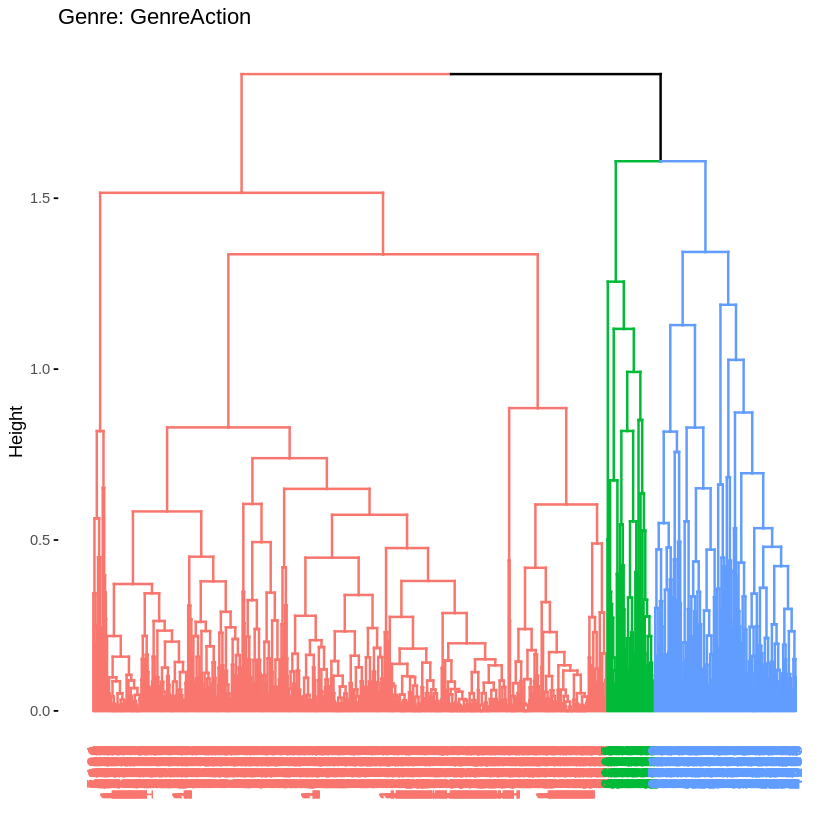

[1] "Optimal Number of Clusters found Through Silhouette Index: 2"


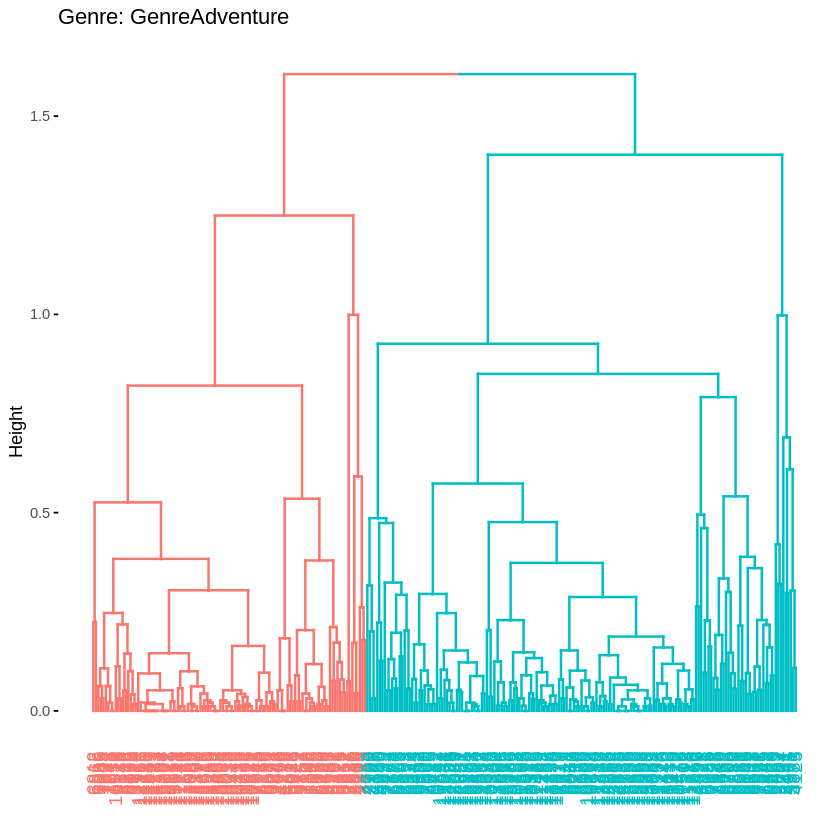

[1] "Optimal Number of Clusters found Through Silhouette Index: 4"


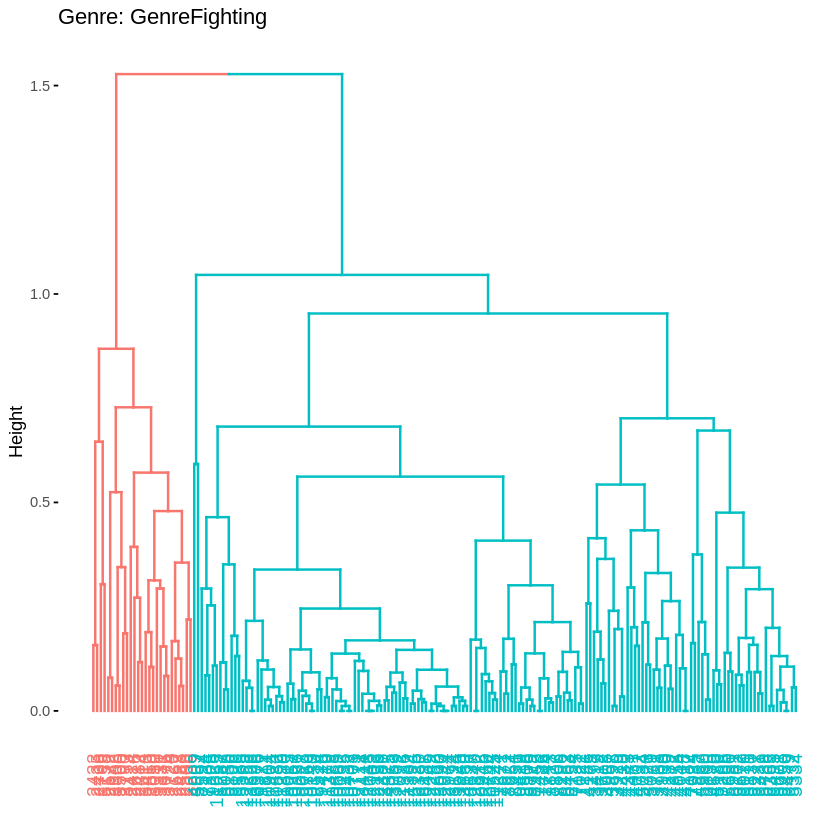

[1] "Optimal Number of Clusters found Through Silhouette Index: 4"


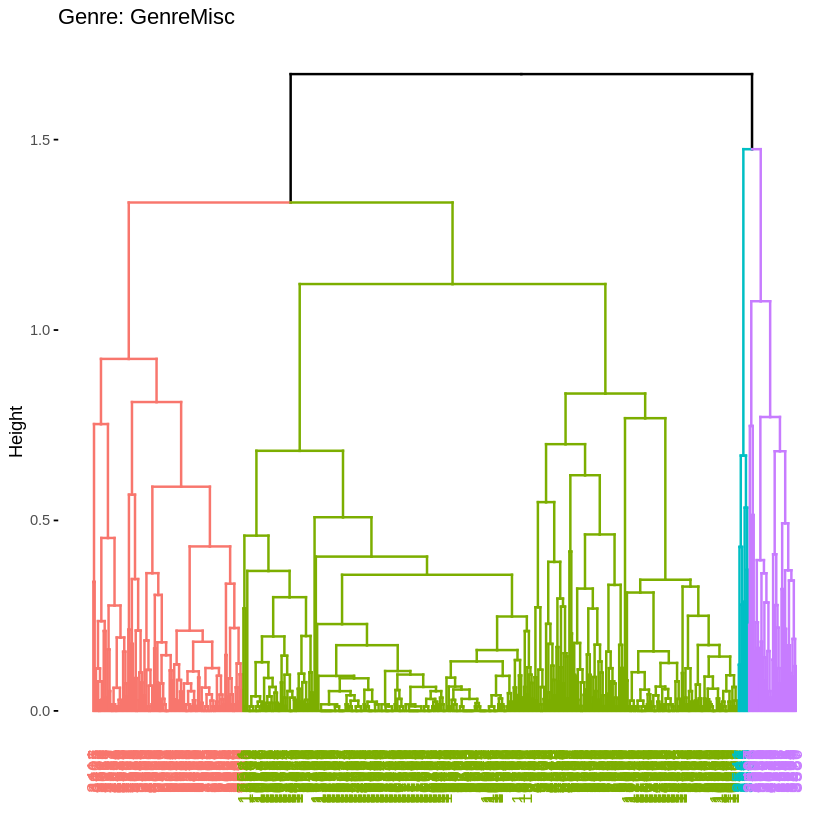

[1] "Optimal Number of Clusters found Through Silhouette Index: 2"


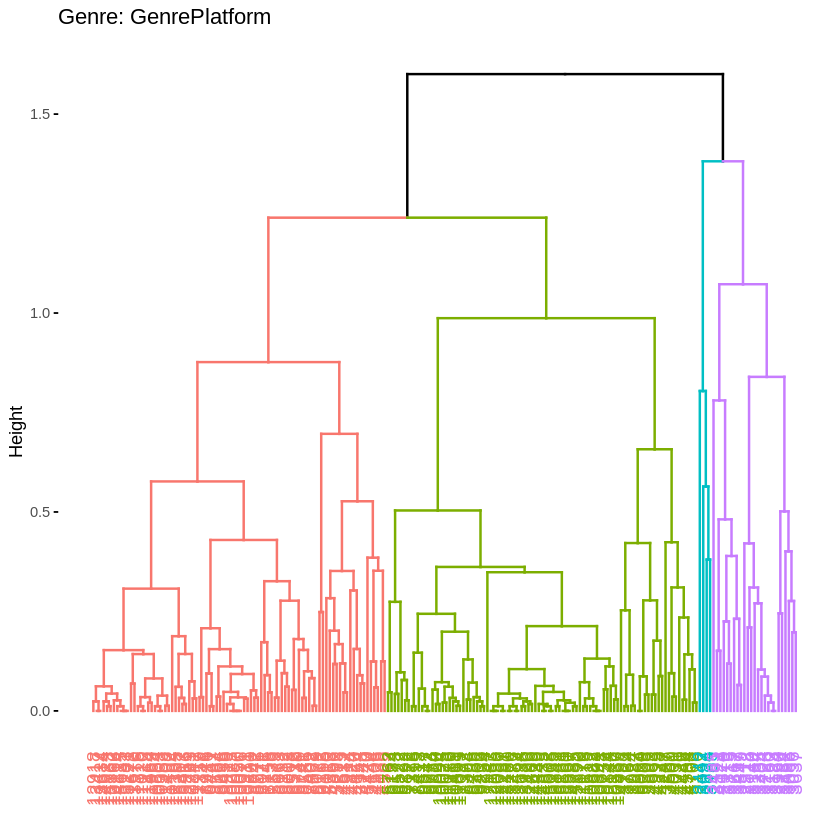

[1] "Optimal Number of Clusters found Through Silhouette Index: 4"


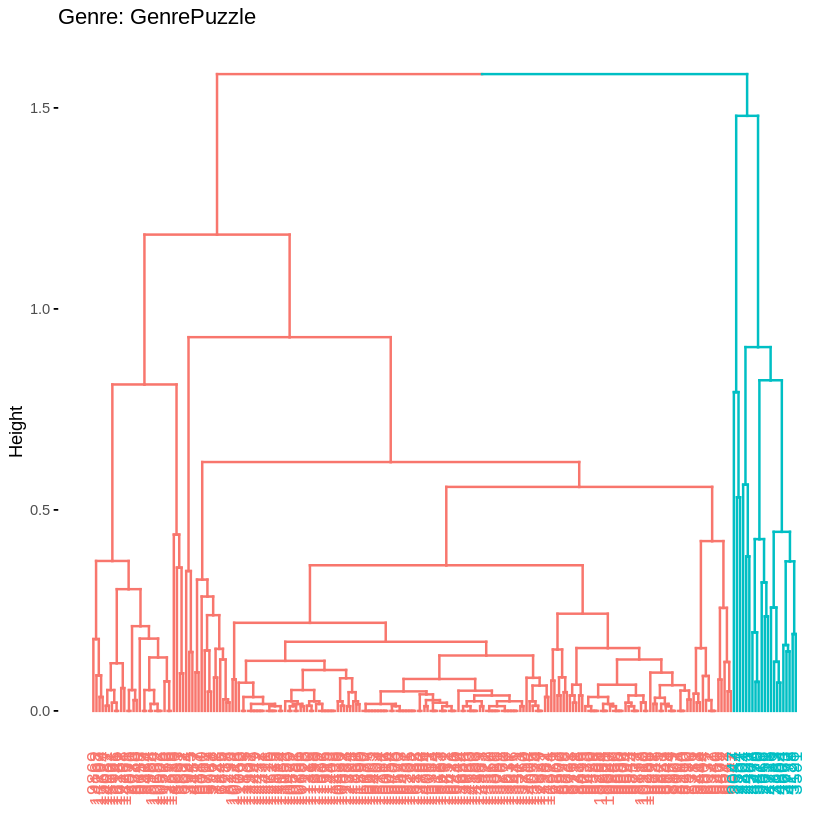

[1] "Optimal Number of Clusters found Through Silhouette Index: 2"


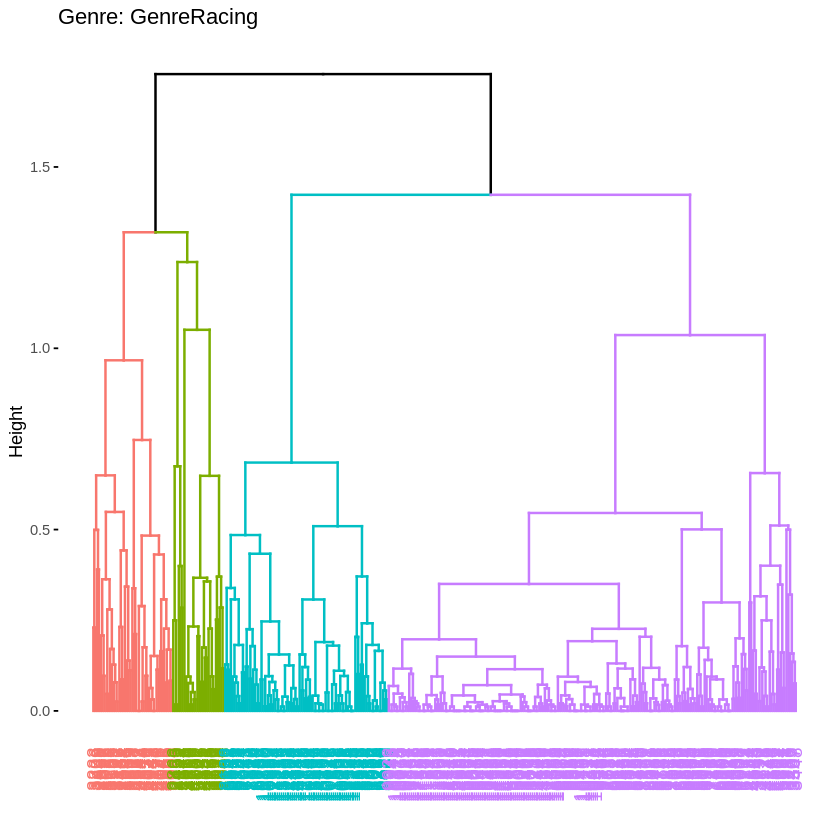

[1] "Optimal Number of Clusters found Through Silhouette Index: 2"


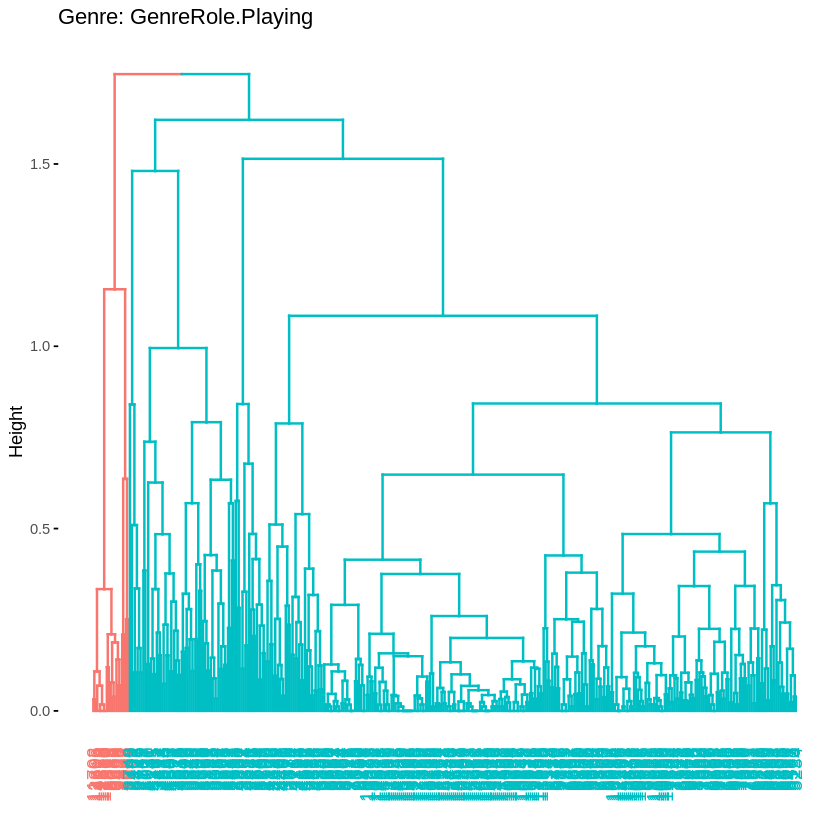

[1] "Optimal Number of Clusters found Through Silhouette Index: 4"


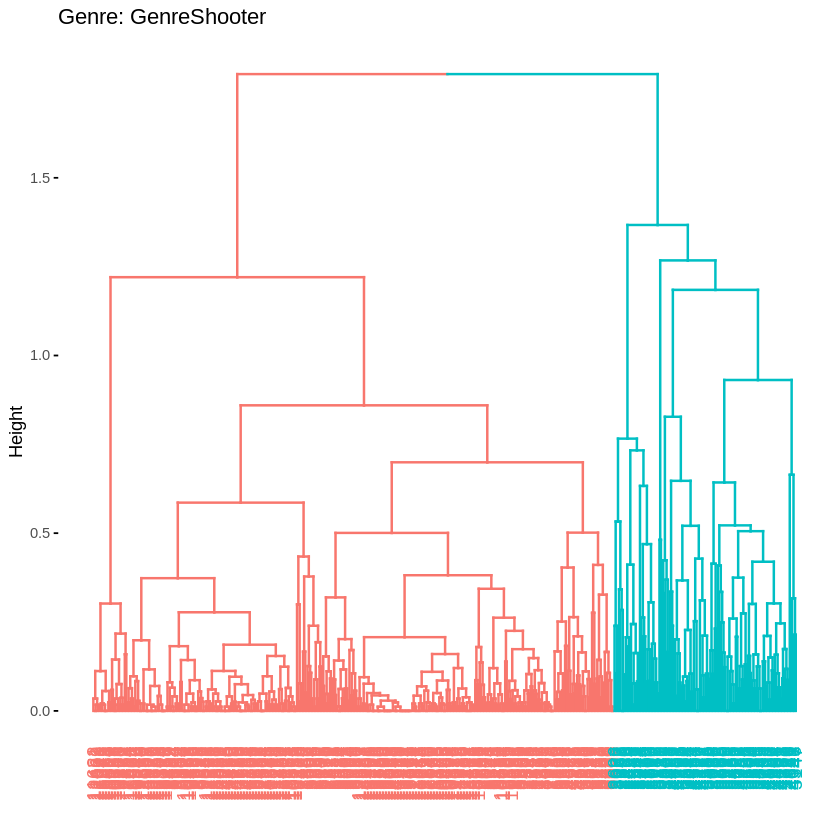

[1] "Optimal Number of Clusters found Through Silhouette Index: 3"


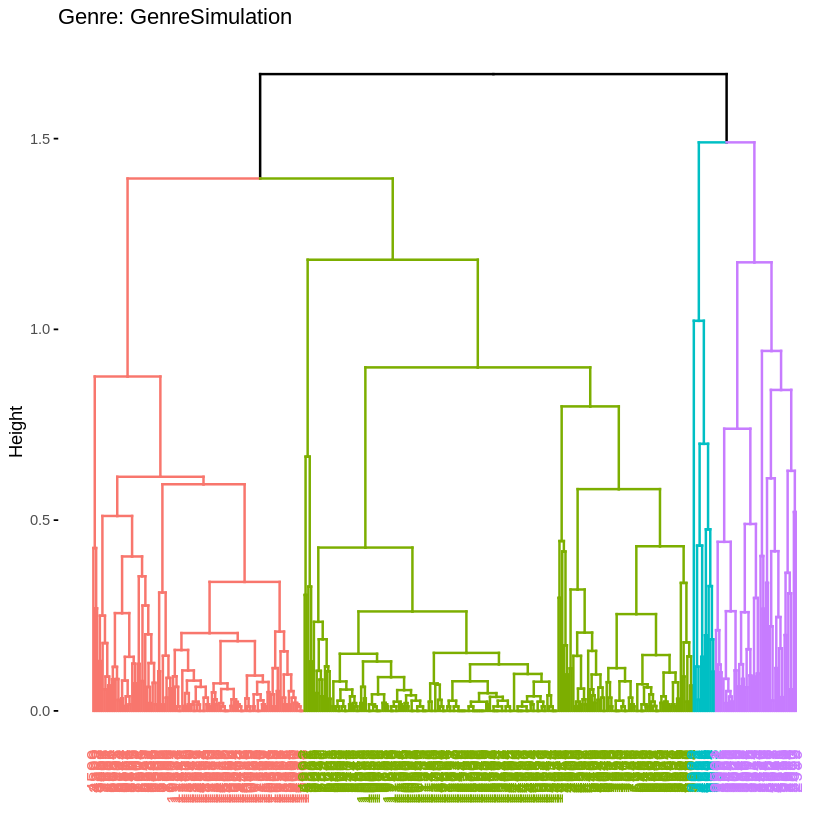

[1] "Optimal Number of Clusters found Through Silhouette Index: 3"


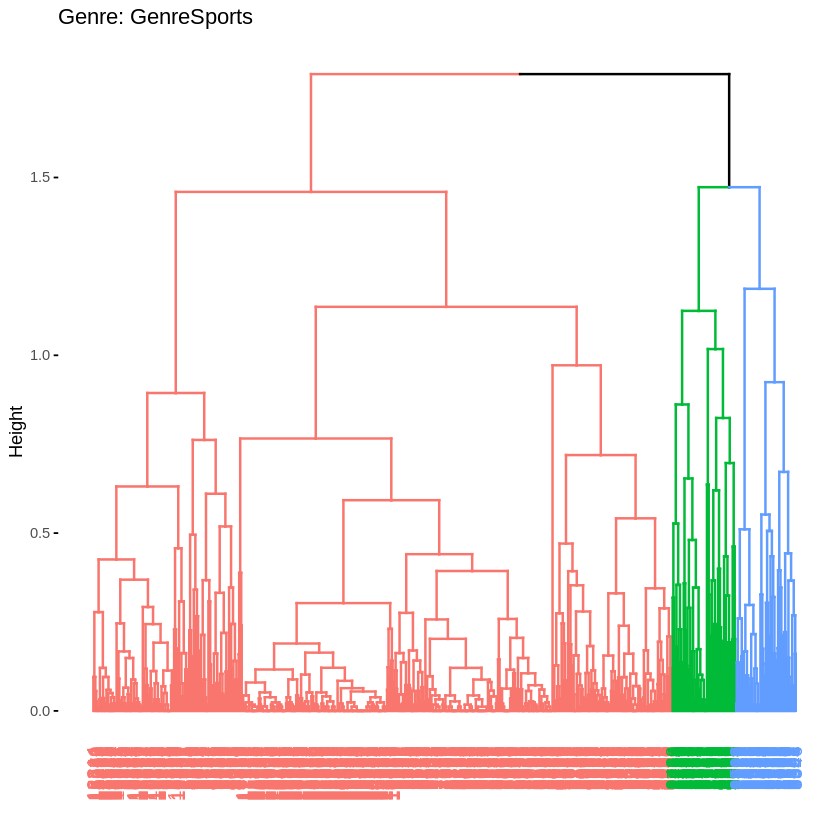

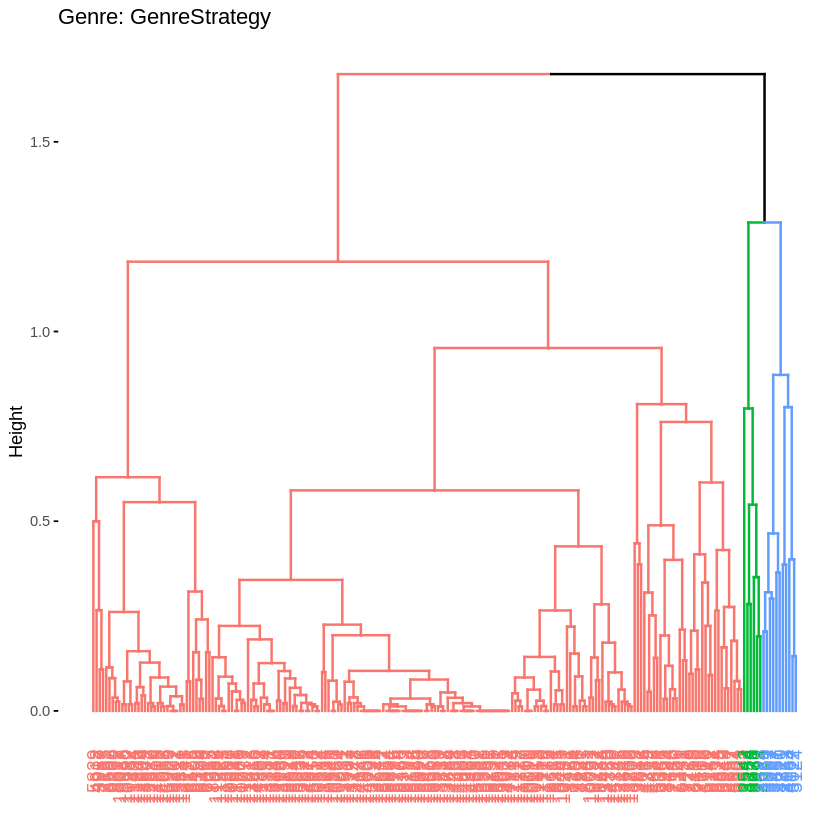

In [ ]:
genreDendrogram(clustering_dataset,genres)

In [ ]:
#Cluster numbers for hierarchical clustering based off of dendrograms
clusterNums <- c(4, 3, 2, 5, 5, 3, 5, 5, 2, 4, 4, 4)

[1] "Summary for: GenreAction"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 212"
[1] "Average Global Sales: 0.886126526082131"
[1] "Percentages:"
[1] "High global sales: 41.0377358490566 %"
[1] "High NA sales: 3.77358490566038 %"
[1] "High JP sales: 0.943396226415094 %"
[1] "High EU sales: 1.41509433962264 %"
[1] "High Other sales: 5.66037735849057 %"
[1] "Games in franchise with high sales: 22.1698113207547 %"
[1] "Games in franchise: 45.7547169811321 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 35.8490566037736 %"
[1] "EC: 0 %"
[1] "E10+: 9.90566037735849 %"
[1] "T: 32.0754716981132 %"
[1] "M: 22.1698113207547 %"
[1] "Platform Frequencies of High Sale Games:"
     Platform3DS PlatformDS PlatformGBA PlatformGC PlatformPS2 PlatformPS3
2632           1         11           2          5          14          20
     PlatformPSP PlatformWii PlatformWiiU PlatformX360 PlatformXB PlatformXOne
2632           1           9 

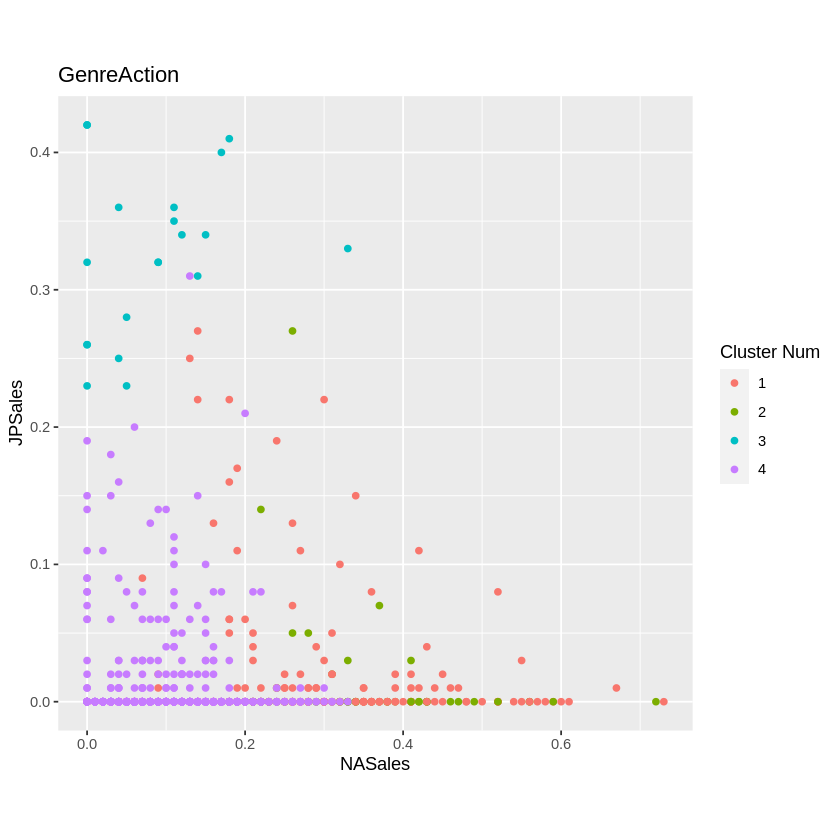

[1] "Summary for: GenreAdventure"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 9"
[1] "Average Global Sales: 0.992156862745098"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 22.2222222222222 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 0 %"
[1] "Games in franchise with high sales: 55.5555555555556 %"
[1] "Games in franchise: 55.5555555555556 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 44.4444444444444 %"
[1] "EC: 0 %"
[1] "E10+: 11.1111111111111 %"
[1] "T: 33.3333333333333 %"
[1] "M: 11.1111111111111 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformPS2 PlatformPS3 PlatformWii PlatformX360
2443          1           2           3           1            2
[1] "Platform Frequencies"
     PlatformDS PlatformPS2 PlatformPS3 PlatformWii PlatformX360
2443          1           2           3           1            2
[1] "------------------------

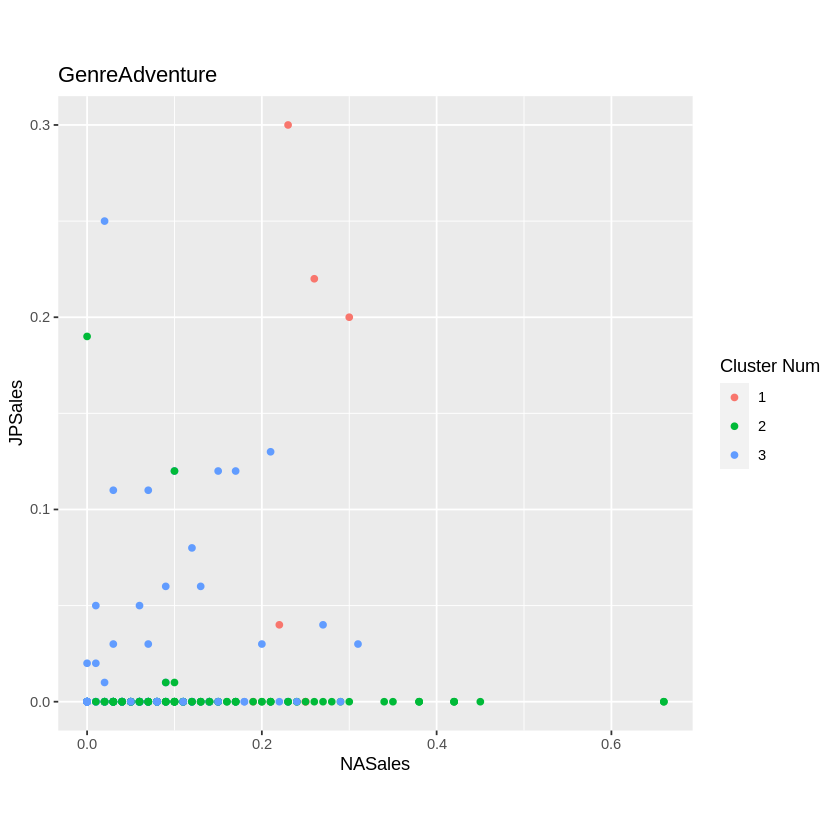

[1] "Summary for: GenreFighting"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 27"
[1] "Average Global Sales: 0.987363834422658"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 7.40740740740741 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 11.1111111111111 %"
[1] "Games in franchise with high sales: 40.7407407407407 %"
[1] "Games in franchise: 40.7407407407407 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 40.7407407407407 %"
[1] "EC: 0 %"
[1] "E10+: 11.1111111111111 %"
[1] "T: 25.9259259259259 %"
[1] "M: 22.2222222222222 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformWii PlatformWiiU
2459          3          1           4           8           5            1
     PlatformX360 PlatformXB
2459            4          1
[1] "Platform Frequencies"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformWii P

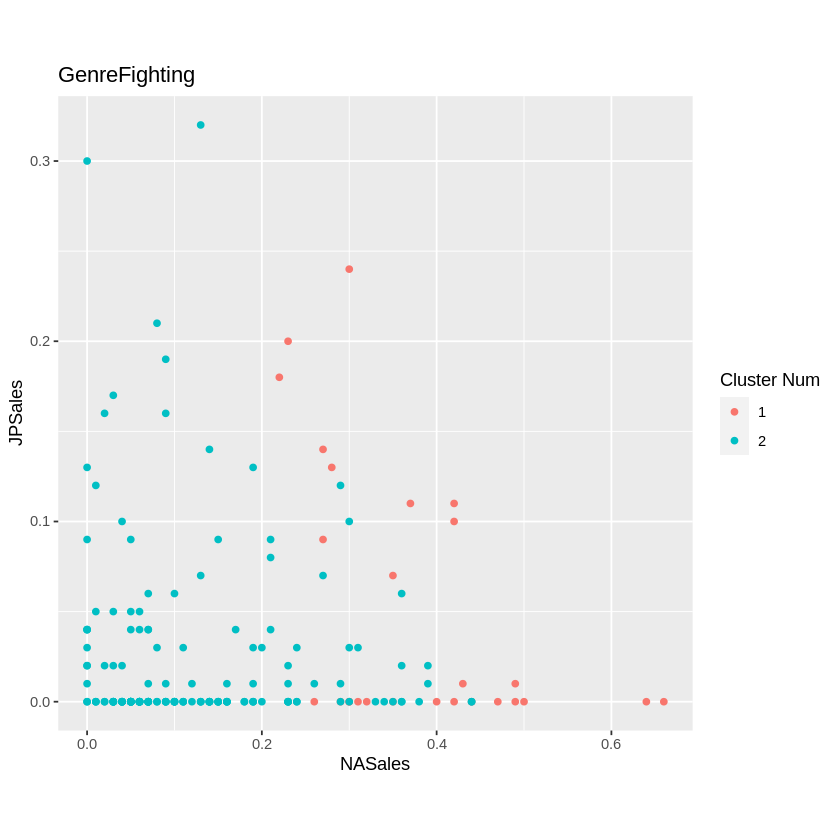

[1] "Summary for: GenreMisc"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 37"
[1] "Average Global Sales: 0.977424483306836"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 8.10810810810811 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 2.7027027027027 %"
[1] "Games in franchise with high sales: 43.2432432432432 %"
[1] "Games in franchise: 43.2432432432432 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 35.1351351351351 %"
[1] "EC: 0 %"
[1] "E10+: 10.8108108108108 %"
[1] "T: 27.027027027027 %"
[1] "M: 27.027027027027 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGBA PlatformGC PlatformPS2 PlatformPS3 PlatformWii
2521          4           1          2           6          10           6
     PlatformWiiU PlatformX360 PlatformXB
2521            1            5          2
[1] "Platform Frequencies"
     PlatformDS PlatformGBA PlatformGC Platform

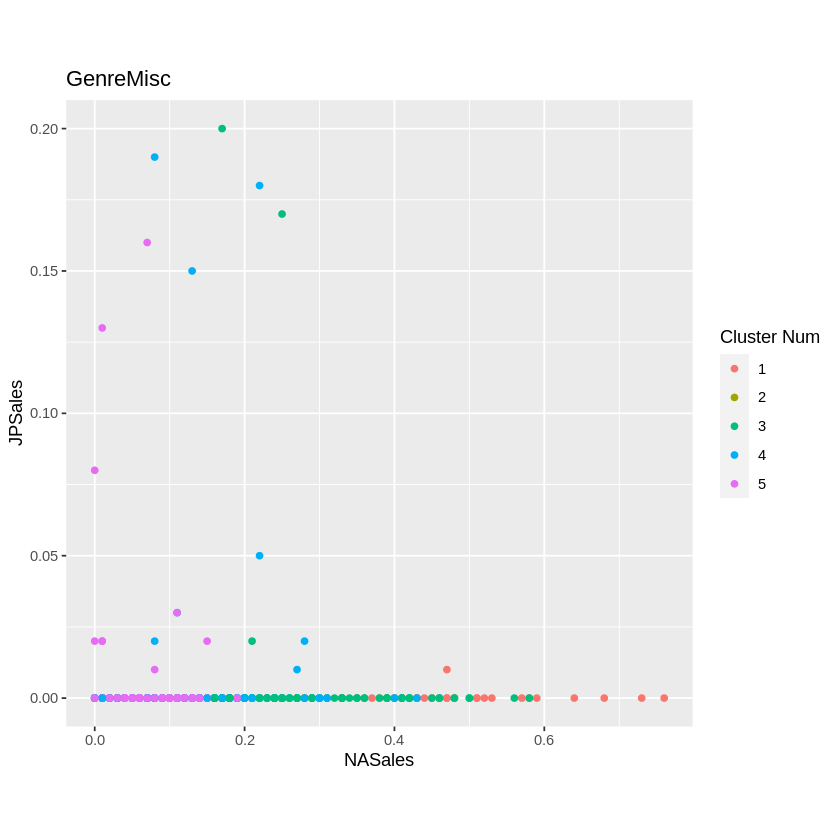

[1] "Summary for: GenrePlatform"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 4"
[1] "Average Global Sales: 0.994117647058824"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 0 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 0 %"
[1] "Games in franchise with high sales: 50 %"
[1] "Games in franchise: 50 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 50 %"
[1] "EC: 0 %"
[1] "E10+: 0 %"
[1] "T: 25 %"
[1] "M: 25 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformPS3 PlatformX360
2442          2           1            1
[1] "Platform Frequencies"
     PlatformDS PlatformPS3 PlatformX360
2442          2           1            1
[1] "------------------------------------------"
[1] "Clus= 2"
[1] "Total number of games in cluster: 9"
[1] "Average Global Sales: 0.979084967320261"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 22.22

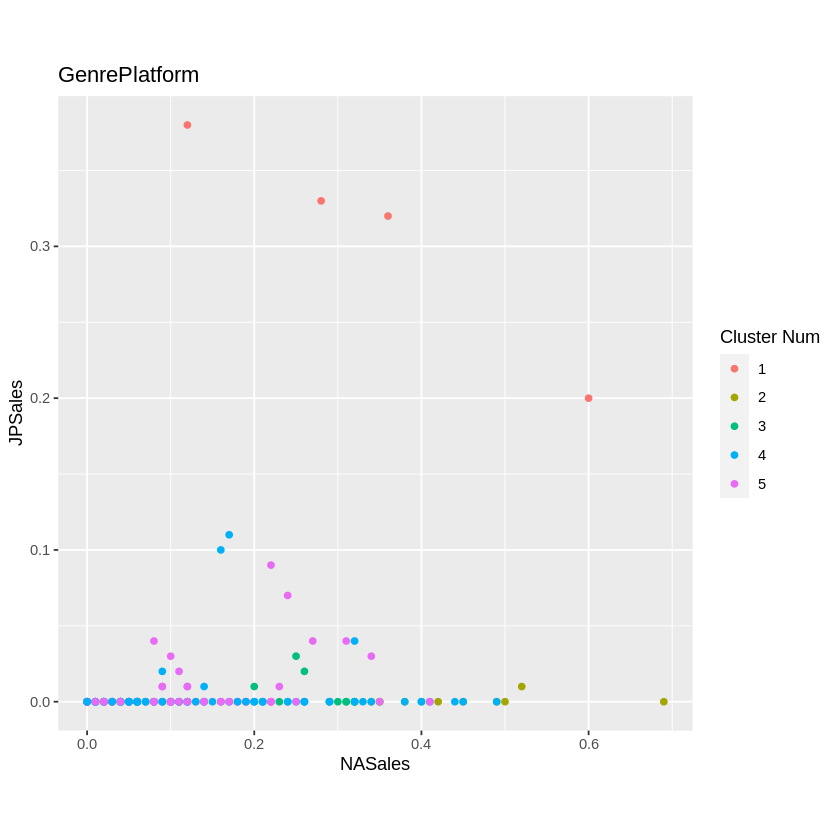

[1] "Summary for: GenrePuzzle"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 18"
[1] "Average Global Sales: 0.988888888888889"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 5.55555555555556 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 16.6666666666667 %"
[1] "Games in franchise with high sales: 33.3333333333333 %"
[1] "Games in franchise: 33.3333333333333 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 33.3333333333333 %"
[1] "EC: 0 %"
[1] "E10+: 11.1111111111111 %"
[1] "T: 33.3333333333333 %"
[1] "M: 22.2222222222222 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformWii PlatformWiiU
2451          2          1           2           7           2            1
     PlatformX360
2451            3
[1] "Platform Frequencies"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformWii PlatformWiiU
2451        

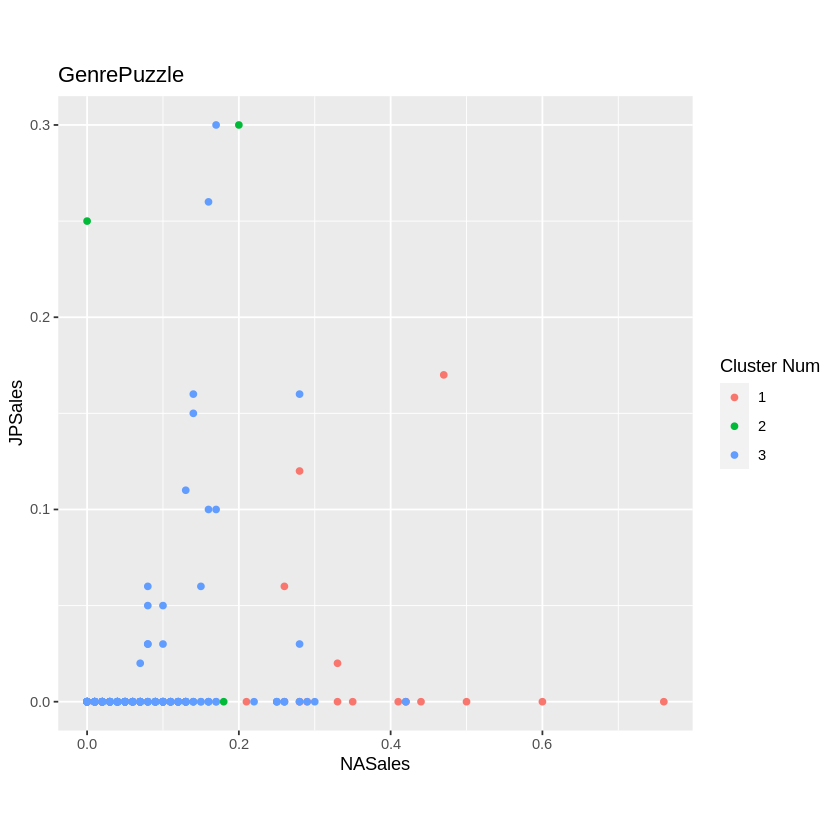

[1] "Summary for: GenreRacing"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 6"
[1] "Average Global Sales: 0.988235294117647"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 0 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 16.6666666666667 %"
[1] "Games in franchise with high sales: 16.6666666666667 %"
[1] "Games in franchise: 16.6666666666667 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 50 %"
[1] "EC: 0 %"
[1] "E10+: 16.6666666666667 %"
[1] "T: 33.3333333333333 %"
[1] "M: 0 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGBA PlatformGC PlatformPS3 PlatformWii PlatformXB
2466          1           1          1           1           1          1
[1] "Platform Frequencies"
     PlatformDS PlatformGBA PlatformGC PlatformPS3 PlatformWii PlatformXB
2466          1           1          1           1           1          1
[1] "--------------------

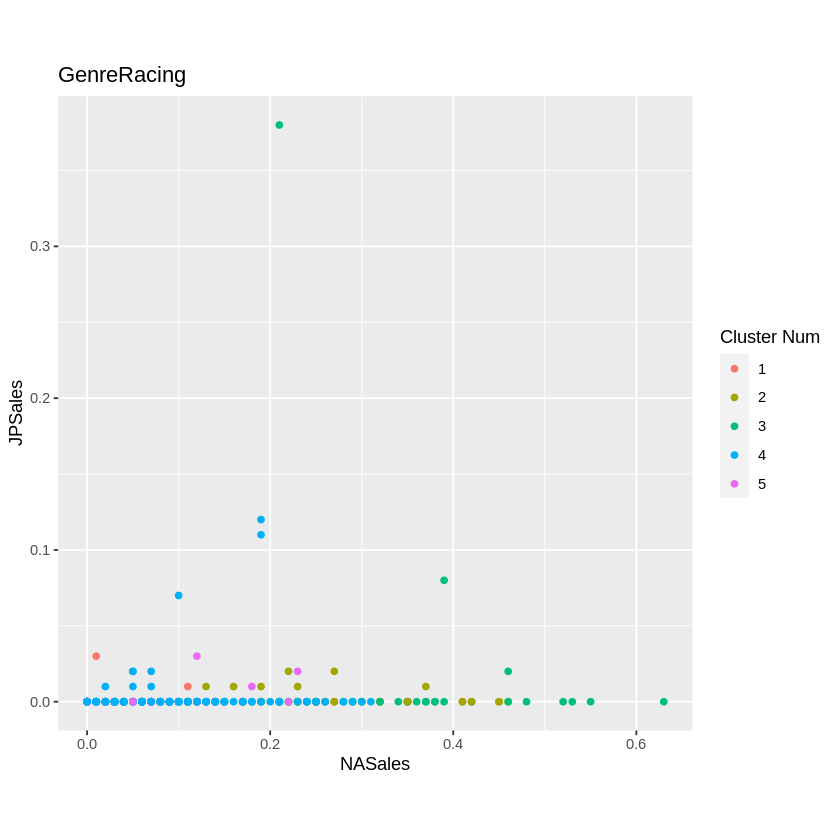

[1] "Summary for: GenreRole.Playing"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 16"
[1] "Average Global Sales: 0.972058823529412"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 6.25 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 6.25 %"
[1] "Games in franchise with high sales: 50 %"
[1] "Games in franchise: 50 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 62.5 %"
[1] "EC: 0 %"
[1] "E10+: 0 %"
[1] "T: 18.75 %"
[1] "M: 18.75 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformWii PlatformX360
2558          3          1           2           3           2            2
     PlatformXB
2558          3
[1] "Platform Frequencies"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformWii PlatformX360
2558          3          1           2           3           2            2
     PlatformXB
2558          3
[1]

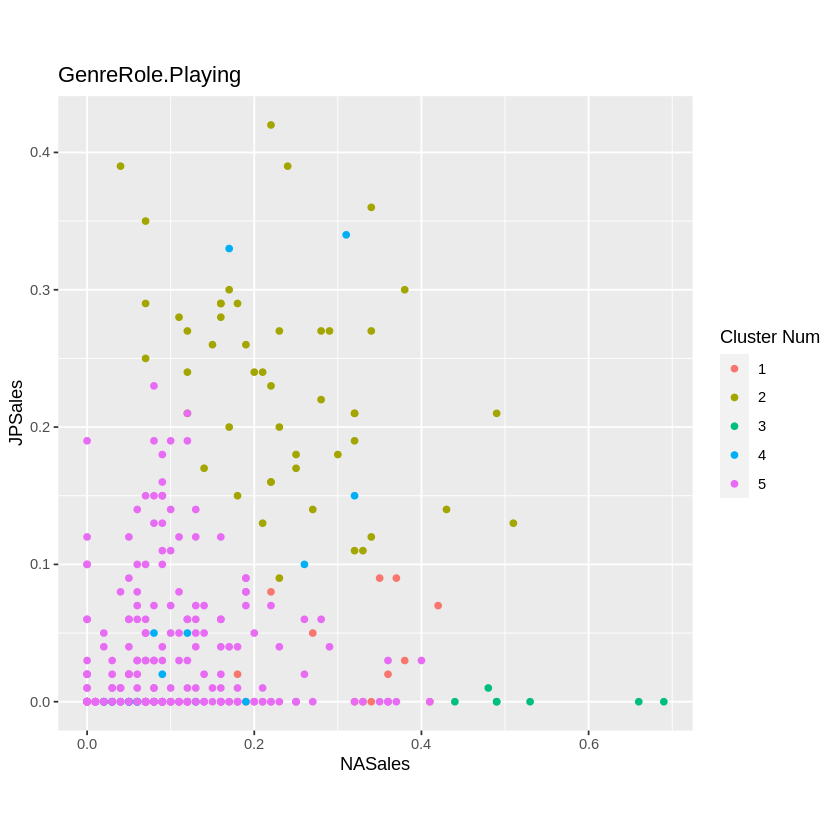

[1] "Summary for: GenreShooter"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 122"
[1] "Average Global Sales: 0.951012536162006"
[1] "Percentages:"
[1] "High global sales: 95.9016393442623 %"
[1] "High NA sales: 11.4754098360656 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 1.63934426229508 %"
[1] "High Other sales: 7.37704918032787 %"
[1] "Games in franchise with high sales: 54.0983606557377 %"
[1] "Games in franchise: 54.0983606557377 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 34.4262295081967 %"
[1] "EC: 0 %"
[1] "E10+: 11.4754098360656 %"
[1] "T: 33.6065573770492 %"
[1] "M: 20.4918032786885 %"
[1] "Platform Frequencies of High Sale Games:"
     Platform3DS PlatformDS PlatformGBA PlatformGC PlatformPS2 PlatformPS3
2632           2         11           2          6          18          27
     PlatformPSP PlatformPSV PlatformWii PlatformWiiU PlatformX360 PlatformXB
2632           1           1          19     

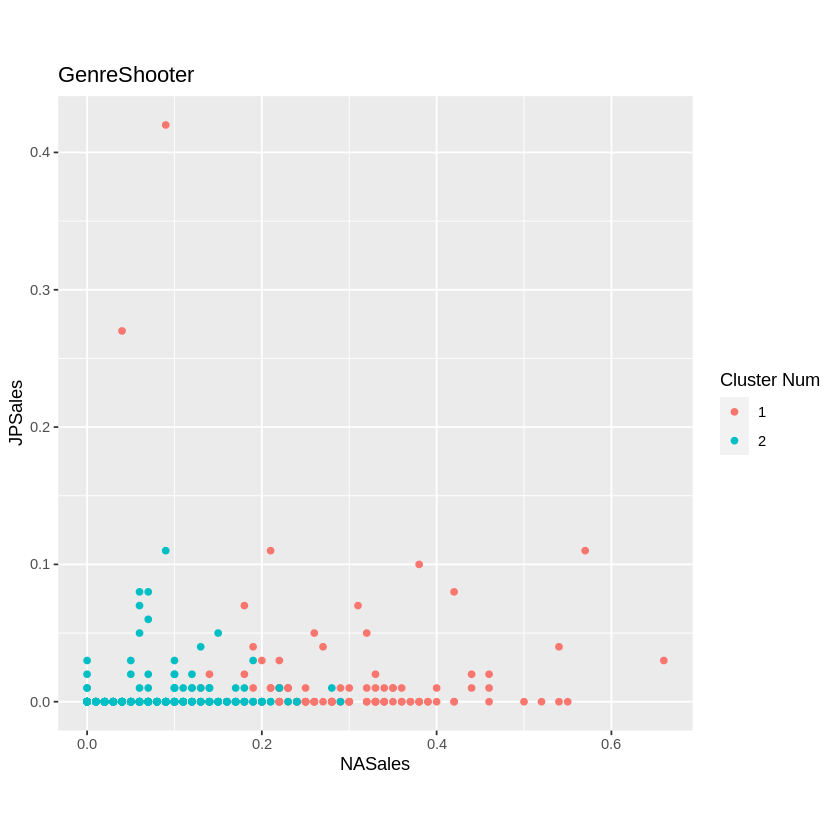

[1] "Summary for: GenreSimulation"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 44"
[1] "Average Global Sales: 0.977540106951872"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 11.3636363636364 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 11.3636363636364 %"
[1] "Games in franchise with high sales: 45.4545454545455 %"
[1] "Games in franchise: 45.4545454545455 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 36.3636363636364 %"
[1] "EC: 0 %"
[1] "E10+: 13.6363636363636 %"
[1] "T: 27.2727272727273 %"
[1] "M: 22.7272727272727 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGBA PlatformGC PlatformPS2 PlatformPS3 PlatformPSP
2551          3           1          2           9          13           1
     PlatformWii PlatformWiiU PlatformX360 PlatformXB
2551           6            1            7          1
[1] "Platform Frequencies"
     PlatformD

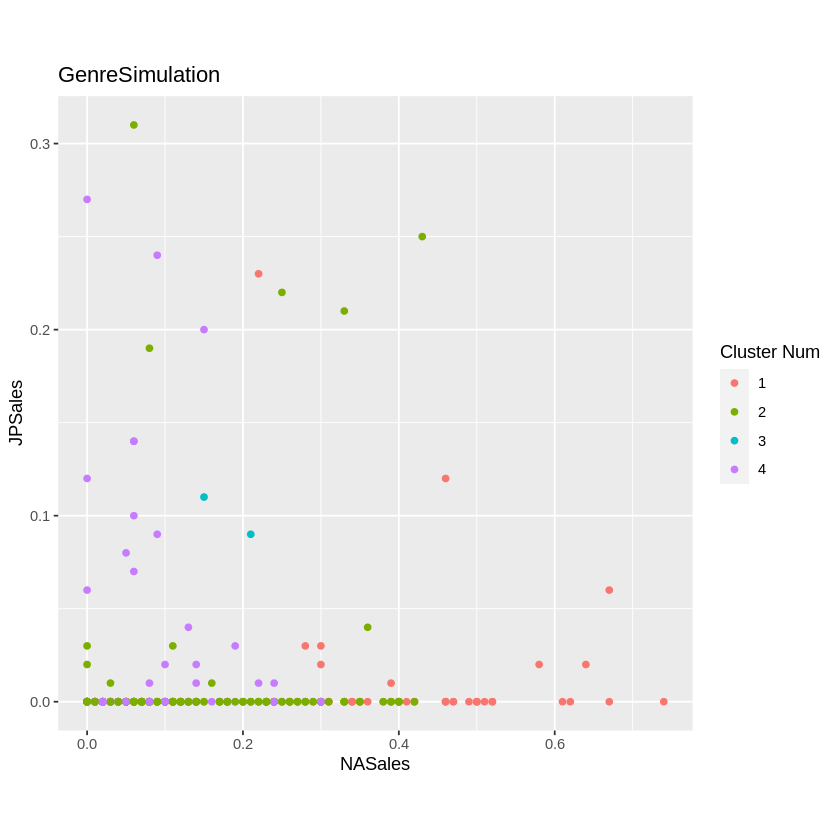

[1] "Summary for: GenreSports"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 63"
[1] "Average Global Sales: 0.922875816993464"
[1] "Percentages:"
[1] "High global sales: 71.4285714285714 %"
[1] "High NA sales: 12.6984126984127 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 6.34920634920635 %"
[1] "Games in franchise with high sales: 39.6825396825397 %"
[1] "Games in franchise: 47.6190476190476 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 36.5079365079365 %"
[1] "EC: 0 %"
[1] "E10+: 12.6984126984127 %"
[1] "T: 30.1587301587302 %"
[1] "M: 20.6349206349206 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformPSP PlatformWii
2630          6          2           7          13           1           6
     PlatformX360 PlatformXB
2630            9          1
[1] "Platform Frequencies"
     Platform3DS PlatformDS PlatformGBA PlatformGC Plat

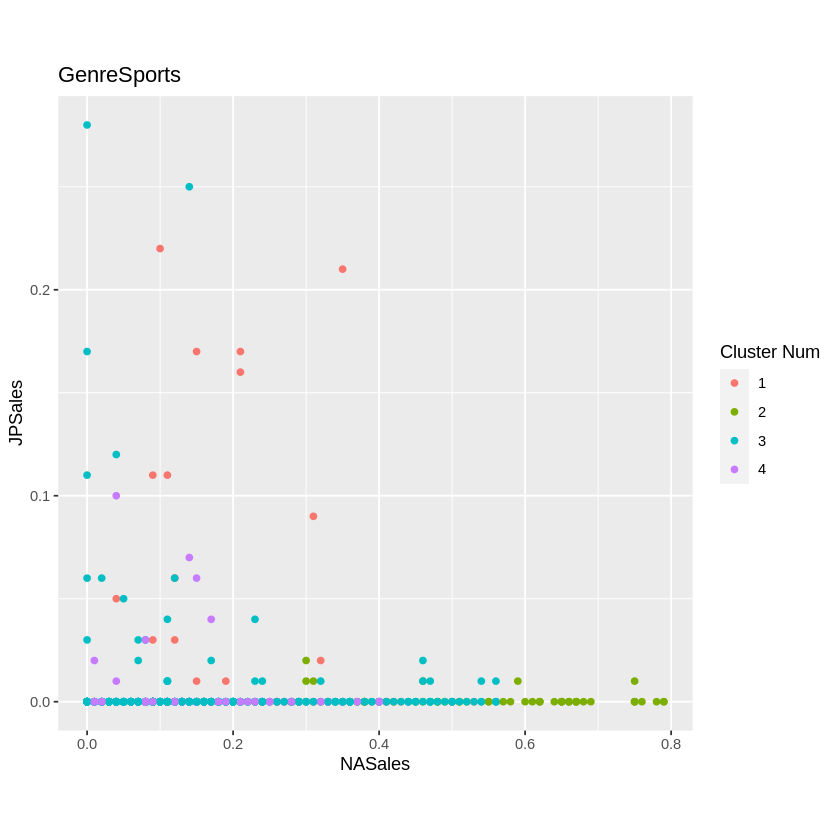

[1] "Summary for: GenreStrategy"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 6"
[1] "Average Global Sales: 0.994117647058824"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 0 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 0 %"
[1] "Games in franchise with high sales: 16.6666666666667 %"
[1] "Games in franchise: 16.6666666666667 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 33.3333333333333 %"
[1] "EC: 0 %"
[1] "E10+: 33.3333333333333 %"
[1] "T: 16.6666666666667 %"
[1] "M: 16.6666666666667 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformPS3 PlatformWii
2433          1           2           3
[1] "Platform Frequencies"
     PlatformDS PlatformPS3 PlatformWii
2433          1           2           3
[1] "------------------------------------------"
[1] "Clus= 2"
[1] "Total number of games in cluster: 11"
[1] "Average Global Sales: 0.9882352941

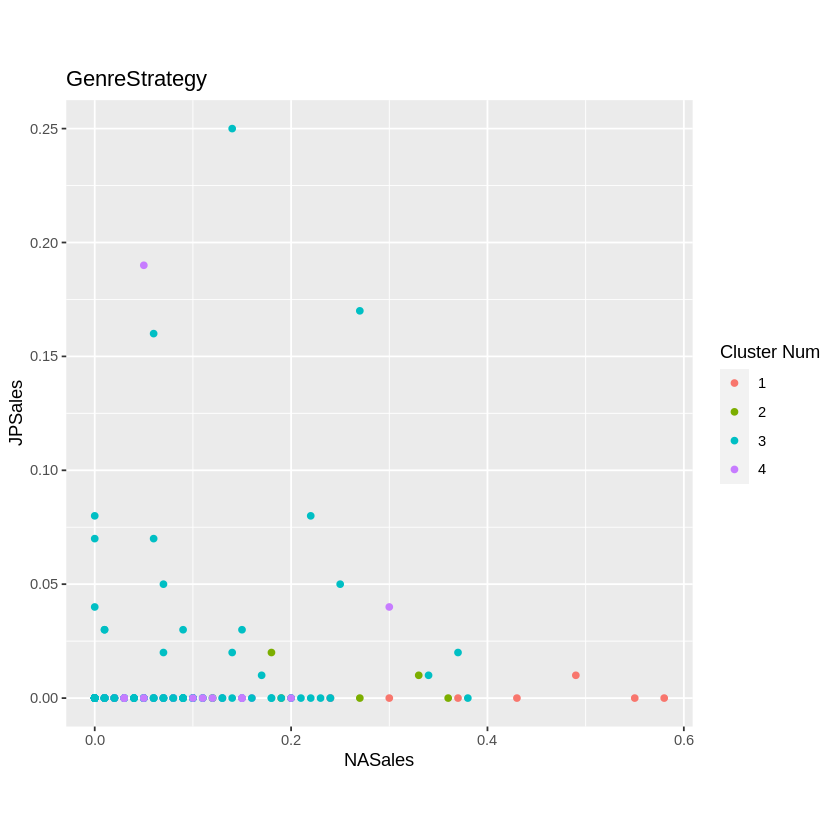

In [ ]:
genreHierarchicalClustering(clustering_dataset, genres, clusterNums, gamesForClustering)

[1] "Summary for: GenreAction"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 212"
[1] "Average Global Sales: 0.886126526082131"
[1] "Percentages:"
[1] "High global sales: 41.0377358490566 %"
[1] "High NA sales: 3.77358490566038 %"
[1] "High JP sales: 0.943396226415094 %"
[1] "High EU sales: 1.41509433962264 %"
[1] "High Other sales: 5.66037735849057 %"
[1] "Games in franchise with high sales: 22.1698113207547 %"
[1] "Games in franchise: 45.7547169811321 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 35.8490566037736 %"
[1] "EC: 0 %"
[1] "E10+: 9.90566037735849 %"
[1] "T: 32.0754716981132 %"
[1] "M: 22.1698113207547 %"
[1] "Platform Frequencies of High Sale Games:"
     Platform3DS PlatformDS PlatformGBA PlatformGC PlatformPS2 PlatformPS3
2632           1         11           2          5          14          20
     PlatformPSP PlatformWii PlatformWiiU PlatformX360 PlatformXB PlatformXOne
2632           1           9 

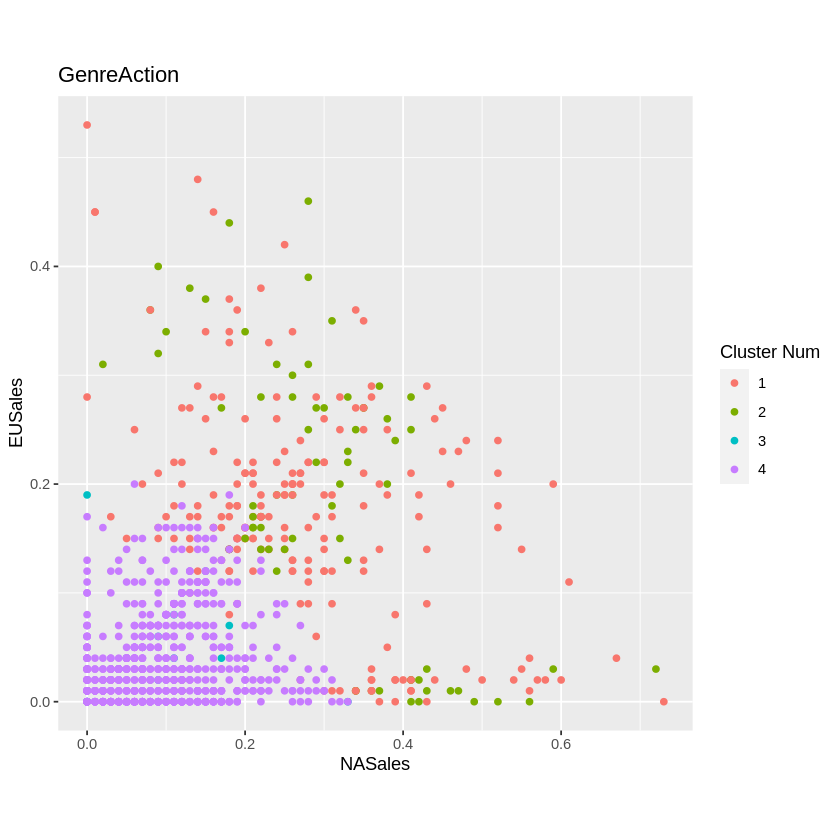

[1] "Summary for: GenreAdventure"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 9"
[1] "Average Global Sales: 0.992156862745098"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 22.2222222222222 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 0 %"
[1] "Games in franchise with high sales: 55.5555555555556 %"
[1] "Games in franchise: 55.5555555555556 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 44.4444444444444 %"
[1] "EC: 0 %"
[1] "E10+: 11.1111111111111 %"
[1] "T: 33.3333333333333 %"
[1] "M: 11.1111111111111 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformPS2 PlatformPS3 PlatformWii PlatformX360
2443          1           2           3           1            2
[1] "Platform Frequencies"
     PlatformDS PlatformPS2 PlatformPS3 PlatformWii PlatformX360
2443          1           2           3           1            2
[1] "------------------------

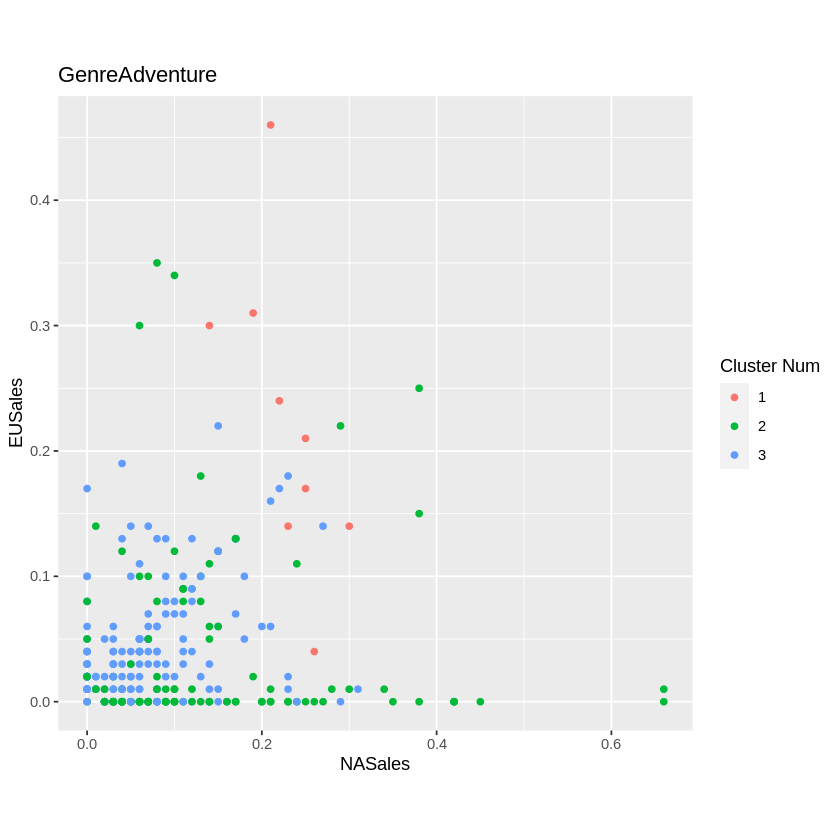

[1] "Summary for: GenreFighting"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 27"
[1] "Average Global Sales: 0.987363834422658"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 7.40740740740741 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 11.1111111111111 %"
[1] "Games in franchise with high sales: 40.7407407407407 %"
[1] "Games in franchise: 40.7407407407407 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 40.7407407407407 %"
[1] "EC: 0 %"
[1] "E10+: 11.1111111111111 %"
[1] "T: 25.9259259259259 %"
[1] "M: 22.2222222222222 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformWii PlatformWiiU
2459          3          1           4           8           5            1
     PlatformX360 PlatformXB
2459            4          1
[1] "Platform Frequencies"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformWii P

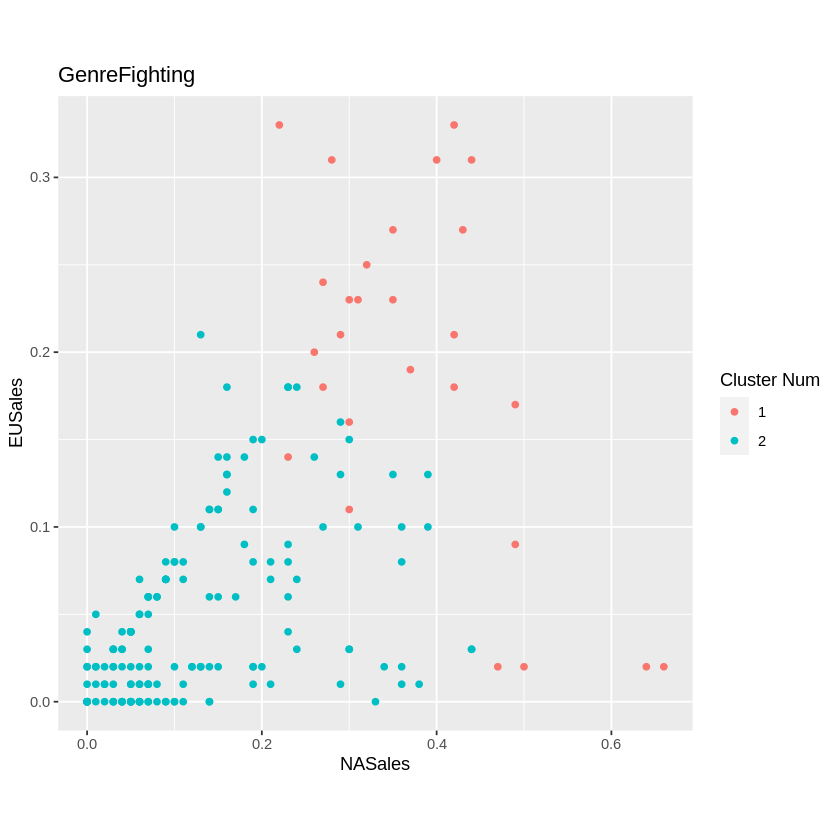

[1] "Summary for: GenreMisc"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 37"
[1] "Average Global Sales: 0.977424483306836"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 8.10810810810811 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 2.7027027027027 %"
[1] "Games in franchise with high sales: 43.2432432432432 %"
[1] "Games in franchise: 43.2432432432432 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 35.1351351351351 %"
[1] "EC: 0 %"
[1] "E10+: 10.8108108108108 %"
[1] "T: 27.027027027027 %"
[1] "M: 27.027027027027 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGBA PlatformGC PlatformPS2 PlatformPS3 PlatformWii
2521          4           1          2           6          10           6
     PlatformWiiU PlatformX360 PlatformXB
2521            1            5          2
[1] "Platform Frequencies"
     PlatformDS PlatformGBA PlatformGC Platform

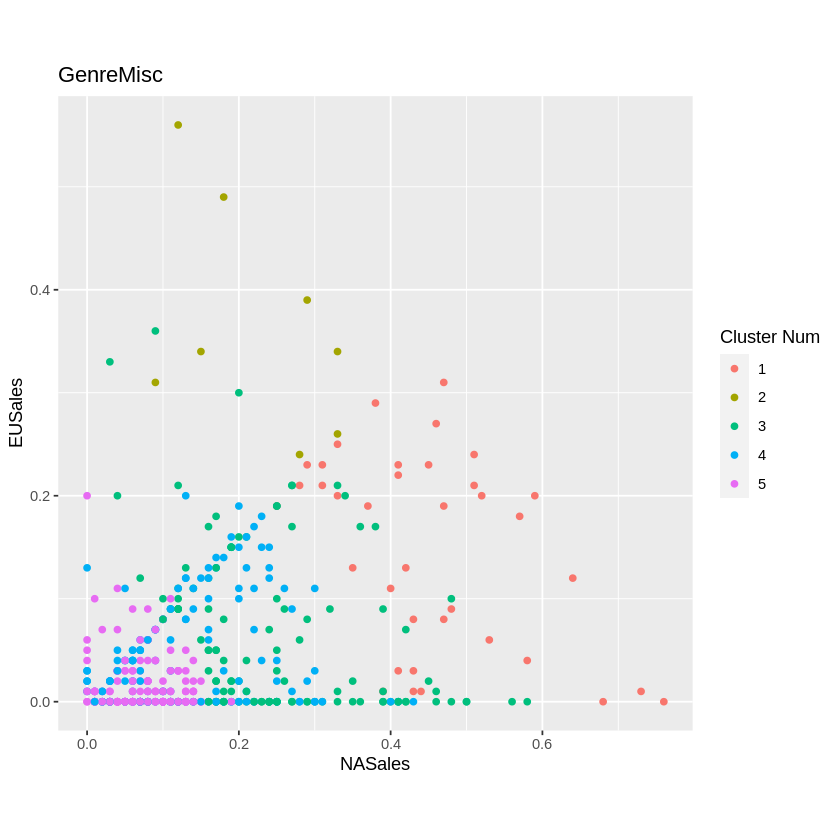

[1] "Summary for: GenrePlatform"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 4"
[1] "Average Global Sales: 0.994117647058824"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 0 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 0 %"
[1] "Games in franchise with high sales: 50 %"
[1] "Games in franchise: 50 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 50 %"
[1] "EC: 0 %"
[1] "E10+: 0 %"
[1] "T: 25 %"
[1] "M: 25 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformPS3 PlatformX360
2442          2           1            1
[1] "Platform Frequencies"
     PlatformDS PlatformPS3 PlatformX360
2442          2           1            1
[1] "------------------------------------------"
[1] "Clus= 2"
[1] "Total number of games in cluster: 9"
[1] "Average Global Sales: 0.979084967320261"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 22.22

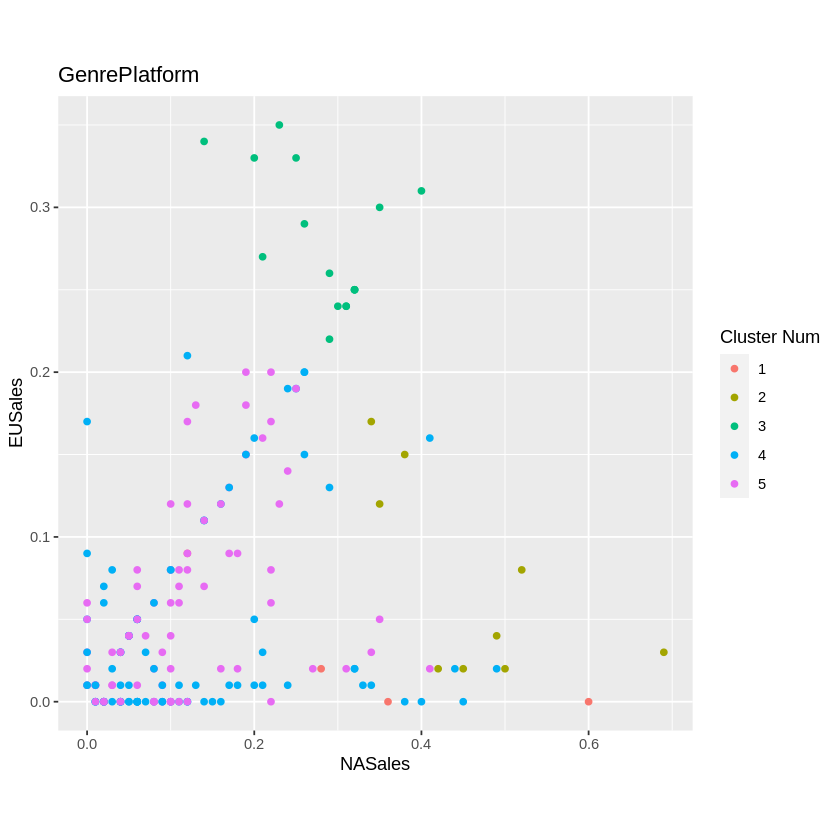

[1] "Summary for: GenrePuzzle"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 18"
[1] "Average Global Sales: 0.988888888888889"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 5.55555555555556 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 16.6666666666667 %"
[1] "Games in franchise with high sales: 33.3333333333333 %"
[1] "Games in franchise: 33.3333333333333 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 33.3333333333333 %"
[1] "EC: 0 %"
[1] "E10+: 11.1111111111111 %"
[1] "T: 33.3333333333333 %"
[1] "M: 22.2222222222222 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformWii PlatformWiiU
2451          2          1           2           7           2            1
     PlatformX360
2451            3
[1] "Platform Frequencies"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformWii PlatformWiiU
2451        

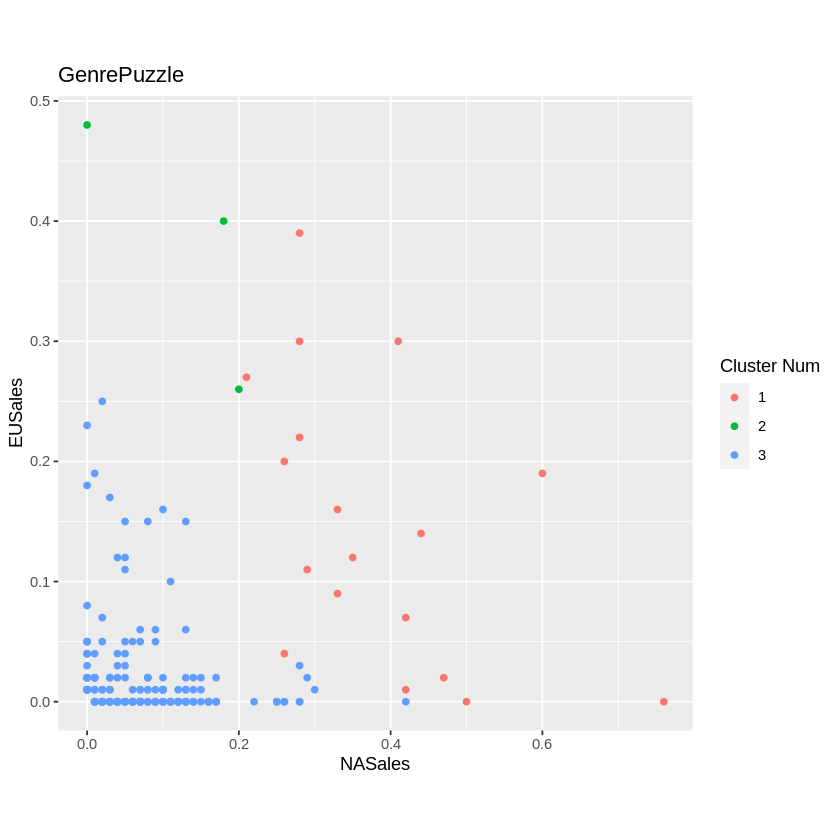

[1] "Summary for: GenreRacing"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 6"
[1] "Average Global Sales: 0.988235294117647"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 0 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 16.6666666666667 %"
[1] "Games in franchise with high sales: 16.6666666666667 %"
[1] "Games in franchise: 16.6666666666667 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 50 %"
[1] "EC: 0 %"
[1] "E10+: 16.6666666666667 %"
[1] "T: 33.3333333333333 %"
[1] "M: 0 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGBA PlatformGC PlatformPS3 PlatformWii PlatformXB
2466          1           1          1           1           1          1
[1] "Platform Frequencies"
     PlatformDS PlatformGBA PlatformGC PlatformPS3 PlatformWii PlatformXB
2466          1           1          1           1           1          1
[1] "--------------------

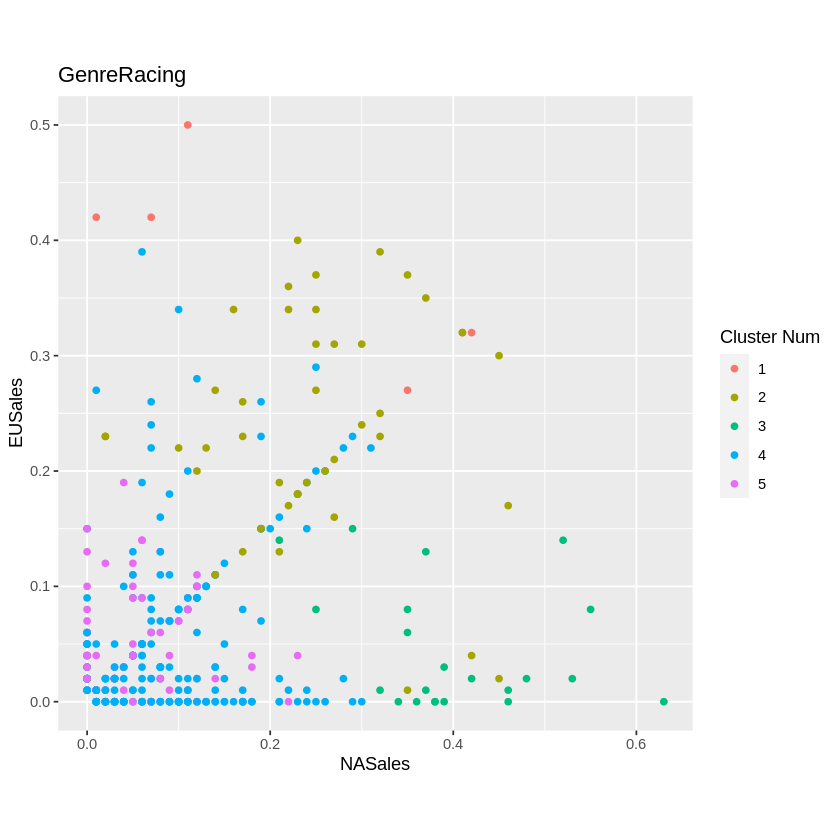

[1] "Summary for: GenreRole.Playing"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 16"
[1] "Average Global Sales: 0.972058823529412"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 6.25 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 6.25 %"
[1] "Games in franchise with high sales: 50 %"
[1] "Games in franchise: 50 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 62.5 %"
[1] "EC: 0 %"
[1] "E10+: 0 %"
[1] "T: 18.75 %"
[1] "M: 18.75 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformWii PlatformX360
2558          3          1           2           3           2            2
     PlatformXB
2558          3
[1] "Platform Frequencies"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformWii PlatformX360
2558          3          1           2           3           2            2
     PlatformXB
2558          3
[1]

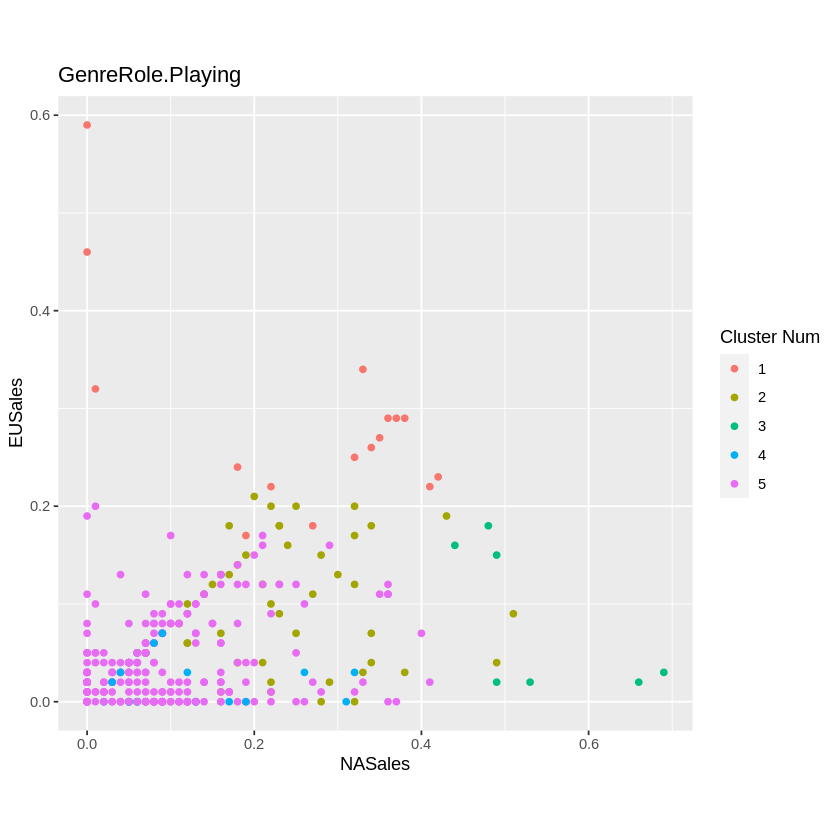

[1] "Summary for: GenreShooter"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 122"
[1] "Average Global Sales: 0.951012536162006"
[1] "Percentages:"
[1] "High global sales: 95.9016393442623 %"
[1] "High NA sales: 11.4754098360656 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 1.63934426229508 %"
[1] "High Other sales: 7.37704918032787 %"
[1] "Games in franchise with high sales: 54.0983606557377 %"
[1] "Games in franchise: 54.0983606557377 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 34.4262295081967 %"
[1] "EC: 0 %"
[1] "E10+: 11.4754098360656 %"
[1] "T: 33.6065573770492 %"
[1] "M: 20.4918032786885 %"
[1] "Platform Frequencies of High Sale Games:"
     Platform3DS PlatformDS PlatformGBA PlatformGC PlatformPS2 PlatformPS3
2632           2         11           2          6          18          27
     PlatformPSP PlatformPSV PlatformWii PlatformWiiU PlatformX360 PlatformXB
2632           1           1          19     

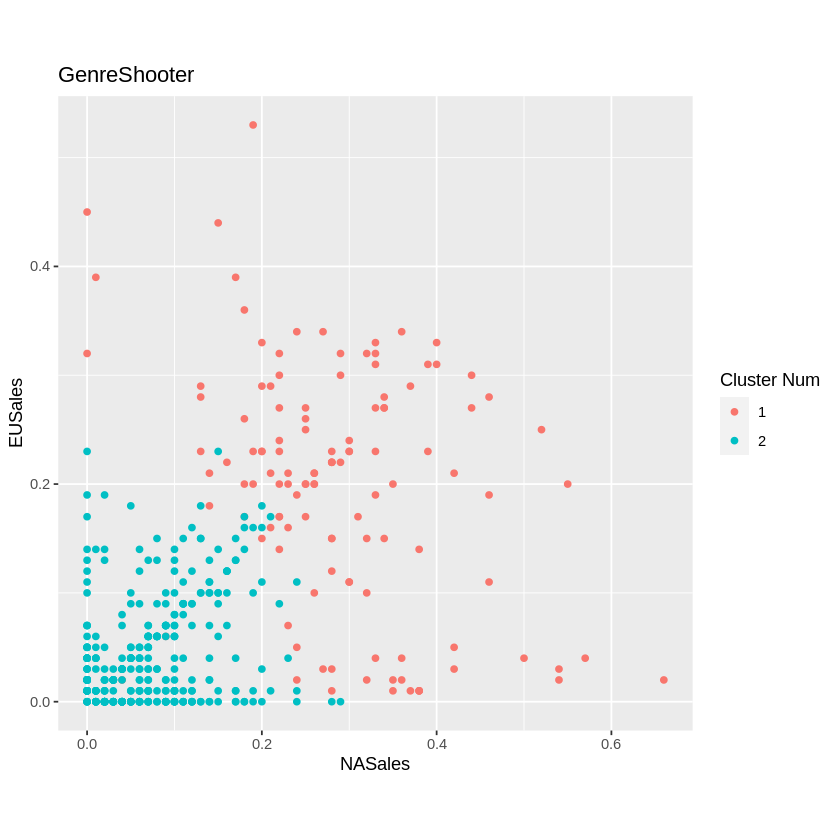

[1] "Summary for: GenreSimulation"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 44"
[1] "Average Global Sales: 0.977540106951872"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 11.3636363636364 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 11.3636363636364 %"
[1] "Games in franchise with high sales: 45.4545454545455 %"
[1] "Games in franchise: 45.4545454545455 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 36.3636363636364 %"
[1] "EC: 0 %"
[1] "E10+: 13.6363636363636 %"
[1] "T: 27.2727272727273 %"
[1] "M: 22.7272727272727 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGBA PlatformGC PlatformPS2 PlatformPS3 PlatformPSP
2551          3           1          2           9          13           1
     PlatformWii PlatformWiiU PlatformX360 PlatformXB
2551           6            1            7          1
[1] "Platform Frequencies"
     PlatformD

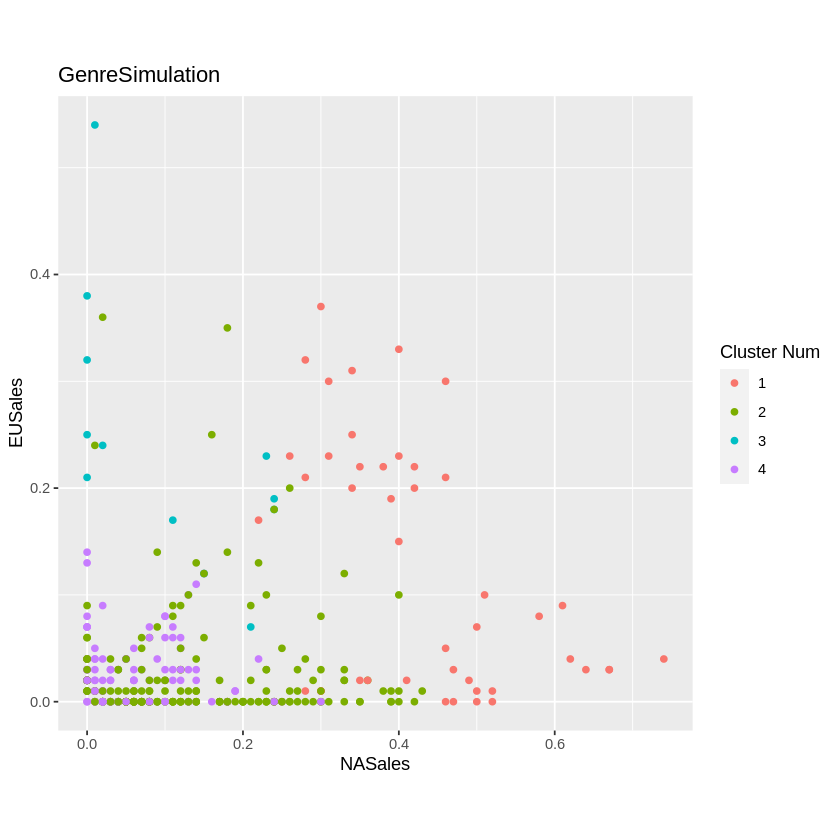

[1] "Summary for: GenreSports"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 63"
[1] "Average Global Sales: 0.922875816993464"
[1] "Percentages:"
[1] "High global sales: 71.4285714285714 %"
[1] "High NA sales: 12.6984126984127 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 6.34920634920635 %"
[1] "Games in franchise with high sales: 39.6825396825397 %"
[1] "Games in franchise: 47.6190476190476 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 36.5079365079365 %"
[1] "EC: 0 %"
[1] "E10+: 12.6984126984127 %"
[1] "T: 30.1587301587302 %"
[1] "M: 20.6349206349206 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformGC PlatformPS2 PlatformPS3 PlatformPSP PlatformWii
2630          6          2           7          13           1           6
     PlatformX360 PlatformXB
2630            9          1
[1] "Platform Frequencies"
     Platform3DS PlatformDS PlatformGBA PlatformGC Plat

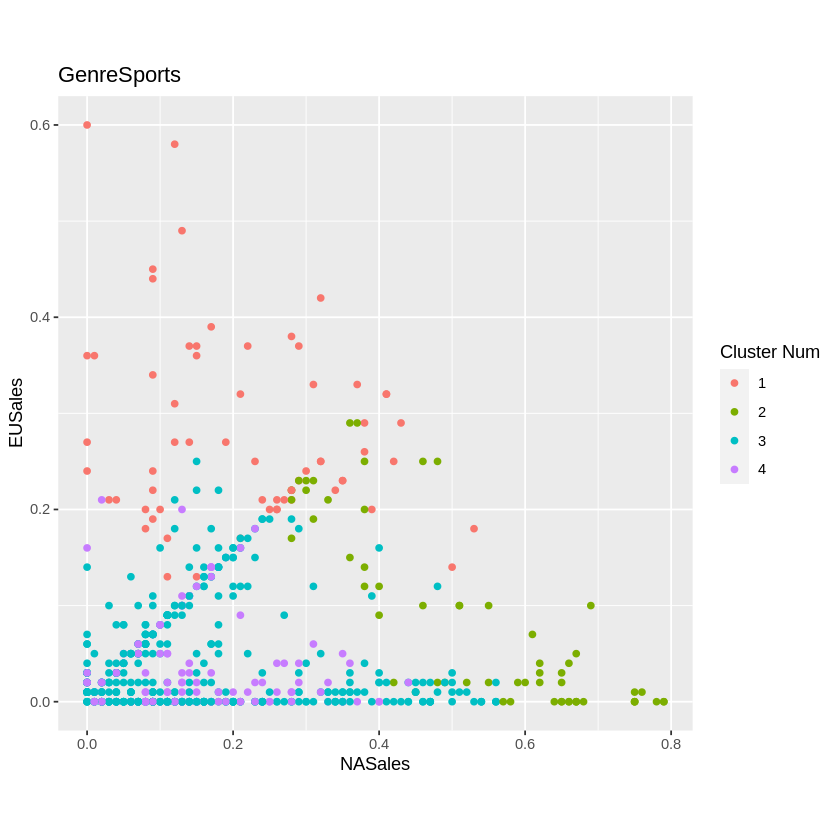

[1] "Summary for: GenreStrategy"
[1] "*******************************************"
[1] "Clus= 1"
[1] "Total number of games in cluster: 6"
[1] "Average Global Sales: 0.994117647058824"
[1] "Percentages:"
[1] "High global sales: 100 %"
[1] "High NA sales: 0 %"
[1] "High JP sales: 0 %"
[1] "High EU sales: 0 %"
[1] "High Other sales: 0 %"
[1] "Games in franchise with high sales: 16.6666666666667 %"
[1] "Games in franchise: 16.6666666666667 %"
[1] "Percentage of high selling games ratings:"
[1] "E: 33.3333333333333 %"
[1] "EC: 0 %"
[1] "E10+: 33.3333333333333 %"
[1] "T: 16.6666666666667 %"
[1] "M: 16.6666666666667 %"
[1] "Platform Frequencies of High Sale Games:"
     PlatformDS PlatformPS3 PlatformWii
2433          1           2           3
[1] "Platform Frequencies"
     PlatformDS PlatformPS3 PlatformWii
2433          1           2           3
[1] "------------------------------------------"
[1] "Clus= 2"
[1] "Total number of games in cluster: 11"
[1] "Average Global Sales: 0.9882352941

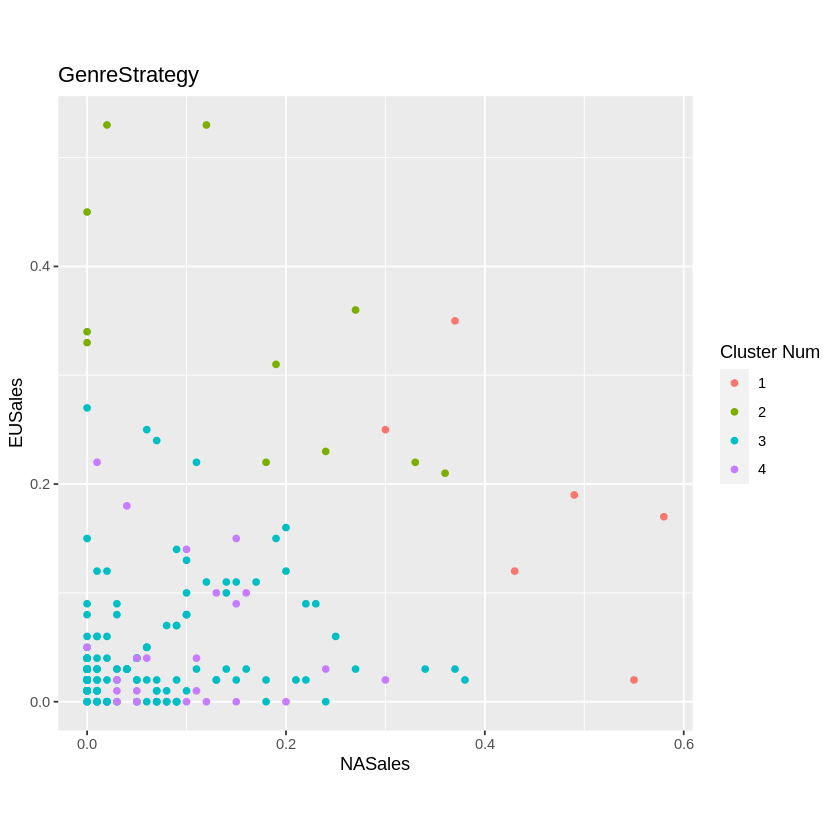

In [ ]:
genreHierarchicalClustering(clustering_dataset, genres, clusterNums, 
  gamesForClustering, "NASales", "EUSales")

## Neural Networks

In [ ]:
# load game data to be used in NNs
games_for_nn <- cbind(select(games_keep_outliers, contains("inFranchise")),
                      select(games_keep_outliers, matches("^Genre.*")),
                      select(games_keep_outliers, contains("GlobalSales")))

# load and prepare NN regression data
nn_data <- NN_regression_data(games_for_nn)

# Getting the lables from the train and test set
nn_train_data <- NN_features_labels(nn_data$train)
nn_test_data <- NN_features_labels(nn_data$test)

# Splitting the data
split_nn_data <- NN_value_split_data(games_for_nn)

In [ ]:
# Training neural network
sales_model <- NN_train_network(as.data.frame(split_nn_data$low_train$features), split_nn_data$low_train$labels)

Model: "sequential"
________________________________________________________________________________
 Layer (type)                       Output Shape                    Param #     
 dense_4 (Dense)                    (None, 64)                      896         
 dropout_2 (Dropout)                (None, 64)                      0           
 dense_3 (Dense)                    (None, 128)                     8320        
 dropout_1 (Dropout)                (None, 128)                     0           
 dense_2 (Dense)                    (None, 128)                     16512       
 dropout (Dropout)                  (None, 128)                     0           
 dense_1 (Dense)                    (None, 64)                      8256        
 dense (Dense)                      (None, 1)                       65          
Total params: 34,049
Trainable params: 34,049
Non-trainable params: 0
________________________________________________________________________________


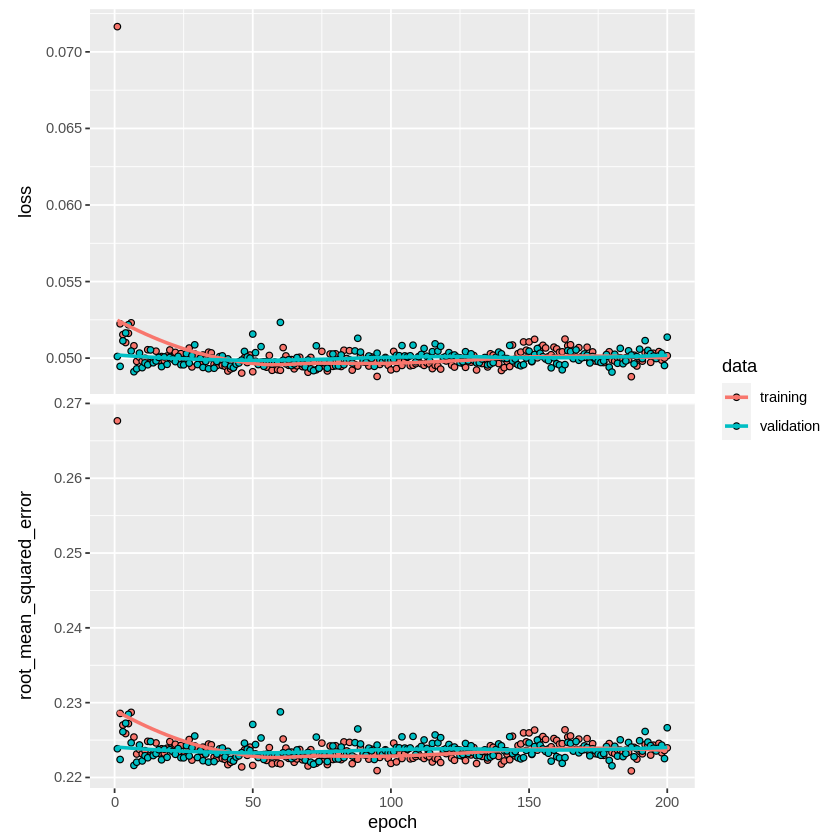

In [ ]:
# Plotting the history of the model
plot(sales_model$history)

# Making predictions of new data with the model
predictions <- predict(sales_model$sales_model, as.matrix(split_nn_data$low_test$features))

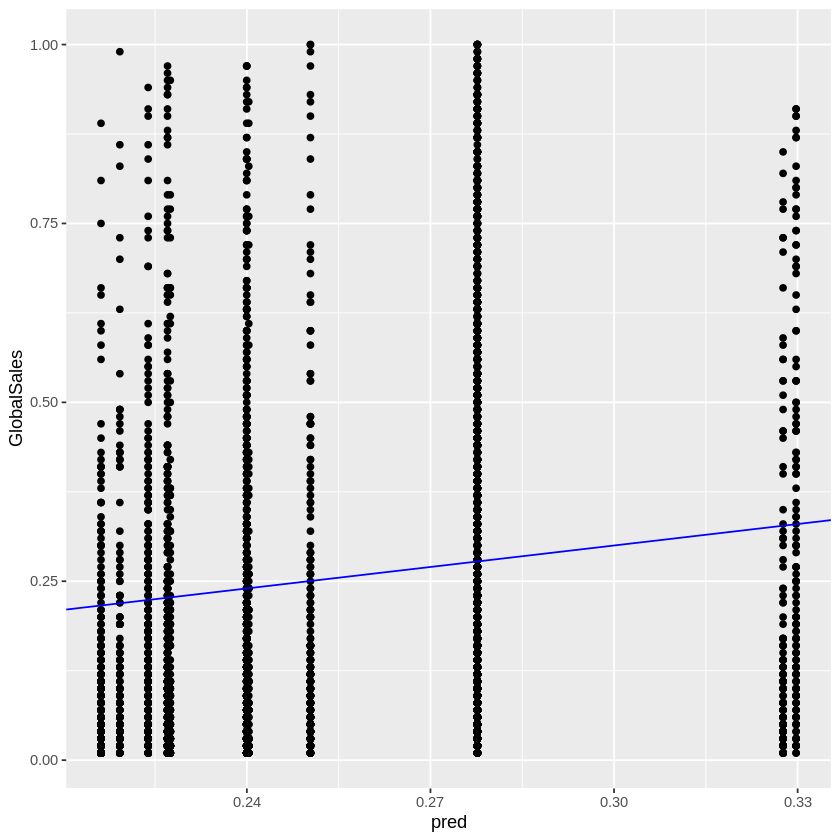

In [ ]:
# Plotting predictions
ggplot(data.frame(pred = as.numeric(predictions), GlobalSales = split_nn_data$low_test$labels$GlobalSales)) +
  geom_point(aes(x = pred, y = GlobalSales)) +
  geom_abline(intercept = 0, slope = 1, color = "blue")

## Random Forests

In [ ]:
# Training a random forests algorithm on sales and the train set
print("Random Forests: Game Info Vs GlobalSales")
dt_game_data <- DT_data(games_keep_outliers)
output.forest <- randomForest(GlobalSales~., data = dt_game_data$train)
print(output.forest)
print(importance(output.forest), 2)
 
# Training a radnom forests algorithm on sales with a logarithmic transform
print("Random Forests: Game Info Vs Log(GlobalSales)")
dt_log_game_data <- DT_log_data(games_keep_outliers)
output.forest_log <- randomForest(log_sales~., data = dt_log_game_data$train)
print(output.forest_log)
print(importance(output.forest_log), 2)

[1] "Decision Tree: Game Info Vs GlobalSales"

Call:
 randomForest(formula = GlobalSales ~ ., data = dt_game_data$train) 
               Type of random forest: regression
                     Number of trees: 500
No. of variables tried at each split: 18

          Mean of squared residuals: 1.271054
                    % Var explained: 1.2
                                  IncNodePurity
Rating                                    511.0
YearofRelease                             127.7
NorthernAmerica_ageMedian                 130.2
NorthernAmerica_femaleRatioMedian         169.6
Japan_ageMedian                           131.3
Japan_femaleRatioMedian                   121.9
Europe_ageMedian                          130.4
Europe_femaleRatioMedian                  194.0
Other_ageMedian                           123.8
Other_femaleRatioMedian                   233.6
GenreAction                               156.9
GenreAdventure                             38.5
GenreFighting                     

In [ ]:
sapply(dt_log_numeric$train, class)

Name                         Publisher 
                      "character"                       "character" 
                      CriticCount                         UserCount 
                        "integer"                         "integer" 
                        Developer                            Rating 
                      "character"                       "character" 
                      ReleaseDate                     YearofRelease 
                      "character"                         "numeric" 
                      CriticScore                         UserScore 
                        "numeric"                         "integer" 
        NorthernAmerica_ageMedian NorthernAmerica_femaleRatioMedian 
                        "numeric"                         "numeric" 
                  Japan_ageMedian           Japan_femaleRatioMedian 
                        "numeric"                         "numeric" 
                 Europe_ageMedian          Europe_femaleRatioMedian 
                        "numeric"                         "numeric" 
                  Other_ageMedian           Other_femaleRatioMedian 
                        "numeric"                         "numeric" 
                      GenreAction                    GenreAdventure 
                        "numeric"                         "numeric" 
                    GenreFighting                         GenreMisc 
                        "numeric"                         "numeric" 
                    GenrePlatform                       GenrePuzzle 
                        "numeric"                         "numeric" 
                      GenreRacing                 GenreRole.Playing 
                        "numeric"                         "numeric" 
                     GenreShooter                   GenreSimulation 
                        "numeric"                         "numeric" 
                      GenreSports                     GenreStrategy 
                        "numeric"                         "numeric" 
                     Platform2600                       Platform3DO 
                        "numeric"                         "numeric" 
                      Platform3DS                        PlatformDC 
                        "numeric"                         "numeric" 
                       PlatformDS                        PlatformGB 
                        "numeric"                         "numeric" 
                      PlatformGBA                        PlatformGC 
                        "numeric"                         "numeric" 
                      PlatformGEN                        PlatformGG 
                        "numeric"                         "numeric" 
                      PlatformN64                       PlatformNES 
                        "numeric"                         "numeric" 
                       PlatformNG                        PlatformPC 
                        "numeric"                         "numeric" 
                     PlatformPCFX                        PlatformPS 
                        "numeric"                         "numeric" 
                      PlatformPS2                       PlatformPS3 
                        "numeric"                         "numeric" 
                      PlatformPS4                       PlatformPSP 
                        "numeric"                         "numeric" 
                      PlatformPSV                       PlatformSAT 
                        "numeric"                         "numeric" 
                      PlatformSCD                      PlatformSNES 
                        "numeric"                         "numeric" 
                     PlatformTG16                       PlatformWii 
                        "numeric"                         "numeric" 
                     PlatformWiiU                        PlatformWS 
                        "numeric"                         "numeric" 
                     Platfo

In [ ]:
# Training a radnom forests algorithm on sales with a logarithmic transform #
# And with only numeric data
print("Random Forests: with only numeric data")
dt_log_numeric <- DT_log_data(games_keep_outliers)

dt_log_numeric$train <- dt_log_numeric$train %>% select(-c("CriticScore", "UserScore", "Publisher", "Rating", "ReleaseDate", "Name", "Developer"))

# sapply(dt_log_numeric$train, class)

output.forest_log_numeric <- randomForest(log_sales~., data = dt_log_numeric$train)
print(output.forest_log_numeric)
print(importance(output.forest_log_numeric), 2)

[1] "Random Forests: with only numeric data"

Call:
 randomForest(formula = log_sales ~ ., data = dt_log_numeric$train) 
               Type of random forest: regression
                     Number of trees: 500
No. of variables tried at each split: 18

          Mean of squared residuals: 0.1608978
                    % Var explained: 57.45
                                  IncNodePurity
CriticCount                               201.4
UserCount                                 266.9
YearofRelease                              18.6
NorthernAmerica_ageMedian                  17.9
NorthernAmerica_femaleRatioMedian          23.3
Japan_ageMedian                            17.9
Japan_femaleRatioMedian                    19.1
Europe_ageMedian                           18.3
Europe_femaleRatioMedian                   20.8
Other_ageMedian                            17.7
Other_femaleRatioMedian                    19.5
GenreAction                                11.0
GenreAdventure                  

In [ ]:
treeList <- RF2List(output.forest_log_numeric)
exec <- extractRules(treeList, dt_log_numeric$train)  # R-executable conditions

5255 rules (length<=6) were extracted from the first 100 trees.


In [ ]:
names(dt_game_data$test)

# Getting the rules and sorting them by prediction to get the best prediction
asdf <- as.data.frame(getRuleMetric(exec, dt_game_data$test, dt_game_data$test$GlobalSales))
asdf %>% arrange(pred)

[1] "GlobalSales"                       "Rating"                           
 [3] "YearofRelease"                     "NorthernAmerica_ageMedian"        
 [5] "NorthernAmerica_femaleRatioMedian" "Japan_ageMedian"                  
 [7] "Japan_femaleRatioMedian"           "Europe_ageMedian"                 
 [9] "Europe_femaleRatioMedian"          "Other_ageMedian"                  
[11] "Other_femaleRatioMedian"           "GenreAction"                      
[13] "GenreAdventure"                    "GenreFighting"                    
[15] "GenreMisc"                         "GenrePlatform"                    
[17] "GenrePuzzle"                       "GenreRacing"                      
[19] "GenreRole.Playing"                 "GenreShooter"                     
[21] "GenreSimulation"                   "GenreSports"                      
[23] "GenreStrategy"                     "Platform2600"                     
[25] "Platform3DO"                       "Platform3DS"                      
[27] "PlatformDC"                        "PlatformDS"                       
[29] "PlatformGB"                        "PlatformGBA"                      
[31] "PlatformGC"                        "PlatformGEN"                      
[33] "PlatformGG"                        "PlatformN64"                      
[35] "PlatformNES"                       "PlatformNG"                       
[37] "PlatformPC"                        "PlatformPCFX"                     
[39] "PlatformPS"                        "PlatformPS2"                      
[41] "PlatformPS3"                       "PlatformPS4"                      
[43] "PlatformPSP"                       "PlatformPSV"                      
[45] "PlatformSAT"                       "PlatformSCD"                      
[47] "PlatformSNES"                      "PlatformTG16"                     
[49] "PlatformWii"                       "PlatformWiiU"                     
[51] "PlatformWS"                        "PlatformX360"                     
[53] "PlatformXB"                        "PlatformXOne"                     
[55] "inFranchise"

[1] "3872 paths are ignored."


len,freq,err,condition,pred
<chr>,<chr>,<chr>,<chr>,<chr>
5,0,0,"X[,1]<=35.5 & X[,4]>39.65 & X[,26]>0.5 & X[,37]<=0.5 & X[,55]<=0.5",0.01
6,0.001,2.5e-05,"X[,1]<=39.5 & X[,5]<=50.4730558395386 & X[,10]<=26.1 & X[,12]>0.5 & X[,13]<=0.5 & X[,37]>0.5",0.015
6,0.001,2.5e-05,"X[,2]>170.5 & X[,2]>645 & X[,6]>44.05 & X[,8]>40.6 & X[,12]>0.5 & X[,37]>0.5",0.015
5,0.001,8.88888888888889e-05,"X[,1]<=36.5 & X[,10]>24.85 & X[,17]>0.5 & X[,23]<=0.5 & X[,37]<=0.5",0.0166666666666667
5,0,0,"X[,1]<=39.5 & X[,5]<=50.4730558395386 & X[,22]>0.5 & X[,37]<=0.5 & X[,55]<=0.5",0.02
6,0.001,6.66666666666667e-05,"X[,7]<=51.0788860321045 & X[,8]<=37.55 & X[,9]<=51.2545566558838 & X[,9]>51.1202640533447 & X[,20]>0.5 & X[,37]>0.5",0.02
6,0.001,0,"X[,7]<=51.0788860321045 & X[,8]>37.55 & X[,9]<=51.2545566558838 & X[,9]>51.1202640533447 & X[,20]>0.5 & X[,37]>0.5",0.02
6,0,0,"X[,5]<=50.5818138122559 & X[,6]<=44.05 & X[,9]<=51.0050449371338 & X[,21]>0.5 & X[,37]>0.5 & X[,55]<=0.5",0.02
6,0.001,4e-05,"X[,2]>528.5 & X[,3]>1999 & X[,11]<=50.2310600280762 & X[,11]>50.202018737793 & X[,20]>0.5 & X[,37]>0.5",0.02


<0 x 0 matrix>

[1] "dt_game_data.test.GlobalSales" "predicted"

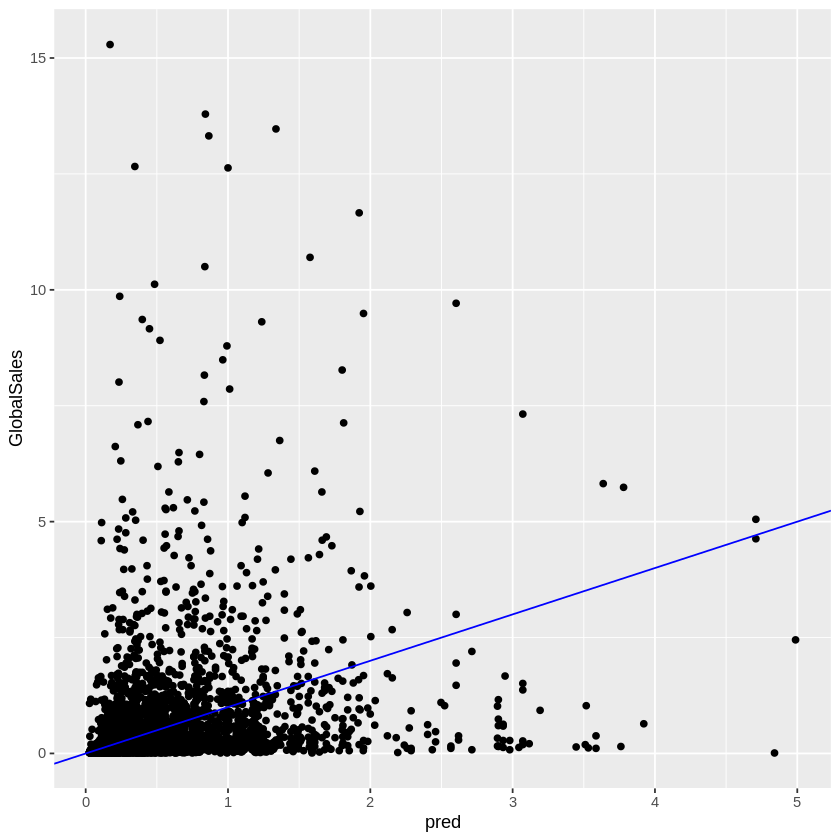

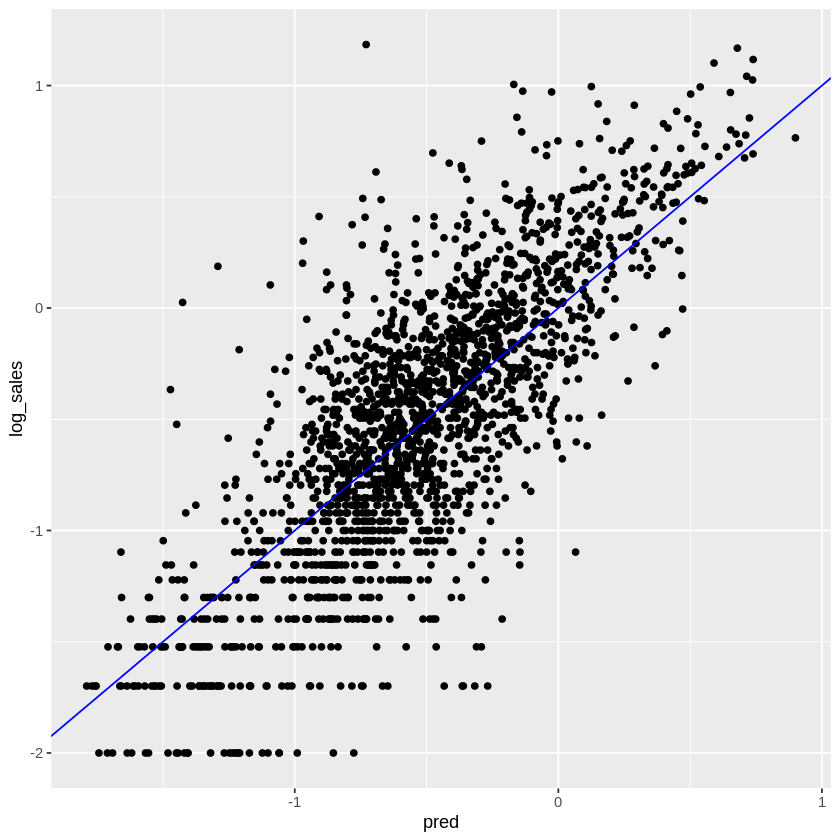

In [ ]:
# Making predictions with random forests
p1 <- predict(output.forest, dt_game_data$test)
comparison <- data.frame(dt_game_data$test$GlobalSales)

data.frame(dt_game_data$test$log_sales)
comparison$predicted <- p1
 

# Making predictions with logarithmic random forests
p2 <- predict(output.forest_log, dt_log_game_data$test)
comparison_log <- data.frame(dt_log_game_data$test$log_sales)

comparison_log$predicted <- p2
 
names(comparison)

# Plotting the predictions against the best fit line
ggplot(data.frame(pred = comparison$predicted, GlobalSales = comparison$dt_game_data.test.GlobalSales)) +
  geom_point(aes(x = pred, y = GlobalSales)) +
  geom_abline(intercept = 0, slope = 1, color = "blue")

ggplot(data.frame(pred = comparison_log$predicted, log_sales = comparison_log$dt_log_game_data.test.log_sales)) +
  geom_point(aes(x = pred, y = log_sales)) +
  geom_abline(intercept = 0, slope = 1, color = "blue")

In [ ]:
# Uploading igraph
pacman::p_unload("igraph")

The following packages were not previously loaded:
igraph





## Time series

In [ ]:
names(games_keep_outliers)

[1] "Name"                              "Publisher"                        
 [3] "NASales"                           "EUSales"                          
 [5] "JPSales"                           "OtherSales"                       
 [7] "GlobalSales"                       "CriticCount"                      
 [9] "UserCount"                         "Developer"                        
[11] "Rating"                            "ReleaseDate"                      
[13] "YearofRelease"                     "CriticScore"                      
[15] "UserScore"                         "NorthernAmerica_ageMedian"        
[17] "NorthernAmerica_femaleRatioMedian" "Japan_ageMedian"                  
[19] "Japan_femaleRatioMedian"           "Europe_ageMedian"                 
[21] "Europe_femaleRatioMedian"          "Other_ageMedian"                  
[23] "Other_femaleRatioMedian"           "GenreAction"                      
[25] "GenreAdventure"                    "GenreFighting"                    
[27] "GenreMisc"                         "GenrePlatform"                    
[29] "GenrePuzzle"                       "GenreRacing"                      
[31] "GenreRole.Playing"                 "GenreShooter"                     
[33] "GenreSimulation"                   "GenreSports"                      
[35] "GenreStrategy"                     "Platform2600"                     
[37] "Platform3DO"                       "Platform3DS"                      
[39] "PlatformDC"                        "PlatformDS"                       
[41] "PlatformGB"                        "PlatformGBA"                      
[43] "PlatformGC"                        "PlatformGEN"                      
[45] "PlatformGG"                        "PlatformN64"                      
[47] "PlatformNES"                       "PlatformNG"                       
[49] "PlatformPC"                        "PlatformPCFX"                     
[51] "PlatformPS"                        "PlatformPS2"                      
[53] "PlatformPS3"                       "PlatformPS4"                      
[55] "PlatformPSP"                       "PlatformPSV"                      
[57] "PlatformSAT"                       "PlatformSCD"                      
[59] "PlatformSNES"                      "PlatformTG16"                     
[61] "PlatformWii"                       "PlatformWiiU"                     
[63] "PlatformWS"                        "PlatformX360"                     
[65] "PlatformXB"                        "PlatformXOne"                     
[67] "inFranchise"

In [ ]:
TimeSeriesData <- games_TS[, c("ReleaseDate", "Platform", "Genre", "GlobalSales")]

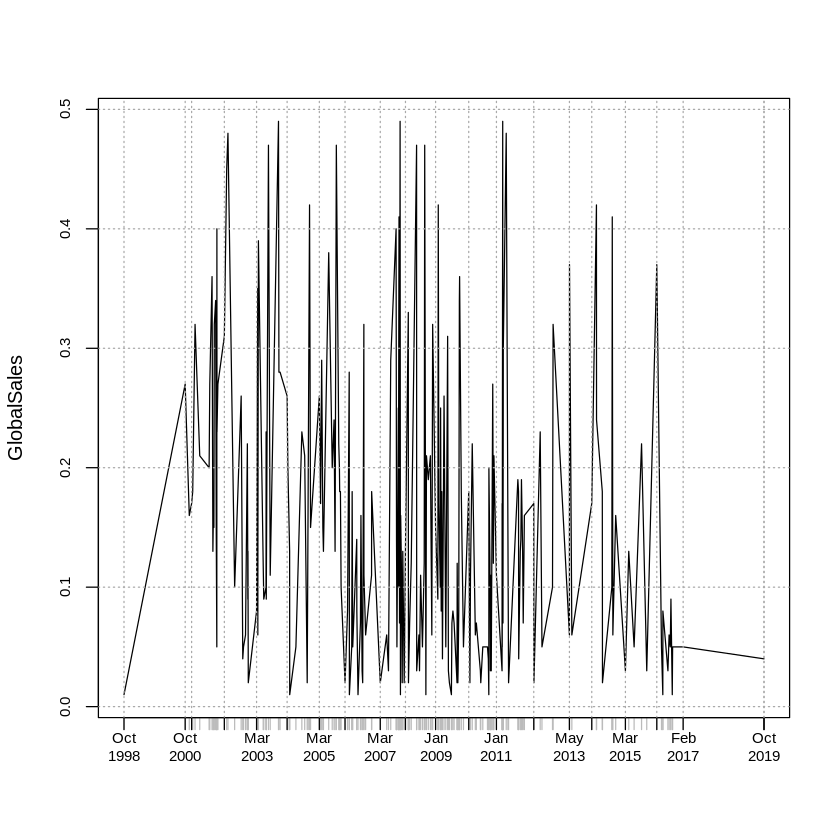

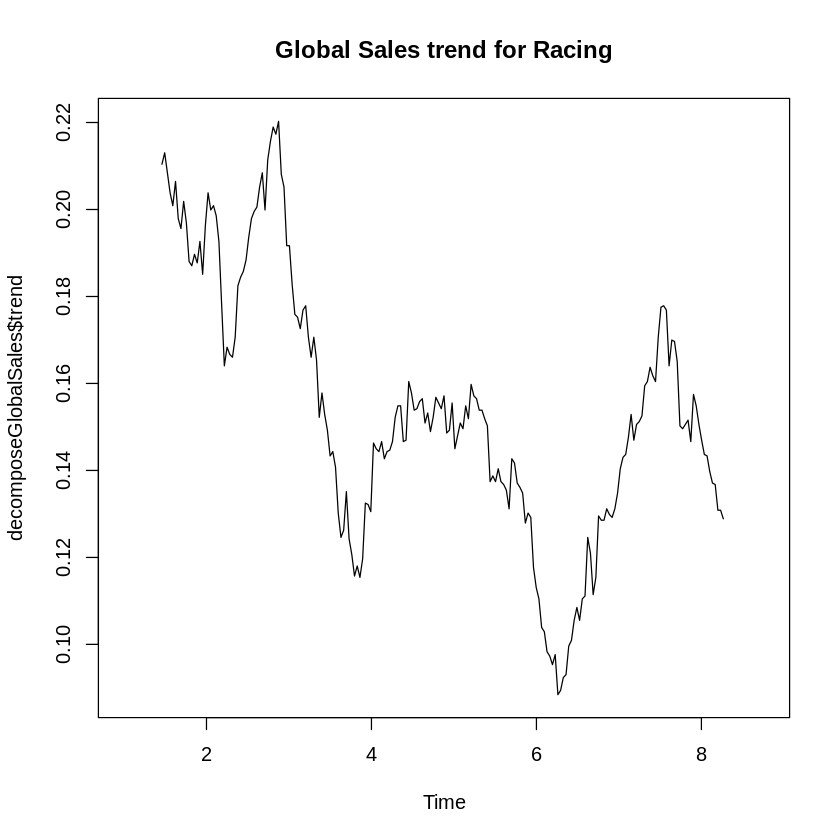

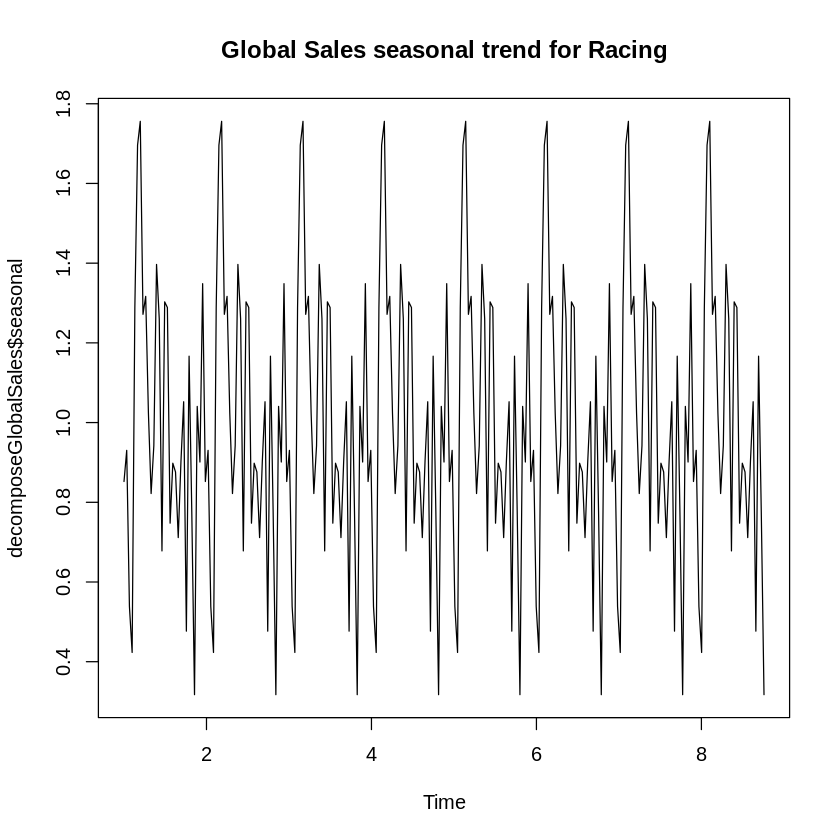

In [ ]:
# Training timeseries graph
GENRE = "Racing"
timeSeries = createTimeSeries(TimeSeriesData, GENRE)
plotTimeSeriesForGenre(TimeSeriesData, GENRE)
plotDecomposedTimeSeries(timeSeries, GENRE)

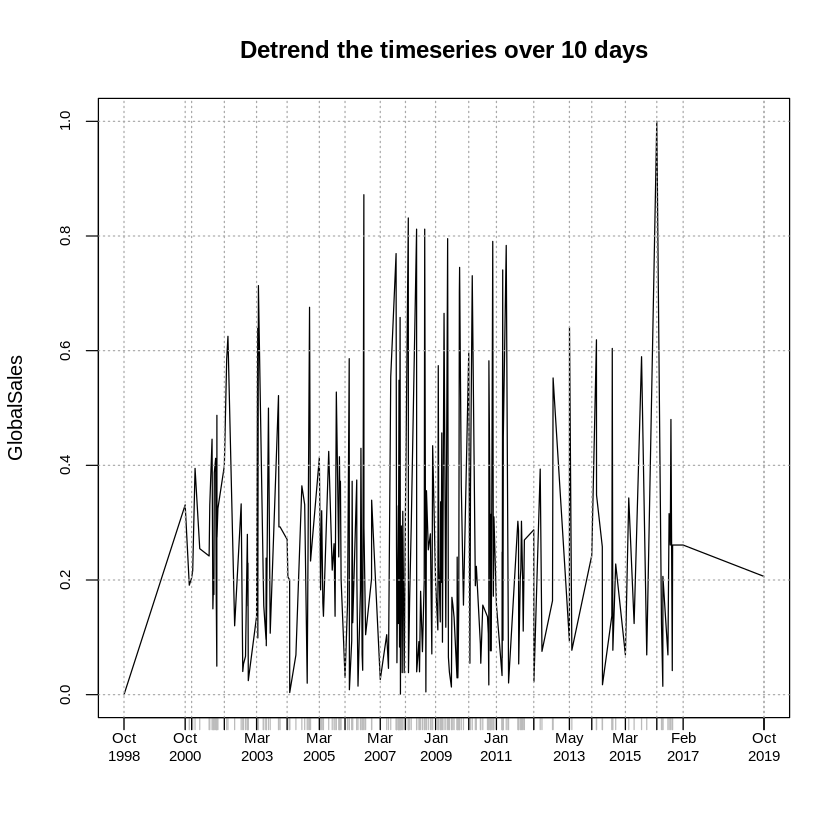

In [ ]:
# Creating time series dataset
dataset<-N_createTimeSeriesDataSet(timeSeries)

[1] "Initialise the H2O server"
 Connection successful!

R is connected to the H2O cluster: 
    H2O cluster uptime:         14 minutes 28 seconds 
    H2O cluster timezone:       Etc/UTC 
    H2O data parsing timezone:  UTC 
    H2O cluster version:        3.38.0.1 
    H2O cluster version age:    2 months and 9 days  
    H2O cluster name:           H2O_started_from_R_root_hfi876 
    H2O cluster total nodes:    1 
    H2O cluster total memory:   3.17 GB 
    H2O cluster total cores:    2 
    H2O cluster allowed cores:  1 
    H2O cluster healthy:        TRUE 
    H2O Connection ip:          localhost 
    H2O Connection port:        54321 
    H2O Connection proxy:       NA 
    H2O Internal Security:      FALSE 
    R Version:                  R version 4.2.2 Patched (2022-11-10 r83330) 

Model Details:

H2ORegressionModel: deeplearning
Model Key:  DeepLearning_model_R_1669646843908_2 
Status of Neuron Layers: predicting V10, regression, gaussian distribution, Quadratic loss, 621 

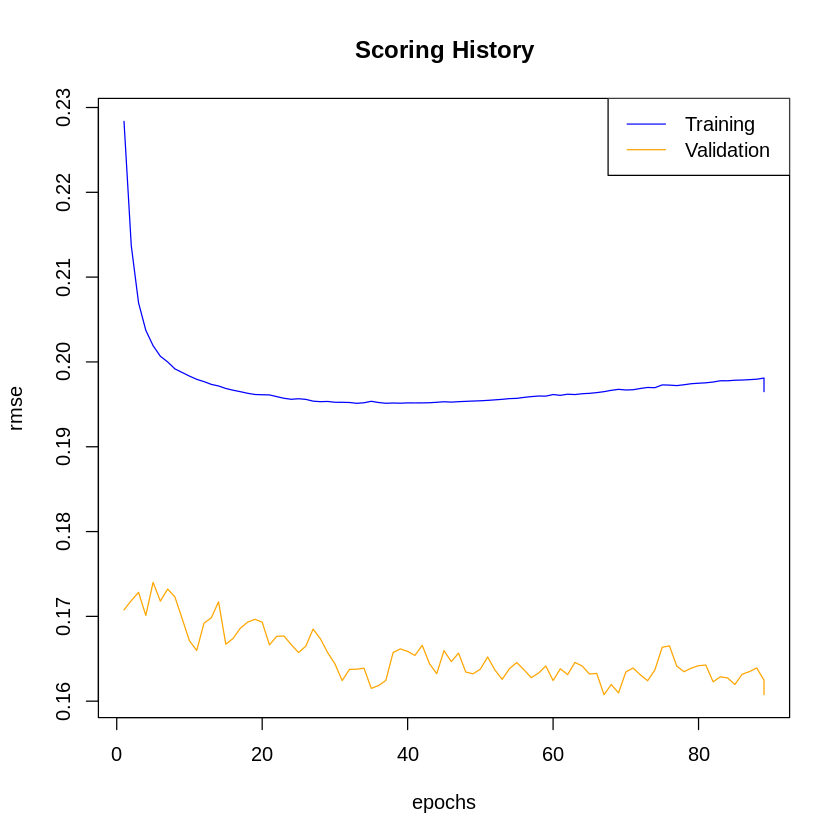

In [ ]:
# Time Delay Neural Network (TDNN)
N_DEEP_Initialise()

# Trains a neural network
outputFieldName=paste("V",TIME_SLOTS,sep="")

# Train and test subset
train<-subset(dataset$train,select=-means)
test<-subset(dataset$test,select=-means)

# Training a network
deep<-N_DEEP_Train(train=train,
                     fieldNameOutput=outputFieldName,
                     hidden=DEEP_HIDDEN,
                     stopping_rounds=DEEP_STOPPING,
                     stopping_tolerance=DEEP_TOLERANCE,
                     activation=DEEP_ACTIVATION,
                     reproducible=DEEP_REPRODUCABLE,
                     regression=TRUE)

summary(deep)
plot(deep)  # plots the scoring history

In [ ]:
# Evaluating the network
predictions<-N_EVALUATE_DeepNeural(test=test,
                                     fieldNameOutput=outputFieldName,
                                     deep=deep,
                                     regression=TRUE)

head(predictions)

[1] 0.1655425 0.2450120 0.3178072 0.2979246 0.2714843 0.2234129

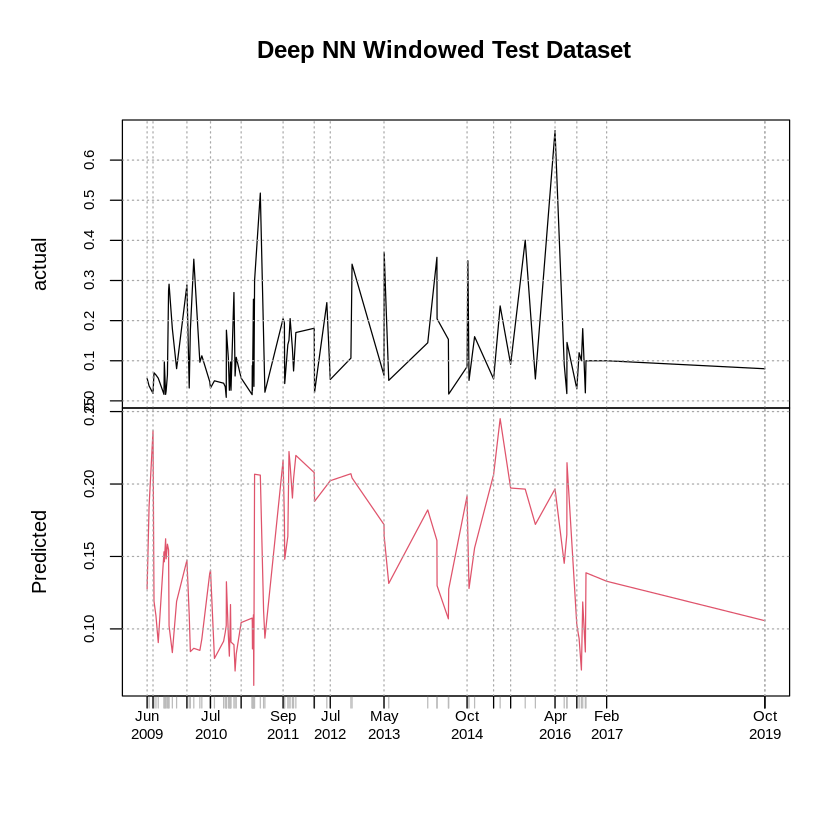

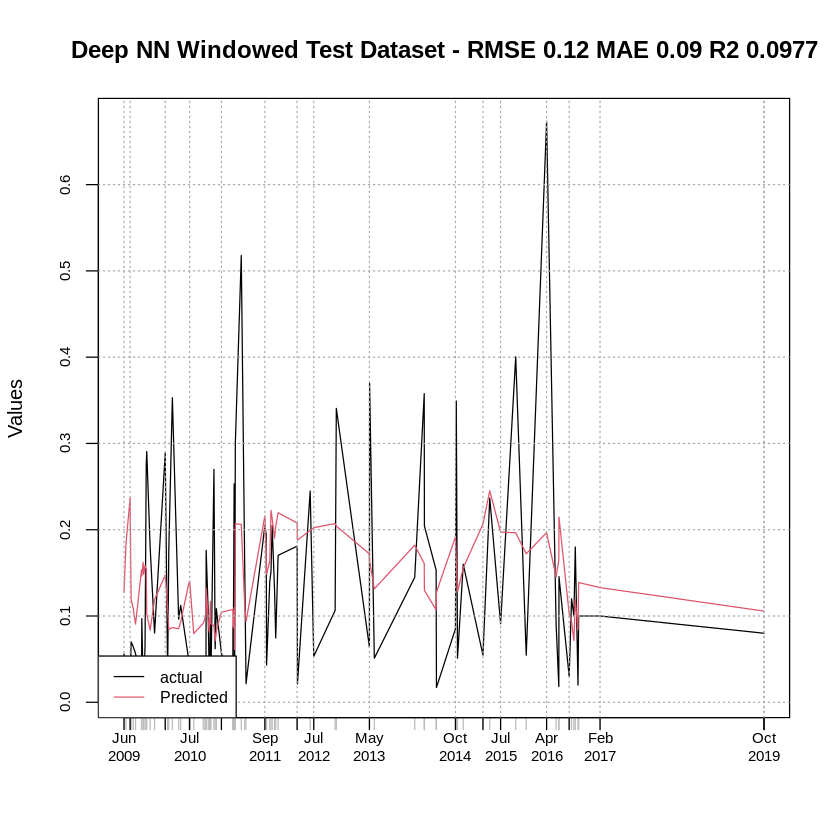

In [ ]:
# Actual outputs
actual<-test[,outputFieldName]

# Visualizing time series results
real_exp_pred<-N_visualiseTimeSeriesResults(actual=actual,
                                          predicted=predictions,
                                          means=dataset$test$means,
                                          dates=rownames(dataset$test),
                                          realmin=dataset$min,
                                          realmax=dataset$max,
                                          title="Deep NN Windowed Test Dataset",
                                          yaxis_title=c("actual","Predicted"),
                                          measuresFLag=TRUE)

In [ ]:
# Getting the table of actual and predicted
tidyTable<-data.frame(tail(real_exp_pred))
tidyTable<-cbind(tidyTable,data.frame(error=tidyTable$actual-tidyTable$predicted))
tidyTable$percent<-round((tidyTable$error/tidyTable$actual)*100,digits=2)
head(tidyTable)

,actual,predicted,error,percent
,<dbl>,<dbl>,<dbl>,<dbl>
2016-09-13,0.10,0.07164477,0.02835523,28.36
2016-09-21,0.18,0.11859007,0.06140993,34.12
2016-10-07,0.02,0.08410725,-0.06410725,-320.54
2016-10-11,0.10,0.13872551,-0.03872551,-38.73
2017-02-14,0.10,0.13288844,-0.03288844,-32.89
2019-10-08,0.08,0.10567934,-0.02567934,-32.10


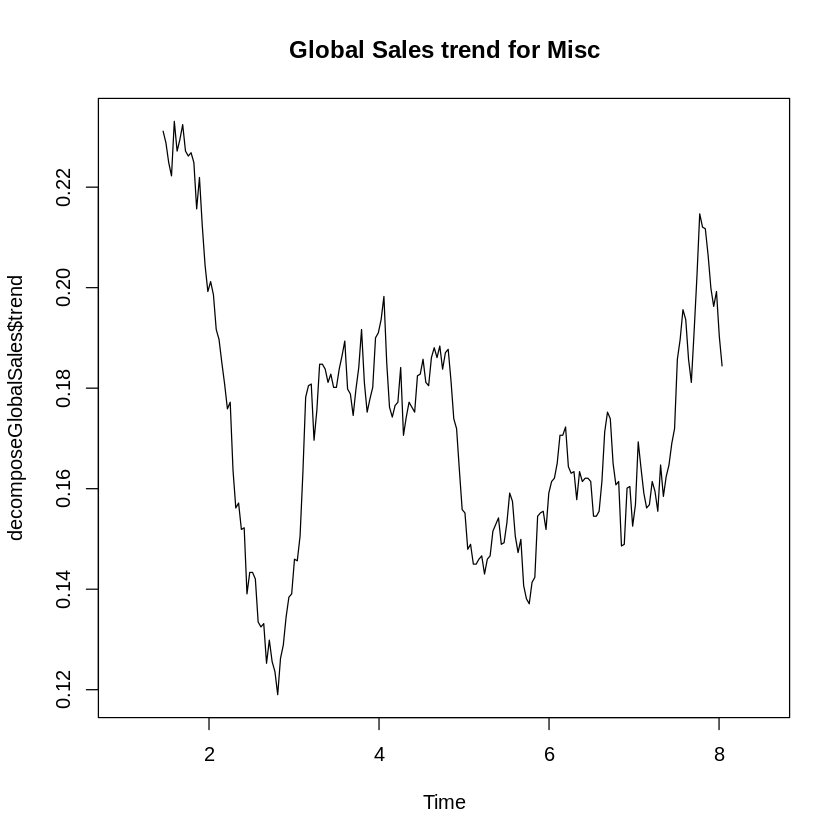

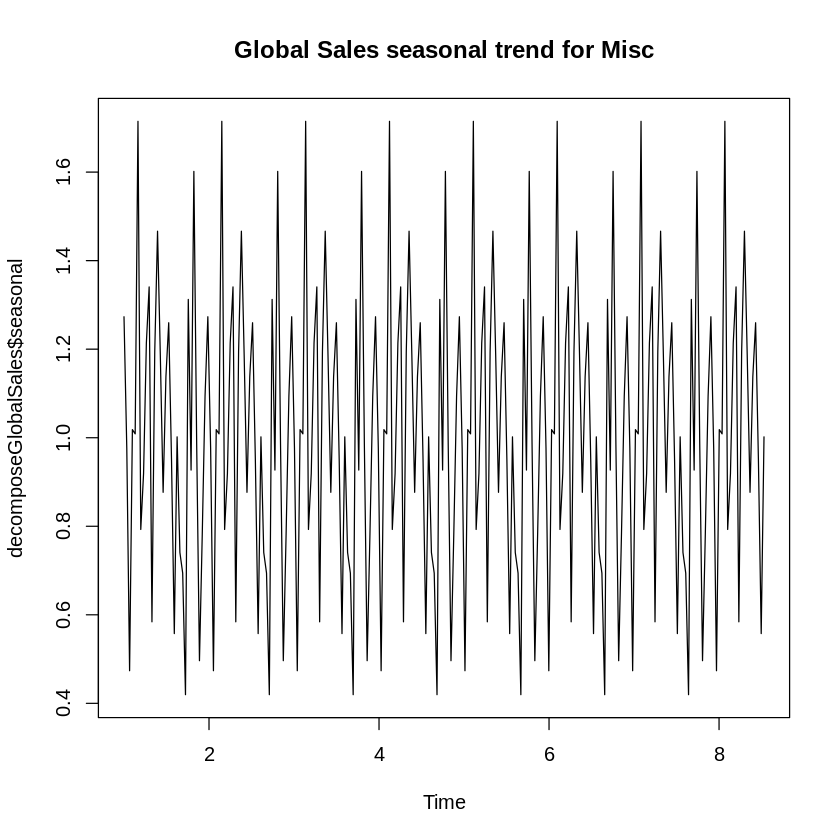

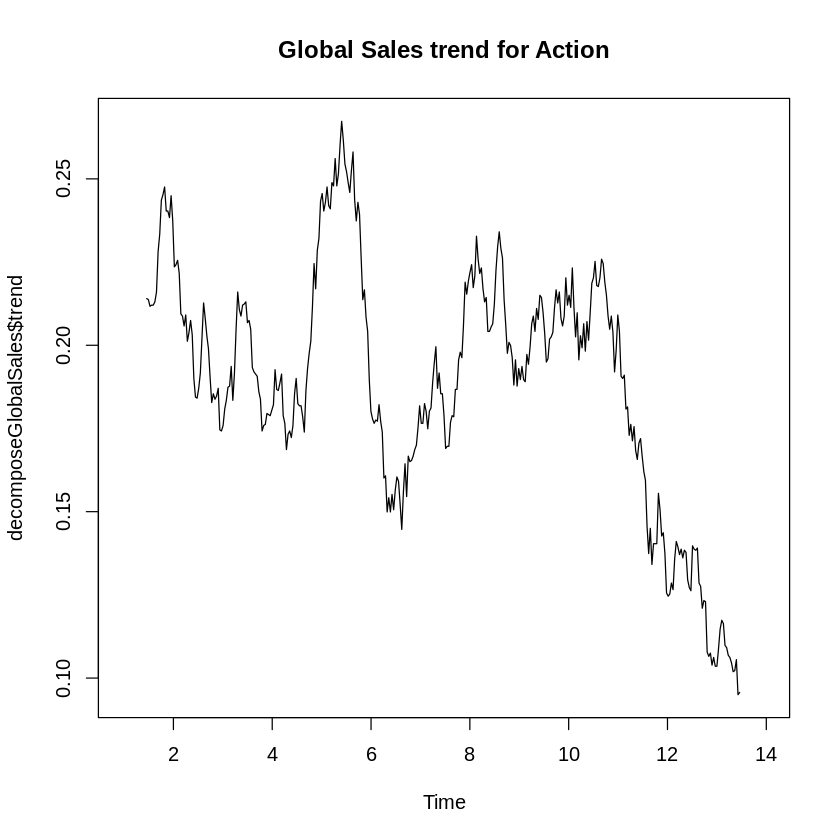

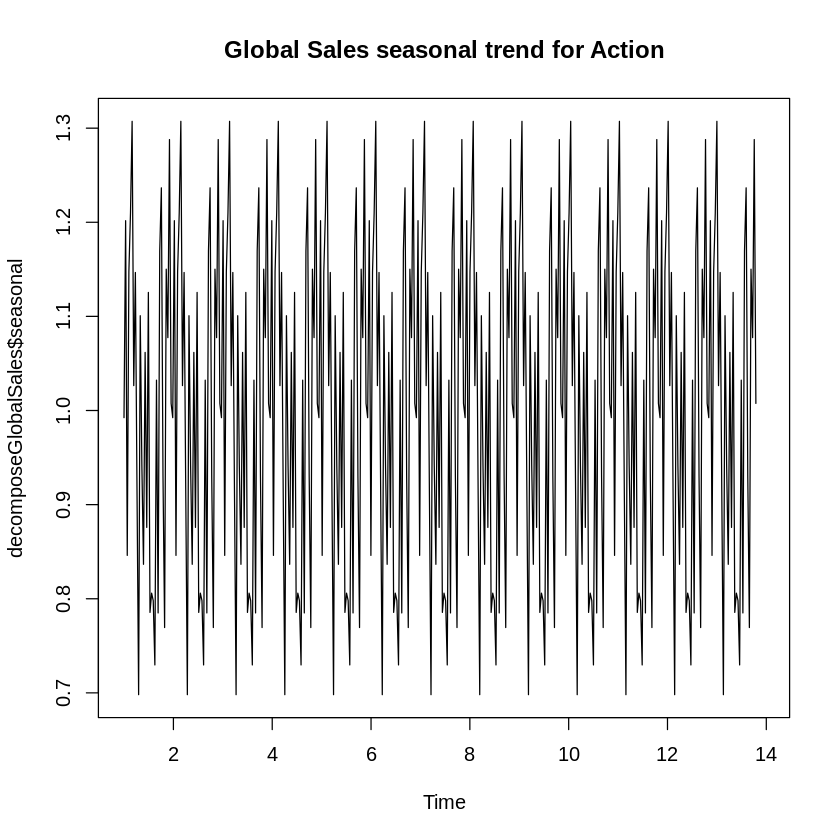

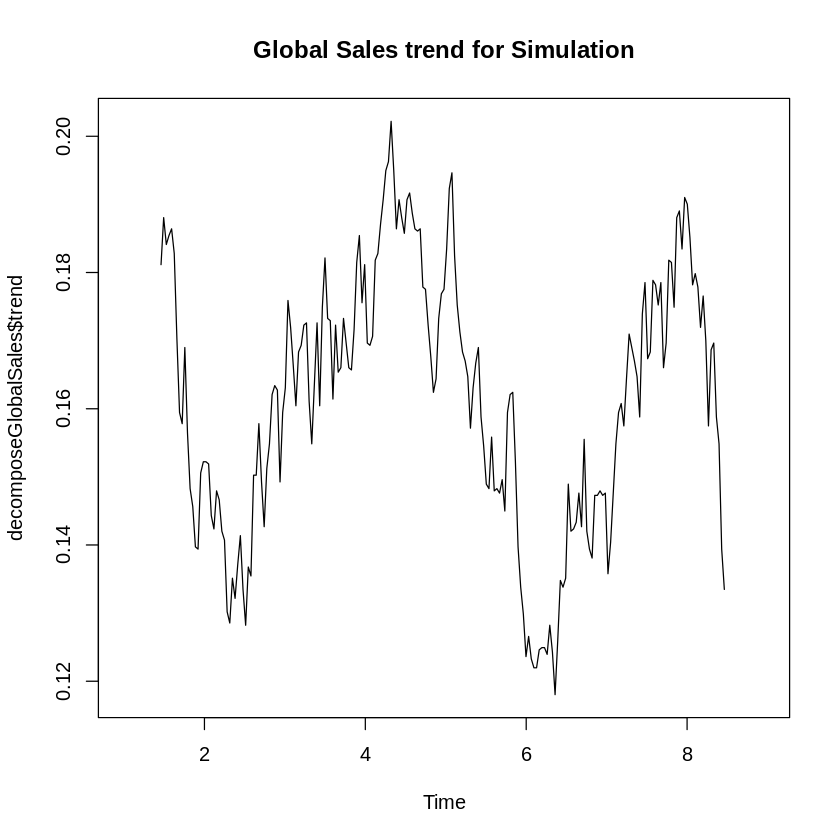

...

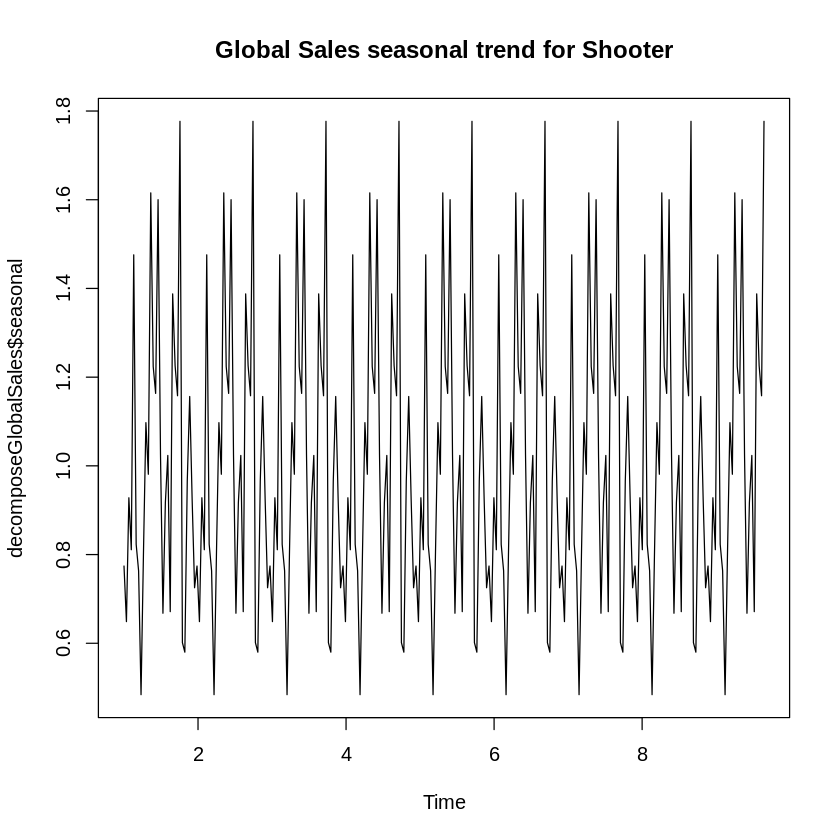

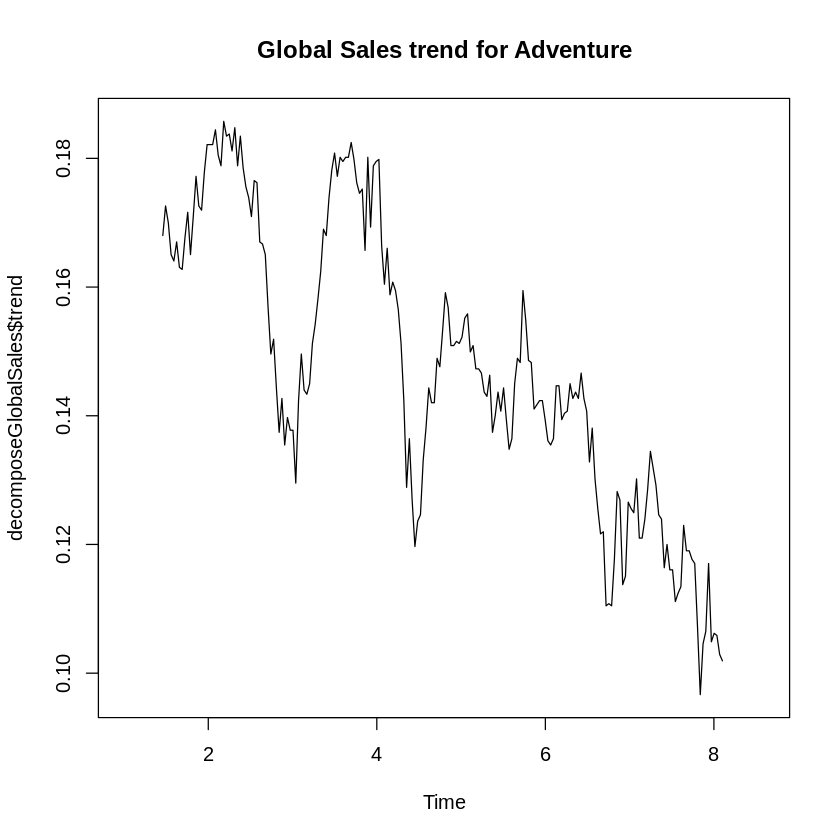

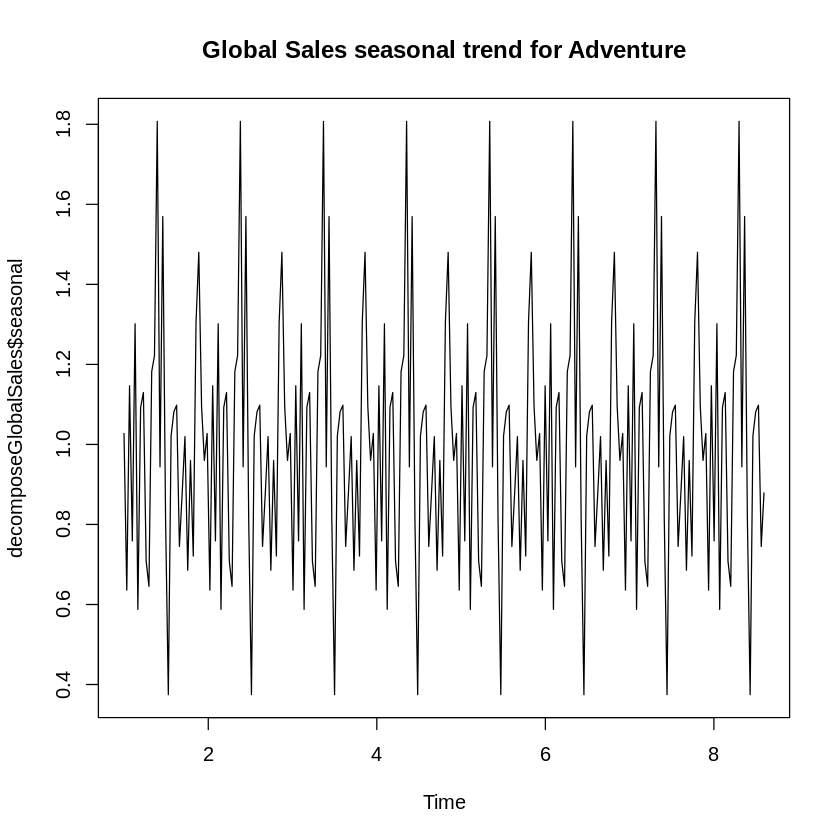

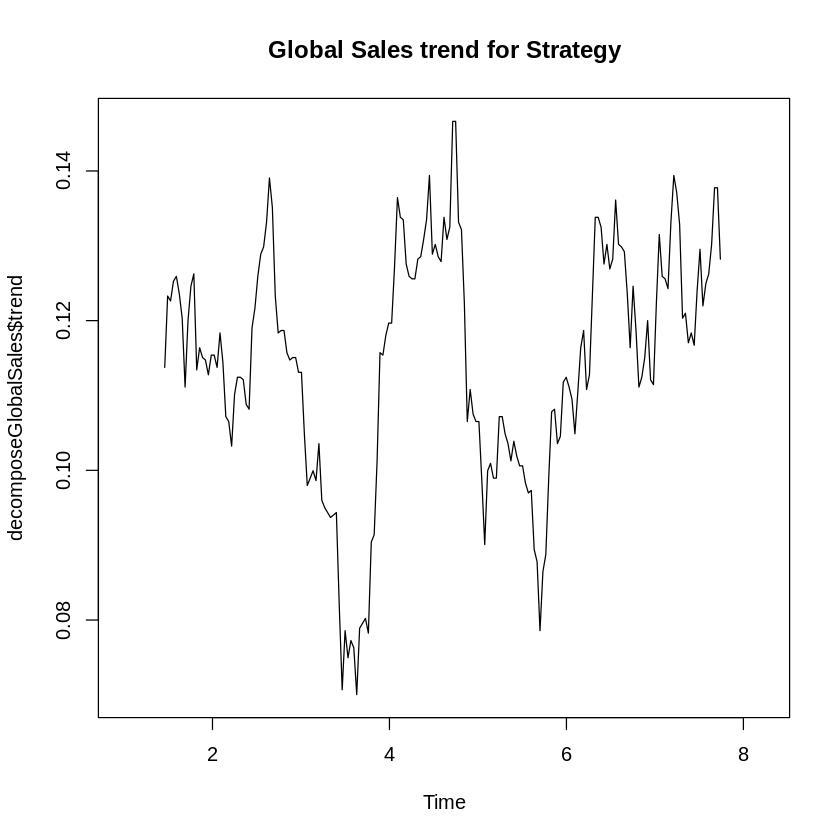

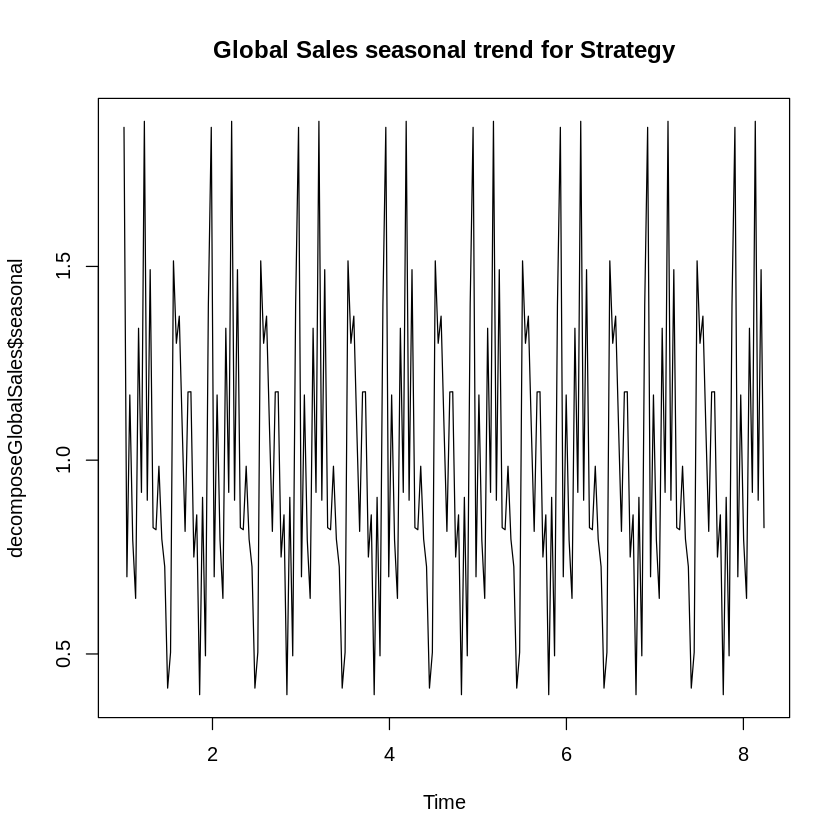

In [ ]:
# Plotting time series for genres
for (genre in unique(games$Genre)) {
  timeSeries = createTimeSeries(TimeSeriesData, genre)
  plotDecomposedTimeSeries(timeSeries, genre)
}

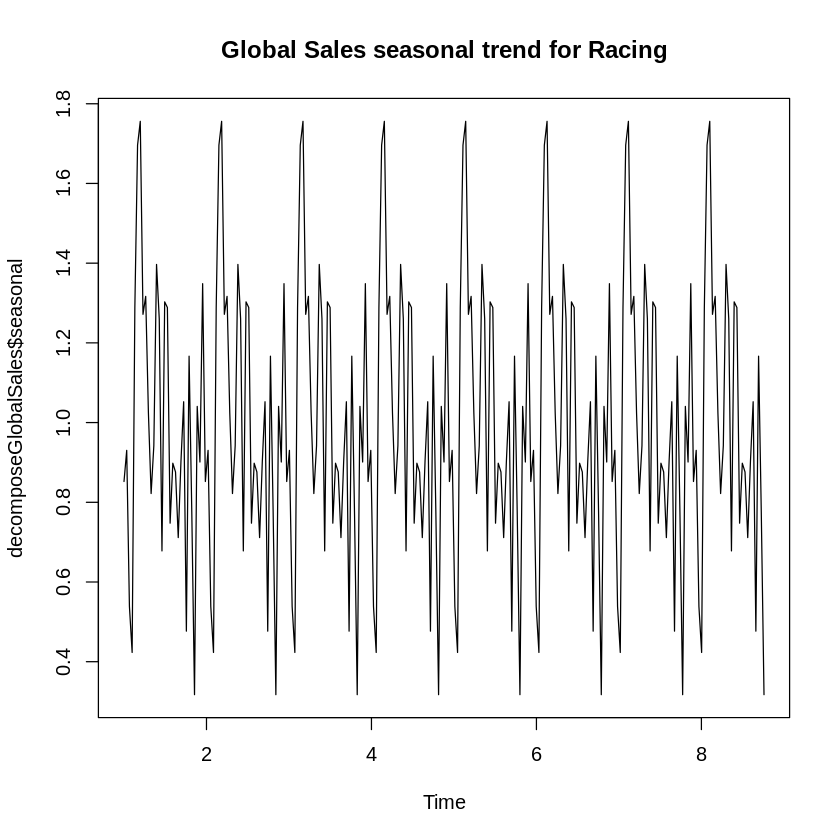

In [ ]:
# Making time series for Rating
TimeSeriesGenre = subset(TimeSeriesData, TimeSeriesData$Genre == "Racing")
timeSeries <- createTimeSeries(TimeSeriesGenre, "Racing")
finalTimeSeries <- as.timeSeries(timeSeries)
tsGlobalSales = ts(finalTimeSeries, frequency  = 365/12) #monthly / seasonal
decomposeGlobalSales = decompose(tsGlobalSales, "multiplicative")
plot(decomposeGlobalSales$seasonal, main = paste("Global Sales seasonal trend for", "Racing"))

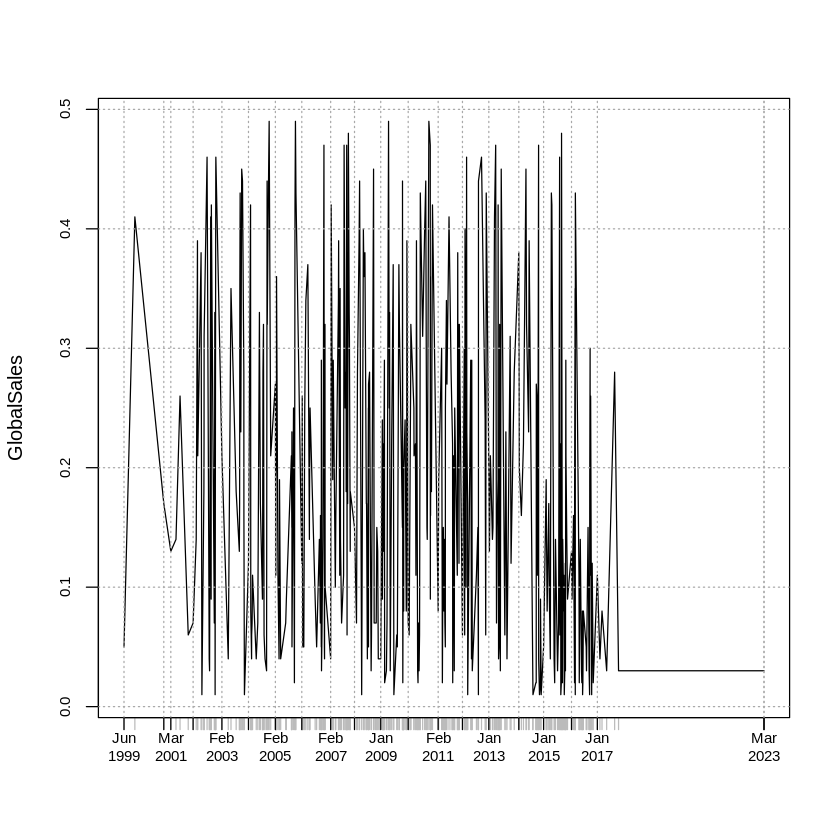

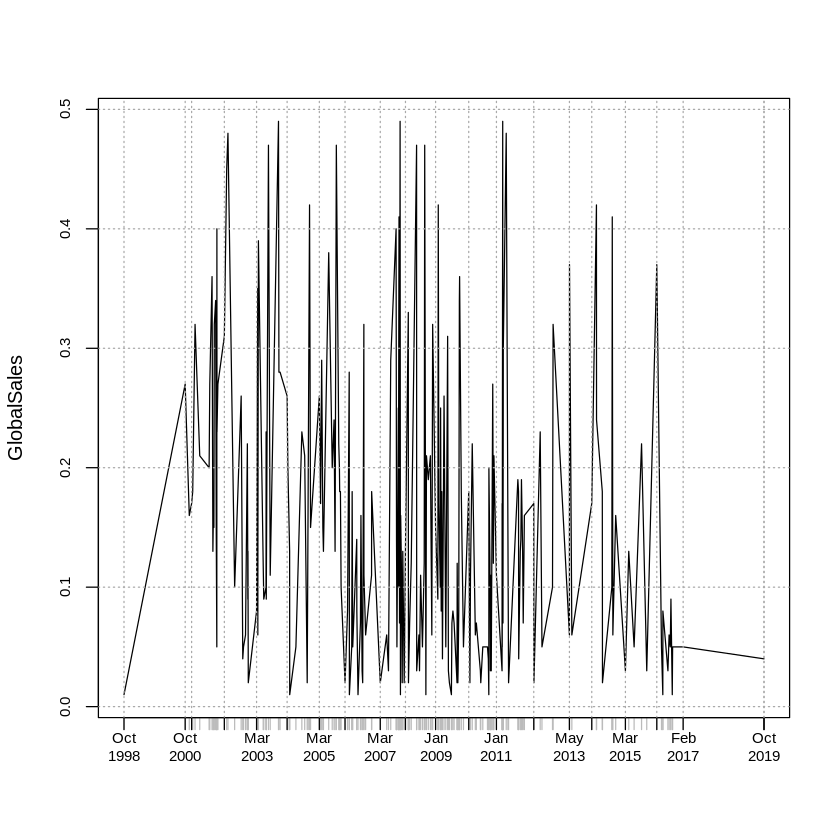

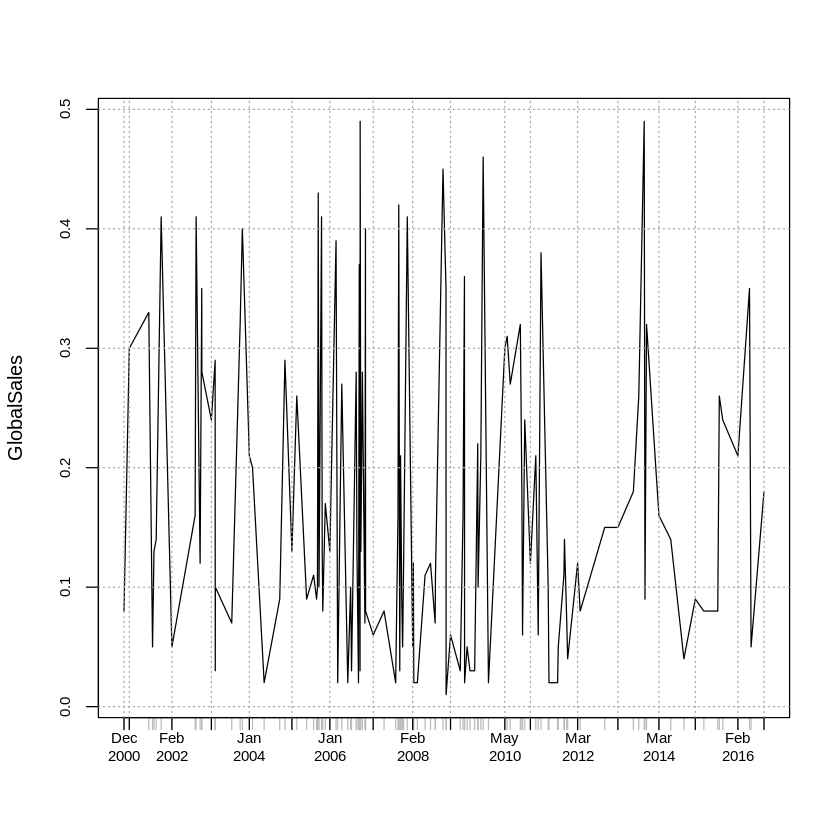

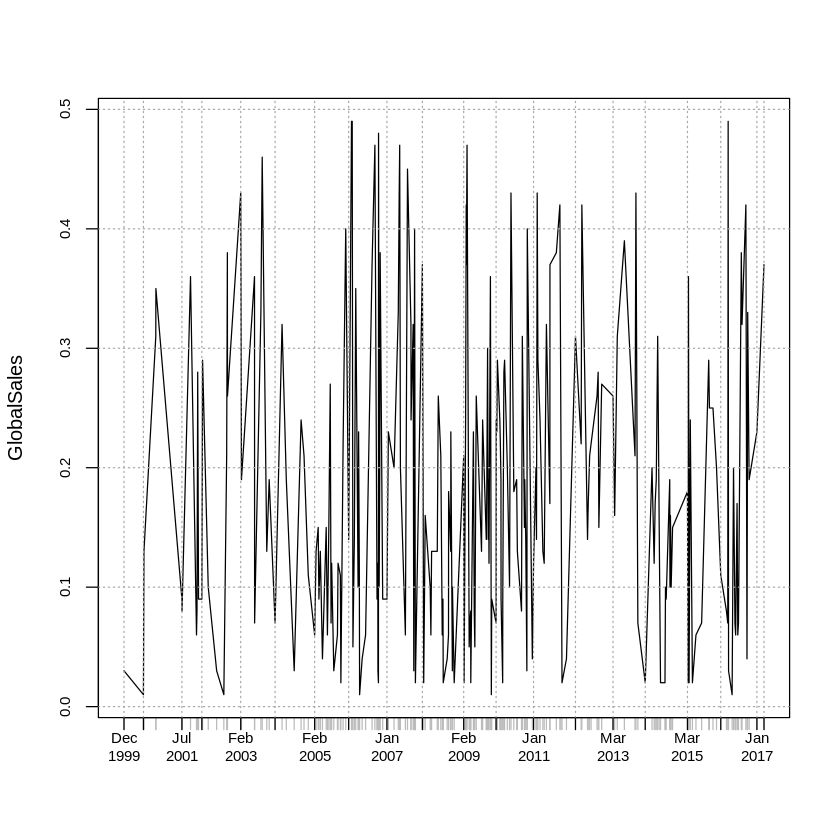

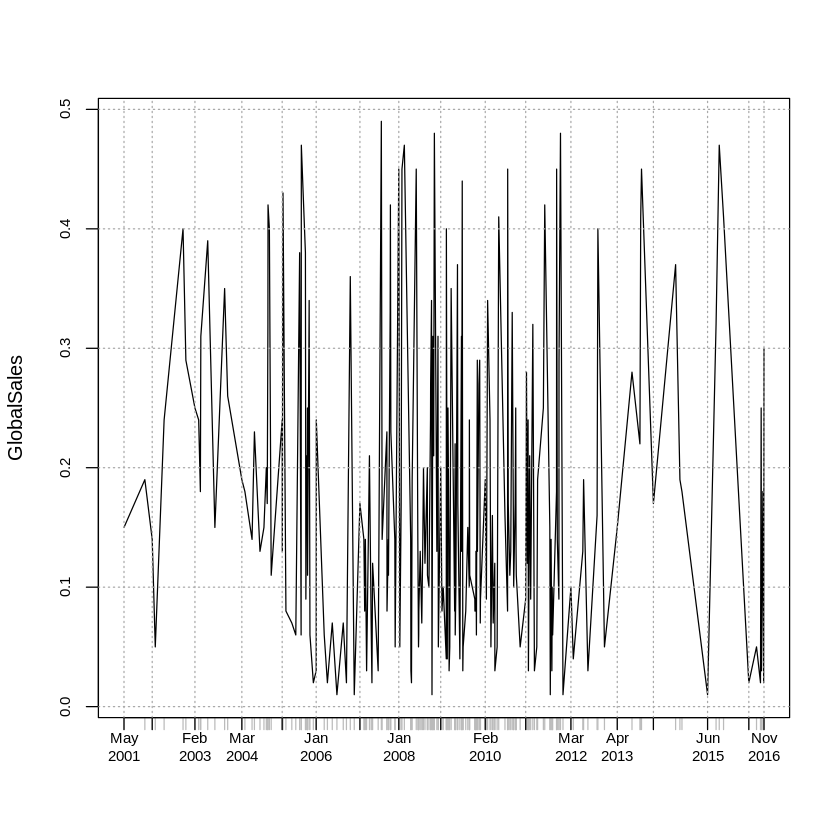

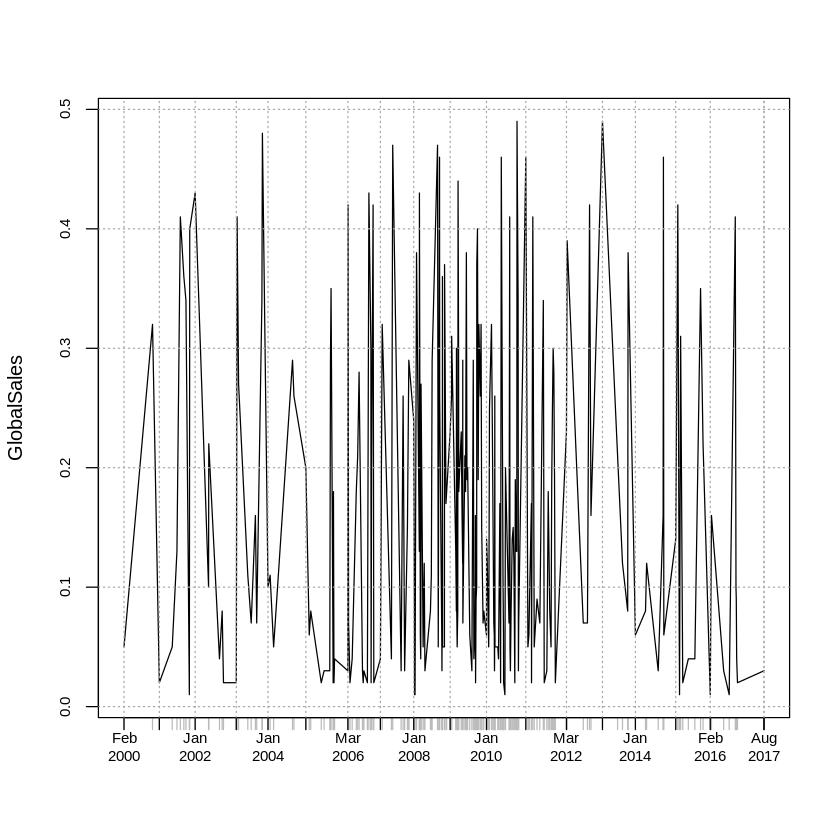

In [ ]:
# Plotting time series for different genres
genres <- c("Action", "Racing", "Platform", "Role-Playing", "Misc", "Simulation")
for (genre in genres) {
  plotTimeSeriesForGenre(TimeSeriesData, genre)
}